# Plotting Notebook
This notebook displays and manipulates the histograms produced by `make_plots.py`. <br>
Please use this is a guide to the type plots that you can create, as examples of the `hist`, `mplhep`, and other packages, as well as the use of the various functions that we have written in `plot_utils.py`. <br>
Use the the Table of Contents in Jupyter to view the different sections of the notebook to help navigating it.

In [1]:
%load_ext autoreload

In [2]:
%autoreload 1

In [12]:
import os, sys, glob
import pickle
import math
import multiprocessing
import itertools
import warnings
import json
import time
import numpy as np
from typing import Dict, List
from rich import print
from rich.pretty import pprint
from rich.console import Console
from rich.table import Table
from rich.progress import Progress, track
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib
import hist
from hist import Hist
import mplhep as hep
from tabulate import tabulate
import scipy
import uproot
import ROOT
import generic_utils
%aimport plot_utils
%aimport plot_utils_extras
%aimport fill_utils

In [10]:
warnings.filterwarnings('ignore')
matplotlib.rcParams.update({'figure.max_open_warning': 0})
matplotlib.rcParams['figure.facecolor'] = 'white'
hep.style.use("CMS")
np.set_printoptions(suppress=True)

In [4]:
print("The following output directories are available:")
!ls | grep output_histograms

The following output directories are available:

CR_cb_34mu_output_histograms
CR_cb_combine_output_histograms
CR_cb_output_histograms
CR_cb_postDYstudy_output_histograms
CR_light_postDYstudy_output_histograms
CR_prompt_34mu_leading_output_histograms
CR_prompt_34mu_output_histograms
CR_prompt_combine_output_histograms
CR_prompt_dimuon_output_histograms
CR_prompt_dystudy_output_histograms
CR_prompt_leading_output_histograms
CR_prompt_output_histograms
CR_prompt_postDYstudy_output_histograms
DYstudy_2_output_histograms
DYstudy_3_output_histograms
DYstudy_4_output_histograms
DYstudy_5_output_histograms
DYstudy_output_histograms
DYstudy_trigger_match_double_output_histograms
DYstudy_trigger_match_triple_output_histograms
DYstudy_trigger_one_path_output_histograms
nbjet_comparison_output_histograms
SR_combine_new_trigger_output_histograms
SR_combine_old_trigger_output_histograms
SR_combine_output_histograms
SR_extrapolation_new_output_histograms
SR_extrapolation_output_histograms
SR_postDYstudy_output_histograms
temp_output_histograms


## Load plots

In [13]:
plots = generic_utils.loader(tag="SR_extrapolation_new")

These are all the samples loaded.

In [15]:
keys = list(plots.keys())
pprint(keys)

[
│   'SUEP-m125-darkPho_2018',
│   'SUEP-m125-darkPhoHad_2018',
│   'SUEP-m400-darkPho_2018',
│   'SUEP-m400-darkPhoHad_2018',
│   'SUEP-m750-darkPho_2018',
│   'SUEP-m750-darkPhoHad_2018',
│   'SUEP-m1000-darkPho_2018',
│   'SUEP-m1000-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-2.8_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-5.6_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018',
│   'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
│   'GluGluToSUEP_mS125.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi1.400_T0.350_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi1.400_T1.400_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi1.400_T2.800_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi1.400_T5.600_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi2.000_T4.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi2.000_T8.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi4.000_T1.000_modehadronic_13TeV_2018',
│   'GluGluToSUEP_mS125.000_mPhi4.000_T4.000_

In [9]:
for key in plots['QCD_Pt_MuEnriched_2018'].keys():
    pprint(f"{key = }")

"key = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'"

In [10]:
from iminuit import Minuit
from iminuit.cost import LeastSquares
from jacobi import propagate

In [11]:
def muon_func_log(x, a, b):
    return a*x+b

def muon_func_lin(x, a, b):
    return 10**(a*x+b)

def muon_func_1(x, a, b, c):
    return a*10**(b*x)+c

def muon_func_2(x, a, b, c, d):
    return a*b**(x**c)+d

In [12]:
def custom_diff_metric(h_mc, y_pred):
    non_zeros = h_mc.values() > 0
    mc_vals = h_mc.values()[non_zeros]
    pred_vals = y_pred[non_zeros]
    return (abs(mc_vals - pred_vals) / mc_vals).sum()

def custom_diff_metric_2(h_mc, y_pred):
    non_zeros = h_mc.values() > 0
    mc_vals = h_mc.values()[non_zeros]
    pred_vals = y_pred[non_zeros]
    ratio1 = pred_vals / mc_vals
    ratio2 = mc_vals / pred_vals
    return ratio1[ratio1 >= 1].sum() + ratio2[ratio1 < 1].sum()

In [13]:
def muon_func(x, a, b):
    return 10**(a*x+b)

def fit_hist(h, bin_i=0, bin_f=None, verbose=False, nMuon_lim=7):
    if bin_f is None:
        bin_f = np.where(h.values() == 0)[0][0]
    data_x = h.axes[0].edges[bin_i:bin_f]
    #print()
    #print("Fitting range:", data_x)
    data_y = h.values()[bin_i:bin_f]
    data_yerr = np.sqrt(h.variances())[bin_i:bin_f]
    #print(
    #    f"MC tot yield: {h.values()[h.axes[0].edges[:-1] >= nMuon_lim].sum():.2f} ± " + 
    #    f"{np.sqrt((h.variances()[h.axes[0].edges[:-1] >= nMuon_lim]).sum()):.2f}"
    #)
    least_squares = LeastSquares(data_x, data_y, data_yerr, muon_func)
    m = Minuit(least_squares, a=-2, b=10)
    m.migrad()
    m.hesse()
    if verbose:
        print(m)
    x = np.arange(h.axes[0].edges[0], h.axes[0].edges[-1])
    y, ycov = propagate(lambda p: muon_func_lin(x, *p), m.values, m.covariance)
    yerr_prop = np.diag(ycov) ** 0.5
    red_chi2 = ""
    if m.ndof > 0:
        red_chi2 = f"({m.fval/m.ndof:.2f})"
    cust_metr = custom_diff_metric_2(h, y)
    print(
        f"Fit tot yield: {y[x >= nMuon_lim].sum():.2f} ± "
        f"{np.sqrt((yerr_prop[x >= nMuon_lim]**2).sum()):.2f} {red_chi2}, ({cust_metr:.2f})"
    )
    return x, y, yerr_prop

def draw_fit(x, y, yerr, label="fit"):
    x_min, x_max = x[0], x[-1]+2
    x_hatch = np.vstack(
        (np.arange(x_min, x_max-1), np.arange(x_min+1, x_max))
    ).reshape((-1,), order="F")
    y_hatch = np.vstack(
        (y, y)
    ).reshape((-1,), order="F")
    y_hatch_unc = np.vstack(
        (yerr, yerr)
    ).reshape((-1,), order="F")
    hep.histplot(y, bins=np.arange(x_min, x_max), label=label)
    plt.fill_between(
        x=x_hatch,
        y1=y_hatch - y_hatch_unc,
        y2=y_hatch + y_hatch_unc,
        step="pre",
        alpha=0.3,
        linewidth=0,
    )
    
def vary_nMuon(h, x0, y0, y0_err, nMuon_lim=7):
    print("Values:", np.round(h.values()))
    last_bin = np.arange(len(h.values()))[h.values() > 0][-1]
    
    print(
        f"MC tot yield: {h.values()[h.axes[0].edges[:-1] >= nMuon_lim].sum():.2f} ± " + 
        f"{np.sqrt((h.variances()[h.axes[0].edges[:-1] >= nMuon_lim]).sum()):.2f}"
    )
    
    sumwx = 0
    sumw = 0
    
    x, y, yerr = fit_hist(h, bin_i=0, bin_f=last_bin, nMuon_lim=nMuon_lim)
    draw_fit(x, y, yerr, label=f"(0, {last_bin})")
    
    #w = 1 / ((yerr[x >= nMuon_lim]**2).sum())
    #sumwx += w * y[x >= nMuon_lim].sum()
    #sumw += w
    
    x, y, yerr = fit_hist(h, bin_i=1, bin_f=last_bin, nMuon_lim=nMuon_lim)
    draw_fit(x, y, yerr, label=f"(1, {last_bin})")
    
    #w = 1 / ((yerr[x >= nMuon_lim]**2).sum())
    #sumwx += w * (y[x >= nMuon_lim].sum())
    #sumw += w
    
    x, y, yerr = fit_hist(h, bin_i=0, bin_f=(last_bin+1), nMuon_lim=nMuon_lim)
    draw_fit(x, y, yerr, label=f"(0, {last_bin+1})")
    
    w = 1 / ((yerr[x >= nMuon_lim]**2).sum())
    sumwx += w * y[x >= nMuon_lim].sum()
    sumw += w
    
    x, y, yerr = fit_hist(h, bin_i=1, bin_f=(last_bin+1), nMuon_lim=nMuon_lim)
    draw_fit(x, y, yerr, label=f"(1, {last_bin+1})")
    
    #w = 1 / ((yerr[x >= nMuon_lim]**2).sum())
    #sumwx += w * y[x >= nMuon_lim].sum()
    #sumw += w
    
    mult_factor = h[0:3:sum].value / y0[0:3].sum()
    draw_fit(x0, y0 * mult_factor, y0_err * mult_factor, label=f"fit 0")
    #print()
    print(
        f"Fit_0 tot yield: {y0[x0 >= nMuon_lim].sum() * mult_factor:.2f} ± " + 
        f"{np.sqrt((y0_err[x0 >= nMuon_lim]**2).sum()) * mult_factor:.2f}"
    )

    w = 1 / ((y0_err[x0 >= nMuon_lim]**2).sum())
    sumwx += w * y0[x0 >= nMuon_lim].sum()
    sumw += w

    print()
    print(f"Weighted av: {sumwx/sumw:.2f} ± {1/np.sqrt(sumw):.2f}")
    
    hep.histplot(h, label="MC", color="black")
    plt.legend()
    plt.yscale('log')
    plt.ylim(1e-2, None)
    plt.show()

In [14]:
h0 = plots['QCD_2018'][
    'lead_interiso_vs_muon_iso_cut_vs_nMuon'
][::sum, 99j, :]
x0, y0, y0_err = fit_hist(h0, bin_i=0, bin_f=4, verbose=False, nMuon_lim=7)

Fit tot yield: 35.33 ± 6.16 (1.92), (7.87)

In [24]:
np.set_printoptions(precision=3)

In [48]:
print(plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][1j::sum, 99j, :].values())
print(plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][1j::sum, 4j, :].values())

[165877.7356107  122047.74728543  10342.30054478     45.16468037
      5.42753812      0.              0.        ]

[117972.0178644   82375.9886553    3590.16316692      0.
      0.              0.              0.        ]

In [16]:
3590.16316692 / 10342.30054478

0.34713390423874685

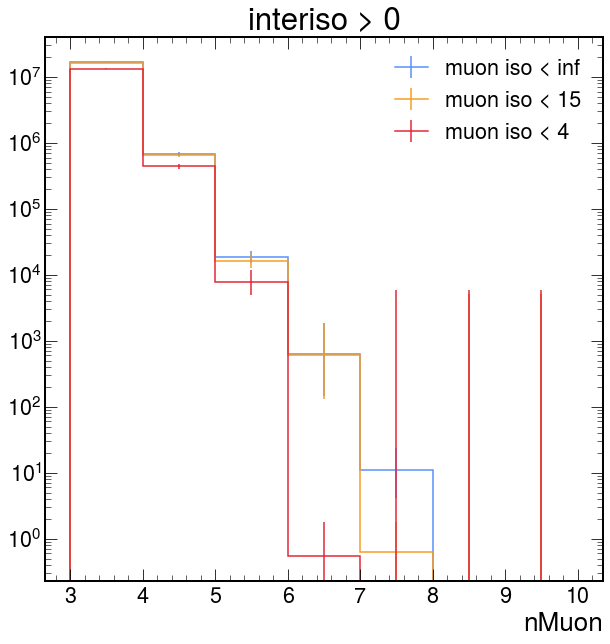

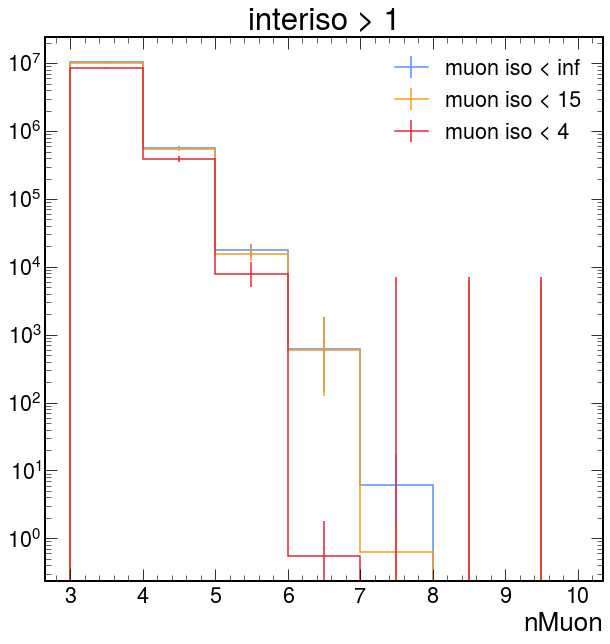

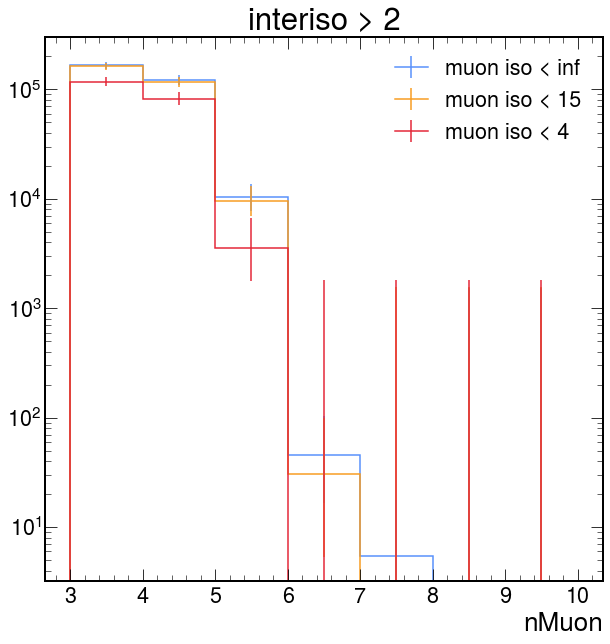

In [11]:
density = False
for interiso in [0, 1j, 2j]:
    for muon_iso in [99j, 15j, 4j]:
        h0 = plots['QCD_2018'][
            'lead_interiso_vs_muon_iso_cut_vs_nMuon'
        ][interiso::sum, muon_iso, :]
        h0.plot(label=f'muon iso < {muon_iso.imag:.0f}'.replace('99', 'inf'), density=density)
#     h0 = plots['QCD_2018'][
#         'lead_interiso_vs_muon_iso_cut_vs_nMuon'
#     ][interiso::sum, 99j, :] * 0.34713390423874685
#     h0.plot(label=f'muon iso < {muon_iso.imag:.0f} est.'.replace('99', 'inf'), density=density)
    plt.yscale('log')
    plt.title(f'interiso > {interiso.imag:.0f}')
    plt.legend()
    plt.show()

[0.01283736 0.05585188 0.18947788 0.88715888 0.66501219        nan
        nan]

[0.0181367  0.06548629 0.20167001 0.89960747 0.89181353        nan
        nan]

[0.07079578 0.09671431 0.25919784 0.69250128 0.99395486        nan
        nan]

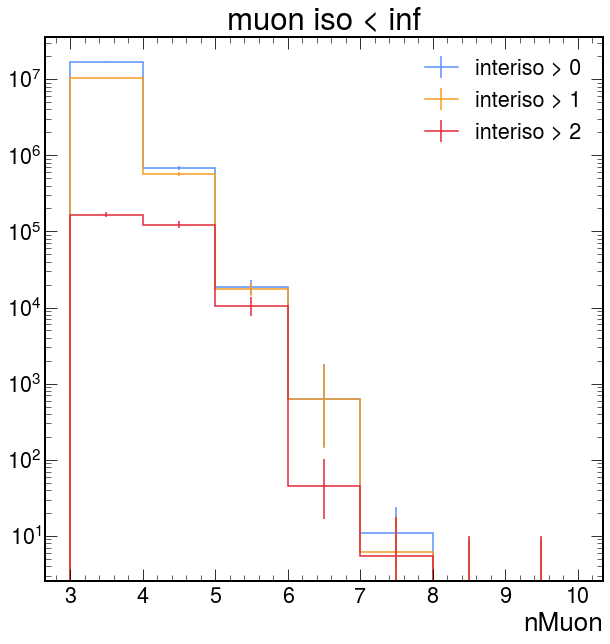

[0.01300001 0.05831972 0.21502534 0.91757906 0.863428          nan
        nan]

[0.01829326 0.0678164  0.22455626 0.93316201 0.8693981         nan
        nan]

[0.07242618 0.09992402 0.27766118 0.99595096        nan        nan
        nan]

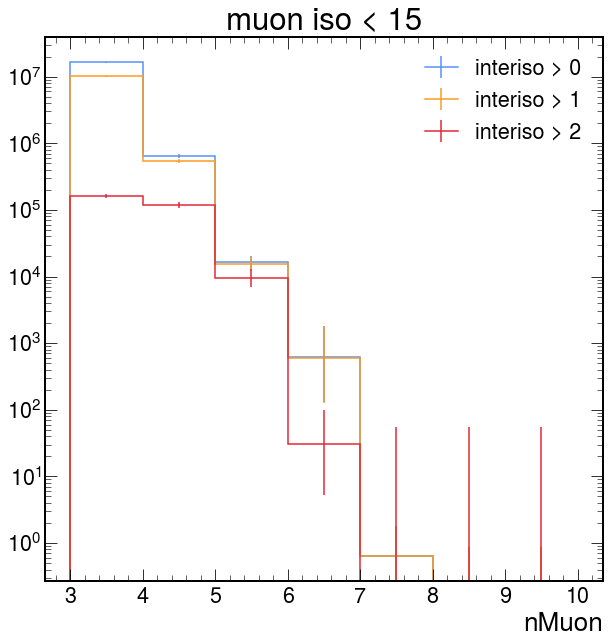

[0.0155688  0.08186891 0.37079244 0.9983977         nan        nan
        nan]

[0.02149928 0.0918763  0.37318376 0.9983977         nan        nan
        nan]

[0.09171374 0.13137972 0.53352157        nan        nan        nan
        nan]

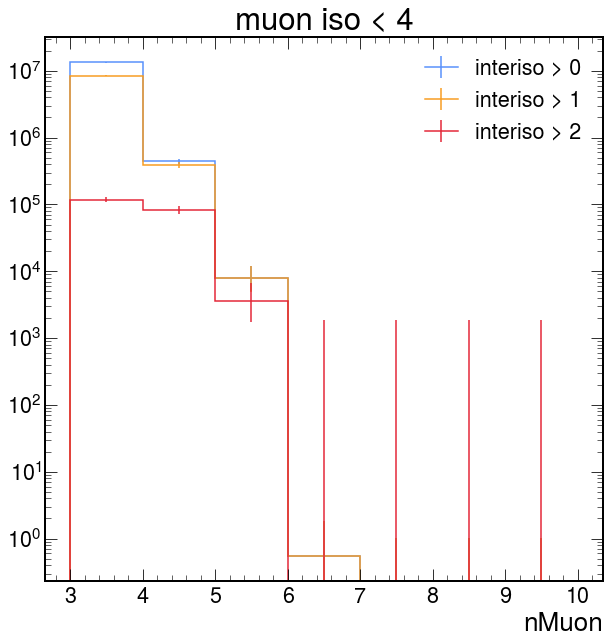

In [12]:
density = False
for muon_iso in [99j, 15j, 4j]:
    for interiso in [0, 1j, 2j]:
        h0 = plots['QCD_2018'][
            'lead_interiso_vs_muon_iso_cut_vs_nMuon'
        ][interiso::sum, muon_iso, :]
        h0.plot(label=f'interiso > {interiso.imag:.0f}', density=density)
        print(np.sqrt(h0.variances()) / h0.values())
    plt.title(f'muon iso < {muon_iso.imag:.0f}'.replace('99', 'inf'))
    plt.yscale('log')
    plt.legend()
    plt.show()

In [22]:
for muon_iso in [99j, 15j, 4j]:
    print(50*"–")
    print(f"Muon iso: {muon_iso}")
    for interiso in [0, 0.5j, 1j, 1.5j, 2j]:
        print(f"inter-iso: {interiso}")
        h0 = plots['QCD_2018'][
            'lead_interiso_vs_muon_iso_cut_vs_nMuon'
        ][interiso::sum, muon_iso, :]
        vary_nMuon(h0, x0, y0, y0_err, nMuon_lim=7)

––––––––––––––––––––––––––––––––––––––––––––––––––

Muon iso: 99j

inter-iso: 0

NameError: name 'vary_nMuon' is not defined

In [200]:
h0.axes[0].edges[:-1][h0.values() > 0]

array([3., 4., 5.])

2

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 8.755 (χ²/ndof = 4.4)      │              Nfcn = 116              │
│ EDM = 1.68e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.62   │   0.09    │            │            │         │         │       │
│ 1 │ b    │   11.6    │    0.4    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00806  -0.033 │
│ b │  -0.033   0.137 │
└───┴─────────────────┘

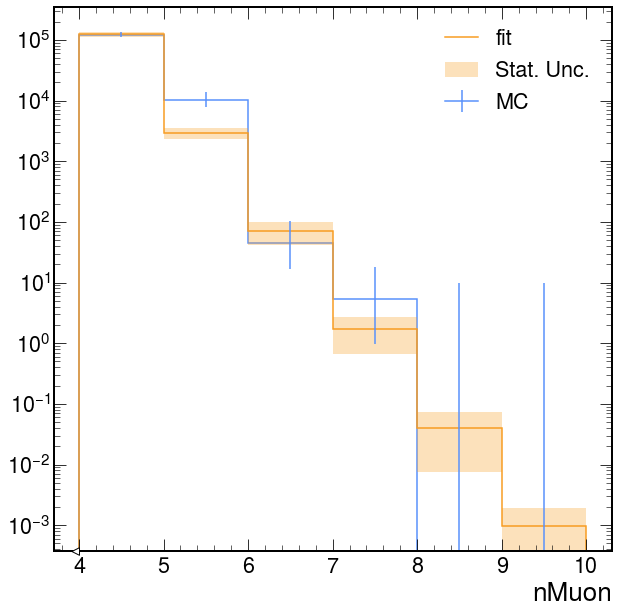

nMuon=5 | MC: 5.428 ± 5.395     | fit: 1.691 ± 1.977

nMuon=6 | MC: 0.000 ± 0.000     | fit: 0.040 ± 0.052

nMuon=7 | MC: 0.000 ± 0.000     | fit: 0.001 ± 0.001

In [30]:
h0 = plots['QCD_2018'][
    'lead_interiso_vs_muon_iso_cut_vs_nMuon'
][1j::sum, 49, 4j:]
first_zero_bin = np.where(h0.values() == 0)[0][0]
data_x = h0.axes[0].edges[:first_zero_bin]
data_y = h0.values()[:first_zero_bin]
data_yerr = np.sqrt(h0.variances())[:first_zero_bin]
least_squares = LeastSquares(data_x, data_y, data_yerr, muon_func_lin)
m = Minuit(least_squares, a=-2, b=10)
m.migrad()
m.hesse()
print(m)
x = np.arange(4,10)
y, ycov = propagate(lambda p: muon_func_lin(x, *p), m.values, m.covariance)
yerr_prop = np.diag(ycov) ** 0.5
x_hatch = np.vstack(
    (np.arange(4,10), np.arange(5,11))
).reshape((-1,), order="F")
y_hatch = np.vstack(
    (y, y)
).reshape((-1,), order="F")
y_hatch_unc = np.vstack(
    (yerr_prop, yerr_prop)
).reshape((-1,), order="F")
hep.histplot(h0, label="MC")
hep.histplot(y, bins=np.arange(4,11), label="fit")
plt.fill_between(
    x=x_hatch,
    y1=y_hatch - y_hatch_unc,
    y2=y_hatch + y_hatch_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="C1", 
    alpha=0.3,
    linewidth=0,
)
plt.legend()
plt.yscale('log')
plt.show()
for i in range(4-1, 7-1):
    mc_i, mcerr_i = 0, 0
    if i < 4:
        mc_i, mcerr_i = data_y[i], data_yerr[i]
    y_i, yerr_i = y[i], np.sqrt(y[i]**2 + yerr_prop[i]**2)
    print(f"nMuon={i+2}\t| MC: {mc_i:.3f} ± {mcerr_i:.3f}\t| fit: {y_i:.3f} ± {yerr_i:.3f}")

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 92.02 (χ²/ndof = 30.7)     │              Nfcn = 134              │
│ EDM = 2.96e-09 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │  -1.690   │   0.016   │            │            │         │         │       │
│ 1 │ b    │   12.29   │   0.05    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────────┐
│   │        a        b │
├───┼───────────────────┤
│ a │ 0.000247 -0.75e-3 │
│ b │ -0.75e-3  0.00231 │
└───┴───────────────────┘

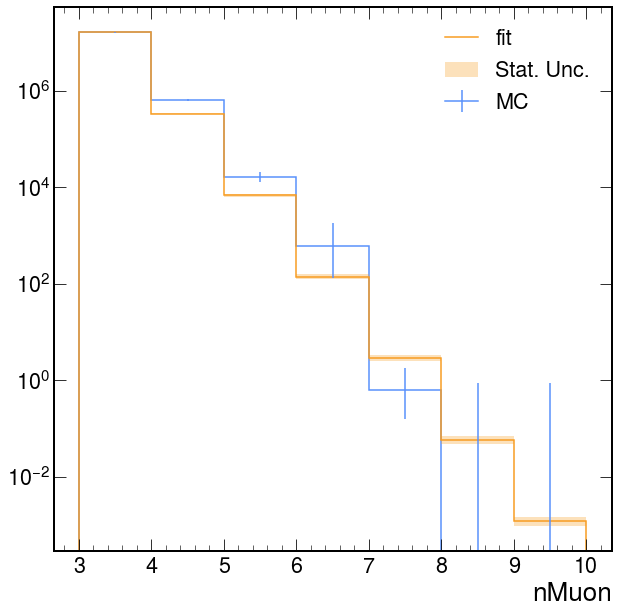

nMuon=7 | MC: 0.641 ± 0.554     | fit: 2.886 ± 2.915

nMuon=8 | MC: 0.000 ± 0.000     | fit: 0.059 ± 0.060

nMuon=9 | MC: 0.000 ± 0.000     | fit: 0.001 ± 0.001

In [24]:
h0 = plots['QCD_2018'][
    'lead_interiso_vs_muon_iso_cut_vs_nMuon'
][::sum, 15j, :]
first_zero_bin = np.where(h0.values() == 0)[0][0]
data_x = h0.axes[0].edges[:first_zero_bin]
data_y = h0.values()[:first_zero_bin]
data_yerr = np.sqrt(h0.variances())[:first_zero_bin]
least_squares = LeastSquares(data_x, data_y, data_yerr, muon_func_lin)
m = Minuit(least_squares, a=-2, b=10)
m.migrad()
m.hesse()
print(m)
x = np.arange(3,10)
y, ycov = propagate(lambda p: muon_func_lin(x, *p), m.values, m.covariance)
yerr_prop = np.diag(ycov) ** 0.5
x_hatch = np.vstack(
    (np.arange(3,10), np.arange(4,11))
).reshape((-1,), order="F")
y_hatch = np.vstack(
    (y, y)
).reshape((-1,), order="F")
y_hatch_unc = np.vstack(
    (yerr_prop, yerr_prop)
).reshape((-1,), order="F")
hep.histplot(h0, label="MC")
hep.histplot(y, bins=np.arange(3,11), label="fit")
plt.fill_between(
    x=x_hatch,
    y1=y_hatch - y_hatch_unc,
    y2=y_hatch + y_hatch_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="C1", 
    alpha=0.3,
    linewidth=0,
)
plt.legend()
plt.yscale('log')
plt.show()
for i in range(4, 7):
    mc_i, mcerr_i = 0, 0
    if i < 5:
        mc_i, mcerr_i = data_y[i], data_yerr[i]
    y_i, yerr_i = y[i], np.sqrt(y[i]**2 + yerr_prop[i]**2)
    print(f"nMuon={i+3}\t| MC: {mc_i:.3f} ± {mcerr_i:.3f}\t| fit: {y_i:.3f} ± {yerr_i:.3f}")

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 118.6 (χ²/ndof = 59.3)     │              Nfcn = 198              │
│ EDM = 5.21e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.04    │            │            │         │         │       │
│ 1 │ b    │   14.02   │   0.12    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00149 -0.0045 │
│ b │ -0.0045  0.0136 │
└───┴─────────────────┘

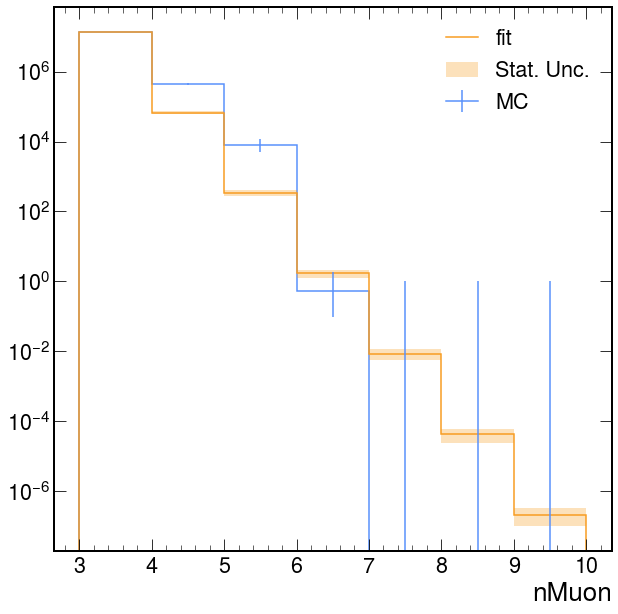

nMuon=7 | MC: 0.000 ± 0.000     | fit: 0.009 ± 0.009

nMuon=8 | MC: 0.000 ± 0.000     | fit: 0.000 ± 0.000

nMuon=9 | MC: 0.000 ± 0.000     | fit: 0.000 ± 0.000

In [26]:
h0 = plots['QCD_2018'][
    'lead_interiso_vs_muon_iso_cut_vs_nMuon'
][::sum, 4j, :]
first_zero_bin = np.where(h0.values() == 0)[0][0]
data_x = h0.axes[0].edges[:first_zero_bin]
data_y = h0.values()[:first_zero_bin]
data_yerr = np.sqrt(h0.variances())[:first_zero_bin]
least_squares = LeastSquares(data_x, data_y, data_yerr, muon_func_lin)
m = Minuit(least_squares, a=-2, b=10)
m.migrad()
m.hesse()
print(m)
x = np.arange(3,10)
y, ycov = propagate(lambda p: muon_func_lin(x, *p), m.values, m.covariance)
yerr_prop = np.diag(ycov) ** 0.5
x_hatch = np.vstack(
    (np.arange(3,10), np.arange(4,11))
).reshape((-1,), order="F")
y_hatch = np.vstack(
    (y, y)
).reshape((-1,), order="F")
y_hatch_unc = np.vstack(
    (yerr_prop, yerr_prop)
).reshape((-1,), order="F")
hep.histplot(h0, label="MC")
hep.histplot(y, bins=np.arange(3,11), label="fit")
plt.fill_between(
    x=x_hatch,
    y1=y_hatch - y_hatch_unc,
    y2=y_hatch + y_hatch_unc,
    label="Stat. Unc.",
    step="pre",
    facecolor="C1", 
    alpha=0.3,
    linewidth=0,
)
plt.legend()
plt.yscale('log')
plt.show()
for i in range(4, 7):
    mc_i, mcerr_i = 0, 0
    if i < 4:
        mc_i, mcerr_i = data_y[i], data_yerr[i]
    y_i, yerr_i = y[i], np.sqrt(y[i]**2 + yerr_prop[i]**2)
    print(f"nMuon={i+3}\t| MC: {mc_i:.3f} ± {mcerr_i:.3f}\t| fit: {y_i:.3f} ± {yerr_i:.3f}")

In [32]:
from scipy.stats import chi2, norm

In [22]:
scale = h0.variances() / h0.values()
scale[np.isnan(scale)] = scale[-3]
counts = h0.values() / scale
coverage = scipy.stats.norm.cdf(1) - scipy.stats.norm.cdf(-1)

In [35]:
scale * chi2.ppf((1 + coverage) / 2, 2 * (counts + 1)) / 2.0

array([16858198.08777762,   717889.05909487,    23056.33820812,
           1833.03912671,       24.10502344,        8.93324682,
              8.93324682])

In [17]:
h0[-1]

WeightedSum(value=0, variance=0)

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.1796 (χ²/ndof = 0.1)     │              Nfcn = 124              │
│ EDM = 5.61e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.57   │   0.06    │            │            │         │         │       │
│ 1 │ b    │   12.13   │   0.24    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │  0.0034 -0.0140 │
│ b │ -0.0140  0.0579 │
└───┴─────────────────┘

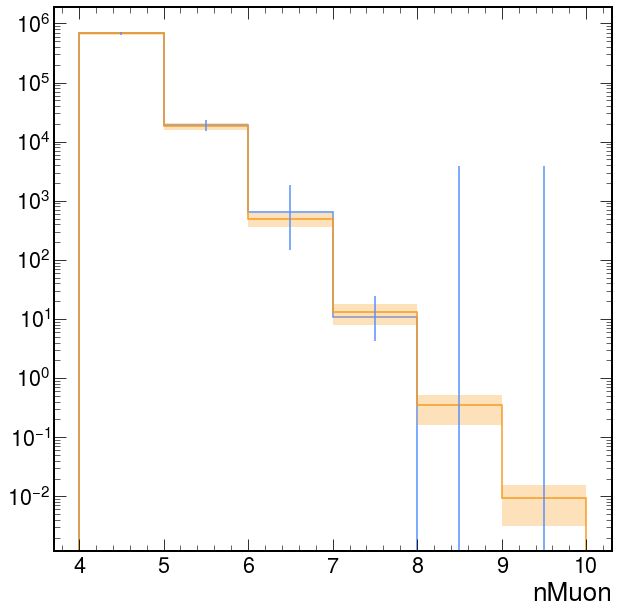

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.468 (χ²/ndof = 0.7)      │              Nfcn = 118              │
│ EDM = 2.6e-06 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.58   │   0.06    │            │            │         │         │       │
│ 1 │ b    │   12.04   │   0.25    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00358  -0.015 │
│ b │  -0.015  0.0615 │
└───┴─────────────────┘

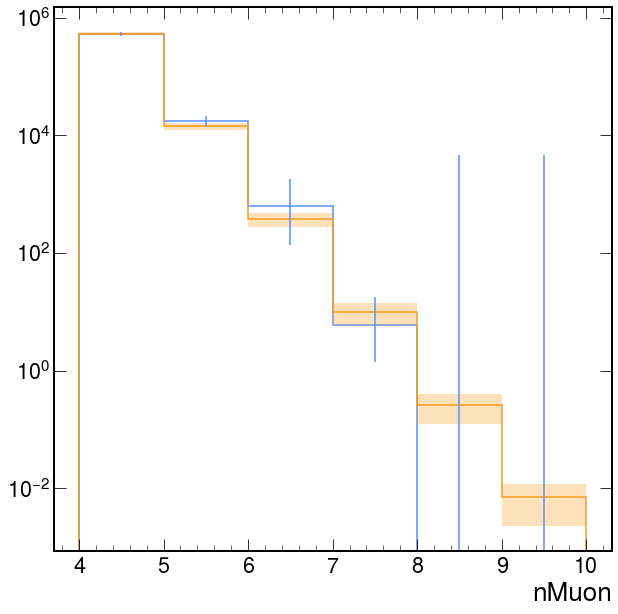

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.768 (χ²/ndof = 0.9)      │              Nfcn = 105              │
│ EDM = 4.01e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.56   │   0.06    │            │            │         │         │       │
│ 1 │ b    │   11.94   │   0.25    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00356  -0.015 │
│ b │  -0.015  0.0615 │
└───┴─────────────────┘

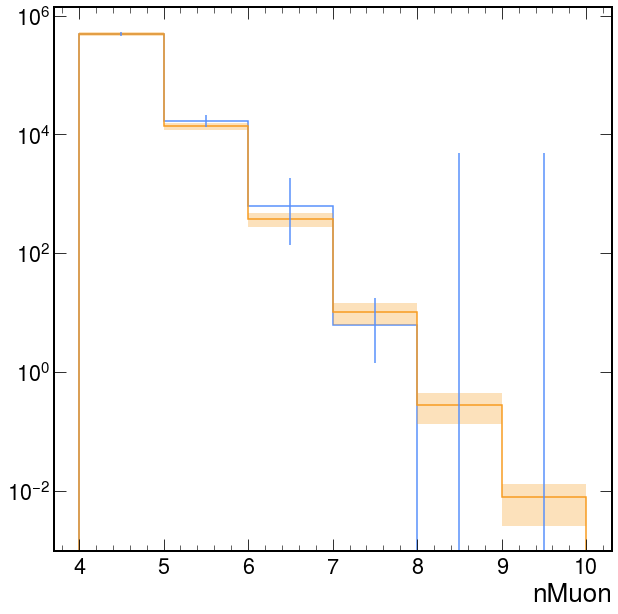

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.06 (χ²/ndof = 1.0)       │              Nfcn = 109              │
│ EDM = 0.000104 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.55   │   0.06    │            │            │         │         │       │
│ 1 │ b    │   11.85   │   0.25    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00354 -0.0147 │
│ b │ -0.0147  0.0617 │
└───┴─────────────────┘

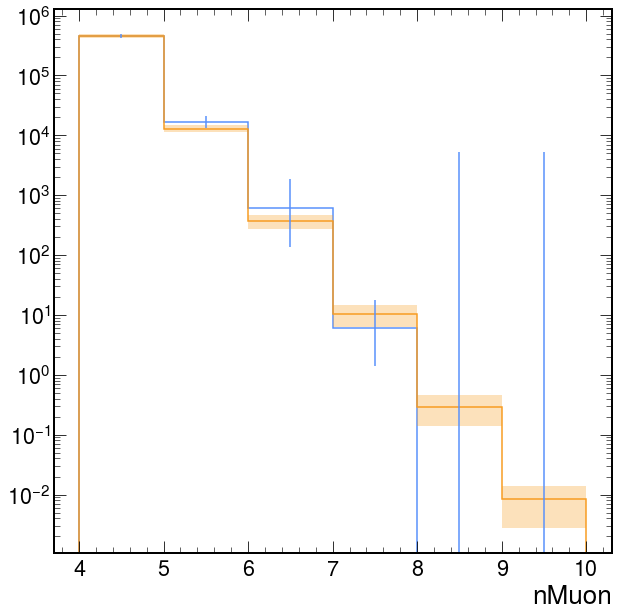

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.601 (χ²/ndof = 1.3)      │              Nfcn = 115              │
│ EDM = 1.28e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.53   │   0.06    │            │            │         │         │       │
│ 1 │ b    │   11.72   │   0.25    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00357  -0.015 │
│ b │  -0.015  0.0629 │
└───┴─────────────────┘

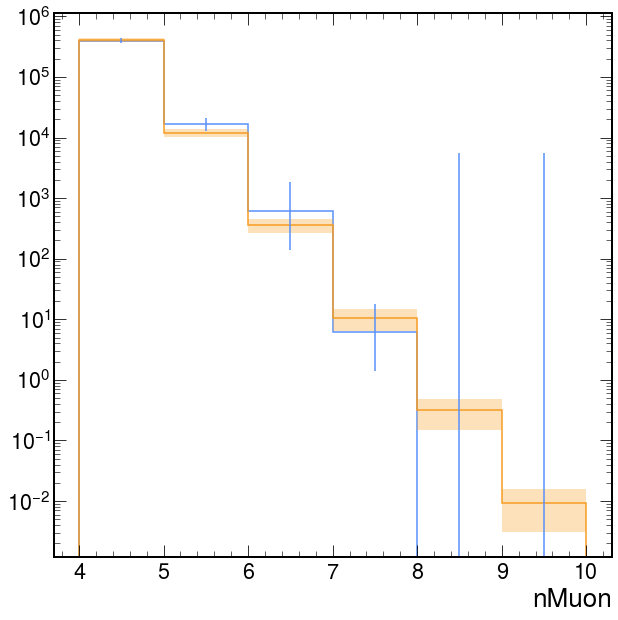

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 10.5 (χ²/ndof = 5.2)       │              Nfcn = 118              │
│ EDM = 7.12e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.80   │   0.08    │            │            │         │         │       │
│ 1 │ b    │   12.70   │   0.31    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00573  -0.023 │
│ b │  -0.023  0.0967 │
└───┴─────────────────┘

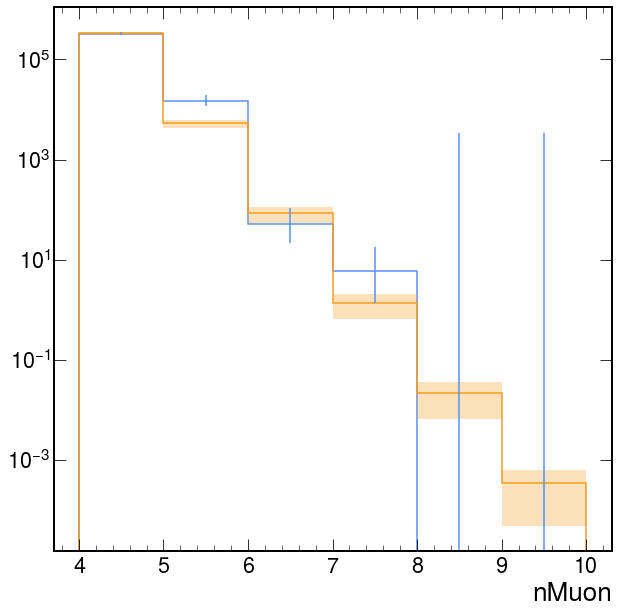

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 10.37 (χ²/ndof = 5.2)      │              Nfcn = 137              │
│ EDM = 5.19e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.79   │   0.08    │            │            │         │         │       │
│ 1 │ b    │   12.62   │   0.33    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00656  -0.027 │
│ b │  -0.027   0.111 │
└───┴─────────────────┘

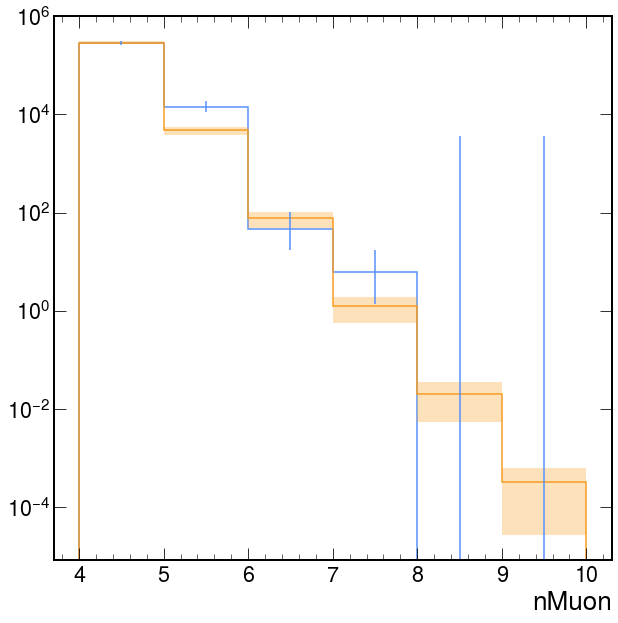

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 9.365 (χ²/ndof = 4.7)      │              Nfcn = 143              │
│ EDM = 1.46e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.76   │   0.08    │            │            │         │         │       │
│ 1 │ b    │   12.44   │   0.34    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00681  -0.028 │
│ b │  -0.028   0.117 │
└───┴─────────────────┘

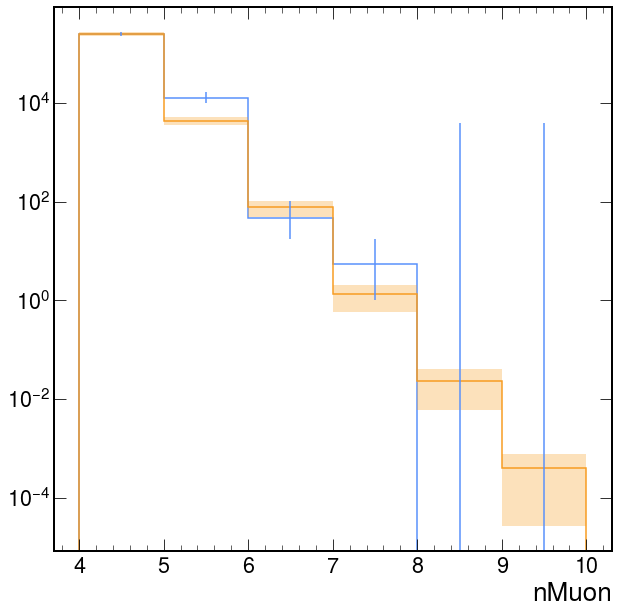

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 9.783 (χ²/ndof = 4.9)      │              Nfcn = 94               │
│ EDM = 2.69e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.71   │   0.08    │            │            │         │         │       │
│ 1 │ b    │   12.13   │   0.34    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00714  -0.029 │
│ b │  -0.029   0.119 │
└───┴─────────────────┘

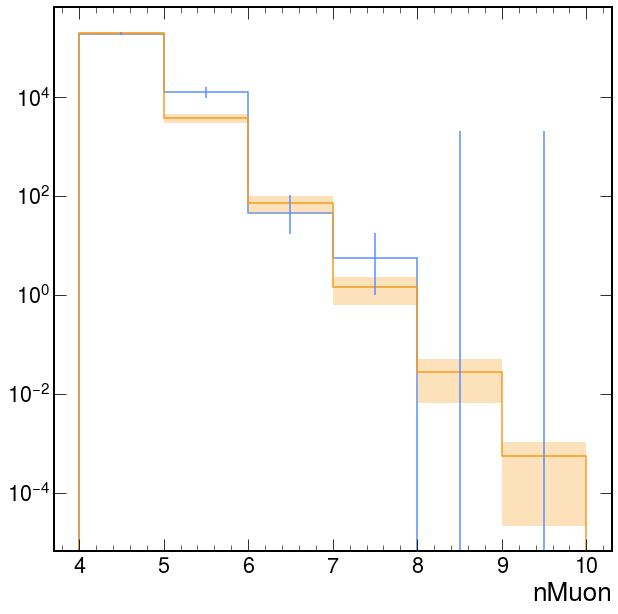

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 10.13 (χ²/ndof = 5.1)      │              Nfcn = 109              │
│ EDM = 9.33e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.67   │   0.09    │            │            │         │         │       │
│ 1 │ b    │   11.9    │    0.4    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0076 -0.031 │
│ b │ -0.031  0.128 │
└───┴───────────────┘

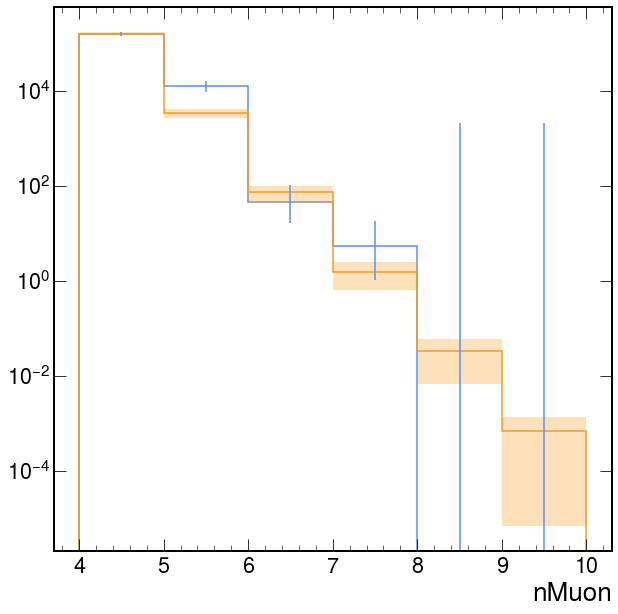

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 8.755 (χ²/ndof = 4.4)      │              Nfcn = 116              │
│ EDM = 1.68e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.62   │   0.09    │            │            │         │         │       │
│ 1 │ b    │   11.6    │    0.4    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00806  -0.033 │
│ b │  -0.033   0.137 │
└───┴─────────────────┘

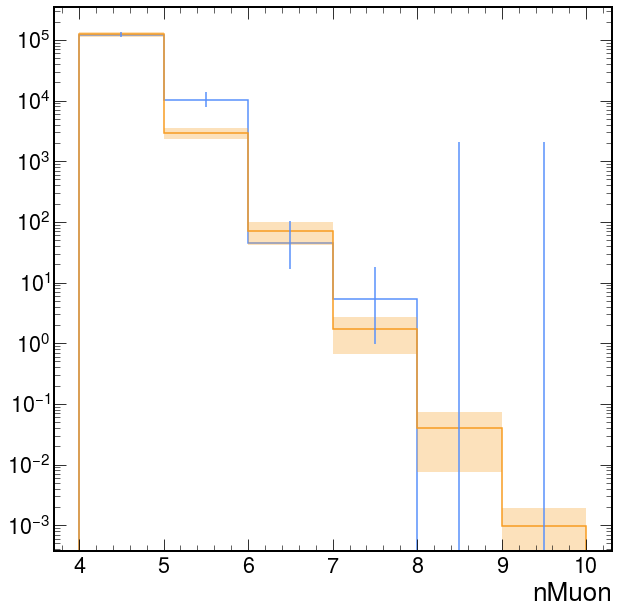

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 13.31 (χ²/ndof = 6.7)      │              Nfcn = 139              │
│ EDM = 1.47e-08 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.09   │   0.08    │            │            │         │         │       │
│ 1 │ b    │   13.23   │   0.33    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00634  -0.026 │
│ b │  -0.026    0.11 │
└───┴─────────────────┘

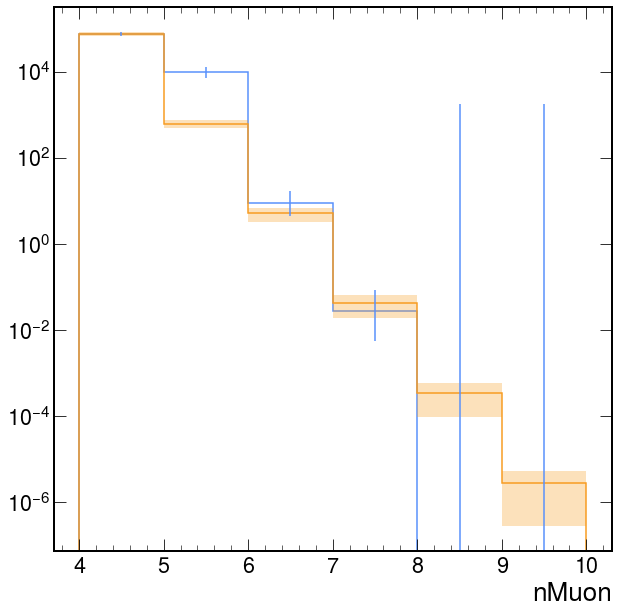

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 13.32 (χ²/ndof = 6.7)      │              Nfcn = 97               │
│ EDM = 1.51e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.05   │   0.08    │            │            │         │         │       │
│ 1 │ b    │   13.0    │    0.4    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0071 -0.029 │
│ b │ -0.029  0.126 │
└───┴───────────────┘

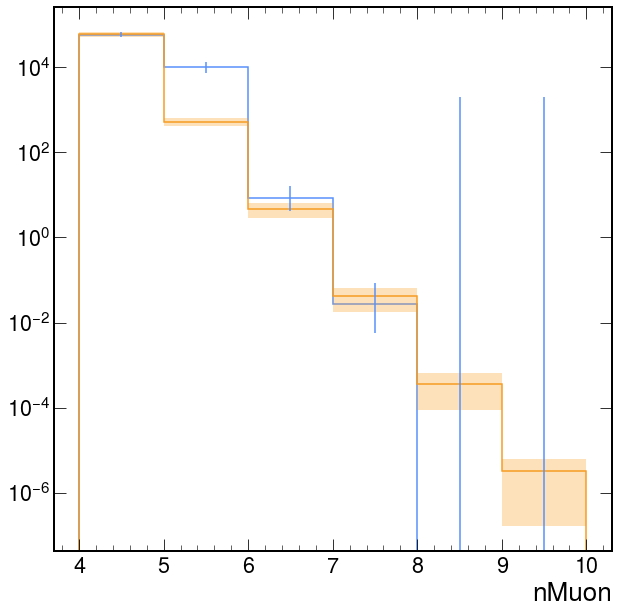

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 10.33 (χ²/ndof = 5.2)      │              Nfcn = 144              │
│ EDM = 9.69e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.00   │   0.09    │            │            │         │         │       │
│ 1 │ b    │   12.6    │    0.4    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0085 -0.036 │
│ b │ -0.036  0.156 │
└───┴───────────────┘

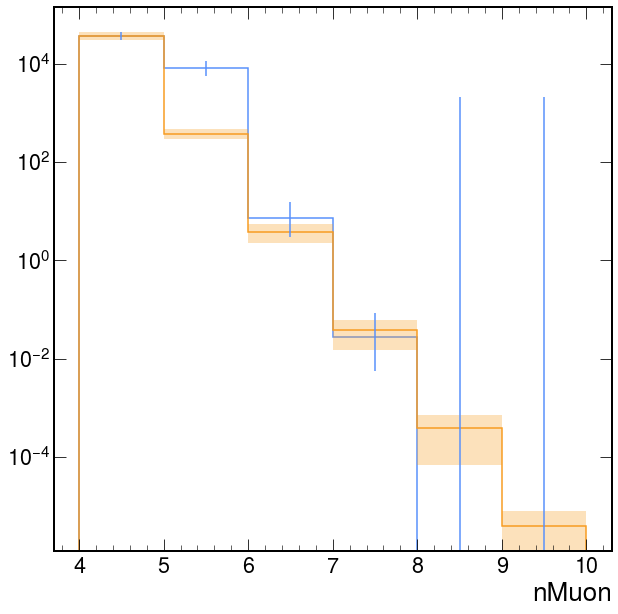

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 8.239 (χ²/ndof = 4.1)      │              Nfcn = 138              │
│ EDM = 1.36e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.96   │   0.10    │            │            │         │         │       │
│ 1 │ b    │   12.3    │    0.4    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────┐
│   │       a       b │
├───┼─────────────────┤
│ a │ 0.00914  -0.039 │
│ b │  -0.039   0.171 │
└───┴─────────────────┘

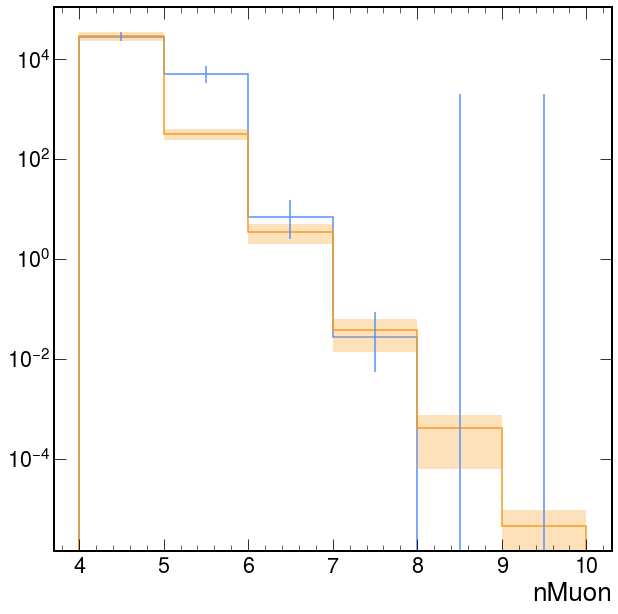

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 7.719 (χ²/ndof = 3.9)      │              Nfcn = 106              │
│ EDM = 9.84e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.87   │   0.10    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.5    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0105 -0.046 │
│ b │ -0.046   0.21 │
└───┴───────────────┘

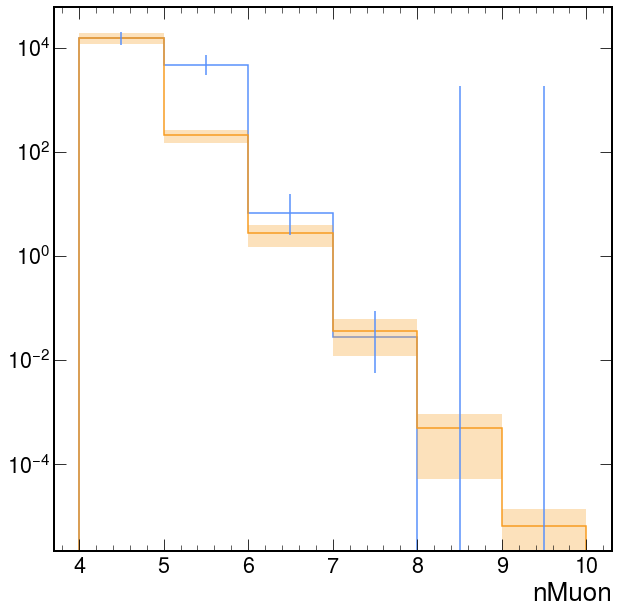

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 6.183 (χ²/ndof = 3.1)      │              Nfcn = 109              │
│ EDM = 5.13e-08 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.75   │   0.11    │            │            │         │         │       │
│ 1 │ b    │   10.8    │    0.5    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0122 -0.053 │
│ b │ -0.053  0.241 │
└───┴───────────────┘

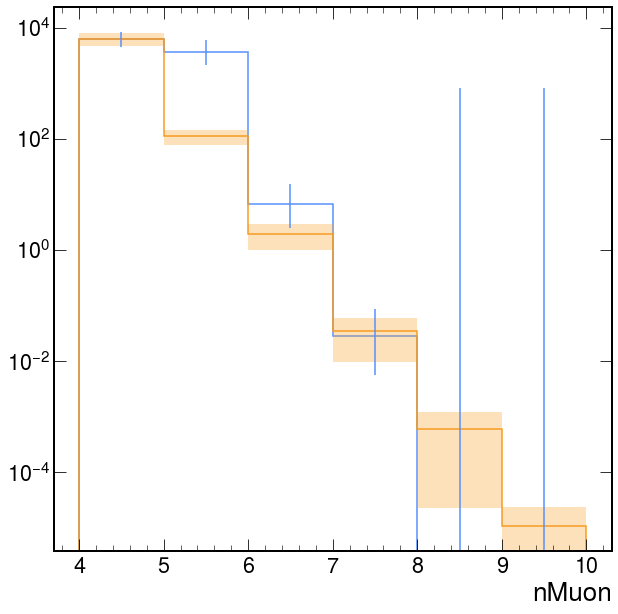

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 5.733 (χ²/ndof = 2.9)      │              Nfcn = 85               │
│ EDM = 2.41e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.70   │   0.11    │            │            │         │         │       │
│ 1 │ b    │   10.4    │    0.5    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0128 -0.055 │
│ b │ -0.055  0.247 │
└───┴───────────────┘

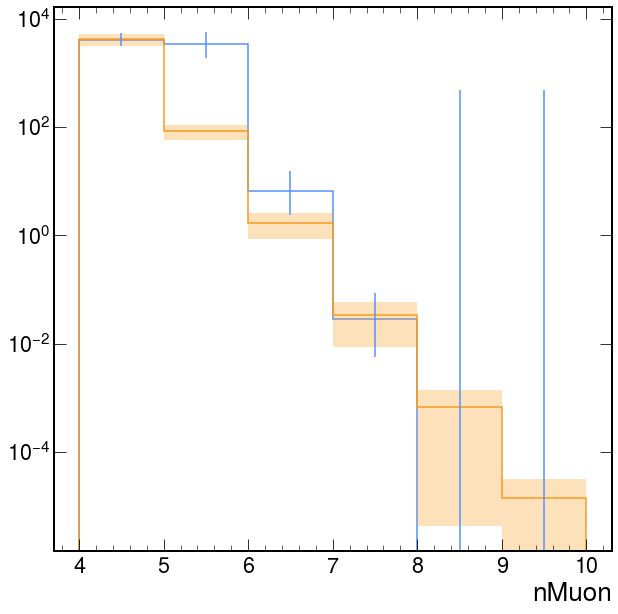

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.902 (χ²/ndof = 2.0)      │              Nfcn = 70               │
│ EDM = 8.67e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.67   │   0.12    │            │            │         │         │       │
│ 1 │ b    │   10.2    │    0.5    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0133 -0.057 │
│ b │ -0.057  0.259 │
└───┴───────────────┘

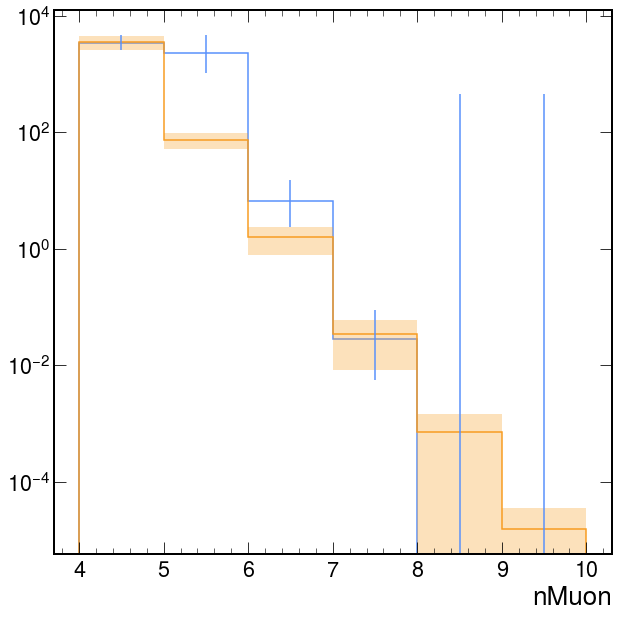

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.328 (χ²/ndof = 1.7)      │              Nfcn = 77               │
│ EDM = 1.92e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.67   │   0.12    │            │            │         │         │       │
│ 1 │ b    │   10.2    │    0.5    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0139 -0.060 │
│ b │ -0.060  0.273 │
└───┴───────────────┘

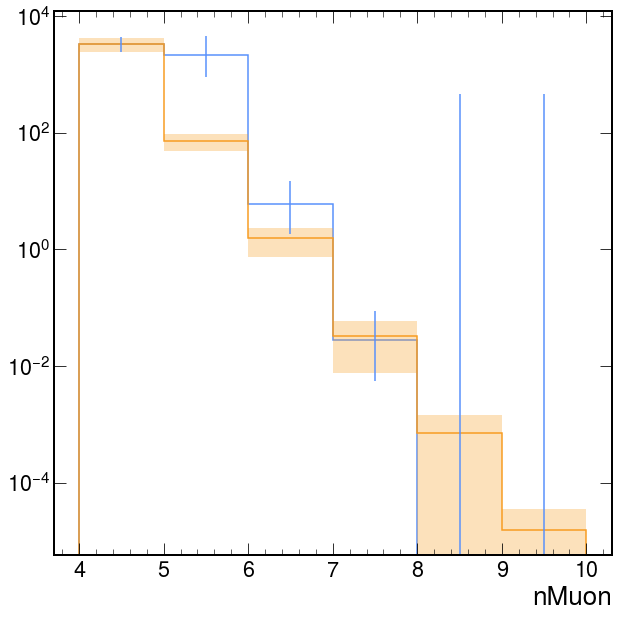

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.139 (χ²/ndof = 1.1)      │              Nfcn = 77               │
│ EDM = 8.52e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.63   │   0.12    │            │            │         │         │       │
│ 1 │ b    │    9.9    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0152 -0.067 │
│ b │ -0.067  0.309 │
└───┴───────────────┘

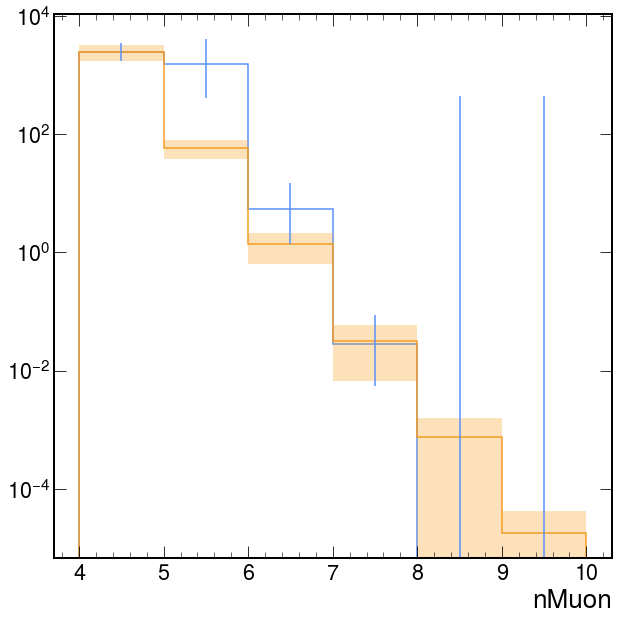

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.47 (χ²/ndof = 1.2)       │              Nfcn = 74               │
│ EDM = 1.45e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.62   │   0.11    │            │            │         │         │       │
│ 1 │ b    │    9.9    │    0.5    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0125 -0.055 │
│ b │ -0.055  0.261 │
└───┴───────────────┘

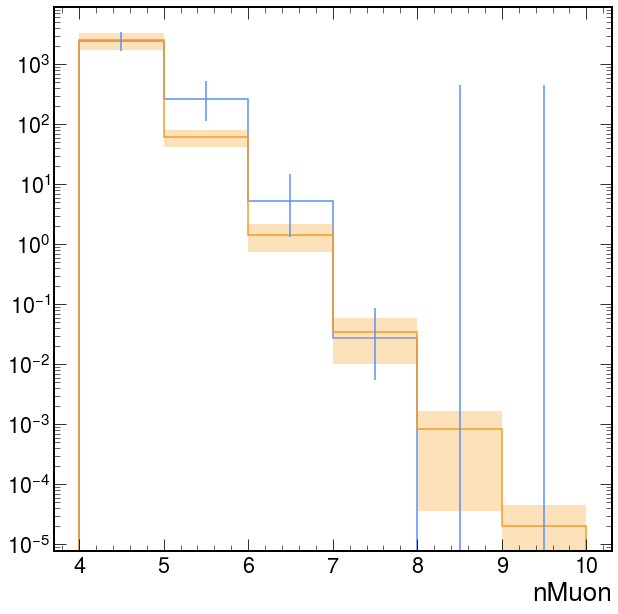

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.279 (χ²/ndof = 1.1)      │              Nfcn = 77               │
│ EDM = 4.06e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.62   │   0.11    │            │            │         │         │       │
│ 1 │ b    │    9.8    │    0.5    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │  0.013 -0.058 │
│ b │ -0.058  0.274 │
└───┴───────────────┘

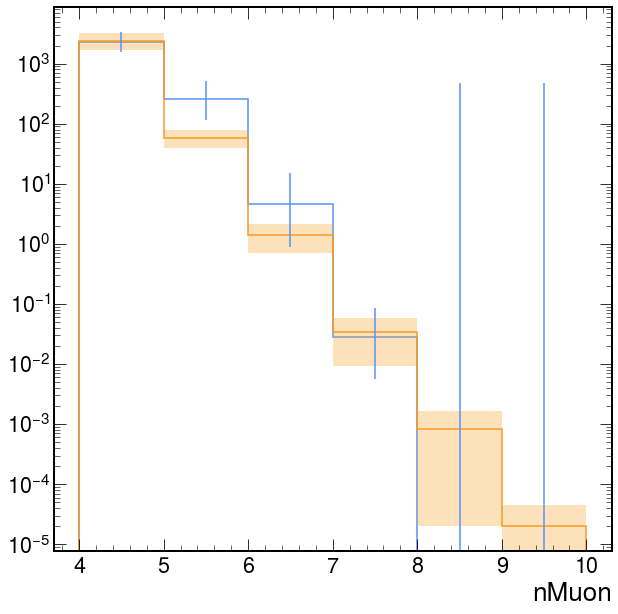

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.294 (χ²/ndof = 1.6)      │              Nfcn = 105              │
│ EDM = 3.71e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.10   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0278 -0.123 │
│ b │ -0.123  0.564 │
└───┴───────────────┘

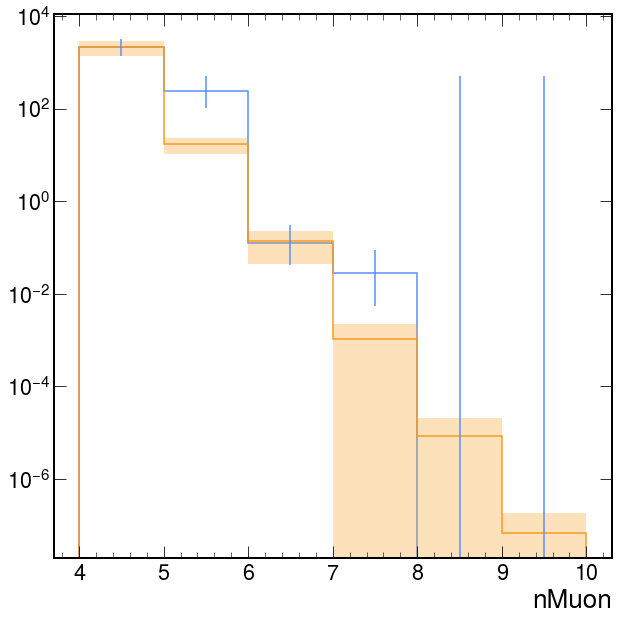

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.281 (χ²/ndof = 1.6)      │              Nfcn = 85               │
│ EDM = 6.22e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.08   │   0.20    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0382  -0.17 │
│ b │  -0.17  0.735 │
└───┴───────────────┘

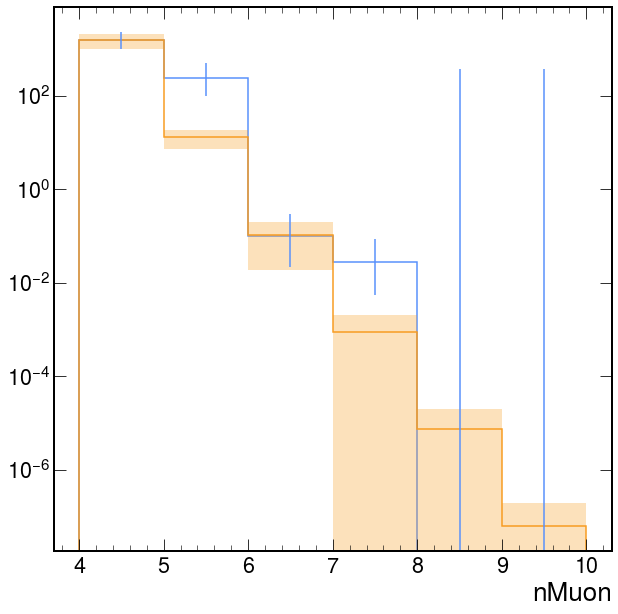

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.539 (χ²/ndof = 1.8)      │              Nfcn = 120              │
│ EDM = 7.22e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.53   │   0.13    │            │            │         │         │       │
│ 1 │ b    │   13.1    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0159 -0.069 │
│ b │ -0.069  0.305 │
└───┴───────────────┘

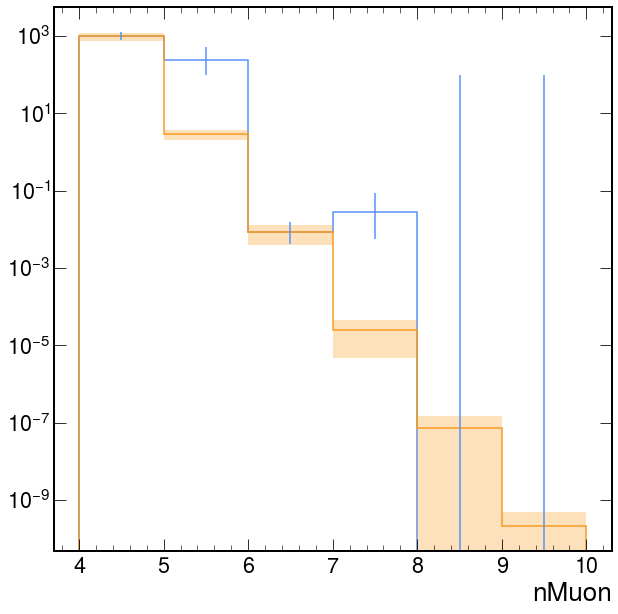

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.449 (χ²/ndof = 2.4)      │              Nfcn = 104              │
│ EDM = 3.45e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.67   │   0.18    │            │            │         │         │       │
│ 1 │ b    │   13.6    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0327 -0.136 │
│ b │ -0.136  0.578 │
└───┴───────────────┘

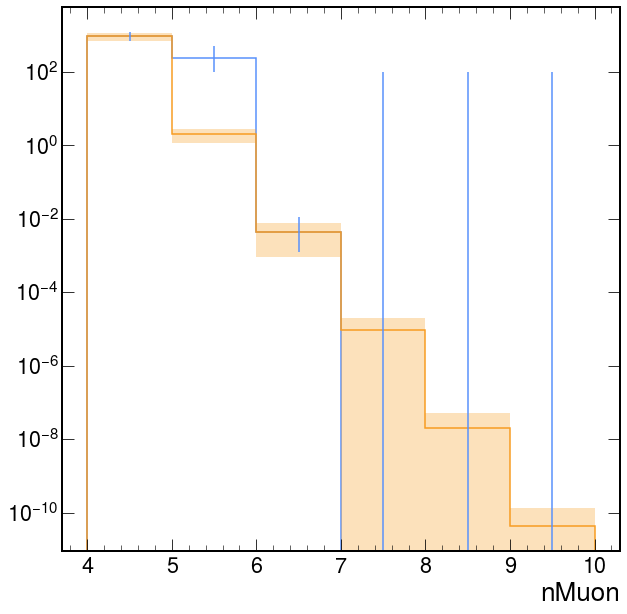

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.451 (χ²/ndof = 2.5)      │              Nfcn = 112              │
│ EDM = 2.24e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.64   │   0.18    │            │            │         │         │       │
│ 1 │ b    │   13.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0332 -0.139 │
│ b │ -0.139  0.591 │
└───┴───────────────┘

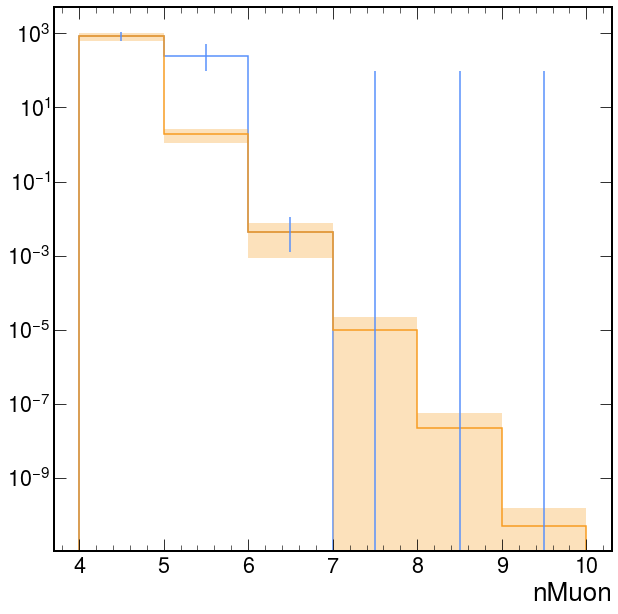

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.452 (χ²/ndof = 2.5)      │              Nfcn = 93               │
│ EDM = 2.65e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.63   │   0.18    │            │            │         │         │       │
│ 1 │ b    │   13.4    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0333 -0.140 │
│ b │ -0.140    0.6 │
└───┴───────────────┘

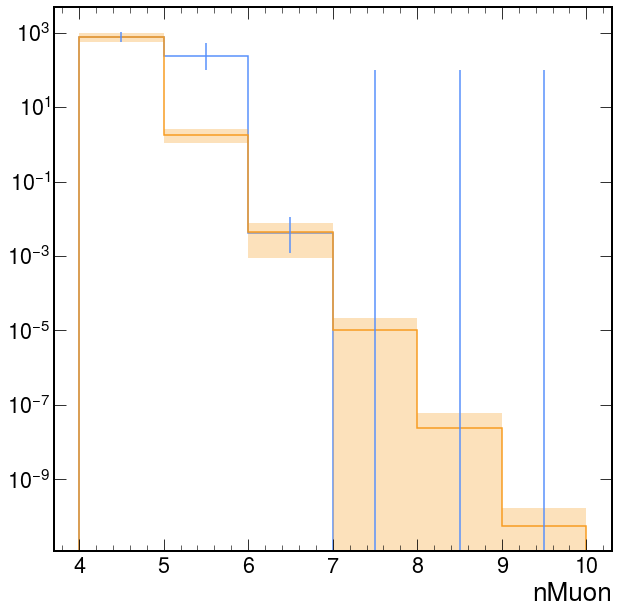

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.452 (χ²/ndof = 2.5)      │              Nfcn = 97               │
│ EDM = 3.85e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.63   │   0.18    │            │            │         │         │       │
│ 1 │ b    │   13.4    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0336 -0.141 │
│ b │ -0.141  0.604 │
└───┴───────────────┘

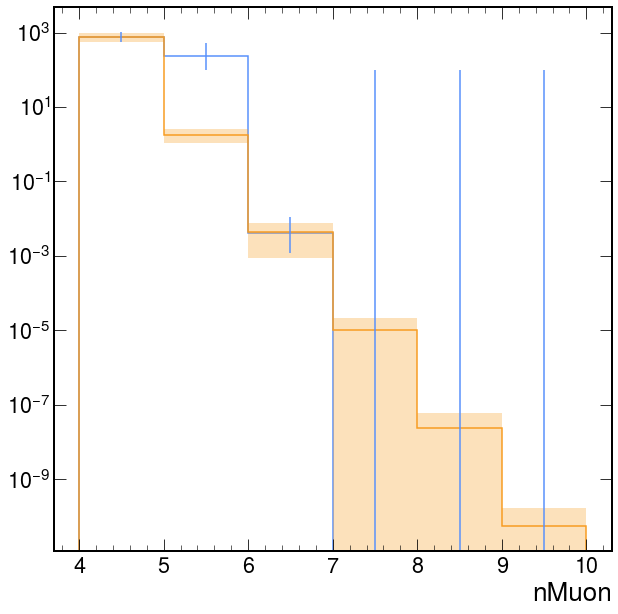

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.347 (χ²/ndof = 2.3)      │              Nfcn = 106              │
│ EDM = 2.99e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.62   │   0.18    │            │            │         │         │       │
│ 1 │ b    │   13.4    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0335 -0.141 │
│ b │ -0.141  0.604 │
└───┴───────────────┘

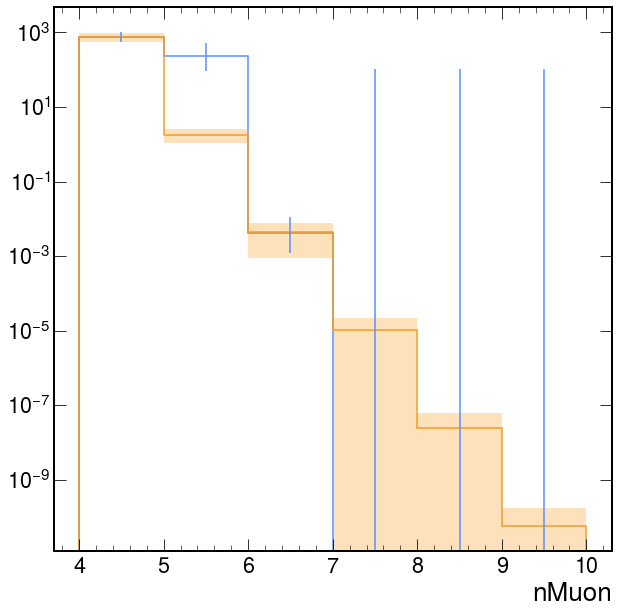

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.353 (χ²/ndof = 1.4)      │              Nfcn = 95               │
│ EDM = 3.27e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.62   │   0.18    │            │            │         │         │       │
│ 1 │ b    │   13.4    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0337 -0.142 │
│ b │ -0.142  0.611 │
└───┴───────────────┘

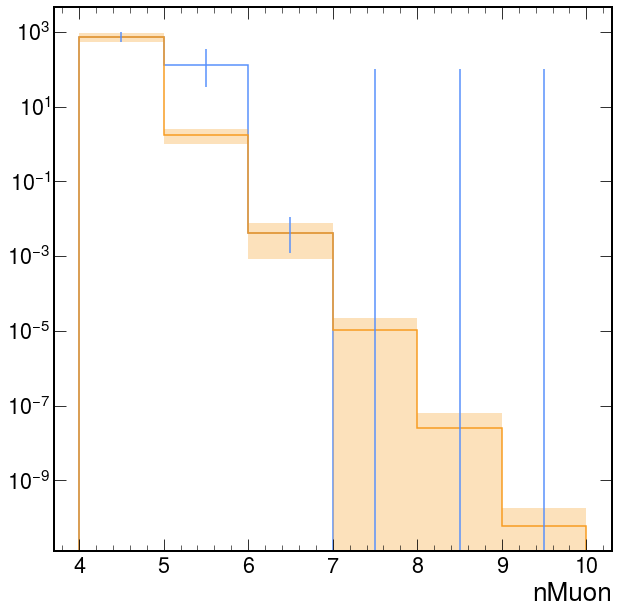

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.353 (χ²/ndof = 1.4)      │              Nfcn = 95               │
│ EDM = 2.95e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.62   │   0.18    │            │            │         │         │       │
│ 1 │ b    │   13.4    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0337 -0.142 │
│ b │ -0.142  0.611 │
└───┴───────────────┘

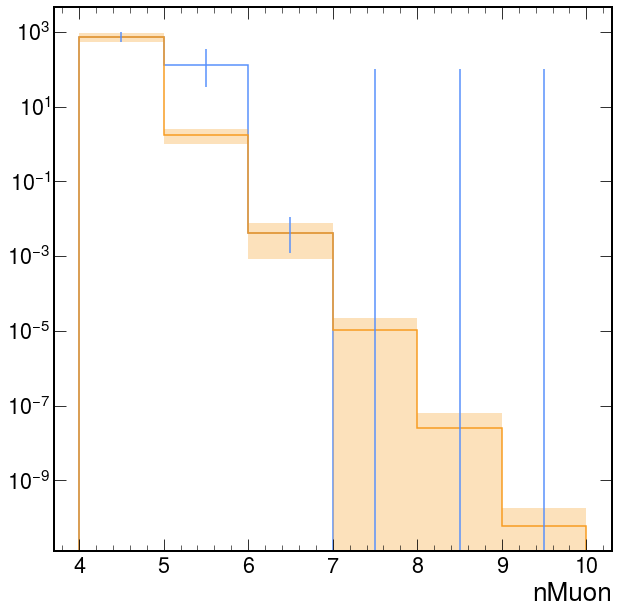

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.353 (χ²/ndof = 1.4)      │              Nfcn = 83               │
│ EDM = 6.18e-09 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.61   │   0.18    │            │            │         │         │       │
│ 1 │ b    │   13.3    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0341 -0.144 │
│ b │ -0.144  0.623 │
└───┴───────────────┘

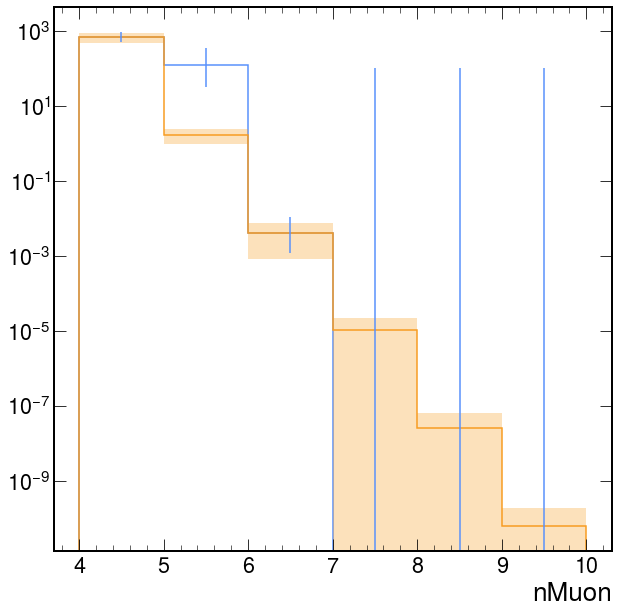

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.354 (χ²/ndof = 1.4)      │              Nfcn = 86               │
│ EDM = 8.52e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.60   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   13.2    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0346 -0.147 │
│ b │ -0.147  0.638 │
└───┴───────────────┘

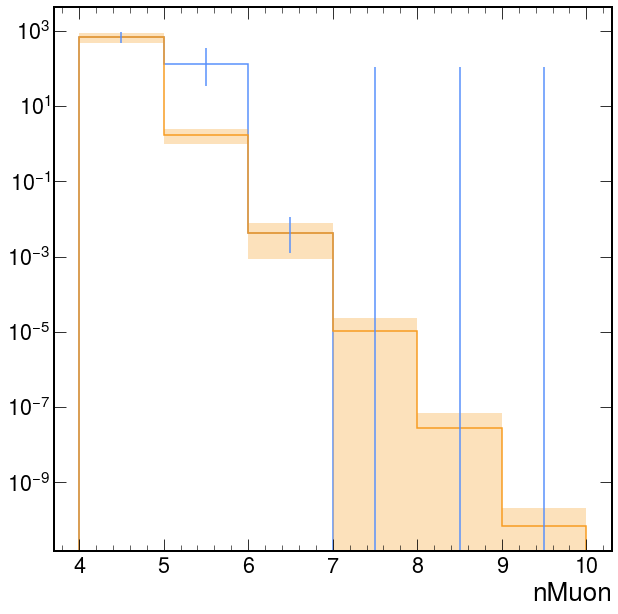

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.355 (χ²/ndof = 1.4)      │              Nfcn = 84               │
│ EDM = 5.27e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.59   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   13.2    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0349 -0.149 │
│ b │ -0.149  0.649 │
└───┴───────────────┘

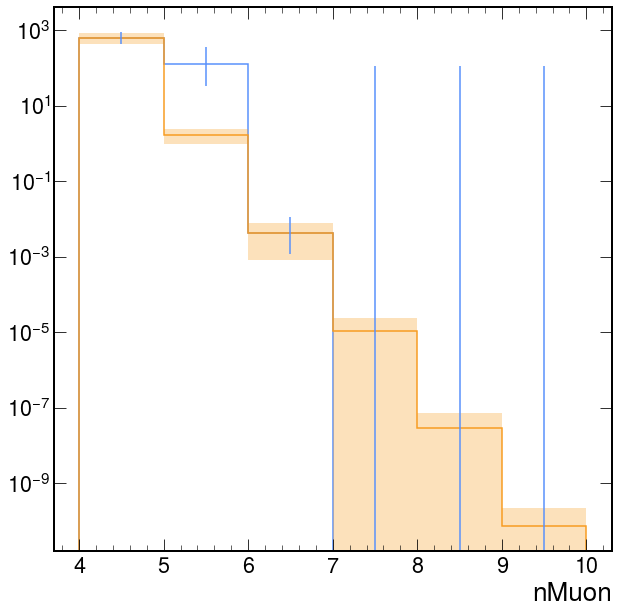

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.502 (χ²/ndof = 1.5)      │              Nfcn = 197              │
│ EDM = 0.38 (Goal: 0.0002)        │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │   ABOVE EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │     Covariance FORCED pos. def.      │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.6    │    0.4    │            │            │         │         │       │
│ 1 │ b    │   13.3    │    1.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────┐
│   │     a     b │
├───┼─────────────┤
│ a │ 0.192 -0.80 │
│ b │ -0.80  3.33 │
└───┴─────────────┘

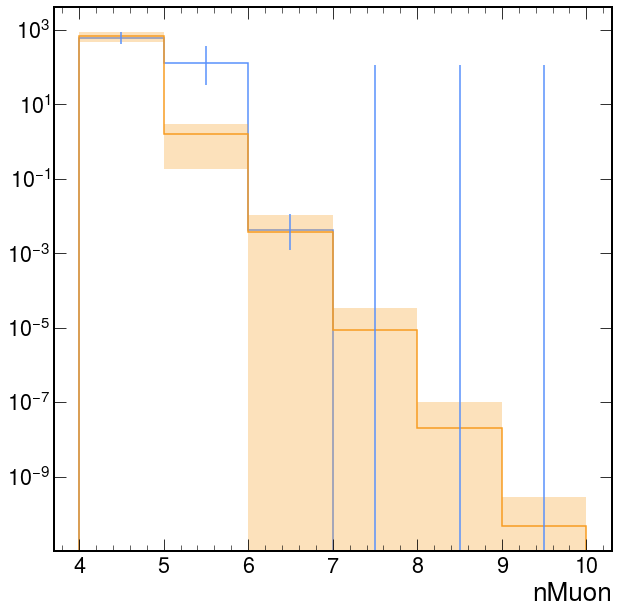

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.344 (χ²/ndof = 1.3)      │              Nfcn = 162              │
│ EDM = 4.16e-09 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.57   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   13.1    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0353 -0.152 │
│ b │ -0.152  0.667 │
└───┴───────────────┘

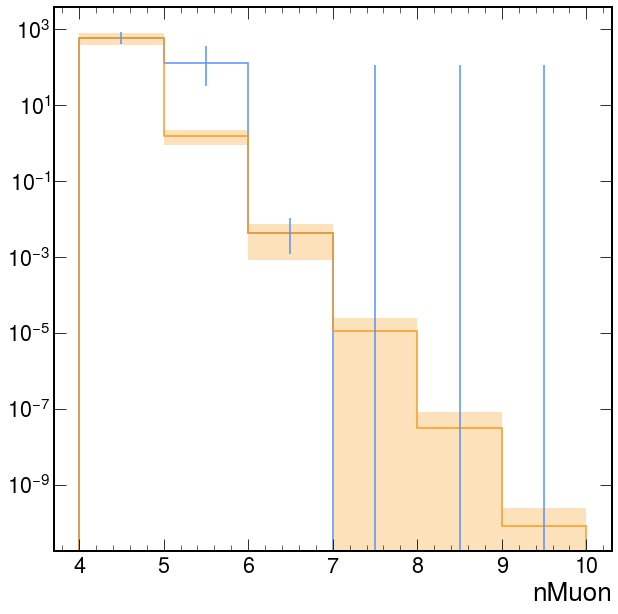

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.236 (χ²/ndof = 1.2)      │              Nfcn = 154              │
│ EDM = 2.31e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.57   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   13.1    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0355  -0.15 │
│ b │  -0.15  0.669 │
└───┴───────────────┘

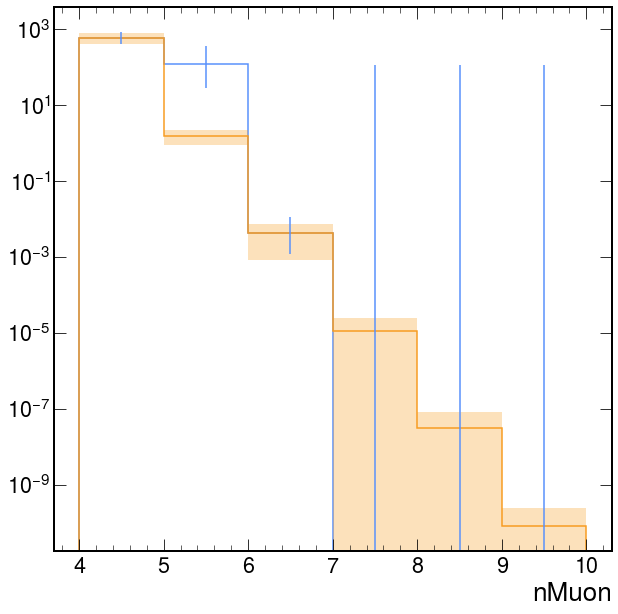

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.236 (χ²/ndof = 1.2)      │              Nfcn = 146              │
│ EDM = 7.8e-06 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.57   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   13.1    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0355  -0.15 │
│ b │  -0.15  0.671 │
└───┴───────────────┘

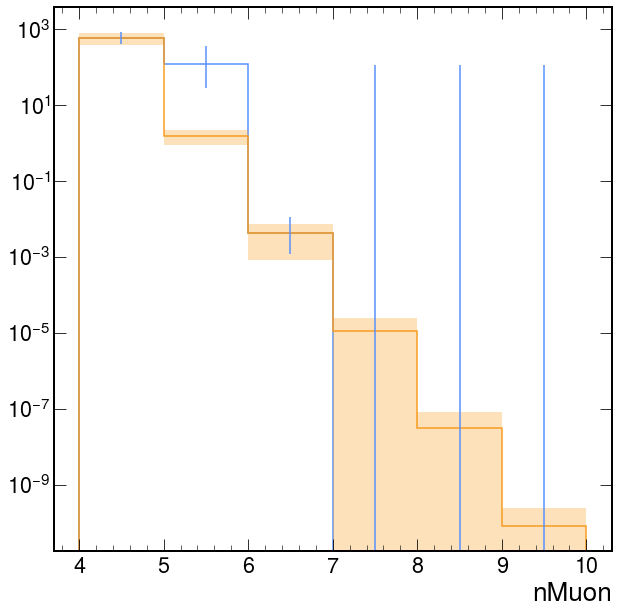

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.234 (χ²/ndof = 1.2)      │              Nfcn = 145              │
│ EDM = 6.77e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.57   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   13.0    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0355  -0.15 │
│ b │  -0.15  0.673 │
└───┴───────────────┘

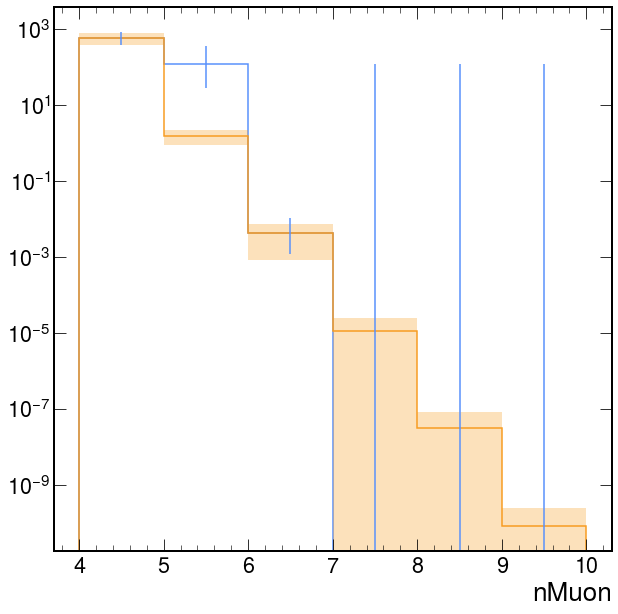

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.235 (χ²/ndof = 1.2)      │              Nfcn = 99               │
│ EDM = 4.44e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.56   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   13.0    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0359  -0.15 │
│ b │  -0.15  0.684 │
└───┴───────────────┘

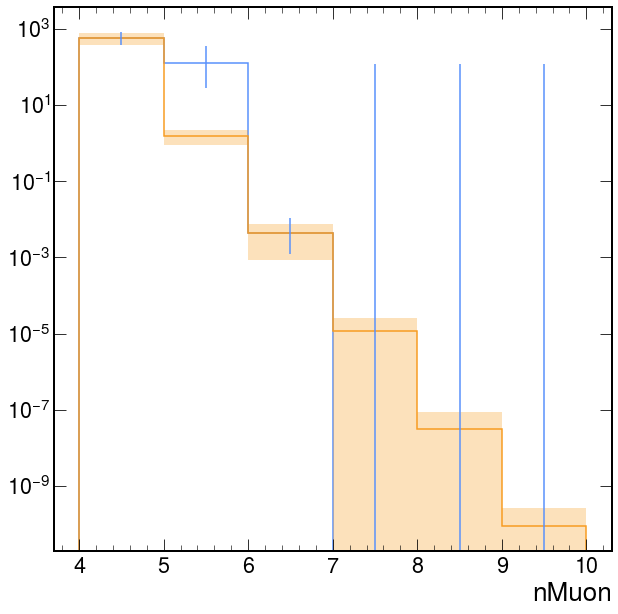

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.235 (χ²/ndof = 1.2)      │              Nfcn = 96               │
│ EDM = 1.17e-09 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.55   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.9    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0364  -0.16 │
│ b │  -0.16  0.706 │
└───┴───────────────┘

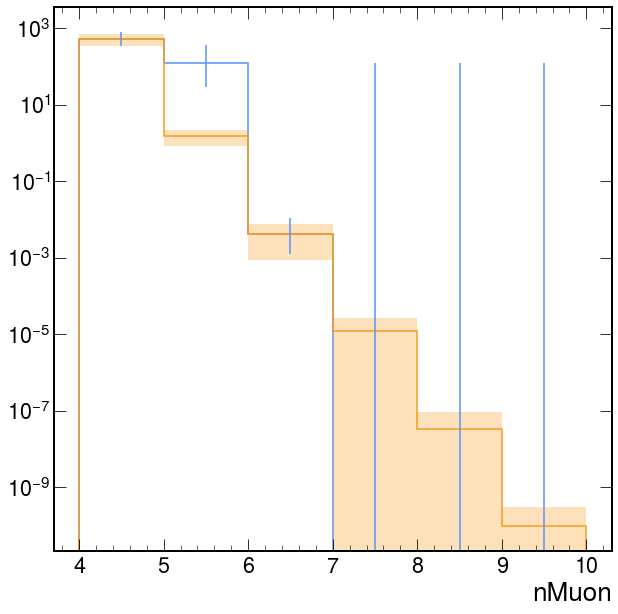

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.235 (χ²/ndof = 1.2)      │              Nfcn = 99               │
│ EDM = 4.53e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.55   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.9    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0364  -0.16 │
│ b │  -0.16  0.705 │
└───┴───────────────┘

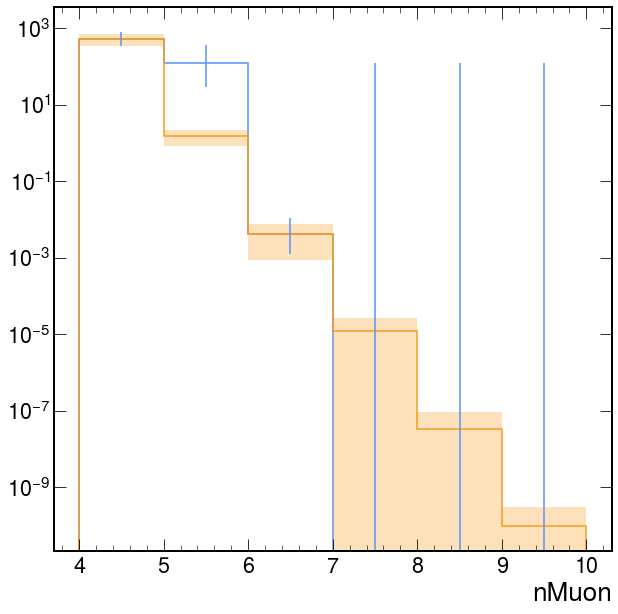

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.239 (χ²/ndof = 1.2)      │              Nfcn = 90               │
│ EDM = 3.79e-08 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.50   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.6    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────┐
│   │     a     b │
├───┼─────────────┤
│ a │ 0.037 -0.16 │
│ b │ -0.16 0.725 │
└───┴─────────────┘

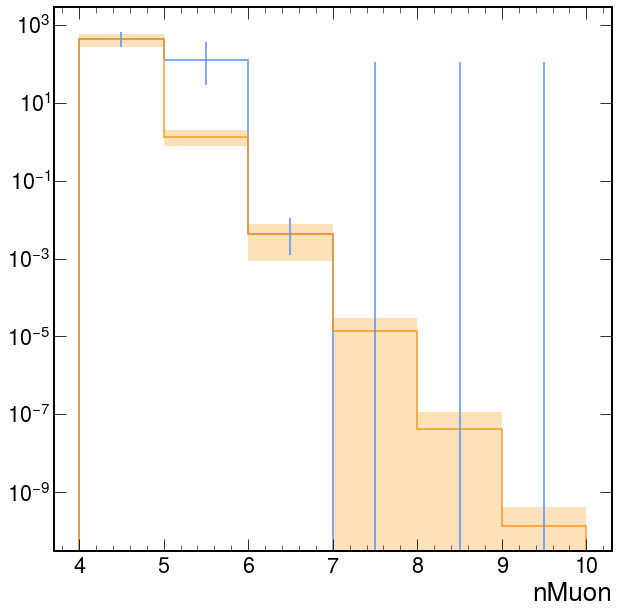

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.242 (χ²/ndof = 1.2)      │              Nfcn = 113              │
│ EDM = 1.7e-07 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.44   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.2    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0369  -0.16 │
│ b │  -0.16   0.72 │
└───┴───────────────┘

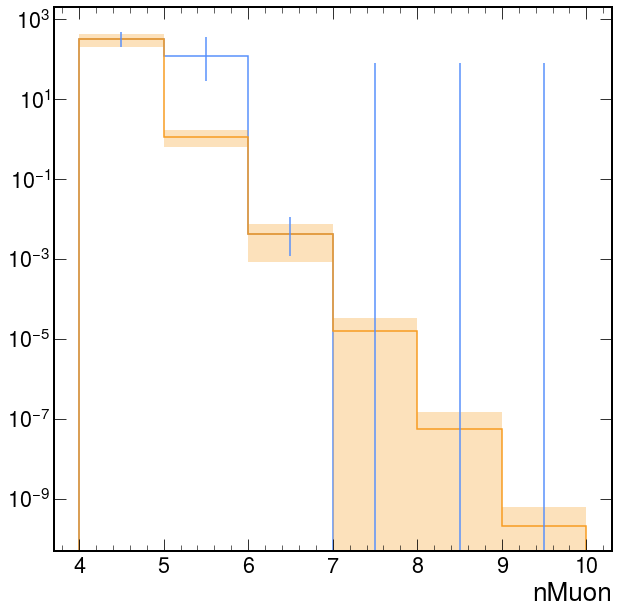

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.242 (χ²/ndof = 1.2)      │              Nfcn = 92               │
│ EDM = 2.06e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.44   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.3    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0372  -0.16 │
│ b │  -0.16  0.726 │
└───┴───────────────┘

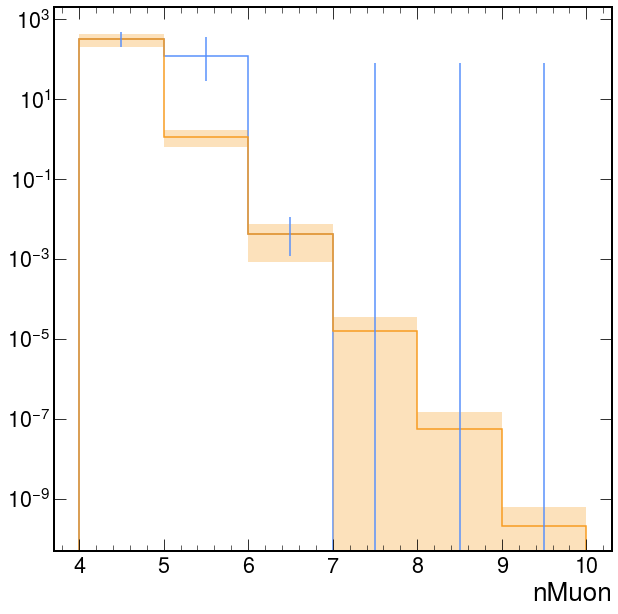

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.243 (χ²/ndof = 1.2)      │              Nfcn = 92               │
│ EDM = 5.64e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.43   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.2    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0372  -0.16 │
│ b │  -0.16  0.735 │
└───┴───────────────┘

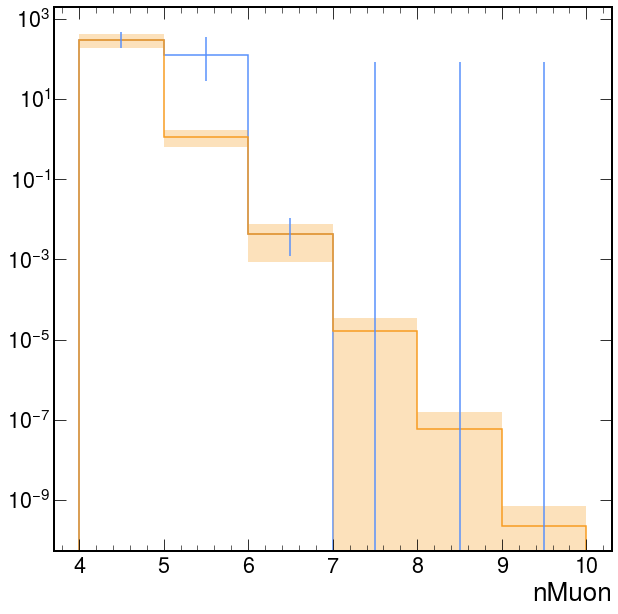

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.243 (χ²/ndof = 1.2)      │              Nfcn = 106              │
│ EDM = 5.43e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.43   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.2    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────┐
│   │     a     b │
├───┼─────────────┤
│ a │ 0.037 -0.16 │
│ b │ -0.16 0.732 │
└───┴─────────────┘

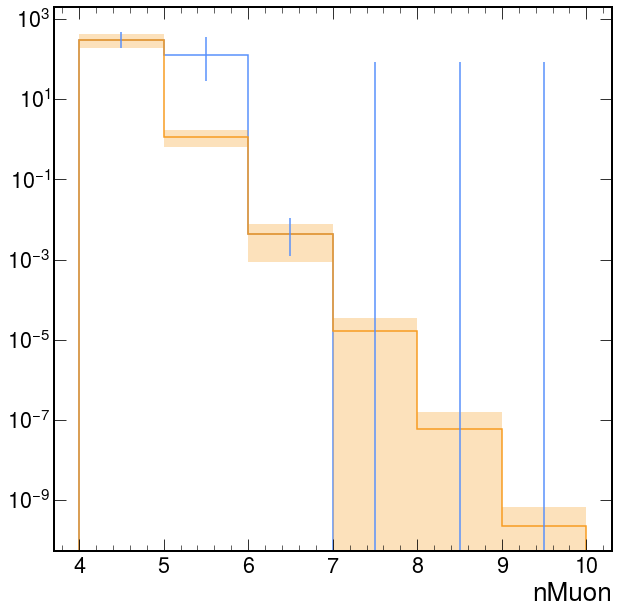

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.243 (χ²/ndof = 1.2)      │              Nfcn = 87               │
│ EDM = 6.42e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.43   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.2    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0372  -0.16 │
│ b │  -0.16  0.736 │
└───┴───────────────┘

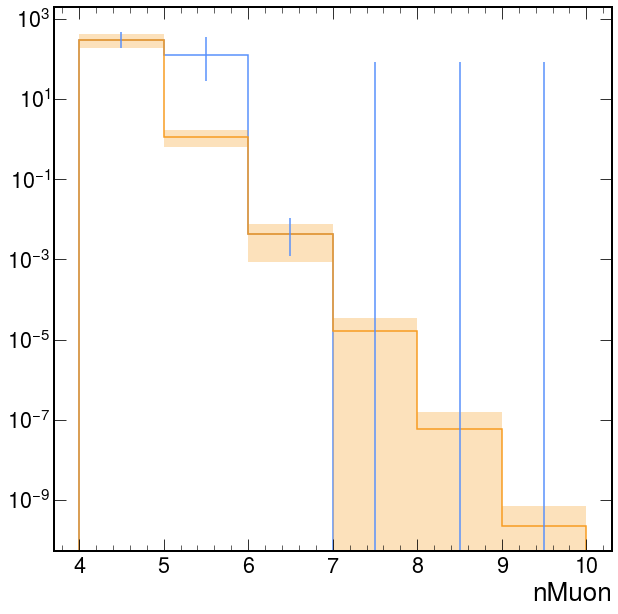

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.126 (χ²/ndof = 1.1)      │              Nfcn = 87               │
│ EDM = 3.34e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.43   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   12.2    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0372  -0.16 │
│ b │  -0.16  0.736 │
└───┴───────────────┘

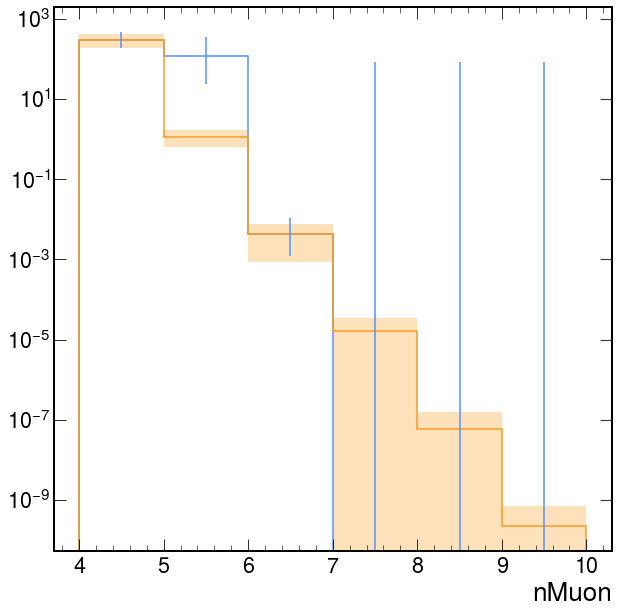

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.128 (χ²/ndof = 1.1)      │              Nfcn = 80               │
│ EDM = 7.13e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.38   │   0.20    │            │            │         │         │       │
│ 1 │ b    │   11.9    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0398  -0.18 │
│ b │  -0.18  0.823 │
└───┴───────────────┘

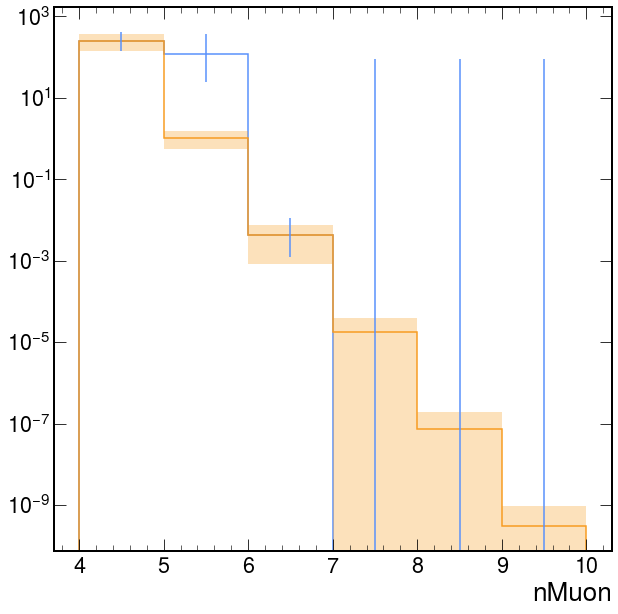

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.598 (χ²/ndof = 1.6)      │              Nfcn = 77               │
│ EDM = 4.6e-06 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.35   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0358  -0.16 │
│ b │  -0.16  0.779 │
└───┴───────────────┘

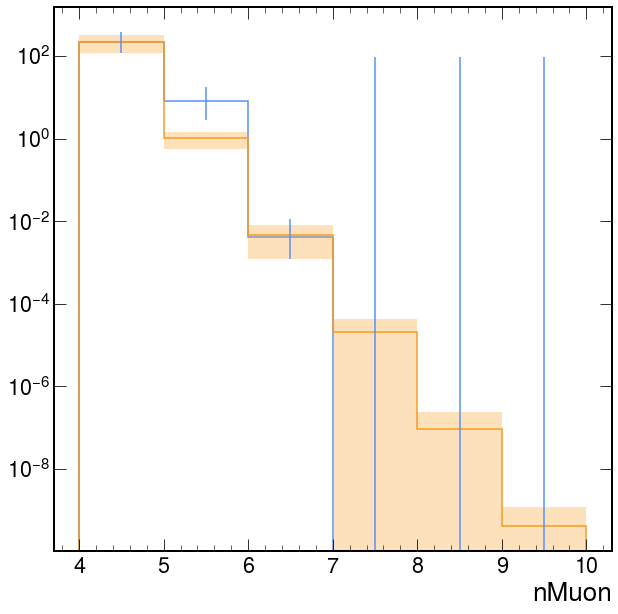

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.599 (χ²/ndof = 1.6)      │              Nfcn = 74               │
│ EDM = 5.15e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.35   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0354 -0.162 │
│ b │ -0.162  0.773 │
└───┴───────────────┘

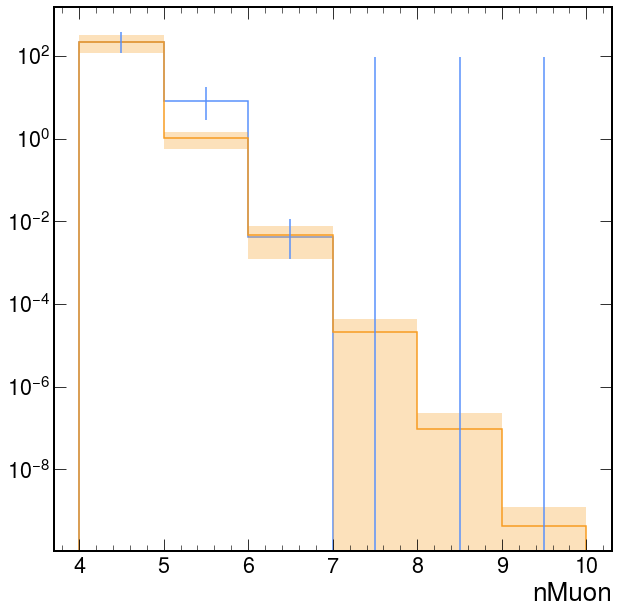

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.597 (χ²/ndof = 1.6)      │              Nfcn = 73               │
│ EDM = 1.89e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.35   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0358  -0.16 │
│ b │  -0.16  0.779 │
└───┴───────────────┘

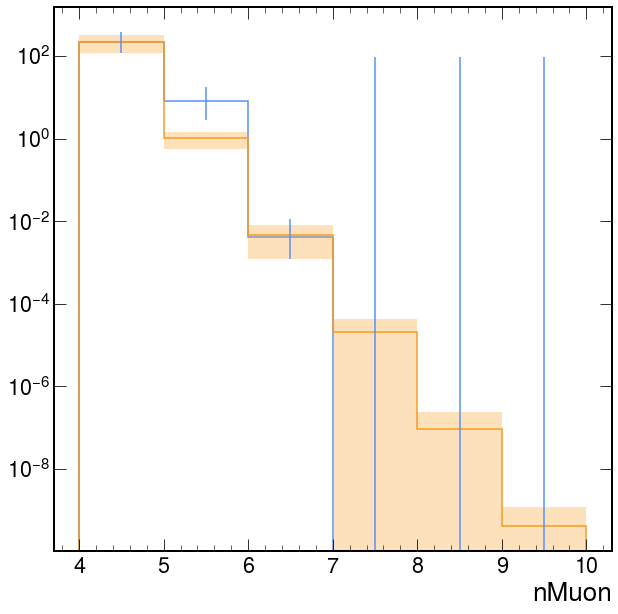

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.596 (χ²/ndof = 1.6)      │              Nfcn = 73               │
│ EDM = 1.29e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.35   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0358  -0.16 │
│ b │  -0.16  0.781 │
└───┴───────────────┘

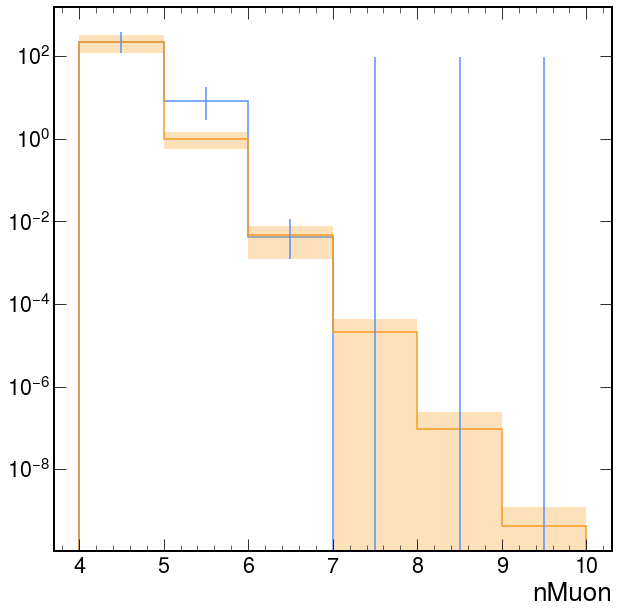

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.594 (χ²/ndof = 1.6)      │              Nfcn = 72               │
│ EDM = 5.28e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.35   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────┐
│   │     a     b │
├───┼─────────────┤
│ a │ 0.036 -0.16 │
│ b │ -0.16 0.784 │
└───┴─────────────┘

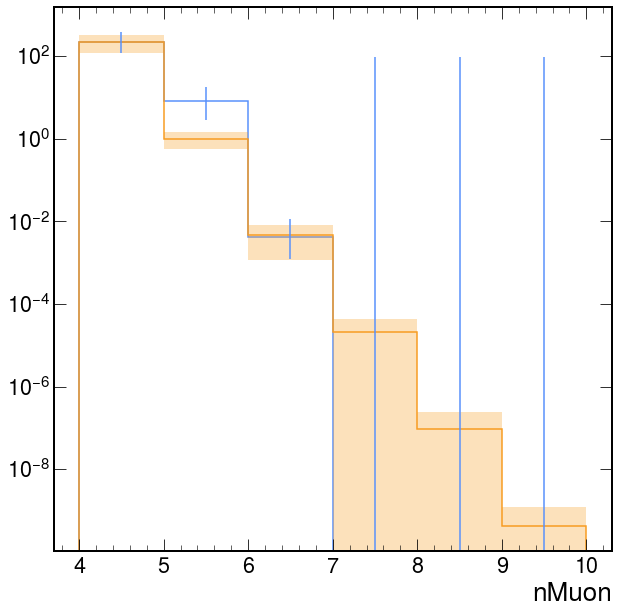

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.595 (χ²/ndof = 1.6)      │              Nfcn = 69               │
│ EDM = 3.59e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.34   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0359  -0.16 │
│ b │  -0.16  0.785 │
└───┴───────────────┘

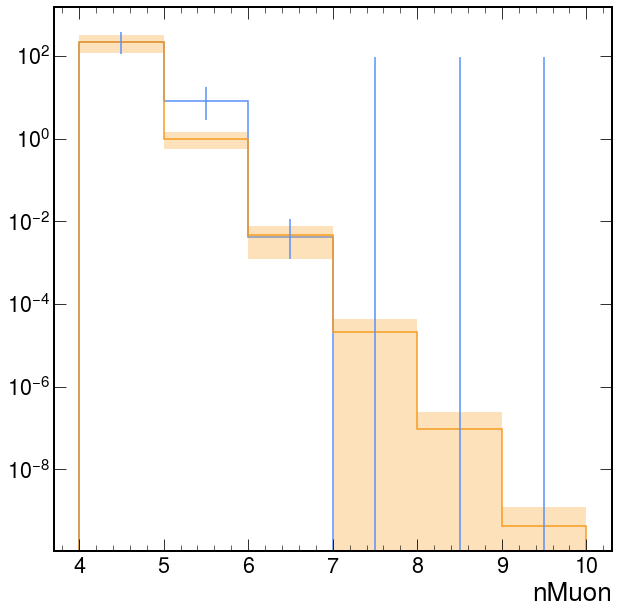

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.596 (χ²/ndof = 1.6)      │              Nfcn = 74               │
│ EDM = 8.15e-08 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.34   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0361  -0.17 │
│ b │  -0.17   0.79 │
└───┴───────────────┘

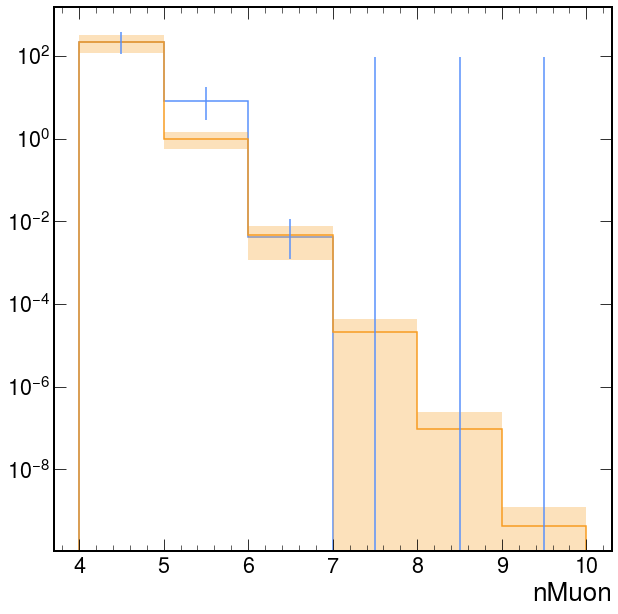

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.596 (χ²/ndof = 1.6)      │              Nfcn = 68               │
│ EDM = 2.47e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.34   │   0.19    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.9    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0359  -0.16 │
│ b │  -0.16  0.787 │
└───┴───────────────┘

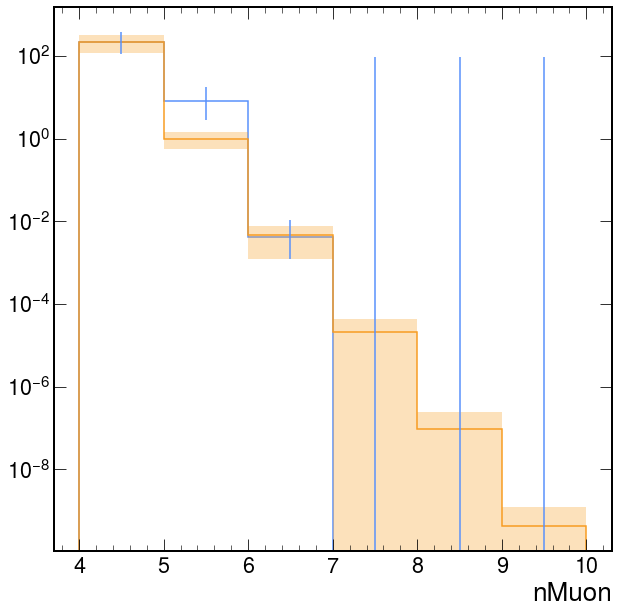

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.6 (χ²/ndof = 1.6)        │              Nfcn = 93               │
│ EDM = 1.26e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.32   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0234 -0.110 │
│ b │ -0.110  0.538 │
└───┴───────────────┘

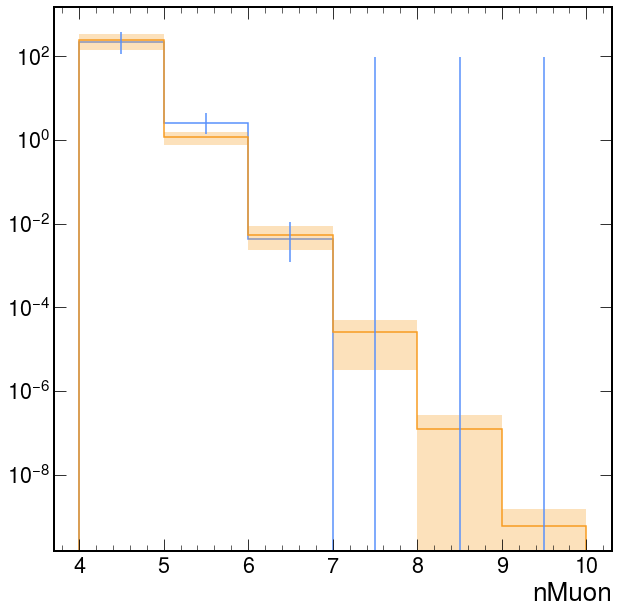

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.592 (χ²/ndof = 1.6)      │              Nfcn = 93               │
│ EDM = 1.26e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.32   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0234 -0.110 │
│ b │ -0.110  0.538 │
└───┴───────────────┘

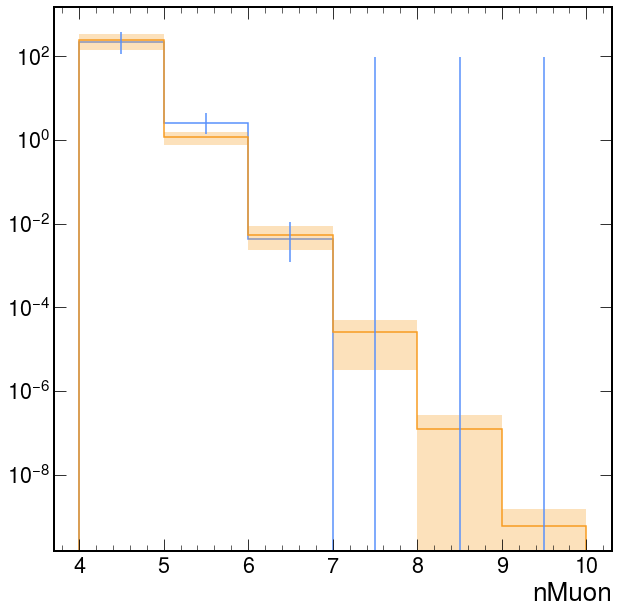

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.603 (χ²/ndof = 1.6)      │              Nfcn = 91               │
│ EDM = 1.37e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.32   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0235 -0.111 │
│ b │ -0.111  0.543 │
└───┴───────────────┘

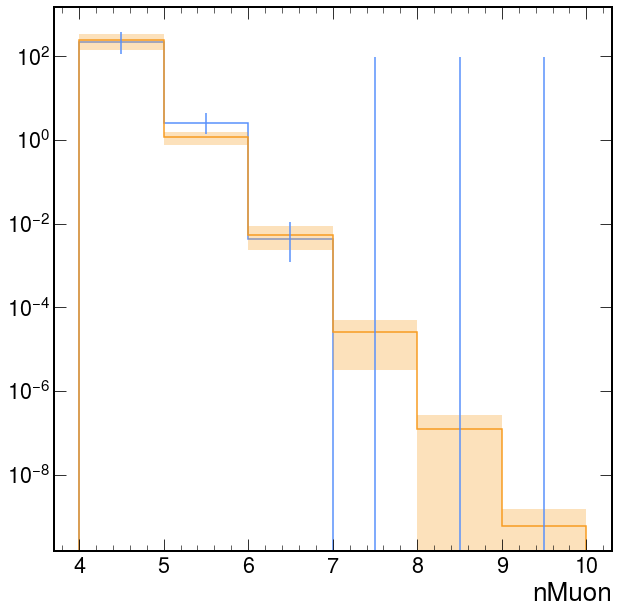

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.604 (χ²/ndof = 1.6)      │              Nfcn = 91               │
│ EDM = 1.3e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.32   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0235 -0.111 │
│ b │ -0.111  0.543 │
└───┴───────────────┘

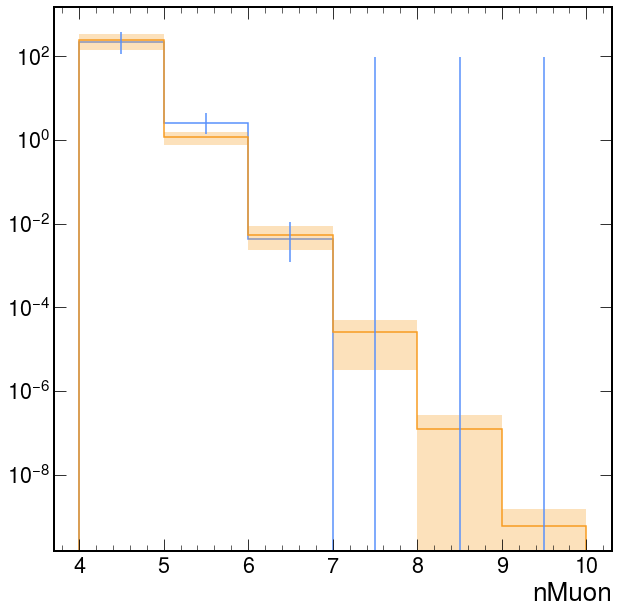

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.604 (χ²/ndof = 1.6)      │              Nfcn = 91               │
│ EDM = 1.3e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.32   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0235 -0.111 │
│ b │ -0.111  0.543 │
└───┴───────────────┘

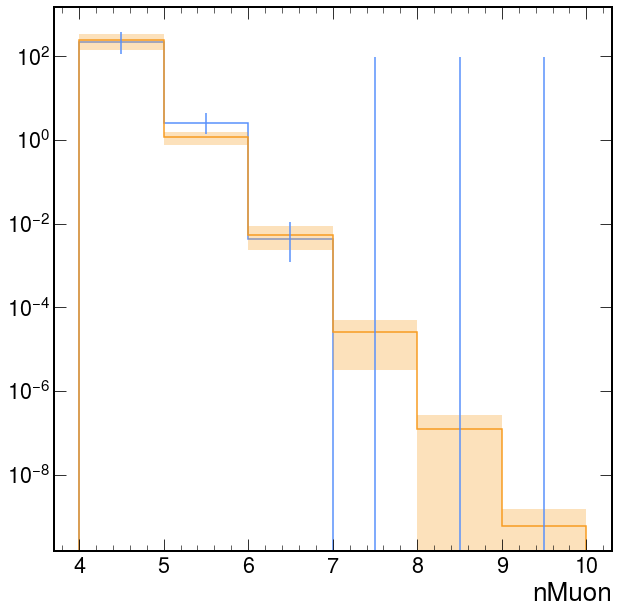

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.605 (χ²/ndof = 1.6)      │              Nfcn = 91               │
│ EDM = 1.14e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.32   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   11.7    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0235 -0.111 │
│ b │ -0.111  0.544 │
└───┴───────────────┘

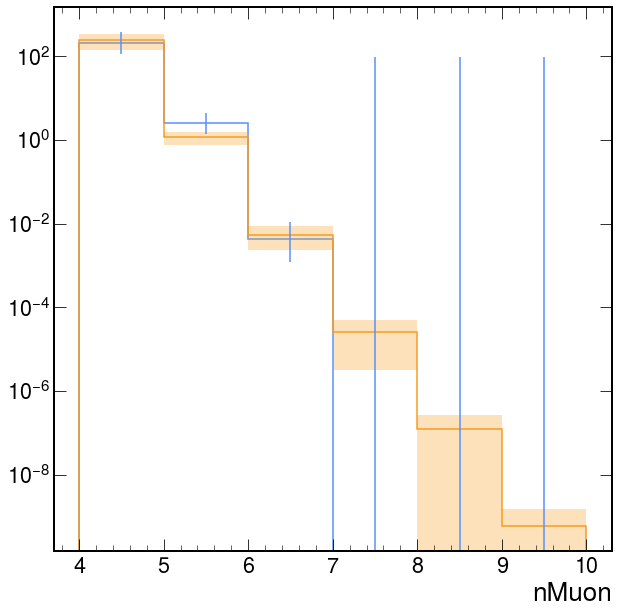

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.726 (χ²/ndof = 1.7)      │              Nfcn = 91               │
│ EDM = 5.68e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.16    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0249 -0.119 │
│ b │ -0.119  0.593 │
└───┴───────────────┘

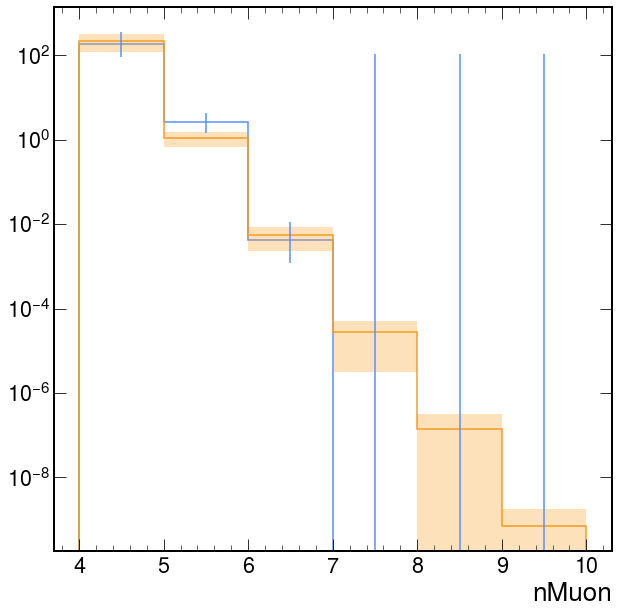

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.727 (χ²/ndof = 1.7)      │              Nfcn = 91               │
│ EDM = 5.66e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.16    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0249 -0.119 │
│ b │ -0.119  0.593 │
└───┴───────────────┘

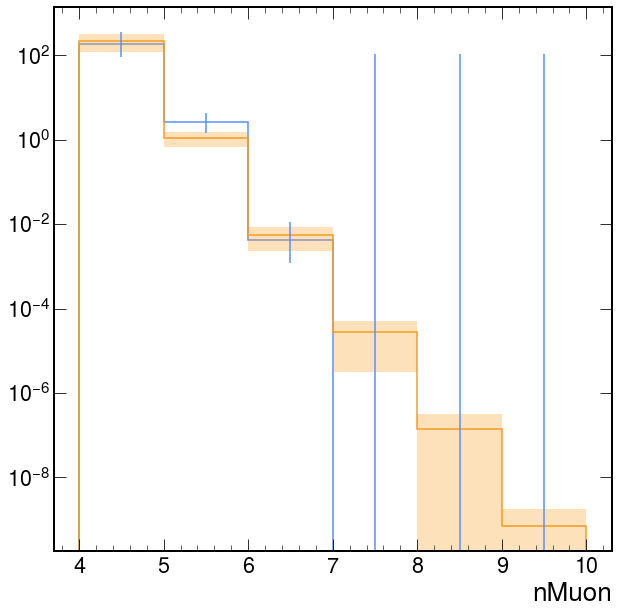

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.727 (χ²/ndof = 1.7)      │              Nfcn = 91               │
│ EDM = 5.66e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.16    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0249 -0.119 │
│ b │ -0.119  0.593 │
└───┴───────────────┘

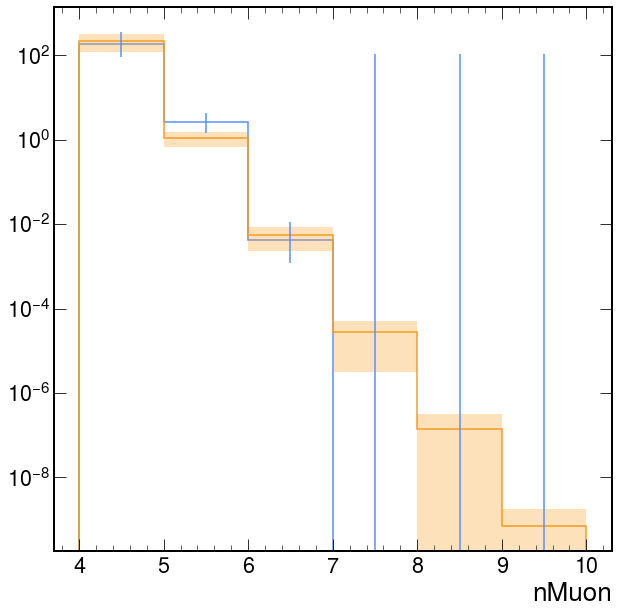

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.757 (χ²/ndof = 1.8)      │              Nfcn = 86               │
│ EDM = 1.4e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.29   │   0.16    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0254 -0.122 │
│ b │ -0.122  0.609 │
└───┴───────────────┘

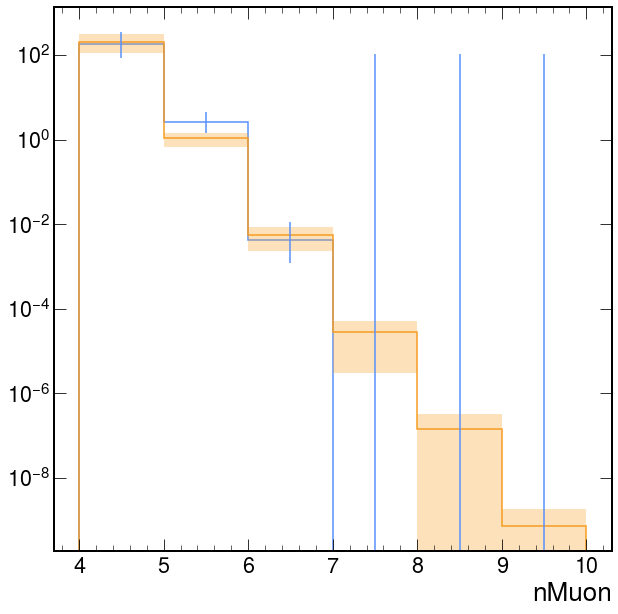

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.757 (χ²/ndof = 1.8)      │              Nfcn = 86               │
│ EDM = 1.39e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.29   │   0.16    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0254 -0.122 │
│ b │ -0.122  0.609 │
└───┴───────────────┘

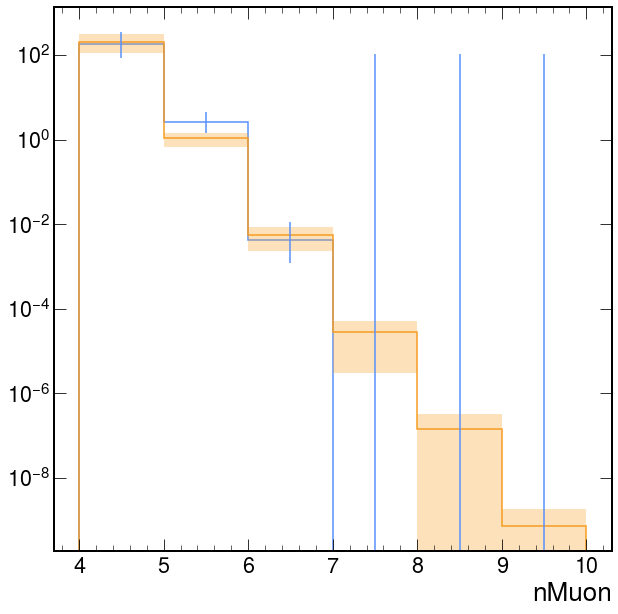

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.748 (χ²/ndof = 1.7)      │              Nfcn = 86               │
│ EDM = 1.39e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.29   │   0.16    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0255 -0.122 │
│ b │ -0.122   0.61 │
└───┴───────────────┘

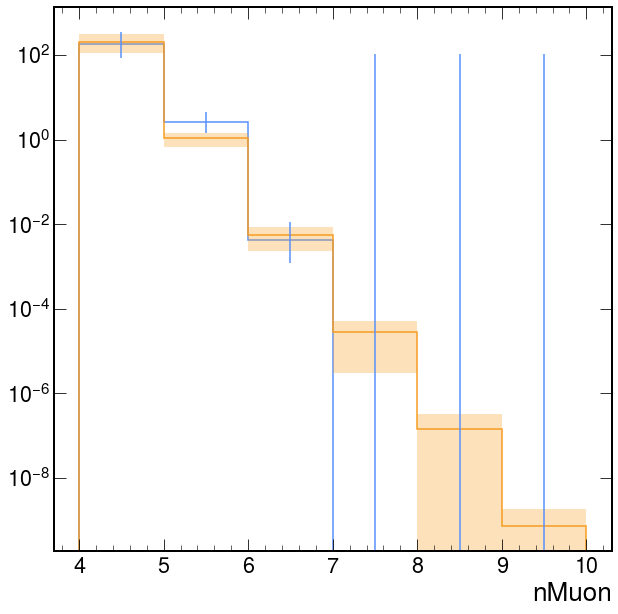

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.582 (χ²/ndof = 1.6)      │              Nfcn = 88               │
│ EDM = 1.29e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.29   │   0.16    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0261 -0.125 │
│ b │ -0.125  0.623 │
└───┴───────────────┘

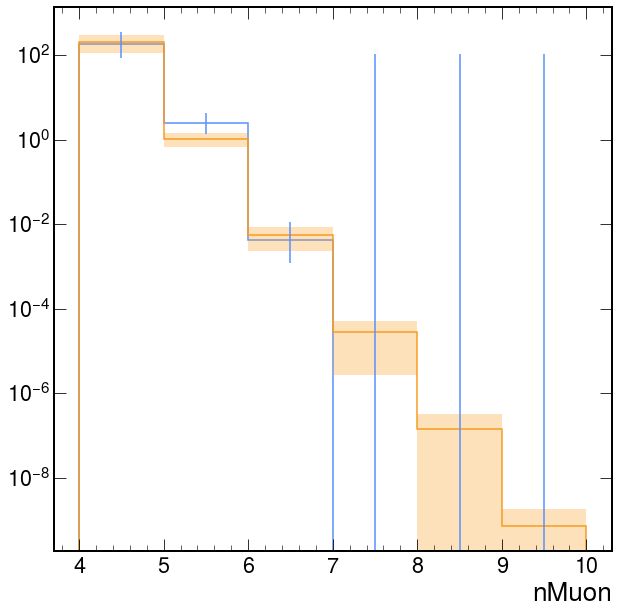

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7797 (χ²/ndof = 0.8)     │              Nfcn = 79               │
│ EDM = 8.92e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0283 -0.136 │
│ b │ -0.136  0.675 │
└───┴───────────────┘

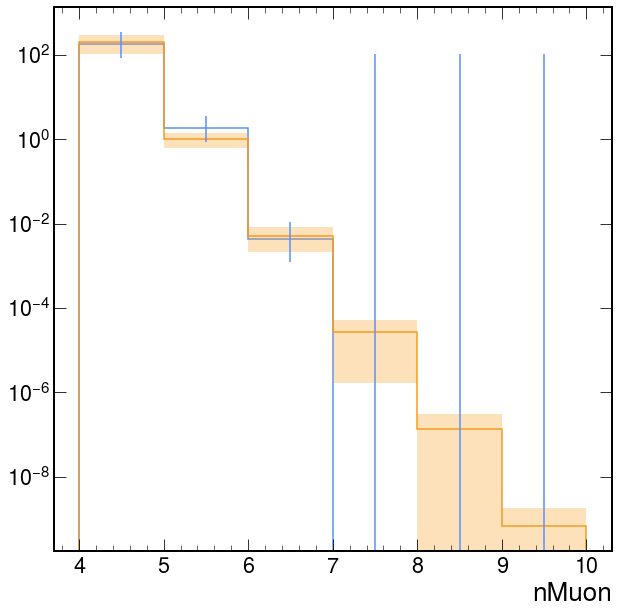

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7798 (χ²/ndof = 0.8)     │              Nfcn = 79               │
│ EDM = 8.92e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0283 -0.136 │
│ b │ -0.136  0.675 │
└───┴───────────────┘

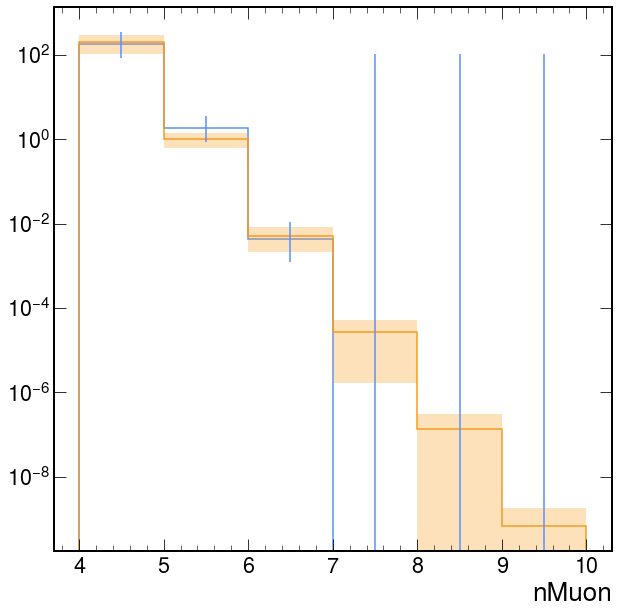

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7802 (χ²/ndof = 0.8)     │              Nfcn = 79               │
│ EDM = 8.89e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0284 -0.136 │
│ b │ -0.136  0.675 │
└───┴───────────────┘

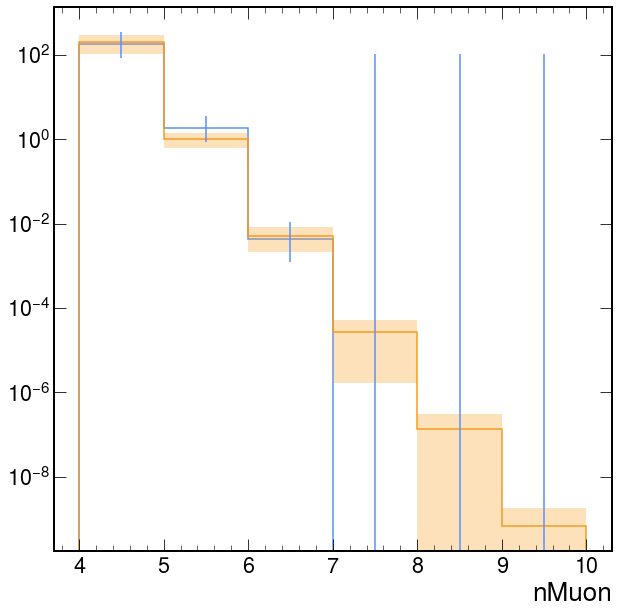

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7827 (χ²/ndof = 0.8)     │              Nfcn = 77               │
│ EDM = 8.71e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0284 -0.136 │
│ b │ -0.136  0.677 │
└───┴───────────────┘

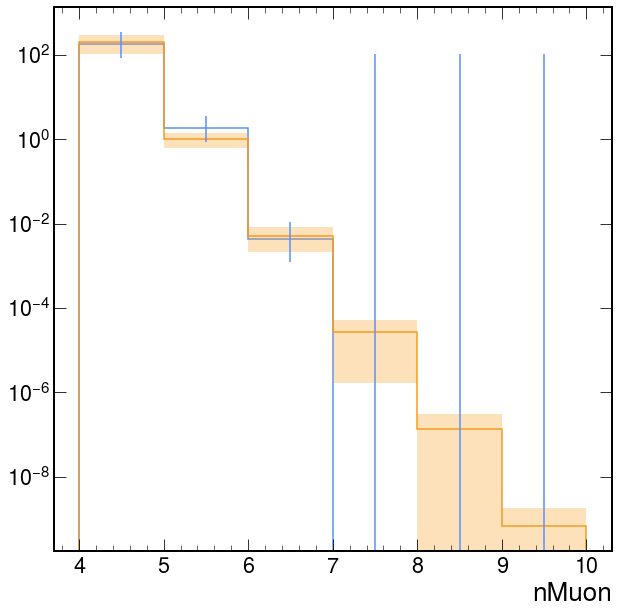

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7827 (χ²/ndof = 0.8)     │              Nfcn = 77               │
│ EDM = 8.7e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0284 -0.136 │
│ b │ -0.136  0.677 │
└───┴───────────────┘

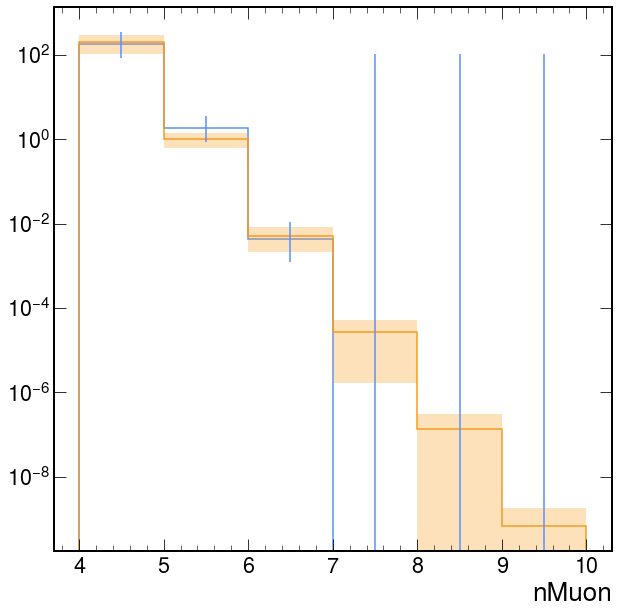

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7851 (χ²/ndof = 0.8)     │              Nfcn = 77               │
│ EDM = 8.5e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0285 -0.136 │
│ b │ -0.136  0.679 │
└───┴───────────────┘

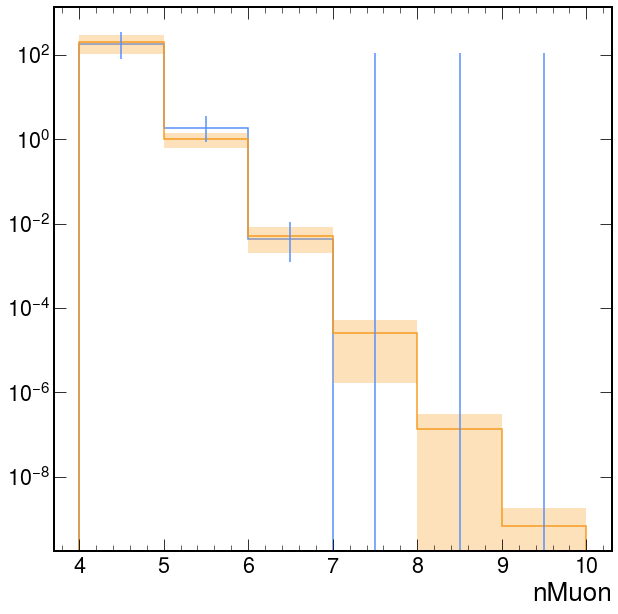

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7851 (χ²/ndof = 0.8)     │              Nfcn = 77               │
│ EDM = 8.5e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0285 -0.136 │
│ b │ -0.136  0.679 │
└───┴───────────────┘

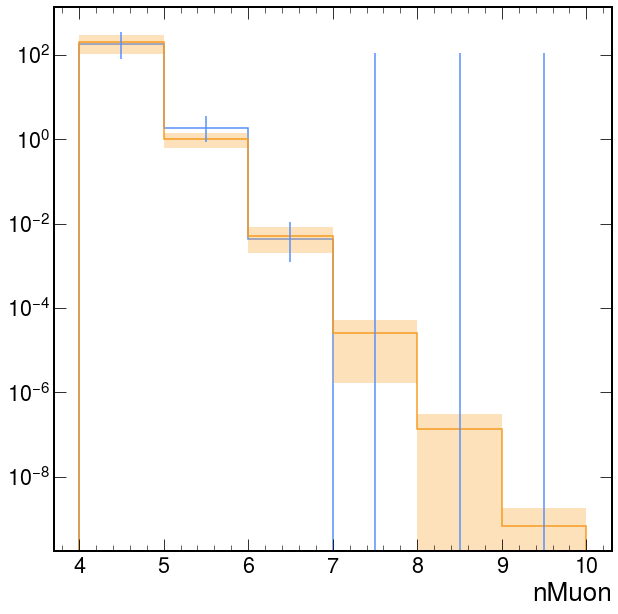

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7856 (χ²/ndof = 0.8)     │              Nfcn = 77               │
│ EDM = 8.46e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0285 -0.136 │
│ b │ -0.136  0.679 │
└───┴───────────────┘

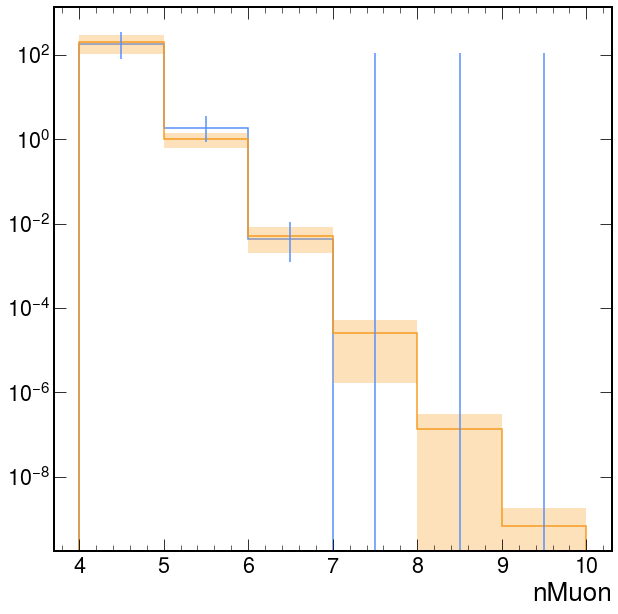

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7856 (χ²/ndof = 0.8)     │              Nfcn = 77               │
│ EDM = 8.46e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.30   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0285 -0.136 │
│ b │ -0.136  0.679 │
└───┴───────────────┘

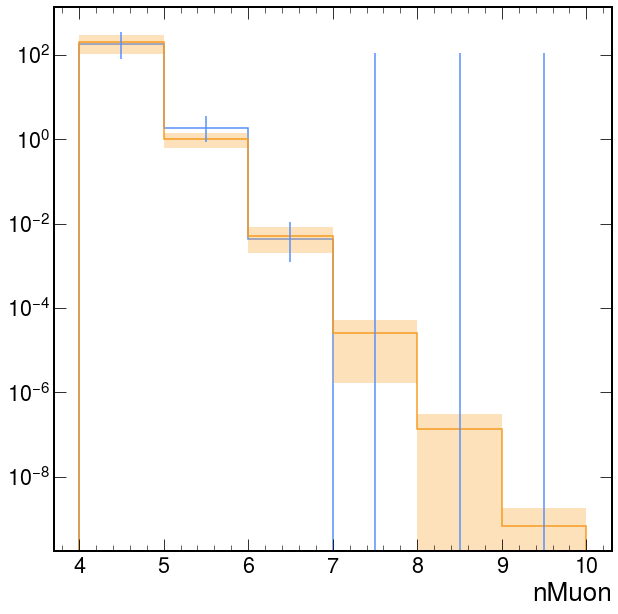

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.786 (χ²/ndof = 0.8)      │              Nfcn = 77               │
│ EDM = 8.42e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.29   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0285 -0.136 │
│ b │ -0.136   0.68 │
└───┴───────────────┘

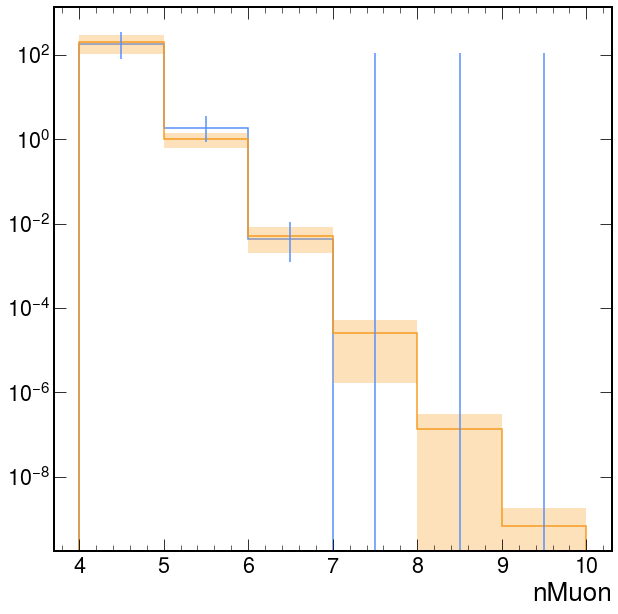

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.7886 (χ²/ndof = 0.8)     │              Nfcn = 77               │
│ EDM = 8.17e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.29   │   0.17    │            │            │         │         │       │
│ 1 │ b    │   11.5    │    0.8    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0285 -0.137 │
│ b │ -0.137  0.682 │
└───┴───────────────┘

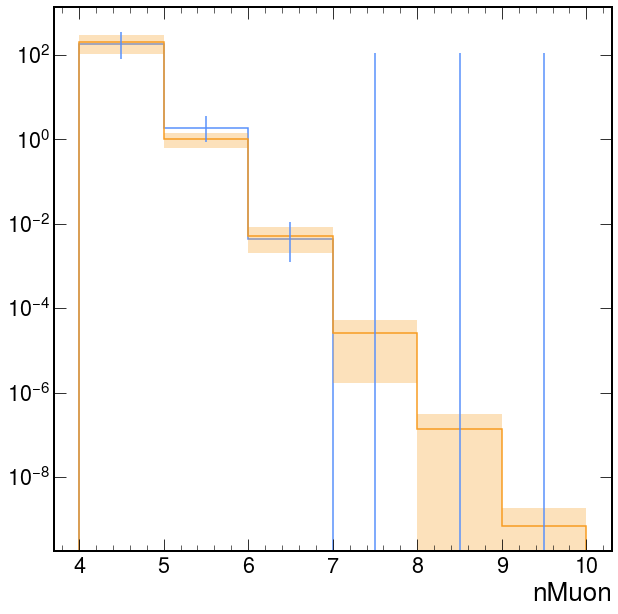

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.497 (χ²/ndof = 1.5)      │              Nfcn = 62               │
│ EDM = 7.2e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.10   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.3    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0213 -0.090 │
│ b │ -0.090  0.392 │
└───┴───────────────┘

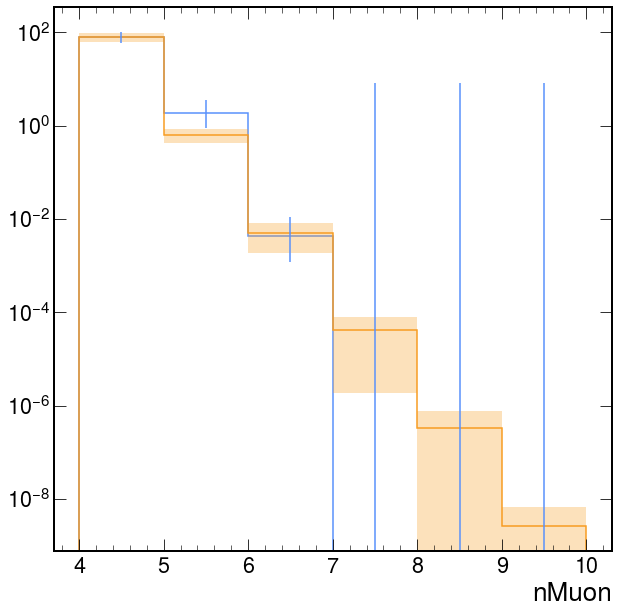

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.498 (χ²/ndof = 1.5)      │              Nfcn = 62               │
│ EDM = 7.1e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.10   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.3    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0213 -0.090 │
│ b │ -0.090  0.392 │
└───┴───────────────┘

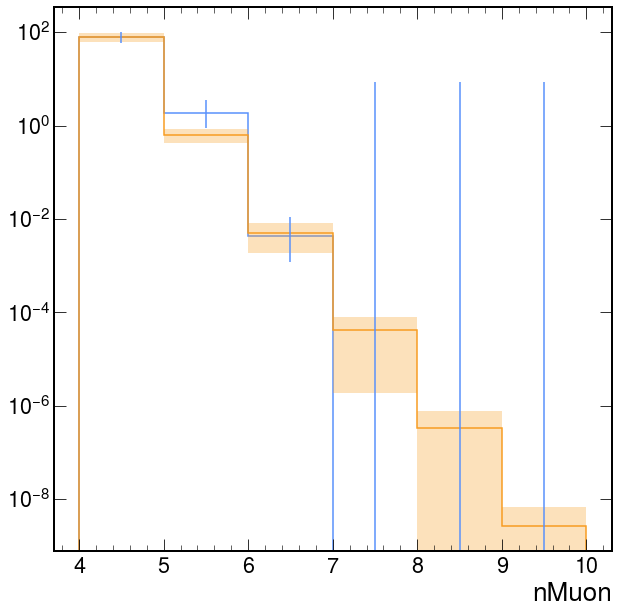

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.434 (χ²/ndof = 1.4)      │              Nfcn = 62               │
│ EDM = 7.43e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.10   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.3    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0215 -0.091 │
│ b │ -0.091  0.395 │
└───┴───────────────┘

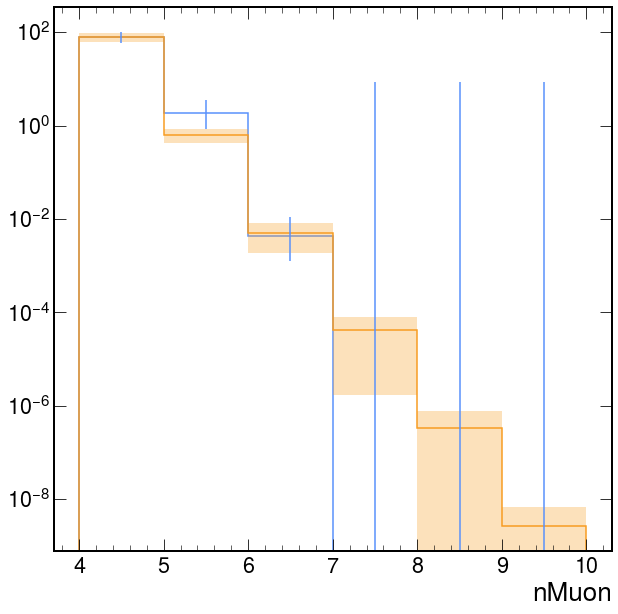

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.434 (χ²/ndof = 1.4)      │              Nfcn = 62               │
│ EDM = 7.43e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.10   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.3    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0215 -0.091 │
│ b │ -0.091  0.395 │
└───┴───────────────┘

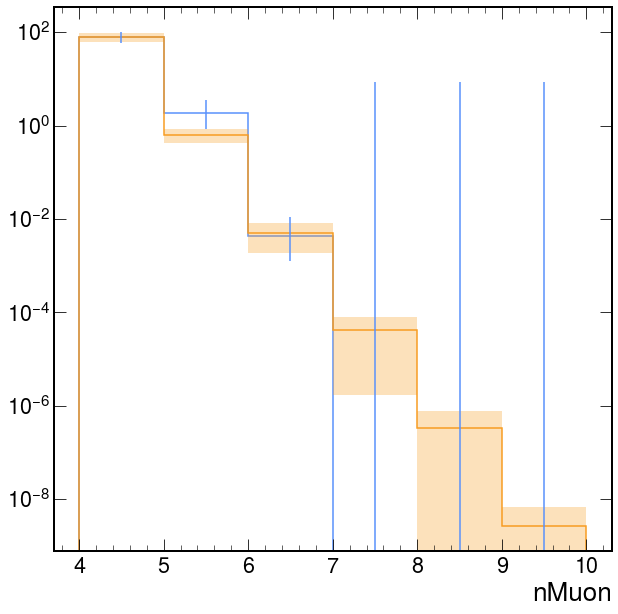

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.485 (χ²/ndof = 1.5)      │              Nfcn = 62               │
│ EDM = 2.3e-05 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.08   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.2    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0218 -0.092 │
│ b │ -0.092  0.402 │
└───┴───────────────┘

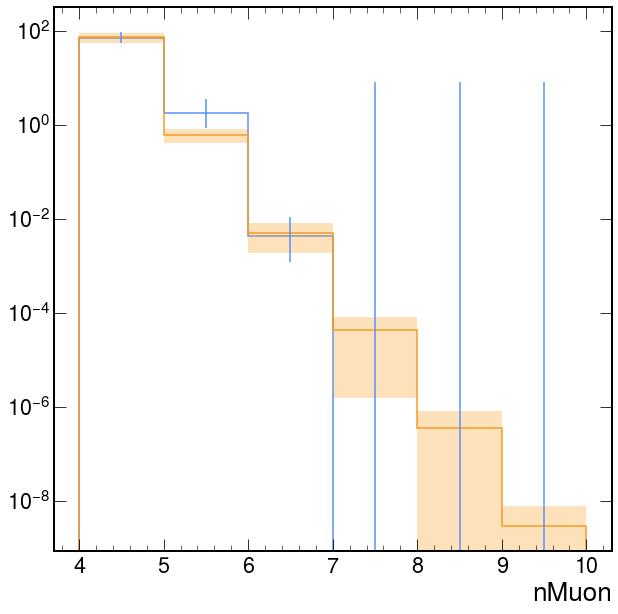

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.537 (χ²/ndof = 1.5)      │              Nfcn = 61               │
│ EDM = 7.08e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.07   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.1    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0222 -0.094 │
│ b │ -0.094  0.412 │
└───┴───────────────┘

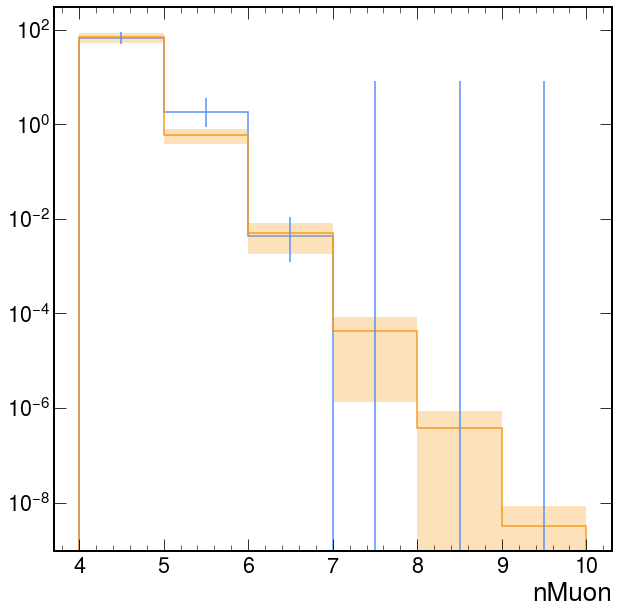

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.544 (χ²/ndof = 1.5)      │              Nfcn = 61               │
│ EDM = 2.35e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.06   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.1    │    0.6    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0222 -0.095 │
│ b │ -0.095  0.414 │
└───┴───────────────┘

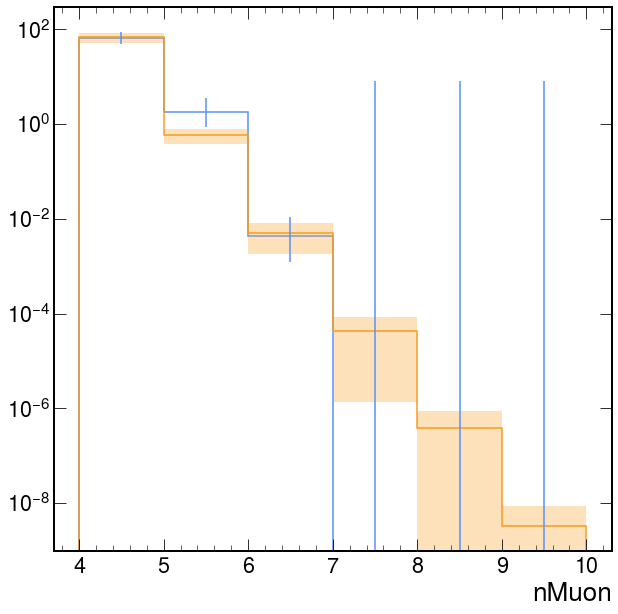

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.6 (χ²/ndof = 1.6)        │              Nfcn = 60               │
│ EDM = 5.14e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.05   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.0    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0226 -0.097 │
│ b │ -0.097  0.424 │
└───┴───────────────┘

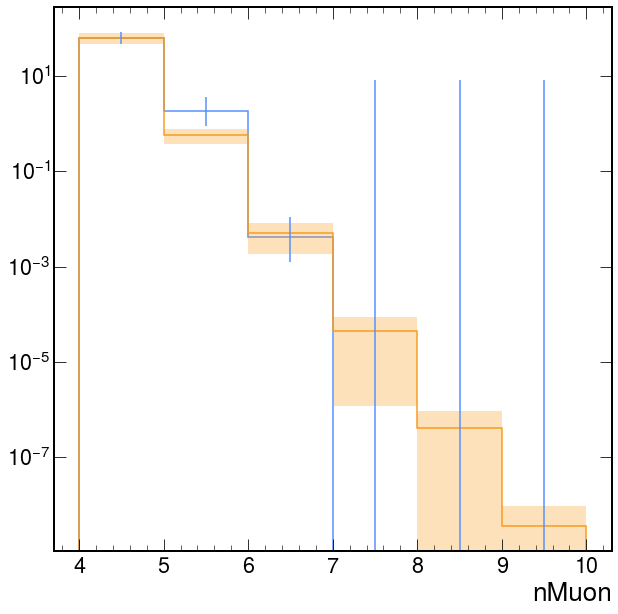

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.609 (χ²/ndof = 1.6)      │              Nfcn = 51               │
│ EDM = 4.96e-05 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.04   │   0.15    │            │            │         │         │       │
│ 1 │ b    │   10.0    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0232 -0.100 │
│ b │ -0.100  0.438 │
└───┴───────────────┘

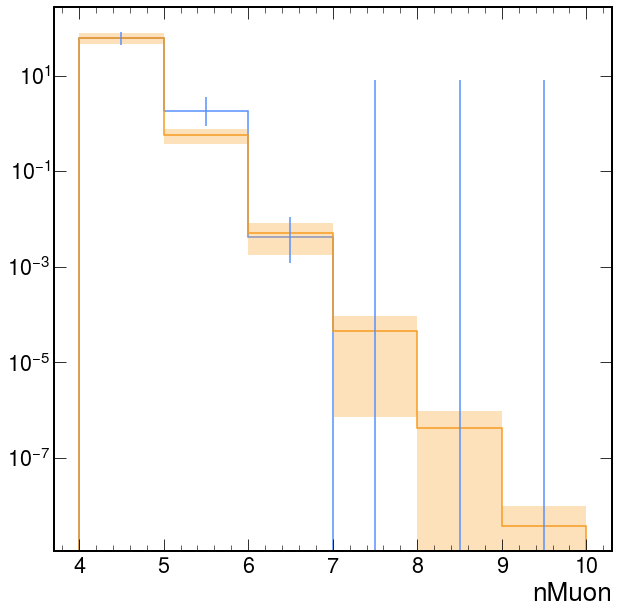

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.67 (χ²/ndof = 1.7)       │              Nfcn = 52               │
│ EDM = 1.09e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.03   │   0.15    │            │            │         │         │       │
│ 1 │ b    │    9.9    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0239 -0.103 │
│ b │ -0.103  0.453 │
└───┴───────────────┘

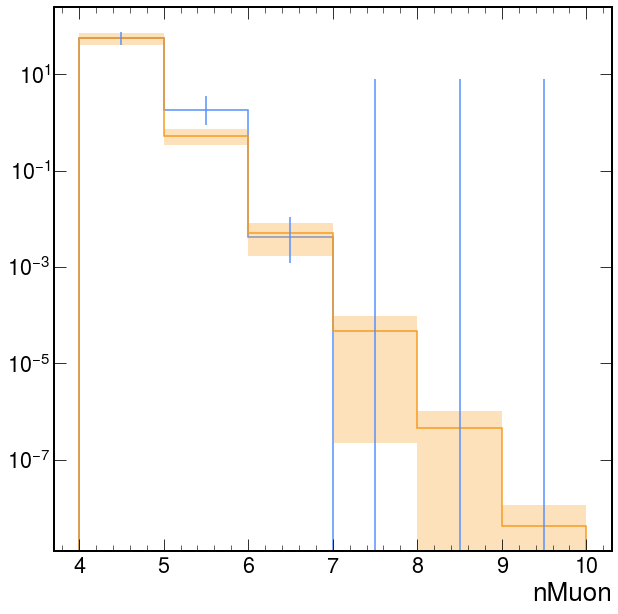

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.67 (χ²/ndof = 1.7)       │              Nfcn = 52               │
│ EDM = 1.14e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.03   │   0.15    │            │            │         │         │       │
│ 1 │ b    │    9.9    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0239 -0.103 │
│ b │ -0.103  0.453 │
└───┴───────────────┘

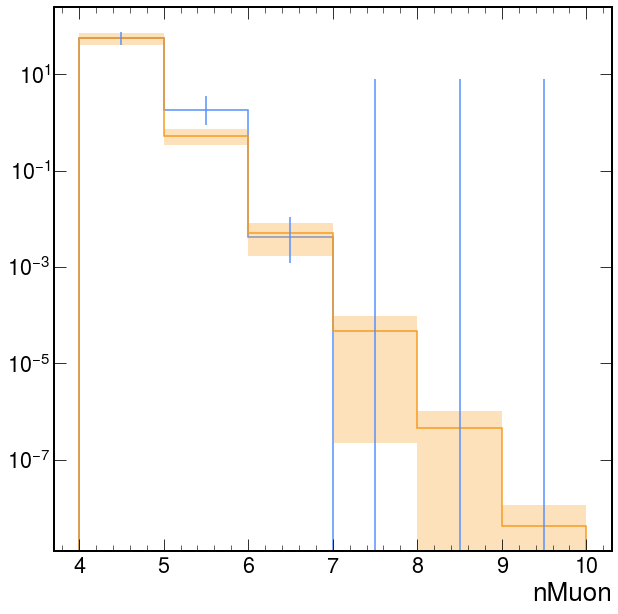

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.67 (χ²/ndof = 1.7)       │              Nfcn = 52               │
│ EDM = 1.16e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.03   │   0.15    │            │            │         │         │       │
│ 1 │ b    │    9.9    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0239 -0.103 │
│ b │ -0.103  0.454 │
└───┴───────────────┘

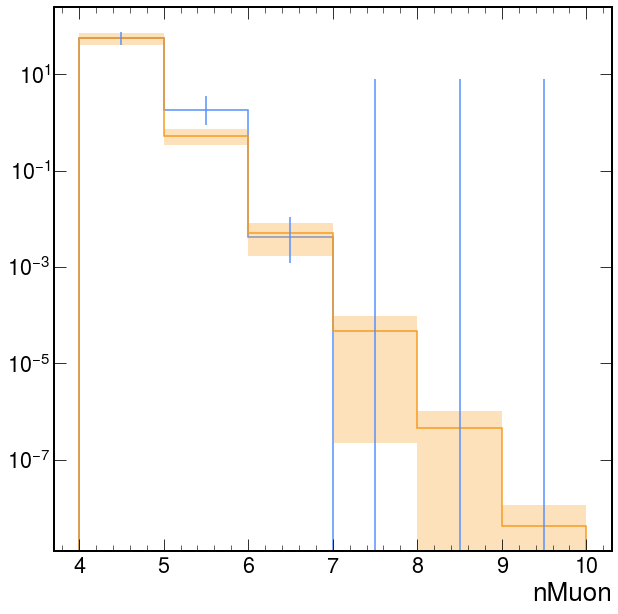

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.67 (χ²/ndof = 1.7)       │              Nfcn = 52               │
│ EDM = 1.16e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.03   │   0.15    │            │            │         │         │       │
│ 1 │ b    │    9.9    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0239 -0.103 │
│ b │ -0.103  0.454 │
└───┴───────────────┘

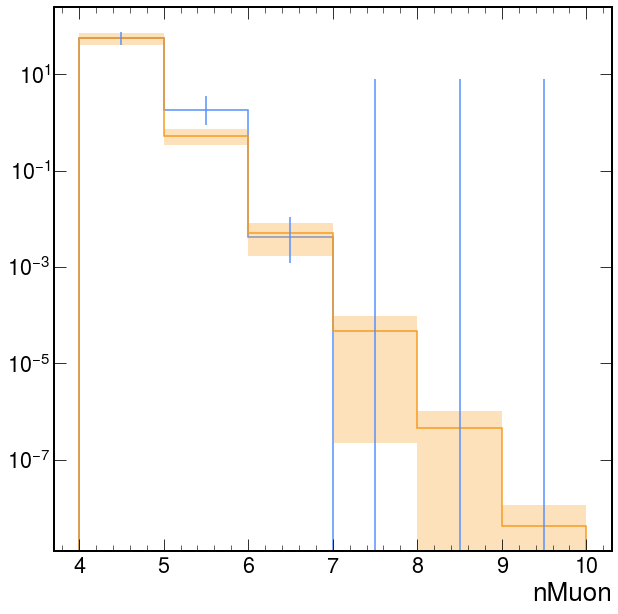

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.678 (χ²/ndof = 1.7)      │              Nfcn = 52               │
│ EDM = 9.1e-07 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -2.02   │   0.15    │            │            │         │         │       │
│ 1 │ b    │    9.8    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │  0.024 -0.103 │
│ b │ -0.103  0.457 │
└───┴───────────────┘

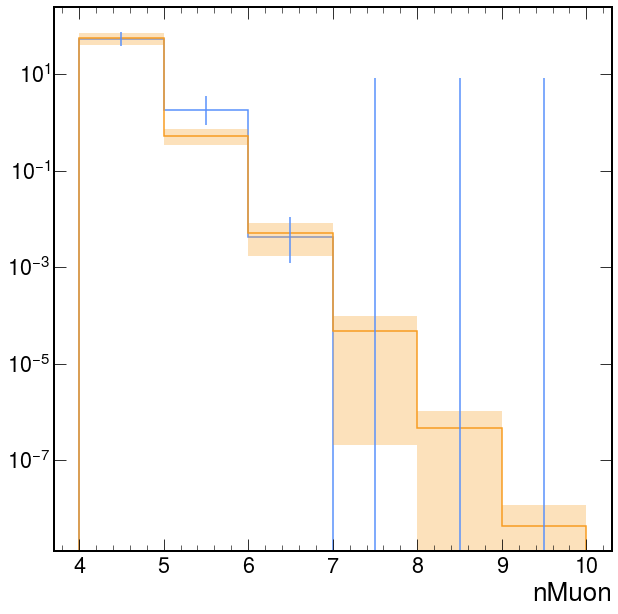

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.825 (χ²/ndof = 1.8)      │              Nfcn = 69               │
│ EDM = 6e-06 (Goal: 0.0002)       │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.97   │   0.16    │            │            │         │         │       │
│ 1 │ b    │    9.5    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0244 -0.106 │
│ b │ -0.106  0.474 │
└───┴───────────────┘

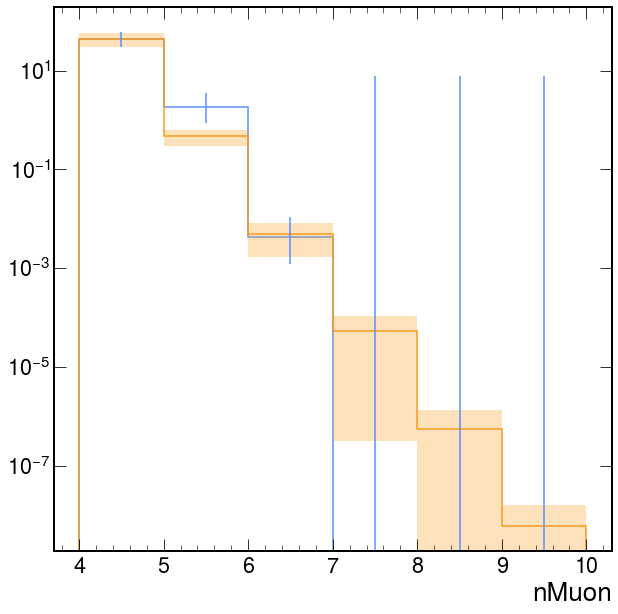

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.825 (χ²/ndof = 1.8)      │              Nfcn = 69               │
│ EDM = 6.05e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ a    │   -1.97   │   0.16    │            │            │         │         │       │
│ 1 │ b    │    9.5    │    0.7    │            │            │         │         │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬───────────────┐
│   │      a      b │
├───┼───────────────┤
│ a │ 0.0244 -0.106 │
│ b │ -0.106  0.474 │
└───┴───────────────┘

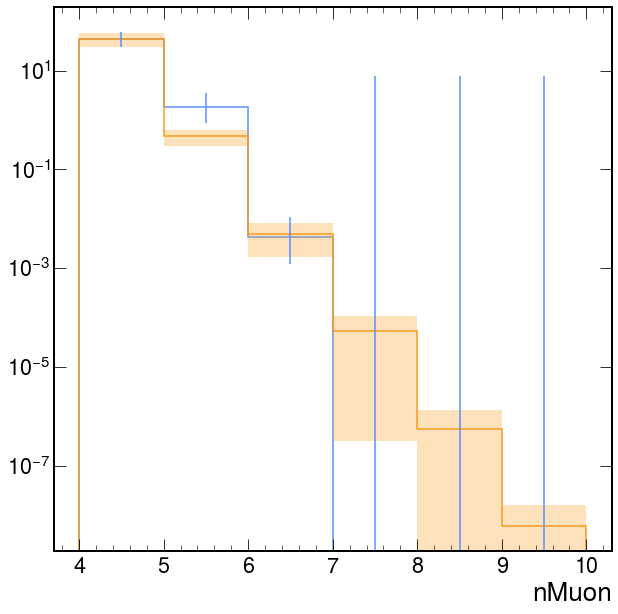

In [25]:
for i in range(100):
    h0 = plots['QCD_Pt_MuEnriched_2018'][
        'lead_interiso_vs_muon_iso_cut_vs_nMuon'
    ][i::sum, 98, :]
    first_zero_bin = np.where(h0.values() == 0)[0][0]
    data_x = h0.axes[0].edges[:first_zero_bin]
    data_y = h0.values()[:first_zero_bin]
    data_yerr = np.sqrt(h0.variances())[:first_zero_bin]
    least_squares = LeastSquares(data_x, data_y, data_yerr, muon_func_lin)
    m = Minuit(least_squares, a=-2, b=10)
    m.migrad()
    m.hesse()
    print(m)
    x = np.arange(4,10)
    y, ycov = propagate(lambda p: muon_func_lin(x, *p), m.values, m.covariance)
    yerr_prop = np.diag(ycov) ** 0.5
    x_hatch = np.vstack(
        (np.arange(4,10), np.arange(5,11))
    ).reshape((-1,), order="F")
    y_hatch = np.vstack(
        (y, y)
    ).reshape((-1,), order="F")
    y_hatch_unc = np.vstack(
        (yerr_prop, yerr_prop)
    ).reshape((-1,), order="F")
    hep.histplot(h0)
    hep.histplot(y, bins=np.arange(4,11))
    plt.fill_between(
        x=x_hatch,
        y1=y_hatch - y_hatch_unc,
        y2=y_hatch + y_hatch_unc,
        label="Stat. Unc.",
        step="pre",
        facecolor="C1", 
        alpha=0.3,
        linewidth=0,
    )
    plt.yscale('log')
    plt.show()

In [25]:
plots['QCD_2018']

{'lead_interiso_vs_muon_iso_cut_vs_nMuon': Hist(
   Regular(100, 0, 10, name='lead_interiso'),
   Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
   Regular(7, 3, 10, name='nMuon'),
   storage=Weight()) # Sum: WeightedSum(value=5.32956e+08, variance=1.69195e+12)}

## Asimov optimization

Define useful functions for the Asimov significance-based optimization:

In [11]:
def muon_func(x, a, b):
    return 10**(a*x+b)

def fit_nMuon(h):
    """
    Fits the nMuon distribution using an inverse power law function.
    Input is the histogram.
    Outputs is pair of arrays for values & uncertainty prediction.
    """
    first_zero_bin = np.where(h.values() == 0)[0][0]
    data_x = h.axes[0].edges[:first_zero_bin]
    data_y = h.values()[:first_zero_bin]
    data_yerr = np.sqrt(h.variances())[:first_zero_bin]
    if not np.any(h.values()) or np.isclose(h.values()[0], 0):
        return np.zeros(6), np.zeros(6)
    least_squares = LeastSquares(data_x, data_y, data_yerr, muon_func)
    m = Minuit(least_squares, a=-2, b=10)
    m.migrad()
    m.hesse()
    pred_x = np.arange(4,10)
    pred_y, pred_ycov = propagate(lambda p: muon_func(pred_x, *p), m.values, m.covariance)
    pred_yerr_prop = np.diag(pred_ycov) ** 0.5
    return pred_y, pred_yerr_prop

def loop_over_iso(args):
    y, h_p_y = args[0], args[1]
    h_p_y_cumsum = h_p_y[:, y, :].copy().reset()
    for z in range(6):
        for x in range(100):
            # Note: the Muon iso axis (y) shouldn't be summed
            val = h_p_y[x::sum, y , z::sum].value
            var = h_p_y[x::sum, y, z::sum].variance
            # if np.isclose(val, 0):
            #     pred_y, pred_yerr = fit_nMuon(h_p_y[x::sum, y, :])
            #     val = pred_y[z:].sum()
            #     # Add the difference to the uncertainty
            #     var = (pred_yerr**2)[z:].sum() + val**2
            h_p_y_cumsum[x, z] = hist.accumulators.WeightedSum(val, var)
        # Now apply corrections
        values = h_p_y_cumsum[:, z].values()
        variances = h_p_y_cumsum[:, z].variances()
        # Make sure negative yields don't propagate outside of the process
        variances[variances < 0] = -variances[variances < 0]
        values[values < 0] = 0
        # We can't have 0 variance. Get it from neighboring values.
        #if np.sum(variances == 0) > 0 and np.sum(variances == 0) < 99:
        #    missing = np.where(variances == 0)
        #    available = np.nonzero(variances)
        #    nearest = np.sum(
        #        [np.subtract.outer(d, d0)**2 for d, d0 in zip(available, missing)], 
        #        axis=0
        #    ).argmin(axis=0)
        #    argnearest = tuple(dim[nearest] for dim in available)
        #    variances[missing] = variances[argnearest]
        # Let's add a 30% total systematic
        variances = (1.0**2 + 0.3**2) * variances
        for x in range(100):
            h_p_y_cumsum[x, z] = hist.accumulators.WeightedSum(values[x], variances[x])
    return y, h_p_y_cumsum

def process_sum(process, progress, task_id):
    hist_name = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'
    h_p = plots[process][hist_name].copy()
    h_p_cumsum = h_p.copy().reset()
    with multiprocessing.Pool() as pool:
        args = zip(range(50), 50*[h_p])
        results = pool.imap(loop_over_iso, args)
        for y_i, result in results:
            for x_i in range(100):
                for z_i in range(6):
                    h_p_cumsum[x_i, y_i, z_i] = result[x_i, z_i]
            progress.update(task_id, advance=1, refresh=True)
    return h_p_cumsum

def get_B_yields():
    """
    Calculates total bkg yields after cutting along each axis
    """
    processes = [
        'Other_2018',
        'VV_2018',
        #'TTJets_2018',
        'TT_powheg_2018',
        'DY_2018',
        'QCD_2018',
    ]
    h_cumsums = {}
    with Progress() as progress:
        task_id = progress.add_task("Building B sums...", total=100*len(processes))
        for p in processes:
            h_cumsums[p] = process_sum(p, progress, task_id)
    h_bkg_cumsum = h_cumsums[processes[0]].copy().reset()
    for p in processes:
        h_bkg_cumsum += h_cumsums[p]
    return h_bkg_cumsum

def get_S_yields(signal):
    """
    Calculates yields for a specific signal model after cutting along each axis
    """
    hist_name = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'
    h_s_cumsum =  plots[signal][hist_name].copy().reset()
    for x in range(100):
        for y in range(50):
            for z in range(6):
                signal_yield = plots[signal][hist_name][x::sum, y, z::sum]
                if signal_yield.value < 0:
                    signal_yield = hist.accumulators.WeightedSum(0, signal_yield.variance)
                h_s_cumsum[x, y, z] += signal_yield
    return h_s_cumsum

def calculate_significance(S, B):
    """
    Calculates significances 
    """
    h_significance = S.copy().reset()
    for x in range(100):
        for y in range(50):
            for z in range(6):
                s = S[x, y, z]
                b = B[x, y, z]
                if b.value < 1e-8:
                    b = hist.accumulators.WeightedSum(1e-8, b.variance)
                asimov = ROOT.RooStats.AsimovSignificance(
                    s.value, b.value, np.sqrt(b.variance)
                )
                if np.isnan(asimov):
                    asimov = 0
                h_significance[x, y, z] = hist.accumulators.WeightedSum(asimov, 0)
    return h_significance

def get_signal_models():
    # Build signal models list
    signals = []
    for decay in ['darkPho', 'darkPhoHad']:
        for mS in [125, 400, 750, 1000]:
            signals.append(f'SUEP-m{mS}-{decay}_2018')
    models = {
        # decay mode : list of mDark values
        'darkPho': [1, 2, 4, 8],
        'darkPhoHad': [1.4, 2, 4, 8],
    }
    ratios = [0.25, 0.5, 1, 2, 4]
    prefix = 'SUEP_ggH-channel_mMed-125'
    for decay in models:
        for mD in models[decay]:
            for ratio in ratios:
                temp = ratio * mD
                signals.append(
                    f'{prefix}_mDark-{mD}_temp-{temp}_decay-{decay}_2018'.replace('.0','')
                )
    return signals

def get_signal_models_central():
    # Build signal models list
    signals = []
    models = {
        # decay mode : list of mPhi values
        'leptonic': [1, 2, 4, 8],
        'hadronic': [1.4, 2, 4, 8],
    }
    mS_list = [125, 200, 300, 400, 500, 600, 800, 1000]
    ratios = [0.25, 0.5, 1, 2, 4]
    for decay in models:
        for mPhi in models[decay]:
            for ratio in ratios:
                temp = ratio * mPhi
                for mS in mS_list:
                    signal = f'GluGluToSUEP_mS{mS:.3f}_mPhi{mPhi:.3f}_T{temp:.3f}_mode{decay}_13TeV_2018'
                    if signal in plots:
                        signals.append(signal)
    return signals

def signals_loop(signal):
    S = get_S_yields(signal)
    significance = calculate_significance(S, B_fitted)
    max_indices = np.unravel_index(
        np.argmax(significance.values(), axis=None), 
        significance.values().shape
    )
    return signal, max_indices, significance

Run the bkg calculation and then loop over the signal models to calculate yields, significances, and cut-set with maximum significance for each model:

In [12]:
# First calculate the background
B_fitted = get_B_yields()

Building B sums... ━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━  50% 0:00:37

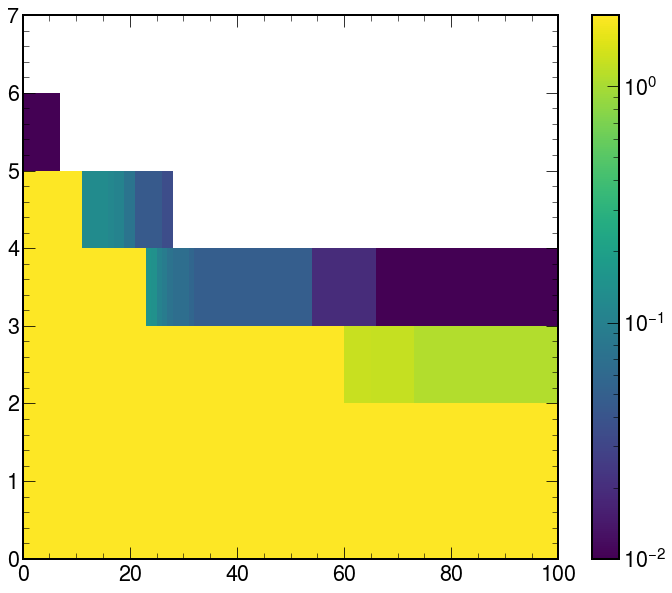

In [16]:
#hep.hist2dplot(B[:, 98, :].values(), norm=matplotlib.colors.LogNorm())
#plt.show()
fig, ax = plt.subplots(figsize=(12,10))
cb = plt.pcolormesh(np.sqrt(B_fitted[:, 49, :].variances().T), norm=matplotlib.colors.LogNorm(vmin=1e-2, vmax=2))
plt.colorbar(cb)
plt.show()
#hep.hist2dplot(B[:, 98, :].variances(), norm=matplotlib.colors.LogNorm())
#plt.show()

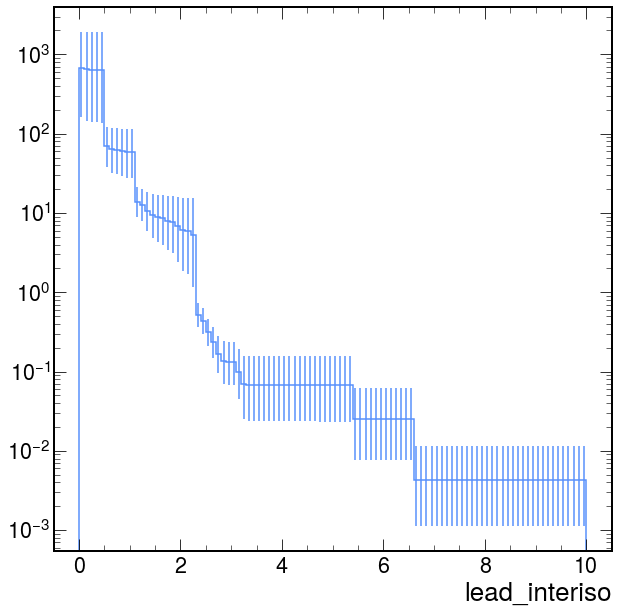

In [17]:
B_fitted[:, 49, 3].plot()
plt.yscale('log')

Now loop over the signal models

In [18]:
signals = get_signal_models_central()
significances = {}
max_indices = {}
with Progress() as progress:
    task_id = progress.add_task("Completed...", total=len(signals))
    with multiprocessing.Pool() as pool:
        results = pool.imap(signals_loop, signals)
        for result in results:
            significances[result[0]] = result[2]
            max_indices[result[0]] = result[1]
            progress.update(task_id, advance=1, refresh=True)
        
print(significances)

Completed... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00

{
    'GluGluToSUEP_mS125.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=243638, variance=0),
    'GluGluToSUEP_mS200.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=59451.3, variance=0),
    'GluGluToSUEP_mS300.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=15253.3, variance=0),
    'GluGluToSUEP_mS400.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=5331.83, variance=0),
    'GluGluToSUEP_mS500.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=1616.65, variance=0),
    'GluGluToSUEP_mS600.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=122.163, variance=0),
    'GluGluToSUEP_mS800.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=0.622758, variance=0),
    'GluGluToSUEP_mS1000.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=0.00481546, variance=0),
    'GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=1.2108e+07, variance=0),
    'GluGluToSUEP_mS200.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=1.35566e+07, variance=0),
    'GluGluToSUEP_mS300.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=1.44091e+07, variance=0),
    'GluGluToSUEP_mS400.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=1.40517e+07, variance=0),
    'GluGluToSUEP_mS500.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=1.23444e+07, variance=0),
    'GluGluToSUEP_mS600.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(50, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=1.07168

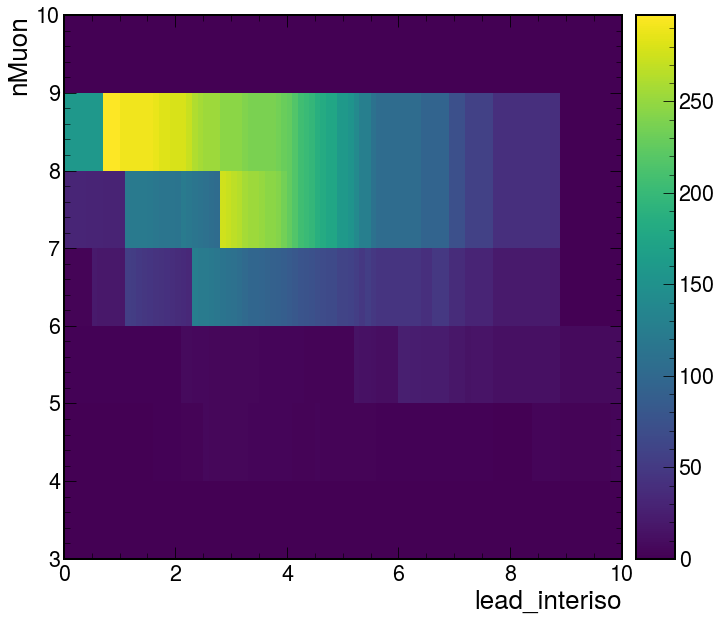

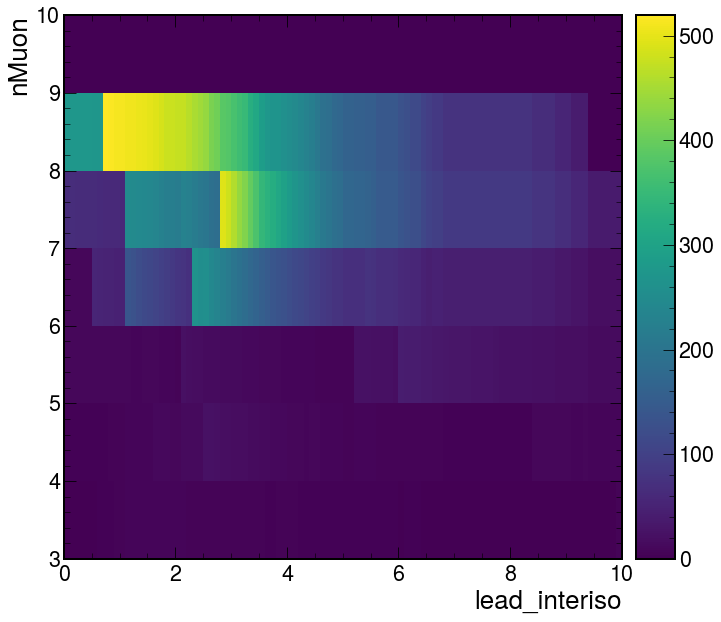

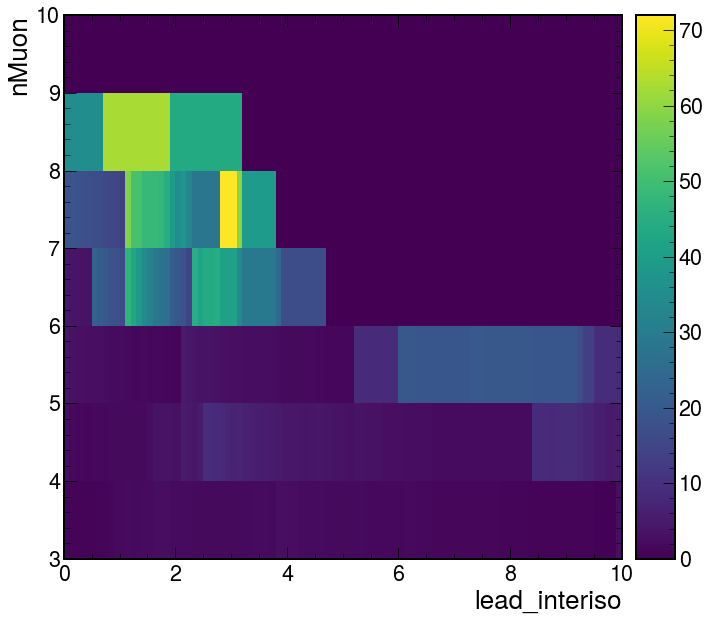

In [19]:
hep.hist2dplot(
    significances['GluGluToSUEP_mS125.000_mPhi1.400_T0.350_modehadronic_13TeV_2018'][:, 49, :],
    #norm=matplotlib.colors.LogNorm()
)
plt.show()
hep.hist2dplot(
    significances['GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modehadronic_13TeV_2018'][:, 49, :],
    #norm=matplotlib.colors.LogNorm()
)
plt.show()
hep.hist2dplot(
    significances['GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018'][:, 49, :],
    #norm=matplotlib.colors.LogNorm()
)
plt.show()

In [39]:
print(max_indices)

{
    'GluGluToSUEP_mS125.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': (28, 49, 4),
    'GluGluToSUEP_mS200.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': (28, 49, 4),
    'GluGluToSUEP_mS300.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': (7, 49, 5),
    'GluGluToSUEP_mS400.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': (7, 46, 5),
    'GluGluToSUEP_mS500.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': (7, 48, 5),
    'GluGluToSUEP_mS600.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': (26, 48, 3),
    'GluGluToSUEP_mS800.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': (22, 48, 2),
    'GluGluToSUEP_mS1000.000_mPhi1.000_T0.250_modeleptonic_13TeV_2018': (0, 41, 0),
    'GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS200.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS300.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS400.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS500.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS600.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS800.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS1000.000_mPhi2.000_T2.000_modeleptonic_13TeV_2018': (7, 48, 5),
    'GluGluToSUEP_mS125.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS200.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS300.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS400.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS500.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018': (7, 49, 5),
    'GluGluToSUEP_mS600.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018': (7, 44, 5),
    'GluGluToSUEP_mS800.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018': (7, 36, 5),
    'GluGluToSUEP_mS1000.000_mPhi2.000_T4.000_modeleptonic_13TeV_2018': (0, 34, 5),
    'GluGluToSUEP_mS125.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS200.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS300.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS400.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018': (7, 46, 5),
    'GluGluToSUEP_mS500.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018': (7, 48, 5),
    'GluGluToSUEP_mS600.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018': (7, 48, 5),
    'GluGluToSUEP_mS800.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018': (7, 42, 5),
    'GluGluToSUEP_mS1000.000_mPhi2.000_T8.000_modeleptonic_13TeV_2018': (0, 31, 5),
    'GluGluToSUEP_mS125.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS200.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS300.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS400.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS500.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS600.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS800.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS1000.000_mPhi4.000_T1.000_modeleptonic_13TeV_2018': (27, 40, 4),
    'GluGluToSUEP_mS125.000_mPhi4.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS200.000_mPhi4.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS300.000_mPhi4.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS400.000_mPhi4.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS500.000_mPhi4.000_T4.000_modeleptonic_13TeV_2018': (21, 28, 4),
    'GluGluToSUEP_mS600.000_mPhi4.000_T4.000_modeleptonic_13TeV_2018': (7, 49, 5),
    'GluGluToSUEP_mS800.000_mPhi4.000_T4.000_modeleptonic_13TeV_2018': (0, 33, 5),
    'GluGluToSUEP_mS1000.000_mPhi4.000_T4.000_modeleptonic_13

Get the set of best cut-sets (no duplicates). Then get them in cut values (not bin numbers).

In [40]:
max_indices_set = set(max_indices.values())

In [41]:
max_indices_set

{(0, 31, 5),
 (0, 32, 5),
 (0, 33, 5),
 (0, 34, 5),
 (0, 41, 0),
 (1, 9, 3),
 (4, 27, 3),
 (7, 35, 5),
 (7, 36, 5),
 (7, 37, 5),
 (7, 40, 5),
 (7, 42, 5),
 (7, 43, 5),
 (7, 44, 5),
 (7, 46, 5),
 (7, 47, 5),
 (7, 48, 5),
 (7, 49, 5),
 (10, 12, 4),
 (15, 48, 1),
 (21, 28, 4),
 (22, 48, 2),
 (26, 48, 3),
 (27, 40, 4),
 (28, 47, 4),
 (28, 48, 4),
 (28, 49, 4),
 (66, 47, 3)}

In [42]:
len(max_indices_set)

28

Total bkg evaluated for the cut-sets:

In [43]:
for idx in max_indices_set:
    print(
        f"cut using: {idx}, B = {np.round(B_fitted[idx].value, 3)} "
        f"± {np.round(np.sqrt(B_fitted[idx].variance), 3)}"
    )

cut using: (66, 47, 3), B = 0.0 ± 0.0

cut using: (7, 36, 5), B = 0.0 ± 0.0

cut using: (10, 12, 4), B = 0.0 ± 0.0

cut using: (7, 47, 5), B = 0.0 ± 0.0

cut using: (15, 48, 1), B = 20213.487 ± 4377.419

cut using: (7, 49, 5), B = 0.0 ± 0.0

cut using: (0, 32, 5), B = 0.0 ± 0.0

cut using: (7, 40, 5), B = 0.0 ± 0.0

cut using: (28, 48, 4), B = 0.0 ± 0.0

cut using: (7, 44, 5), B = 0.0 ± 0.0

cut using: (22, 48, 2), B = 272.735 ± 159.647

cut using: (0, 34, 5), B = 0.0 ± 0.0

cut using: (7, 42, 5), B = 0.0 ± 0.0

cut using: (7, 46, 5), B = 0.0 ± 0.0

cut using: (1, 9, 3), B = 0.168 ± 0.011

cut using: (7, 35, 5), B = 0.0 ± 0.0

cut using: (7, 37, 5), B = 0.0 ± 0.0

cut using: (7, 48, 5), B = 0.0 ± 0.0

cut using: (0, 31, 5), B = 0.0 ± 0.0

cut using: (28, 47, 4), B = 0.0 ± 0.0

cut using: (0, 41, 0), B = 17988261.238 ± 226574.541

cut using: (21, 28, 4), B = 0.0 ± 0.0

cut using: (26, 48, 3), B = 0.232 ± 0.09

cut using: (0, 33, 5), B = 0.0 ± 0.0

cut using: (27, 40, 4), B = 0.0 ± 0.0

cut using: (28, 49, 4), B = 0.0 ± 0.0

cut using: (4, 27, 3), B = 4.295 ± 0.421

cut using: (7, 43, 5), B = 0.0 ± 0.0

In [75]:
reduced_indices_set = [
    (0, 31, 5),
    (0, 32, 5),
    (0, 33, 5),
    (0, 34, 5),
    (1, 9, 3),
    (4, 27, 3),
    (7, 35, 5),
    (7, 36, 5),
    (7, 37, 5),
    (7, 40, 5),
    (7, 42, 5),
    (7, 43, 5),
    (7, 44, 5),
    (7, 46, 5),
    (7, 47, 5),
    (7, 48, 5),
    (7, 49, 5),
    (10, 12, 4),
    (21, 28, 4),
    (26, 48, 3),
    (27, 40, 4),
    (28, 47, 4),
    (28, 48, 4),
    (28, 49, 4),
    (66, 47, 3)
]

In [76]:
max_indices_list = list(reduced_indices_set)
edges = [a.edges for a in plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'].axes]
cut_values = []
for cut in max_indices_list:
    cut_values.append(
        tuple(
            [
                np.round(edges[0][cut[0]], 2),
                np.round(edges[1][cut[1]], 2),
                round(edges[2][cut[2]]),
            ]
        )
    )

Sort the cuts for increasing muon iso values:

In [77]:
sorted_indices = np.array(max_indices_list)[np.array(max_indices_list)[:, 1].argsort()]
sorted_values = np.array(cut_values)[np.array(cut_values)[:, 1].argsort()]

In [78]:
sorted_indices

array([[ 1,  9,  3],
       [10, 12,  4],
       [ 4, 27,  3],
       [21, 28,  4],
       [ 0, 31,  5],
       [ 0, 32,  5],
       [ 0, 33,  5],
       [ 0, 34,  5],
       [ 7, 35,  5],
       [ 7, 36,  5],
       [ 7, 37,  5],
       [ 7, 40,  5],
       [27, 40,  4],
       [ 7, 42,  5],
       [ 7, 43,  5],
       [ 7, 44,  5],
       [ 7, 46,  5],
       [ 7, 47,  5],
       [28, 47,  4],
       [66, 47,  3],
       [26, 48,  3],
       [28, 48,  4],
       [ 7, 48,  5],
       [ 7, 49,  5],
       [28, 49,  4]])

In [79]:
np.set_printoptions(suppress=True)
sorted_values

array([[ 0.1 ,  0.35,  6.  ],
       [ 1.  ,  0.52,  7.  ],
       [ 0.4 ,  4.17,  6.  ],
       [ 2.1 ,  4.79,  7.  ],
       [ 0.  ,  7.24,  8.  ],
       [ 0.  ,  8.32,  8.  ],
       [ 0.  ,  9.55,  8.  ],
       [ 0.  , 10.96,  8.  ],
       [ 0.7 , 12.59,  8.  ],
       [ 0.7 , 14.45,  8.  ],
       [ 0.7 , 16.6 ,  8.  ],
       [ 0.7 , 25.12,  8.  ],
       [ 2.7 , 25.12,  7.  ],
       [ 0.7 , 33.11,  8.  ],
       [ 0.7 , 38.02,  8.  ],
       [ 0.7 , 43.65,  8.  ],
       [ 0.7 , 57.54,  8.  ],
       [ 0.7 , 66.07,  8.  ],
       [ 2.8 , 66.07,  7.  ],
       [ 6.6 , 66.07,  6.  ],
       [ 2.6 , 75.86,  6.  ],
       [ 2.8 , 75.86,  7.  ],
       [ 0.7 , 75.86,  8.  ],
       [ 0.7 , 87.1 ,  8.  ],
       [ 2.8 , 87.1 ,  7.  ]])

In [80]:
len(reduced_indices_set)

25

Print table with significances:

In [81]:
signals = get_signal_models_central()
nTable = 2
nShow = 11
begin, end = 0, 9 #len(reduced_indices_set)
table = Table(title="Cut sets")
table.add_column("Signal point", justify="center", style="cyan", no_wrap=False, width=24)
# for i in range((nTable-1)*nShow, nTable*nShow):
for i in range(begin, end):
    table.add_column(
        f"{sorted_values[i][0]}\n{np.round(sorted_values[i][1], 1)}\n{sorted_values[i][2]}", 
        justify="center", 
        style="grey50", 
        no_wrap=False, 
        width=6
    )

bkg_yields = []
for cut in sorted_indices[begin:end]:
    bkg_yields.append(f"{B_fitted[tuple(cut)].value:.2f}")
table.add_row("bkg yield", *bkg_yields)
    
for signal in signals:
    yields = []
    max_yield = 0
    for cut in sorted_indices:
        cut_yield = significances[signal][tuple(cut)].value
        yields.append(cut_yield)
        if max_yield < cut_yield:
            max_yield = cut_yield
    yield_strs = []
    # for y in yields[((nTable-1)*nShow):(nTable*nShow)]:
    for y in yields[begin:end]:
        if (y / max_yield) >= 0.99:
            yield_strs.append(f"[red1][bold]{y:.0f}[/][/]")
        elif (y / max_yield) >= 0.9:
            yield_strs.append(f"[orange_red1]{y:.0f}[/]")
        else:
            yield_strs.append(f"{y:.0f}")
    signal_tag = (
        signal
        .replace("GluGluToSUEP_", "")
        .replace(".0_T", "_T")
        .replace(".00_T", "_T")
        .replace(".000", "")
        .replace("0_mode", "_")
        .replace("00_T", "_T")
        .replace("0_h", "_h")
        .replace("mode", "")
        .replace("leptonic", "lep")
        .replace("hadronic", "had")
        .replace("_13TeV_2018", "")
    )
    table.add_row(signal_tag, *yield_strs)
    
console = Console()
console.print(table)

                                                  Cut sets                                                   
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃                          ┃  0.1   ┃  1.0   ┃  0.4   ┃  2.1   ┃  0.0   ┃  0.0   ┃  0.0   ┃  0.0   ┃  0.7   ┃
┃                          ┃  0.4   ┃  0.5   ┃  4.2   ┃  4.8   ┃  7.2   ┃  8.3   ┃  9.6   ┃  11.0  ┃  12.6  ┃
┃       Signal point       ┃  6.0   ┃  7.0   ┃  6.0   ┃  7.0   ┃  8.0   ┃  8.0   ┃  8.0   ┃  8.0   ┃  8.0   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│        bkg yield         │  0.17  │  0.00  │  4.29  │  0.00  │  0.00  │  0.00  │  0.00  │  0.00  │  0.00  │
│  mS125_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS200_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS300_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS400_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS500_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS600_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS800_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS1000_mPhi1_T0.25_lep  │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│    mS125_mPhi2_T2_lep    │  502   │  831   │  1336  │  2784  │  2431  │  2469  │  2496  │  2512  │  2519  │
│    mS200_mPhi2_T2_lep    │  517   │  967   │  1352  │  3074  │  2629  │  2649  │  2661  │  2676  │  2677  │
│    mS300_mPhi2_T2_lep    │  411   │  866   │  1187  │  3043  │  2716  │  2724  │  2731  │  2736  │  2737  │
│    mS400_mPhi2_T2_lep    │  307   │  695   │  952   │  2627  │  2472  │  2478  │  2482  │  2484  │  2485  │
│    mS500_mPhi2_T2_lep    │  209   │  492   │  740   │  2119  │  2057  │  2061  │  2063  │  2065  │  2065  │
│    mS600_mPhi2_T2_lep    │  151   │  368   │  579   │  1682  │  1666  │  1668  │  1669  │  1670  │  1670  │
│    mS800_mPhi2_T2_lep    │   67   │  175   │  372   │  1082  │  1086  │  1086  │  1087  │  1087  │  1087  │
│   mS1000_mPhi2_T2_lep    │   30   │   89   │  252   │  728   │  732   │  732   │  732   │  732   │  732   │
│    mS125_mPhi2_T4_lep    │  1217  │  2156  │  1931  │  3942  │  3332  │  3353  │  3372  │  3387  │  3375  │
│    mS200_mPhi2_T4_lep    │  1253  │  2558  │  1862  │  4687  │  4274  │  4287  │  4297  │  4303  │  4295  │
│    mS300_mPhi2_T4_lep    │  1075  │  2352  │  1420  │  4045  │  3895  │  3902  │  3906  │  3908  │  3907  │
│    mS400_mPhi2_T4_lep    │  868   │  1958  │  1040  │  3073  │  3045  │  3048  │  3050  │  3051  │  3052  │
│    mS500_mPhi2_T4_lep    │  682   │  1563  │  771   │  2292  │  2289  │  2290  │  2291  │  2292  │  2292  │
│    mS600_mPhi2_T4_lep    │  538   │  1242  │  591   │  1749  │  1750  │  1751  │  1751  │  1751  │  1751  │
│    mS800_mPhi2_T4_lep    │

In [82]:
signals = get_signal_models_central()
nTable = 2
nShow = 11
begin, end = 9, 18 #len(reduced_indices_set)
table = Table(title="Cut sets")
table.add_column("Signal point", justify="center", style="cyan", no_wrap=False, width=24)
# for i in range((nTable-1)*nShow, nTable*nShow):
for i in range(begin, end):
    table.add_column(
        f"{sorted_values[i][0]}\n{np.round(sorted_values[i][1], 1)}\n{sorted_values[i][2]}", 
        justify="center", 
        style="grey50", 
        no_wrap=False, 
        width=6
    )

bkg_yields = []
for cut in sorted_indices[begin:end]:
    bkg_yields.append(f"{B_fitted[tuple(cut)].value:.2f}")
table.add_row("bkg yield", *bkg_yields)
    
for signal in signals:
    yields = []
    max_yield = 0
    for cut in sorted_indices:
        cut_yield = significances[signal][tuple(cut)].value
        yields.append(cut_yield)
        if max_yield < cut_yield:
            max_yield = cut_yield
    yield_strs = []
    # for y in yields[((nTable-1)*nShow):(nTable*nShow)]:
    for y in yields[begin:end]:
        if (y / max_yield) >= 0.99:
            yield_strs.append(f"[red1][bold]{y:.0f}[/][/]")
        elif (y / max_yield) >= 0.9:
            yield_strs.append(f"[orange_red1]{y:.0f}[/]")
        else:
            yield_strs.append(f"{y:.0f}")
    signal_tag = (
        signal
        .replace("GluGluToSUEP_", "")
        .replace(".0_T", "_T")
        .replace(".00_T", "_T")
        .replace(".000", "")
        .replace("0_mode", "_")
        .replace("00_T", "_T")
        .replace("0_h", "_h")
        .replace("mode", "")
        .replace("leptonic", "lep")
        .replace("hadronic", "had")
        .replace("_13TeV_2018", "")
    )
    table.add_row(signal_tag, *yield_strs)
    
console = Console()
console.print(table)

                                                  Cut sets                                                   
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃                          ┃  0.7   ┃  0.7   ┃  0.7   ┃  2.7   ┃  0.7   ┃  0.7   ┃  0.7   ┃  0.7   ┃  0.7   ┃
┃                          ┃  14.4  ┃  16.6  ┃  25.1  ┃  25.1  ┃  33.1  ┃  38.0  ┃  43.6  ┃  57.5  ┃  66.1  ┃
┃       Signal point       ┃  8.0   ┃  8.0   ┃  8.0   ┃  7.0   ┃  8.0   ┃  8.0   ┃  8.0   ┃  8.0   ┃  8.0   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│        bkg yield         │  0.00  │  0.00  │  0.00  │  0.00  │  0.00  │  0.00  │  0.00  │  0.00  │  0.00  │
│  mS125_mPhi1_T0.25_lep   │   0    │   0    │  129   │  157   │  157   │  176   │  187   │  222   │  241   │
│  mS200_mPhi1_T0.25_lep   │   0    │   32   │   32   │   32   │   32   │   32   │   32   │   72   │   78   │
│  mS300_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   21   │   30   │   30   │
│  mS400_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   15   │   21   │   21   │
│  mS500_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS600_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS800_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS1000_mPhi1_T0.25_lep  │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│    mS125_mPhi2_T2_lep    │  2536  │  2546  │  2565  │  2789  │  2574  │  2578  │  2580  │  2582  │  2583  │
│    mS200_mPhi2_T2_lep    │  2686  │  2692  │  2702  │  2970  │  2704  │  2705  │  2706  │  2707  │  2707  │
│    mS300_mPhi2_T2_lep    │  2739  │  2741  │  2744  │  2974  │  2745  │  2745  │  2745  │  2745  │  2745  │
│    mS400_mPhi2_T2_lep    │  2486  │  2487  │  2488  │  2605  │  2489  │  2489  │  2489  │  2489  │  2489  │
│    mS500_mPhi2_T2_lep    │  2066  │  2066  │  2067  │  2120  │  2067  │  2067  │  2067  │  2067  │  2067  │
│    mS600_mPhi2_T2_lep    │  1671  │  1671  │  1671  │  1689  │  1671  │  1671  │  1672  │  1672  │  1672  │
│    mS800_mPhi2_T2_lep    │  1087  │  1087  │  1087  │  1088  │  1087  │  1087  │  1087  │  1087  │  1087  │
│   mS1000_mPhi2_T2_lep    │  732   │  732   │  732   │  732   │  732   │  732   │  732   │  732   │  732   │
│    mS125_mPhi2_T4_lep    │  3382  │  3390  │  3403  │  3655  │  3408  │  3410  │  3411  │  3413  │  3413  │
│    mS200_mPhi2_T4_lep    │  4297  │  4301  │  4306  │  4490  │  4307  │  4308  │  4308  │  4309  │  4309  │
│    mS300_mPhi2_T4_lep    │  3908  │  3910  │  3911  │  3981  │  3911  │  3912  │  3912  │  3912  │  3912  │
│    mS400_mPhi2_T4_lep    │  3052  │  3053  │  3053  │  3059  │  3054  │  3054  │  3054  │  3054  │  3054  │
│    mS500_mPhi2_T4_lep    │  2292  │  2292  │  2293  │  2289  │[38;5;

In [83]:
signals = get_signal_models_central()
nTable = 2
nShow = 11
begin, end = 18, 25 #len(reduced_indices_set)
table = Table(title="Cut sets")
table.add_column("Signal point", justify="center", style="cyan", no_wrap=False, width=24)
# for i in range((nTable-1)*nShow, nTable*nShow):
for i in range(begin, end):
    table.add_column(
        f"{sorted_values[i][0]}\n{np.round(sorted_values[i][1], 1)}\n{sorted_values[i][2]}", 
        justify="center", 
        style="grey50", 
        no_wrap=False, 
        width=6
    )

bkg_yields = []
for cut in sorted_indices[begin:end]:
    bkg_yields.append(f"{B_fitted[tuple(cut)].value:.2f}")
table.add_row("bkg yield", *bkg_yields)
    
for signal in signals:
    yields = []
    max_yield = 0
    for cut in sorted_indices:
        cut_yield = significances[signal][tuple(cut)].value
        yields.append(cut_yield)
        if max_yield < cut_yield:
            max_yield = cut_yield
    yield_strs = []
    # for y in yields[((nTable-1)*nShow):(nTable*nShow)]:
    for y in yields[begin:end]:
        if (y / max_yield) >= 0.99:
            yield_strs.append(f"[red1][bold]{y:.0f}[/][/]")
        elif (y / max_yield) >= 0.9:
            yield_strs.append(f"[orange_red1]{y:.0f}[/]")
        else:
            yield_strs.append(f"{y:.0f}")
    signal_tag = (
        signal
        .replace("GluGluToSUEP_", "")
        .replace(".0_T", "_T")
        .replace(".00_T", "_T")
        .replace(".000", "")
        .replace("0_mode", "_")
        .replace("00_T", "_T")
        .replace("0_h", "_h")
        .replace("mode", "")
        .replace("leptonic", "lep")
        .replace("hadronic", "had")
        .replace("_13TeV_2018", "")
    )
    table.add_row(signal_tag, *yield_strs)
    
console = Console()
console.print(table)

                                         Cut sets                                          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃                          ┃  2.8   ┃  6.6   ┃  2.6   ┃  2.8   ┃  0.7   ┃  0.7   ┃  2.8   ┃
┃                          ┃  66.1  ┃  66.1  ┃  75.9  ┃  75.9  ┃  75.9  ┃  87.1  ┃  87.1  ┃
┃       Signal point       ┃  7.0   ┃  6.0   ┃  6.0   ┃  7.0   ┃  8.0   ┃  8.0   ┃  7.0   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│        bkg yield         │  0.00  │  0.00  │  0.23  │  0.00  │  0.00  │  0.00  │  0.00  │
│  mS125_mPhi1_T0.25_lep   │  262   │  107   │  116   │  278   │  258   │  290   │  299   │
│  mS200_mPhi1_T0.25_lep   │  108   │   0    │   44   │  108   │   78   │   96   │  117   │
│  mS300_mPhi1_T0.25_lep   │   30   │   0    │   19   │   38   │   30   │   38   │   38   │
│  mS400_mPhi1_T0.25_lep   │   21   │   0    │   11   │   21   │   21   │   21   │   21   │
│  mS500_mPhi1_T0.25_lep   │   0    │   0    │   7    │   0    │   19   │   19   │   0    │
│  mS600_mPhi1_T0.25_lep   │   0    │   0    │   4    │   0    │   0    │   0    │   0    │
│  mS800_mPhi1_T0.25_lep   │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│  mS1000_mPhi1_T0.25_lep  │   0    │   0    │   0    │   0    │   0    │   0    │   0    │
│    mS125_mPhi2_T2_lep    │  2746  │  1090  │  1147  │  2746  │  2584  │  2588  │  2748  │
│    mS200_mPhi2_T2_lep    │  2929  │  1159  │  1193  │  2930  │  2708  │  2708  │  2930  │
│    mS300_mPhi2_T2_lep    │  2946  │  1307  │  1123  │  2946  │  2745  │  2746  │  2946  │
│    mS400_mPhi2_T2_lep    │  2590  │  1401  │  941   │  2590  │  2489  │  2489  │  2590  │
│    mS500_mPhi2_T2_lep    │  2111  │  1363  │  748   │  2111  │  2067  │  2067  │  2111  │
│    mS600_mPhi2_T2_lep    │  1687  │  1253  │  592   │  1687  │  1672  │  1672  │  1687  │
│    mS800_mPhi2_T2_lep    │  1088  │  944   │  383   │  1088  │  1087  │  1087  │  1088  │
│   mS1000_mPhi2_T2_lep    │  732   │  687   │  261   │  732   │  732   │  732   │  732   │
│    mS125_mPhi2_T4_lep    │  3584  │  1264  │  1538  │  3584  │  3414  │  3415  │  3584  │
│    mS200_mPhi2_T4_lep    │  4434  │  2075  │  1695  │  4434  │  4309  │  4309  │  4434  │
│    mS300_mPhi2_T4_lep    │  3957  │  2443  │  1397  │  3957  │  3912  │  3912  │  3957  │
│    mS400_mPhi2_T4_lep    │  3052  │  2293  │  1050  │  3052  │  3054  │  3054  │  3052  │
│    mS500_mPhi2_T4_lep    │  2287  │  1941  │  787   │  2287  │  2293  │  2293  │  2287  │
│    mS600_mPhi2_T4_lep    │  1748  │  1592  │  605   │  1748  │  1751  │  1751  │  1748  │
│    mS800_mPhi2_T4_lep    │  1095  │  1061  │  384   │  1095  │  1095  │  1095  │  1095  │
│   mS1000_mPhi2_T4_lep    │  732   │  723   │  261   │  732   │  732   │  732   │  732   │
│    mS125_mPhi2_T8_lep    │  2834  │  984   │  1287  │  2834  │  3026  │  3026  │  2834  │
│    mS200_mPhi2_T8_lep    │  3906  │  1798  │  1526  │  3906  │  3989  │  3989  │  [3

Table with final hand-picked cuts:

In [92]:
final_sorted_values = [
    [  1.7 ,   0.11,   4.  ],
    [  0.  ,   0.63,   6.  ],
    [  5.5 ,   5.25,   5.  ],
    [  1.2 ,  25.12,   6.  ],
    [  2.3 , 275.42,   6.  ]
]
final_sorted_indices = [
    [17,  1,  0],
    [ 0, 20,  2],
    [55, 43,  1],
    [12, 60,  2],
    [23, 86,  2]
]
signals = get_signal_models()
nTable = 1
nShow = len(final_sorted_indices)
table = Table(title="Cut sets")
table.add_column("Signal point", justify="center", style="cyan", no_wrap=False, width=16)
for i in range((nTable-1)*nShow, nTable*nShow):
    table.add_column(
        f"{final_sorted_values[i][0]}\n"
        f"{np.round(final_sorted_values[i][1], 1)}\n"
        f"{final_sorted_values[i][2]}", 
        justify="center", 
        style="grey50", 
        no_wrap=False, 
        width=6
    )

for signal in signals:
    yields = []
    max_yield = 0
    for cut in final_sorted_indices:
        cut_yield = significances[signal][tuple(cut)].value
        yields.append(cut_yield)
        if max_yield < cut_yield:
            max_yield = cut_yield
    yield_strs = []
    for y in yields[((nTable-1)*nShow):(nTable*nShow)]:
        if math.isclose(y, max_yield):
            yield_strs.append(f"[red1][bold]{y:.0f}[/][/]")
        elif (y / max_yield) >= 0.9:
            yield_strs.append(f"[orange_red1]{y:.0f}[/]")
        else:
            yield_strs.append(f"{y:.0f}")
    signal_tag = (
        signal
        #.replace("SUEP-m", "mS")
        #.replace("SUEP_ggH-channel_mMed-", "mS")
        #.replace("_2018", "")
        #.replace("mMed", "mS")
        #.replace("mDark-", "mD")
        #.replace("temp-", "T")
        #.replace("decay-", "")
        #.replace("-dark", "_mD2_T2_dark")
        #.replace("darkPho", "dP")
        #.replace("Had", "H")
        .replace("SUEP-m", "")
        .replace("SUEP_ggH-channel_mMed-", "")
        .replace("_2018", "")
        .replace("mMed", "")
        .replace("mDark-", "")
        .replace("temp-", "")
        .replace("decay-", "")
        .replace("darkPho", "dP")
        .replace("Had", "H")
    )
    table.add_row(signal_tag, *yield_strs)
    
console = Console()
console.print(table)

                            Cut sets                             
┏━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃                  ┃  1.7   ┃  0.0   ┃  5.5   ┃  1.2   ┃  2.3   ┃
┃                  ┃  0.1   ┃  0.6   ┃  5.2   ┃  25.1  ┃ 275.4  ┃
┃   Signal point   ┃  4.0   ┃  6.0   ┃  5.0   ┃  6.0   ┃  6.0   ┃
┡━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│      125-dP      │  188   │  360   │  303   │  571   │  582   │
│      400-dP      │   95   │  269   │  319   │  381   │  427   │
│      750-dP      │   28   │  124   │  214   │  174   │  202   │
│     1000-dP      │   11   │   70   │  141   │  106   │  124   │
│     125-dPH      │   0    │   35   │   61   │  156   │  134   │
│     400-dPH      │   14   │   28   │   42   │  134   │  133   │
│     750-dPH      │   2    │   17   │   51   │  108   │  115   │
│     1000-dPH     │   0    │   7    │   47   │   83   │   91   │
│  125_1_0.25_dP   │   0    │   0    │   0    │   28   │   58   │
│   125_1_0.5_dP   │   0    │   0    │   0    │  102   │  119   │
│    125_1_1_dP    │   0    │   0    │   44   │  249   │  272   │
│    125_1_2_dP    │   76   │  125   │  219   │  459   │  480   │
│    125_1_4_dP    │  290   │  401   │  407   │  831   │  851   │
│   125_2_0.5_dP   │   0    │   0    │   51   │  237   │  254   │
│    125_2_1_dP    │   25   │   22   │  149   │  349   │  367   │
│    125_2_2_dP    │  187   │  351   │  282   │  572   │  580   │
│    125_2_4_dP    │  480   │  717   │  432   │  799   │  787   │
│    125_2_8_dP    │  507   │  718   │  352   │  707   │  657   │
│    125_4_1_dP    │   85   │  167   │  227   │  450   │  478   │
│    125_4_2_dP    │  359   │  528   │  342   │  632   │  636   │
│    125_4_4_dP    │  692   │  872   │  432   │  800   │  790   │
│    125_4_8_dP    │  779   │  852   │  341   │  689   │  643   │
│   125_4_16_dP    │  581   │  622   │  190   │  447   │  363   │
│    125_8_2_dP    │  581   │  791   │  443   │  812   │  838   │
│    125_8_4_dP    │  801   │  959   │  458   │  829   │  829   │
│    125_8_8_dP    │  842   │  903   │  356   │  684   │  633   │
│   125_8_16_dP    │  672   │  672   │  207   │  449   │  367   │
│   125_8_32_dP    │  501   │  472   │   64   │  275   │  190   │
│ 125_1.4_0.35_dPH │   0    │   0    │   0    │   16   │   52   │
│ 125_1.4_0.7_dPH  │   0    │   0    │   0    │   79   │   96   │
│ 125_1.4_1.4_dPH  │   0    │   0    │   0    │  104   │  108   │
│ 125_1.4_2.8_dPH  │   0    │   22   │   46   │  186   │  158   │
│ 125_1.4_5.6_dPH  │   82   │   60   │   42   │  210   │  181   │
│  125_2_0.5_dPH   │   0    │   0    │   0    │   69   │   96   │
│   125_2_1_dPH    │   0    │   0    │   25   │  110   │  114   │
│   125_2_2_dPH    │   0    │   22   │   22   │  153   │  122   │
│   125_2_4_dPH    │   65   │   72   │   60   │  183   │  148   │
│   125_2_8_dPH    │   90   │  116   │   45   │  175   │  136   │
│   125_4_1_dPH    │   0    │   22   │   23   │  166   │  149   │
│   125_4_2_dPH    │   76   │   96   │   39   │  171   │  141   │
│   125_4_4_dPH    │  174   │  164   │   51   │  186   │  159   │
│

In [93]:
# Initialize a table
table = Table(title="Cut sets")
table.add_column("Cut set", justify="center", style="cyan", no_wrap=True, width=8)
table.add_column(f"Muon_miniPFRelIso_all", justify="center", style="green", no_wrap=True, width=22)
table.add_column(f"nMuon", justify="center", style="green", no_wrap=True, width=8)
table.add_column(f"leading muon inter-isolation", justify="center", style="green", no_wrap=True, width=29)

cut_sets = [
    # (interiso, muon_iso, nMuon)
    (1.7,  0.11, 4),
    (0. ,  0.63, 6),
    (5.5,  5.25, 5),
    (1.2, 25.12, 6),
    (2.3, "inf", 6)

]

for i, cut_set in enumerate(cut_sets):
    table.add_row(f"{i+1}", f"≤ {cut_set[1]}", f"≥ {cut_set[2]}", f"≥ {cut_set[0]}")
    
console = Console()
console.print(table)

                                    Cut sets                                    
┏━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Cut set  ┃ Muon_miniPFRelIso_all  ┃  nMuon   ┃ leading muon inter-isolation  ┃
┡━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│    1     │         ≤ 0.11         │   ≥ 4    │             ≥ 1.7             │
│    2     │         ≤ 0.63         │   ≥ 6    │             ≥ 0.0             │
│    3     │         ≤ 5.25         │   ≥ 5    │             ≥ 5.5             │
│    4     │        ≤ 25.12         │   ≥ 6    │             ≥ 1.2             │
│    5     │         ≤ inf          │   ≥ 6    │             ≥ 2.3             │
└──────────┴────────────────────────┴──────────┴───────────────────────────────┘

In [43]:
print(h0.axes[-1].edges)
print(h0.values())
print(h0[6j:].axes[-1].edges)
print(h0[6j:].values())

[ 3.  4.  5.  6.  7.  8.  9. 10.]

[16641802.06517915   677868.34640658    18778.54184427      633.72539944
       10.93850169        0.                0.        ]

[ 6.  7.  8.  9. 10.]

[633.72539944  10.93850169   0.           0.        ]

In [30]:
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'].axes[1].edges

array([  0.1       ,   0.10715193,   0.11481536,   0.12302688,
         0.13182567,   0.14125375,   0.15135612,   0.16218101,
         0.17378008,   0.18620871,   0.19952623,   0.21379621,
         0.22908677,   0.24547089,   0.2630268 ,   0.28183829,
         0.30199517,   0.32359366,   0.34673685,   0.37153523,
         0.39810717,   0.42657952,   0.45708819,   0.48977882,
         0.52480746,   0.56234133,   0.60255959,   0.64565423,
         0.69183097,   0.74131024,   0.79432823,   0.85113804,
         0.91201084,   0.97723722,   1.04712855,   1.12201845,
         1.20226443,   1.28824955,   1.38038426,   1.47910839,
         1.58489319,   1.69824365,   1.81970086,   1.9498446 ,
         2.08929613,   2.23872114,   2.39883292,   2.57039578,
         2.7542287 ,   2.95120923,   3.16227766,   3.38844156,
         3.63078055,   3.89045145,   4.16869383,   4.46683592,
         4.78630092,   5.12861384,   5.49540874,   5.88843655,
         6.30957344,   6.76082975,   7.2443596 ,   7.76

In [31]:
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][]

Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(100, 0.1, 100, transform=log, name='muon_iso cut'),
  Regular(7, 3, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=8.06668e+08, variance=2.55395e+12) (WeightedSum(value=1.24016e+09, variance=3.73119e+12) with flow)

In [49]:
np.logspace(-1, 2, 51)[:-1] * 1.01

array([ 0.101     ,  0.11596352,  0.13314393,  0.15286969,  0.17551788,
        0.20152149,  0.23137763,  0.26565707,  0.30501512,  0.35020422,
        0.40208824,  0.46165907,  0.53005553,  0.60858518,  0.69874928,
        0.80227152,  0.92113095,  1.05759983,  1.21428708,  1.39418811,
        1.60074212,  1.83789787,  2.11018909,  2.42282125,  2.78177099,
        3.19390044,  3.66708835,  4.21038077,  4.83416393,  5.55036283,
        6.37266918,  7.3168032 ,  8.40081409,  9.64542512, 11.07442978,
       12.71514666, 14.59894168, 16.76182777, 19.24515325, 22.0963924 ,
       25.37005296, 29.12871818, 33.44424327, 38.39912903, 44.08809906,
       50.6199106 , 58.11943367, 66.73003825, 76.61633508, 87.96732259])

In [50]:
np.logspace(-1, 2, 51)[:-1]

array([ 0.1       ,  0.11481536,  0.13182567,  0.15135612,  0.17378008,
        0.19952623,  0.22908677,  0.2630268 ,  0.30199517,  0.34673685,
        0.39810717,  0.45708819,  0.52480746,  0.60255959,  0.69183097,
        0.79432823,  0.91201084,  1.04712855,  1.20226443,  1.38038426,
        1.58489319,  1.81970086,  2.08929613,  2.39883292,  2.7542287 ,
        3.16227766,  3.63078055,  4.16869383,  4.78630092,  5.49540874,
        6.30957344,  7.2443596 ,  8.31763771,  9.54992586, 10.96478196,
       12.58925412, 14.45439771, 16.59586907, 19.05460718, 21.87761624,
       25.11886432, 28.84031503, 33.11311215, 38.01893963, 43.65158322,
       50.11872336, 57.54399373, 66.0693448 , 75.8577575 , 87.096359  ])

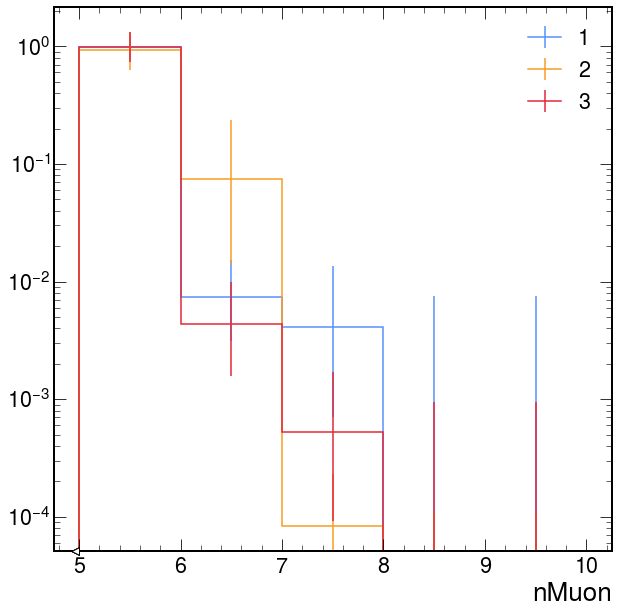

In [13]:
density=True
#plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][::sum, 49, 5j:].plot(label='full ≥4', density=density)
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][0:1j:sum, 49, 5j:].plot(label='1', density=density)
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][1j:2j:sum, 49, 5j:].plot(label='2', density=density)
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][2j::sum, 49, 5j:].plot(label='3', density=density)
plt.yscale('log')
plt.legend()

In [20]:
hep.set_style(hep.style.CMS)

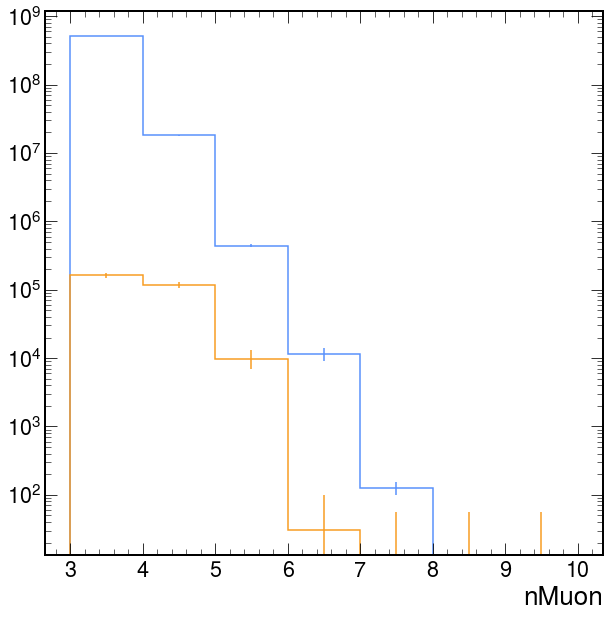

In [22]:
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][::sum, ::sum, :].plot()
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][1j::sum, 15j, :].plot()
plt.yscale('log')

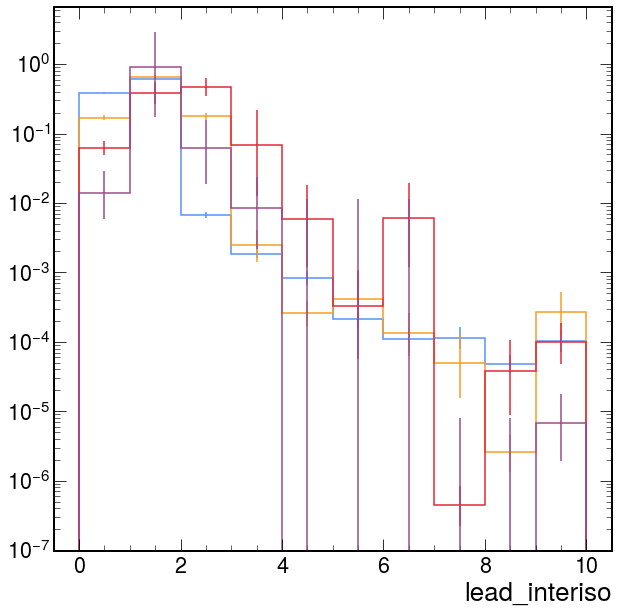

In [14]:
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][::10j, 99j, 3j].plot(density=True)
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][::10j, 99j, 4j].plot(density=True)
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][::10j, 99j, 5j].plot(density=True)
plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][::10j, 99j, 6j].plot(density=True)
plt.yscale('log')
plt.show()

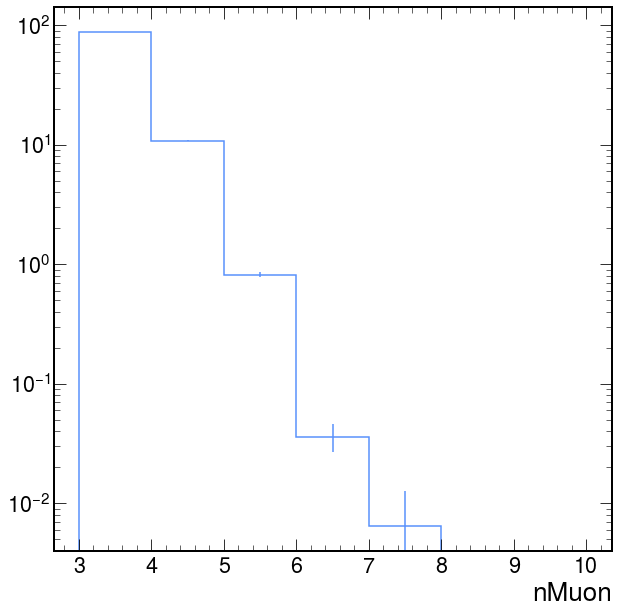

In [22]:
plots[
    "QCD_Pt-1000_MuEnrichedPt5_TuneCP5_13TeV-pythia8+" +
    "RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM_histograms_normalized_2018"
]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][::sum, 99j, :].plot()
plt.yscale('log')

In [26]:
def binomial(n, k, p):
    q = 1 - p
    coeff = math.factorial(n) / (math.factorial(k) * math.factorial(n - k))
    return coeff * (p**k) * (q**(n-k))

0.6162176331841609

0.831359991403792

0.9372807909818157

0.9861158274519425

0.9861158274519425

0.9861158274519425

0.9861158274519425

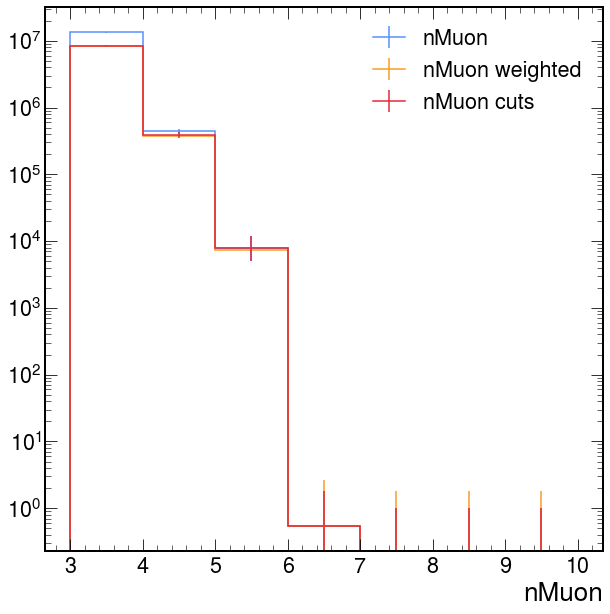

In [27]:
interiso_cut = 1j
muon_iso_cut = 4j

h0 = plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][::sum, muon_iso_cut, :].copy()
h1 = h0.copy().reset()
h2 = plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][interiso_cut::sum, muon_iso_cut, :].copy()

for i in range(3, 10):
    tot_num = h0[i*1j].value
    for j in range(3, i+1):
        weight = binomial(i, j, 1)
        h1[j*1j] += hist.accumulators.WeightedSum(weight * tot_num, weight * tot_num)

weight = 0
for i in range(3, 10):
    h = plots['QCD_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon'][:, 99j, i*1j]
    if (h.sum().value > 0) and (i < 7):
        h = h / h.sum().value
        weight = h[interiso_cut::sum].value
    print(weight)
    h1[i*1j] *= weight

h0.plot(label="nMuon")
h1.plot(label="nMuon weighted")
h2.plot(label="nMuon cuts")
plt.yscale('log')
plt.legend()
plt.show()
    
# fig = plt.gcf()
# grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

# main_ax = fig.add_subplot(grid[0])
# subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
# plt.setp(main_ax.get_xticklabels(), visible=False)
# ax_dict = {'main_ax': main_ax, 'ratio_ax': subplot_ax}

# main_ax_artists, sublot_ax_arists = h1.plot_ratio(
#     h2,
#     rp_ylabel=r"Ratio",
#     rp_num_label="nMuon weighted",
#     rp_denom_label="nMuon with cuts",
#     ax_dict=ax_dict,
# )
# main_ax.set_yscale('log')
# subplot_ax.set_ylim(0, 2)
# plt.show()

## N-1 plots

In [10]:
np.set_printoptions(suppress=True)

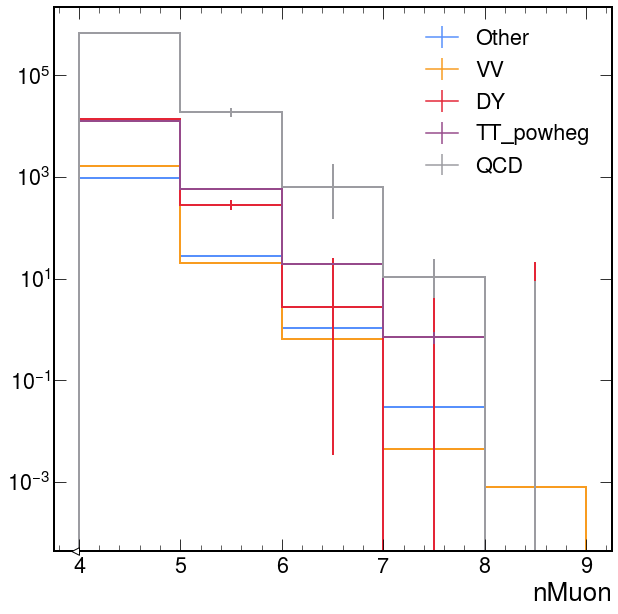

In [92]:
processes = [
    'Other_2018',
    'VV_2018',
    'DY_2018',
    'TT_powheg_2018',
    'QCD_2018',
]

hists = []
for p in processes:
    cut = (slice(None, None, sum), 99j, slice(4j, 9j, None))
    hists.append(plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][cut])
hep.histplot(
    hists,
    label=[p.replace("_2018", "") for p in processes],
    lw=2,
);
plt.legend()
plt.yscale('log')

(0.0, 4.0, 3)

Cut (internally): (slice(None, None, 5j), 4j, slice(3j, None, <built-in function sum>))


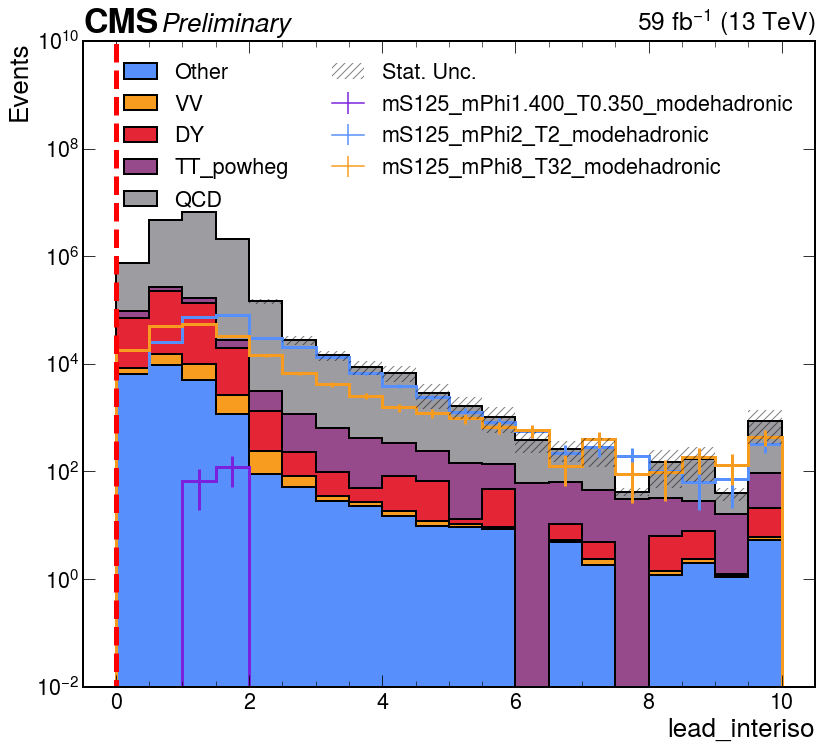

Cut (internally): (slice(0j, None, <built-in function sum>), 4j, slice(None, None, None))


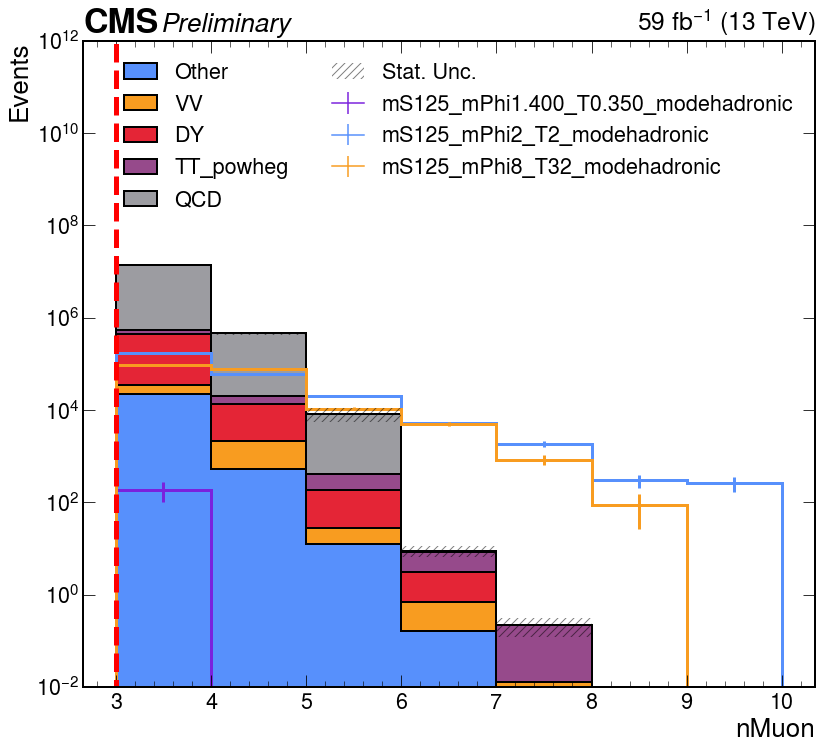

(0.0, 15.0, 3)

Cut (internally): (slice(None, None, 5j), 15j, slice(3j, None, <built-in function sum>))


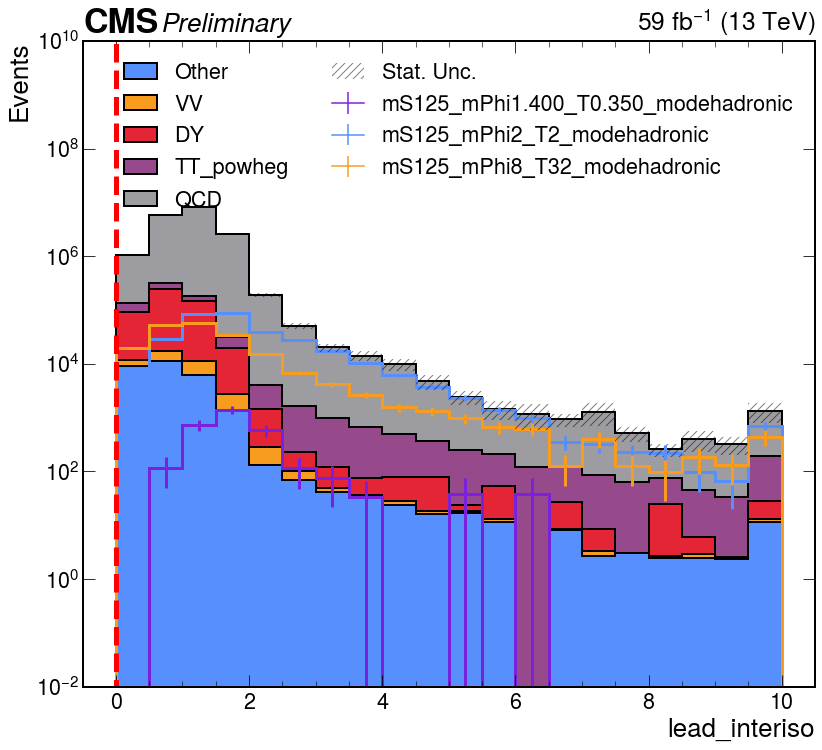

Cut (internally): (slice(0j, None, <built-in function sum>), 15j, slice(None, None, None))


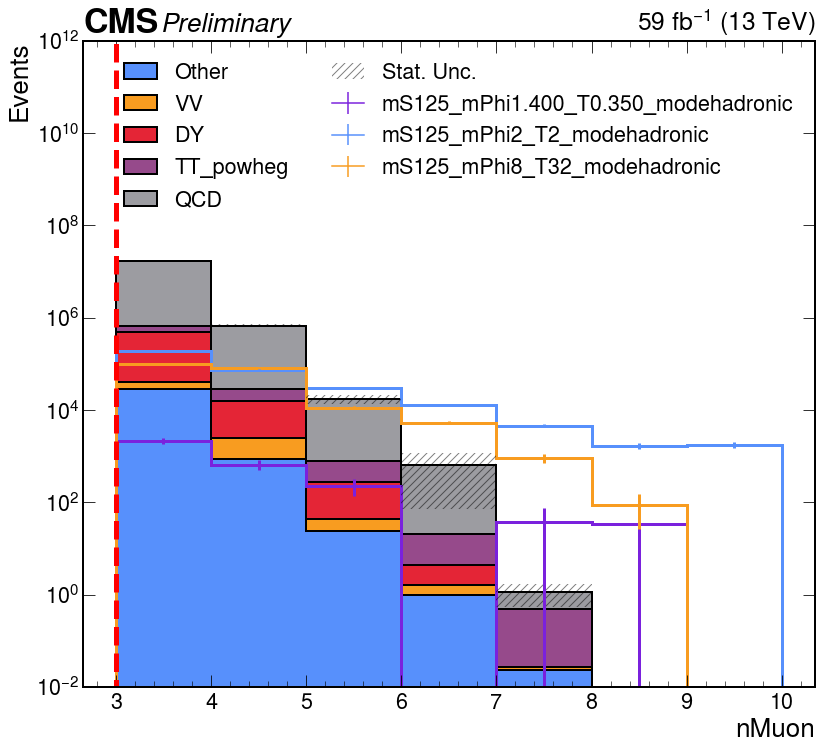

(0.0, 99.0, 3)

Cut (internally): (slice(None, None, 5j), 99j, slice(3j, None, <built-in function sum>))


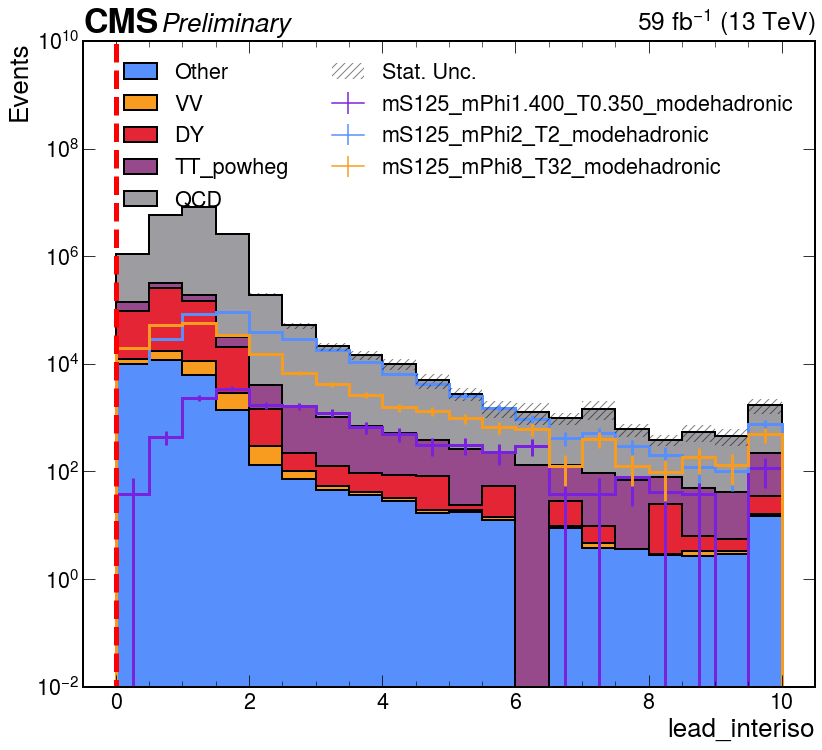

Cut (internally): (slice(0j, None, <built-in function sum>), 99j, slice(None, None, None))


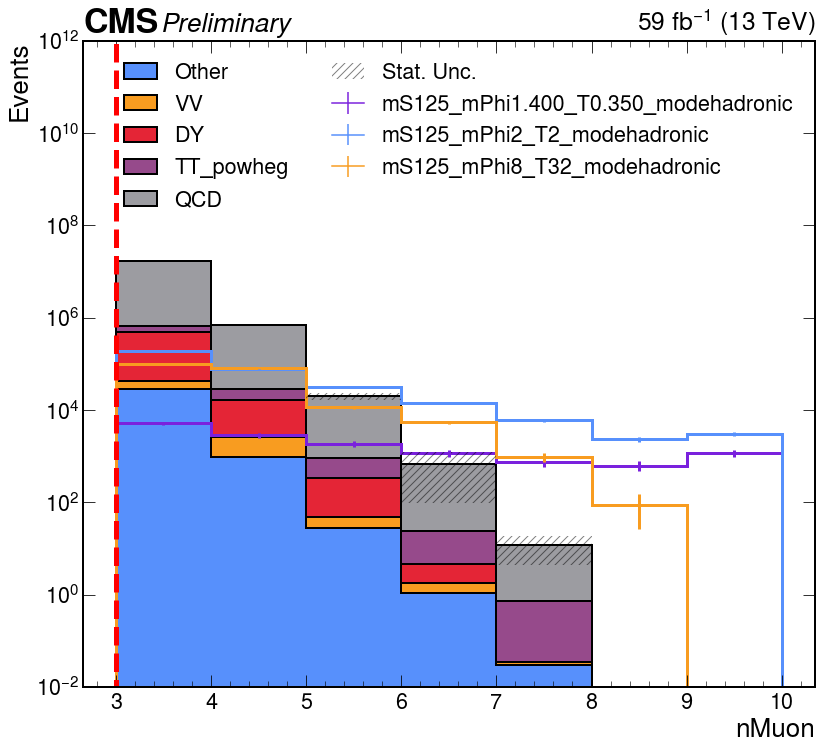

In [19]:
processes = [
    'Other_2018',
    'VV_2018',
    'DY_2018',
    'TT_powheg_2018',
    'QCD_2018',
]
signals = [
    'GluGluToSUEP_mS125.000_mPhi1.400_T0.350_modehadronic_13TeV_2018',
    'GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modehadronic_13TeV_2018',
    'GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018',
]
int_lumi = 59

cut_sets = [
    (0., 4., 3),
    (0., 15., 3),
    (0., 99., 3),
]

max_vals = [0, 0, 0, 0]

for cut in cut_sets:
    print(cut)
    plot_set = [
        [
            ('lead_interiso_vs_muon_iso_cut_vs_nMuon','lead_interiso'),
            {
                'cut': (slice(None, None, 5j), cut[1]*1j, slice(cut[2]*1j, None, sum)),
                #'cut': (slice(cut[0]*1j, None), cut[1]*1j, slice(cut[2]*1j, None, sum)),
                #'cut': (slice(None), cut[1]*1j, slice(None, None, sum)),
                'slc': slice(None, None, 5j),
                'ylim': (1e-2, 1e10),
                #'ylim': (-10, 10),
            }
        ],
        [
            ('lead_interiso_vs_muon_iso_cut_vs_nMuon','nMuon'),
            {
                'cut': (slice(cut[0]*1j, None, sum), cut[1]*1j, slice(None)),
                #'cut': (slice(None, None, sum), cut[1]*1j, slice(None)),
                'ylim': (1e-2, 1e12),
                #'ylim': (-10, 10),
            }
        ],
    ]
#     full_cut = (slice(cut[0]*1j, None, sum), cut[1]*1j, slice(cut[2]*1j, None, sum))
#     tot_yield = hist.accumulators.WeightedSum(0, 0)
#     for p in processes:
#         yield_p = plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][full_cut]
#         if yield_p.value < 0:
#             yield_p = hist.accumulators.WeightedSum(0, yield_p.variance)
#         tot_yield += yield_p
#         print(f"\t{p}: {plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][full_cut]}\n")
#     print(f"Tot B: {tot_yield.value:.2f} ± {np.sqrt(tot_yield.variance):.2f}")
    for plot_i in plot_set:
        if plot_i[0][0] not in plots[processes[0]].keys():
            continue
        #print("Plotting: ", plot_i[0])
        #print(plot_i[1]["cut"])
        #print("yields:")
#         cut_i = plot_i[1]['cut']
#         print(cut_i)
#         tot_yields = plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][cut_i].copy().reset()
#         for p in processes:
#             print(p)
#             print(plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][cut_i].values())
#             print(plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][cut_i].variances())
#             tot_yields += plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][cut_i]
#         print("Total yields:")
#         print(tot_yields.values())
#         print(tot_yields.variances())    
#         for s_i, s in enumerate(signals):
#             temp_val = plots[s]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][cut_i].sum().value
#             if temp_val > max_vals[s_i]:
#                 max_vals[s_i] = temp_val
#             print(
#                 f"\t{s.replace('_2018','').replace('SUEP_ggH-channel_','')}: {temp_val:.0f}\n"
#             )
        # Stack with ratio for processes 
        fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(12, 11))
        plot_utils_extras.plot_stack(
            plots=plots, 
            bkg_list=processes, 
            sig_list=signals,
            label=plot_i[0],
            ylog=True,
            override_slice=False,
            fig=fig,
            ax=ax,
            int_lumi=int_lumi,
            **plot_i[1]
        )
        if plot_i[0][1] == 'lead_interiso':
            plt.plot([cut[0], cut[0]], [0, 1e15], c='r', lw=5, ls='--')
        elif plot_i[0][1] == 'nMuon':
            plt.plot([cut[2], cut[2]], [0, 1e15], c='r', lw=5, ls='--')
        plt.tight_layout()
        plt.show()
# #print(max_vals)

(0.0, 99.0, 3)

QCD_2018: WeightedSum(value=1.73396e+07, variance=4.70896e+10)

Tot B: 17339584.64 ± 217001.33

(slice(0j, None, <built-in function sum>), 99j, slice(None, None, None))

Cut (internally): (slice(0j, None, <built-in function sum>), 99j, slice(None, None, None))


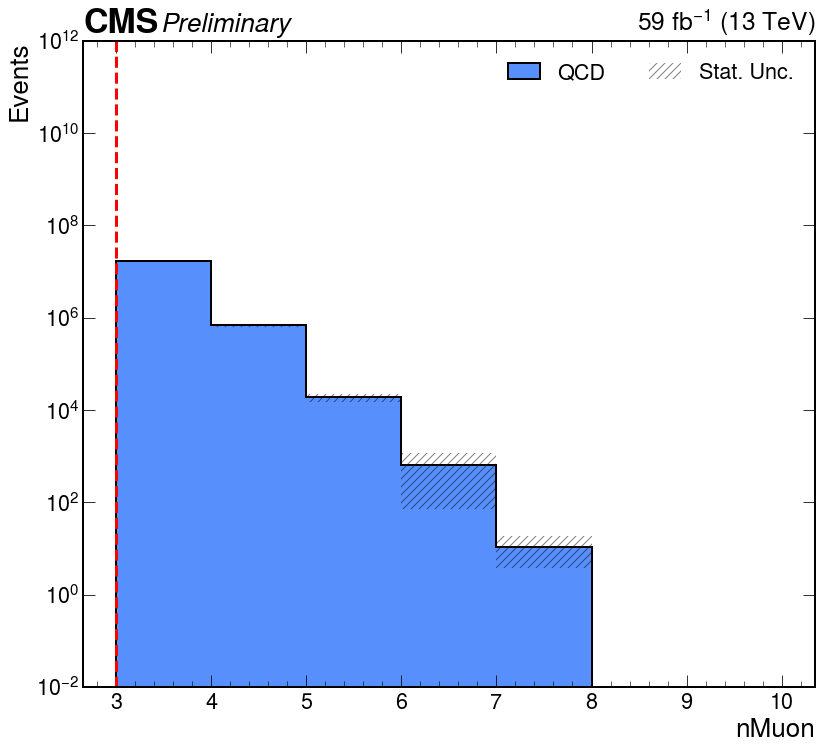

In [20]:
processes = [
    'QCD_2018',
]

int_lumi = 59

cut_sets = [
    (0., 99., 3),
]

max_vals = [0, 0, 0, 0]

for cut in cut_sets:
    print(cut)
    plot_set = [
#         [
#             ('lead_interiso_vs_muon_iso_cut_vs_nMuon','lead_interiso'),
#             {
#                 'cut': (slice(None), cut[1]*1j, slice(cut[2]*1j, None, sum)),
#                 #'cut': (slice(cut[0]*1j, None), cut[1]*1j, slice(cut[2]*1j, None, sum)),
#                 #'cut': (slice(None), cut[1]*1j, slice(None, None, sum)),
#                 'slc': slice(None, None, 5j),
#                 'ylim': (1e-2, 1e9),
#             }
#         ],
        [
            ('lead_interiso_vs_muon_iso_cut_vs_nMuon','nMuon'),
            {
                'cut': (slice(cut[0]*1j, None, sum), cut[1]*1j, slice(None)),
                #'cut': (slice(None, None, sum), cut[1]*1j, slice(None)),
                'ylim': (1e-2, 1e12),
            }
        ],
    ]
    full_cut = (slice(cut[0]*1j, None, sum), cut[1]*1j, slice(cut[2]*1j, None, sum))
    tot_yield = hist.accumulators.WeightedSum(0, 0)
    for p in processes:
        yield_p = plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][full_cut]
        if yield_p.value < 0:
            yield_p = hist.accumulators.WeightedSum(0, yield_p.variance)
        tot_yield += yield_p
        print(f"\t{p}: {plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][full_cut]}\n")
    print(f"Tot B: {tot_yield.value:.2f} ± {np.sqrt(tot_yield.variance):.2f}")
    for plot_i in plot_set:
        if plot_i[0][0] not in plots[processes[0]].keys():
            continue
        #print("Plotting: ", plot_i[0])
        #print(plot_i[1]["cut"])
        #print("yields:")
        cut_i = plot_i[1]['cut']
        print(cut_i)
#         for s_i, s in enumerate(signals):
#             temp_val = plots[s]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][cut_i].sum().value
#             if temp_val > max_vals[s_i]:
#                 max_vals[s_i] = temp_val
#             print(
#                 f"\t{s.replace('_2018','').replace('SUEP_ggH-channel_','')}: {temp_val:.0f}\n"
#             )
        # Stack with ratio for processes 
        fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(12, 11))
        plot_utils_extras.plot_stack(
            plots=plots, 
            bkg_list=processes, 
            label=plot_i[0],
            ylog=True,
            override_slice=False,
            fig=fig,
            ax=ax,
            int_lumi=int_lumi,
            **plot_i[1]
        )
        if plot_i[0][1] == 'lead_interiso':
            plt.plot([cut[0], cut[0]], [0, 1e15], c='r', lw=3, ls='--')
        elif plot_i[0][1] == 'nMuon':
            plt.plot([cut[2], cut[2]], [0, 1e15], c='r', lw=3, ls='--')
        plt.tight_layout()
        plt.show()
# #print(max_vals)

(1.1, 200.0, 7, 10000000000.0)

Plotting: 
('lead_interiso_vs_muon_iso_cut_vs_nMuon', 'nMuon')

yields:

QCD_2018: WeightedSum(value=5.87904e+06, variance=5.04546e+09)

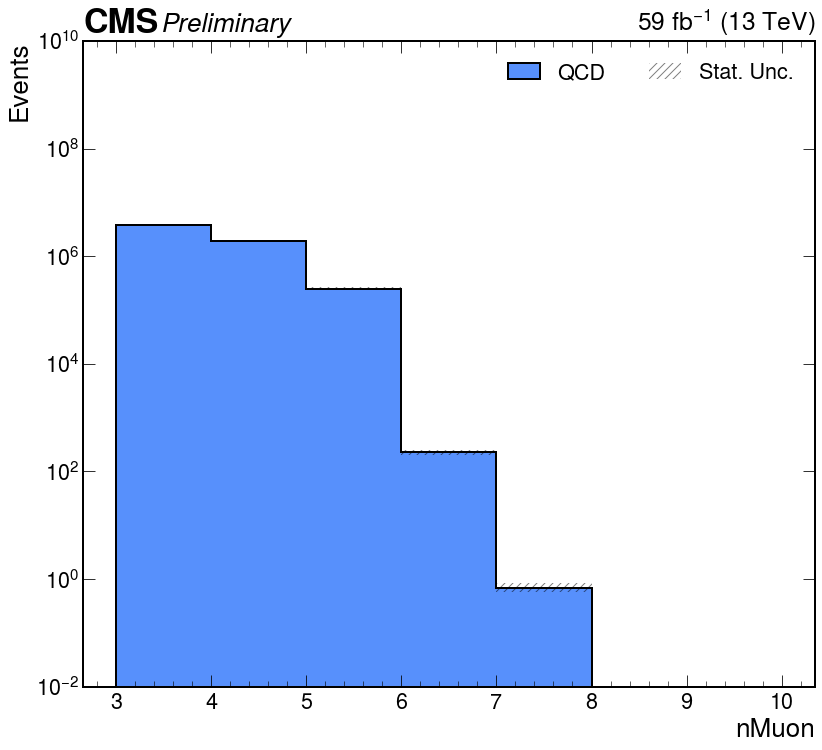

(0.0, 200.0, 3, 10000000000.0)

Plotting: 
('lead_interiso_vs_muon_iso_cut_vs_nMuon', 'nMuon')

yields:

QCD_2018: WeightedSum(value=4.33489e+08, variance=1.17724e+12)

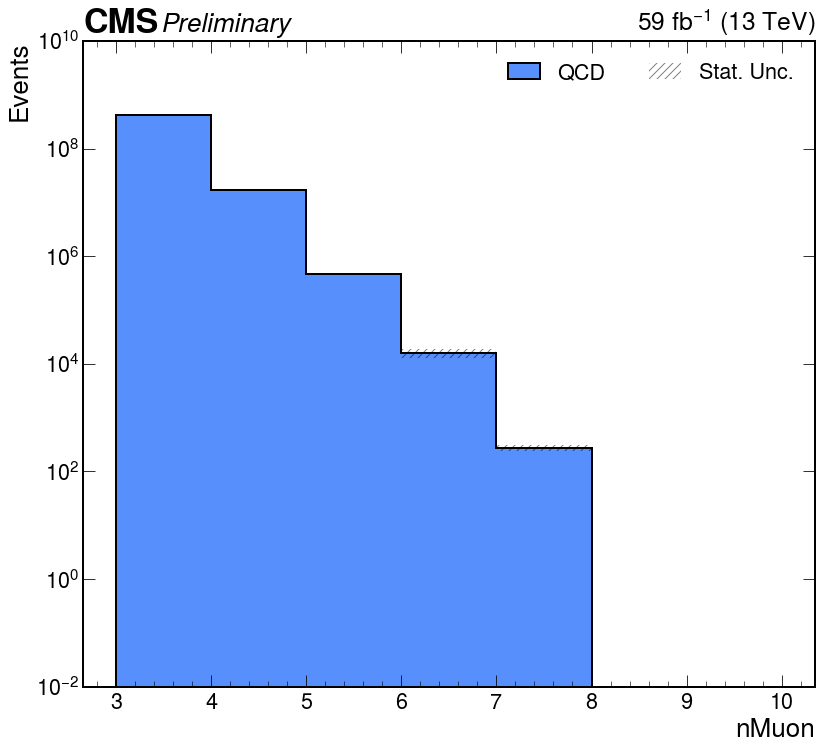

In [29]:
processes = [
    'QCD_2018',
]
signals = [
    #'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018',
]
int_lumi = 59

cut_sets_asimov = [
#     (1.7,  0.11, 4, 1e8),
#     (0. ,  0.63, 6, 1e8),
#     (5.5,  5.25, 5, 1e8),
#     (1.2, 25.12, 6, 1e8),
#     (2.3, 200.0, 6, 1e8),
    (1.1 , 99.0, 7, 1e10),
    (0. , 99.0, 3, 1e10),
]

for cut in cut_sets_asimov:
    print(cut)
    plot_set = [
        [
            ('lead_interiso_vs_muon_iso_cut_vs_nMuon','nMuon'),
            {
                'cut': (slice(cut[0]*1j, None, sum), cut[1]*1j, slice(None)),
                'ylim': (1e-2, 1e10),
            }
        ],
    ]
    for plot_i in plot_set:
        if plot_i[0][0] not in plots[processes[0]].keys():
            continue
        print("Plotting: ", plot_i[0])

        print("yields:")
        cut = plot_i[1]['cut']
        for p in processes:
            print(f"\t{p}: {plots[p]['lead_interiso_vs_muon_iso_cut_vs_nMuon'][cut].sum()}")
        # Stack with ratio for processes
        fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(12, 11))
        plot_utils_extras.plot_stack(
            plots=plots, 
            bkg_list=processes, 
            sig_list=signals,
            label=plot_i[0],
            ylog=True,
            override_slice=False,
            fig=fig,
            ax=ax,
            int_lumi=int_lumi,
            **plot_i[1]
        )
        plt.tight_layout()
        plt.show()

In [43]:
plots[
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018'
]['lead_interiso_vs_muon_iso_cut_vs_nMuon'].project('lead_interiso')

Hist(Regular(100, 0, 10, name='lead_interiso'), storage=Weight()) # Sum: WeightedSum(value=8.35869e+06, variance=2.05991e+09)

In [141]:
hep.__version__

'0.3.31'

## Find best cut values

In [227]:
#np.logspace(np.log10(0.1), np.log10(1000), 101)[30:-2]
np.logspace(np.log10(1), np.log10(190.546072), 58)#[:-2]

array([  1.        ,   1.0964782 ,   1.20226443,   1.31825674,
         1.44543977,   1.58489319,   1.73780083,   1.90546072,
         2.08929613,   2.29086765,   2.51188643,   2.7542287 ,
         3.01995172,   3.31131122,   3.63078055,   3.98107171,
         4.36515832,   4.78630092,   5.2480746 ,   5.75439938,
         6.30957345,   6.91830971,   7.58577575,   8.31763771,
         9.1201084 ,  10.        ,  10.96478197,  12.02264435,
        13.18256739,  14.45439772,  15.84893193,  17.3780083 ,
        19.05460719,  20.89296132,  22.90867654,  25.11886433,
        27.54228705,  30.19951722,  33.11311217,  36.3078055 ,
        39.81071709,  43.65158326,  47.86300927,  52.48074607,
        57.54399378,  63.0957345 ,  69.18309715,  75.85775757,
        83.17637719,  91.20108402, 100.00000009, 109.64781972,
       120.22644358, 131.82567399, 144.54397722, 158.48931941,
       173.78008306, 190.546072  ])

In [99]:
#np.logspace(np.log10(1.58489319), np.log10(1000), 71)[:-2] * 1.01
np.logspace(np.log10(0.1), np.log10(1000), 101)[:-2] #* 1.01

array([1.00000000e-01, 1.09647820e-01, 1.20226443e-01, 1.31825674e-01,
       1.44543977e-01, 1.58489319e-01, 1.73780083e-01, 1.90546072e-01,
       2.08929613e-01, 2.29086765e-01, 2.51188643e-01, 2.75422870e-01,
       3.01995172e-01, 3.31131121e-01, 3.63078055e-01, 3.98107171e-01,
       4.36515832e-01, 4.78630092e-01, 5.24807460e-01, 5.75439937e-01,
       6.30957344e-01, 6.91830971e-01, 7.58577575e-01, 8.31763771e-01,
       9.12010839e-01, 1.00000000e+00, 1.09647820e+00, 1.20226443e+00,
       1.31825674e+00, 1.44543977e+00, 1.58489319e+00, 1.73780083e+00,
       1.90546072e+00, 2.08929613e+00, 2.29086765e+00, 2.51188643e+00,
       2.75422870e+00, 3.01995172e+00, 3.31131121e+00, 3.63078055e+00,
       3.98107171e+00, 4.36515832e+00, 4.78630092e+00, 5.24807460e+00,
       5.75439937e+00, 6.30957344e+00, 6.91830971e+00, 7.58577575e+00,
       8.31763771e+00, 9.12010839e+00, 1.00000000e+01, 1.09647820e+01,
       1.20226443e+01, 1.31825674e+01, 1.44543977e+01, 1.58489319e+01,
      

In [114]:
(
    np.round(np.logspace(np.log10(1), np.log10(190.546072), 58)[:-2] * 1.01, 2) 
    - np.logspace(np.log10(1), np.log10(190.546072), 58)[:-2]
)

array([0.01      , 0.0135218 , 0.00773557, 0.01174326, 0.01456023,
       0.01510681, 0.02219917, 0.01453928, 0.02070387, 0.01913235,
       0.02811357, 0.0257713 , 0.03004828, 0.02868878, 0.03921945,
       0.03892829, 0.04484168, 0.04369908, 0.0519254 , 0.05560062,
       0.06042655, 0.07169029, 0.07422425, 0.08236229, 0.0898916 ,
       0.1       , 0.10521803, 0.11735565, 0.12743261, 0.14560228,
       0.16106807, 0.1719917 , 0.19539281, 0.20703868, 0.23132346,
       0.25113567, 0.27771295, 0.30048278, 0.32688783, 0.3621945 ,
       0.39928291, 0.43841674, 0.47699073, 0.52925393, 0.57600622,
       0.6342655 , 0.68690285, 0.76224243, 0.83362281, 0.90891598,
       0.99999991, 1.09218028, 1.20355642, 1.31432601, 1.44602278,
       1.58068059])

In [159]:
def find_points():
    processes = [
        'VV_2018',
        'TTJets_2018',
        'DY_NLO_all_2018',
        'QCD_Pt_MuEnriched_2018',
    ]
    hist_name = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'
    nMuon_vals = list(range(4, 10))
    lead_interiso_vals = plots['VV_2018'][hist_name].axes[0].edges[:-1:][::-1]
    # muon_iso_cuts = np.round(np.logspace(np.log10(1.58489319), np.log10(1000), 71)[:-2] * 1.01, 2) * 1j
    # muon_iso_cuts = np.round(np.logspace(np.log10(0.1), np.log10(1000), 101)[:-2] * 1.01, 3) * 1j
    # muon_iso_cuts = np.round(np.logspace(np.log10(1), np.log10(190.546072), 58) * 1.01, 2) * 1j
    muon_iso_cuts_man = [1.8j, 2j, 2.5j, 3j, 4j, 5j, 7j, 9j, 12j, 15j, 18j, 900j]
    points = {}
    for iso_cut in muon_iso_cuts_man:
        out_arr = []
        # print(f"cut: {iso_cut}")
        for nMuon in nMuon_vals:
            tot_yield = hist.accumulators.WeightedSum(10, 10) # initiate using value > threshold
            interiso_prev = 10
            for interiso in lead_interiso_vals: 
                tot_yield_prev = tot_yield
                tot_yield = hist.accumulators.WeightedSum()
                for p in processes:
                    proc_yield = plots[p][hist_name][(interiso*1j)::sum, iso_cut, (nMuon*1j)::sum]
                    if proc_yield.value < 0:
                        proc_yield = hist.accumulators.WeightedSum(0, proc_yield.variance)
                    tot_yield += proc_yield
                if (tot_yield.value >= threshold) and (tot_yield_prev.value < threshold):
                    out_arr.append((round(interiso_prev, 1), nMuon))
                    #print(f"\t({nMuon}, {interiso_prev:.1f}), {tot_yield_prev}")
                    break
                elif tot_yield.value >= threshold:
                    break
                interiso_prev = interiso 
            if math.isclose(interiso_prev, 0.0) and (tot_yield.value < threshold):
                out_arr.append((round(interiso_prev, 1), nMuon))
                #print(f"\t({nMuon}, {interiso_prev}), {tot_yield}")
                break
        points[iso_cut] = out_arr[::-1]
    return points

In [160]:
#points_1p0 = find_points(threshold = 1.0)
points_0p5_man = find_points(threshold = 0.5)

In [161]:
pprint(points_0p5_man)

{
│   1.8j: [(0.0, 7), (0.1, 6), (5.0, 5)],
│   2j: [(0.0, 7), (0.1, 6), (5.0, 5)],
│   2.5j: [(0.0, 7), (0.4, 6), (5.0, 5)],
│   3j: [(0.0, 7), (0.4, 6), (5.0, 5)],
│   4j: [(0.0, 7), (0.5, 6), (9.2, 5)],
│   5j: [(0.0, 7), (1.1, 6), (9.2, 5)],
│   7j: [(0.0, 8), (0.7, 7), (1.1, 6), (9.5, 5)],
│   9j: [(0.0, 8), (0.7, 7), (1.4, 6), (9.5, 5)],
│   12j: [(0.0, 8), (0.7, 7), (1.5, 6), (9.5, 5)],
│   15j: [(0.0, 8), (0.7, 7), (1.5, 6)],
│   18j: [(0.0, 8), (0.7, 7), (2.5, 6)],
│   900j: [(0.0, 8), (1.1, 7), (2.5, 6)]
}

In [49]:
plots['VV_2018']['lead_interiso_vs_muon_iso_cut_vs_nMuon']

Hist(
  Regular(100, 0, 10, name='lead_interiso'),
  Regular(100, 0.1, 1000, transform=log, name='muon_iso cut'),
  Regular(6, 4, 10, name='nMuon'),
  storage=Weight()) # Sum: WeightedSum(value=151543, variance=1570.51) (WeightedSum(value=153202, variance=1592.71) with flow)

In [107]:
ROOT.RooStats.AsimovSignificance(100, 0, 1)

nan

In [30]:
np.argmax(significance.values())

1310

In [31]:
np.unravel_index(np.argmax(significance.values(), axis=None), significance.values().shape)

(2, 18, 2)

In [163]:
def convert_points_to_plot(points):
    line_x, line_y = [], []
    for i in range(len(points)):
        line_x.append(points[i][0])
        line_y.append(points[i][1])
        if i < len(points)-1:
            line_x.append(points[i+1][0])
            line_y.append(points[i][1]) 
    line_x.append(10)
    line_y.append(points[-1][1])
    return line_x, line_y

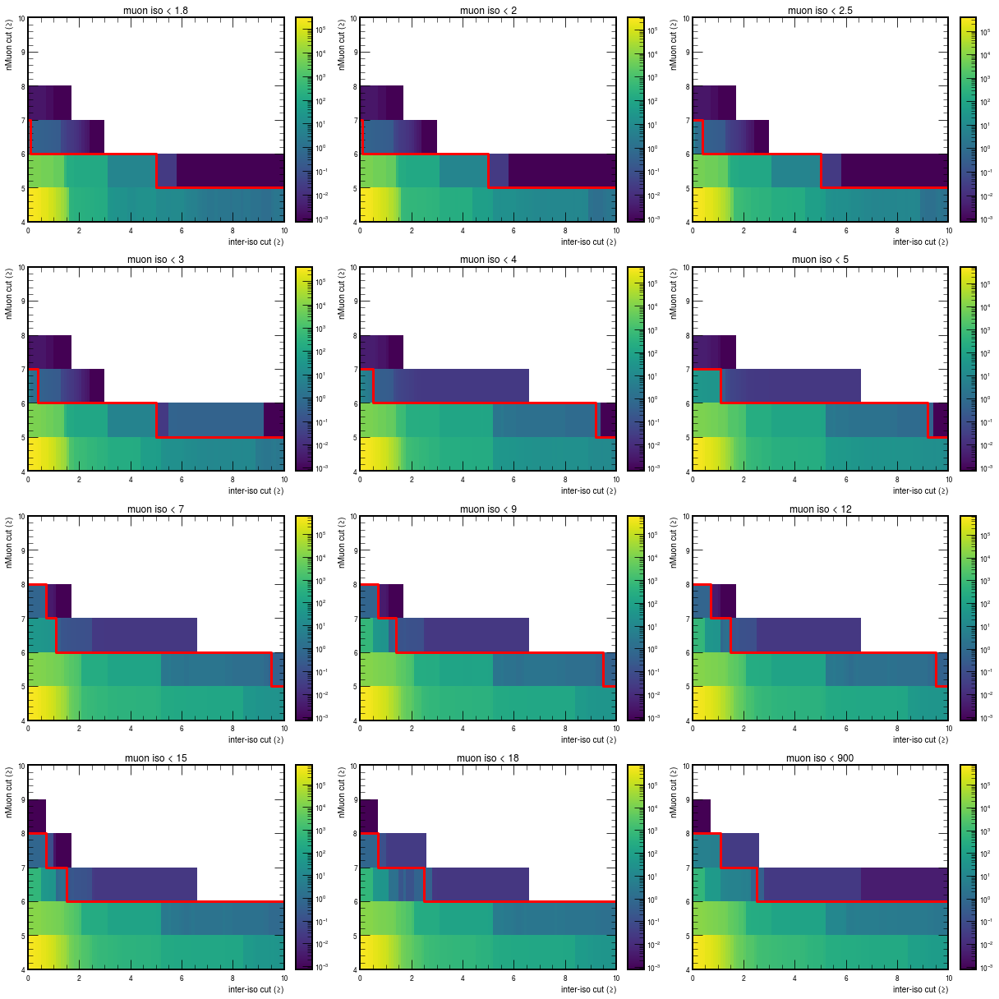

In [168]:
processes = [
    'VV_2018',
    'TTJets_2018',
    'DY_NLO_all_2018',
    'QCD_Pt_MuEnriched_2018',
]
hist_name = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'
muon_iso_cuts_man = [1.8j, 2j, 2.5j, 3j, 4j, 5j, 7j, 9j, 12j, 15j, 18j, 900j]
 
fig, axs = plt.subplots(ncols=3, nrows=4, figsize=(17, 17))
ax_i, ax_j = 0, 0
for iso_cut in muon_iso_cuts_man:
    if ax_i == 3:
        ax_i = 0
        ax_j += 1
    h_bkg_cumsum =  plots['VV_2018'][hist_name][:, iso_cut, :].copy().reset()
    for x in range(100):
        for y in range(6):
            for p in processes:
                proc_yield = plots[p][hist_name][x::sum, iso_cut, y::sum]
                if proc_yield.value < 0:
                    proc_yield = hist.accumulators.WeightedSum(0, proc_yield.variance)
                h_bkg_cumsum[x, y] += proc_yield
    hep.hist2dplot(h_bkg_cumsum, ax=axs[ax_j, ax_i],norm=matplotlib.colors.LogNorm(),) #, cmin=0, cmax=1)
    axs[ax_j, ax_i].set_title(f"muon iso < {iso_cut}"[:-1])
    axs[ax_j, ax_i].set_xlabel("inter-iso cut (≥)")
    axs[ax_j, ax_i].set_ylabel("nMuon cut (≥)")
    #axs[ax_j, ax_i].set_title(f"muon iso < {iso_cut}"[:-1])
    line_x, line_y = convert_points_to_plot(points_0p5_man[iso_cut])
    axs[ax_j, ax_i].plot(line_x, line_y, color='red', lw=3)
    # line_x, line_y = convert_points_to_plot(points_1p0[iso_cut])
    # axs[ax_j, ax_i].plot(line_x, line_y, color='magenta')
    # for p in points[iso_cut]:
    #     print(f"({p[0]:.1f}, {p[1]}), {h_bkg_cumsum[p[0]*1j, p[1]*1j]}")
    ax_i += 1
fig.tight_layout()
plt.show()

In [56]:
max_indices

{'SUEP-m125-darkPho_2018': (20, 54, 3),
 'SUEP-m400-darkPho_2018': (20, 55, 3),
 'SUEP-m750-darkPho_2018': (20, 54, 3),
 'SUEP-m1000-darkPho_2018': (20, 53, 3),
 'SUEP-m125-darkPhoHad_2018': (7, 73, 4),
 'SUEP-m400-darkPhoHad_2018': (20, 55, 3),
 'SUEP-m750-darkPhoHad_2018': (20, 55, 3),
 'SUEP-m1000-darkPhoHad_2018': (20, 55, 3),
 'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018': (26, 71, 3),
 'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018': (26, 74, 3),
 'SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018': (26, 69, 3),
 'SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018': (20, 55, 3),
 'SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018': (20, 55, 3),
 'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018': (7, 71, 4),
 'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018': (20, 55, 3),
 'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018': (20, 55, 3),
 'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_de

In [143]:
def comparison_with_best(cut, value, global_max, ultimate_cut_set):
    cut_yield = h_s[(cut[0]*1j)::sum, value, (cut[1]*1j)::sum]
    ratio = cut_yield.value / global_max
    color_i = ""
    color_f = ""
    if (ratio >= 0.9) and (ratio <= 1.1):
        color_i = "[red]"
        color_f = "[/]"
        output = f"\t{color_i}Yield for {value}, ({cut[1]}, {cut[0]:.1f}): "
        output += f"{cut_yield.value:.0f} ± {math.sqrt(cut_yield.variance):.0f} "
        if cut_yield.value > 0:
            output += f"({100 * math.sqrt(cut_yield.variance)/cut_yield.value:.1f}%) "
            output += f"R_{value} = {cut_yield.value / global_max:.2f}{color_f}"
        print(output)
#     if math.isclose(ratio, 1):
#         ultimate_cut_set.add((cut[0], value, cut[1]))

signal is SUEP-m125-darkPho_2018

Yield at global max: 286859 ± 8571 (3.0%)

Yield for 4j, (6, 0.5): 274004 ± 8379 (3.1%) R_4j = 0.96

Yield for 5j, (6, 1.1): 270224 ± 8317 (3.1%) R_5j = 0.94

Yield for 7j, (6, 1.1): 286859 ± 8571 (3.0%) R_7j = 1.00

Yield for 9j, (6, 1.4): 282603 ± 8504 (3.0%) R_9j = 0.99

Yield for 12j, (6, 1.5): 275380 ± 8394 (3.0%) R_12j = 0.96

Yield for 15j, (6, 1.5): 278064 ± 8437 (3.0%) R_15j = 0.97

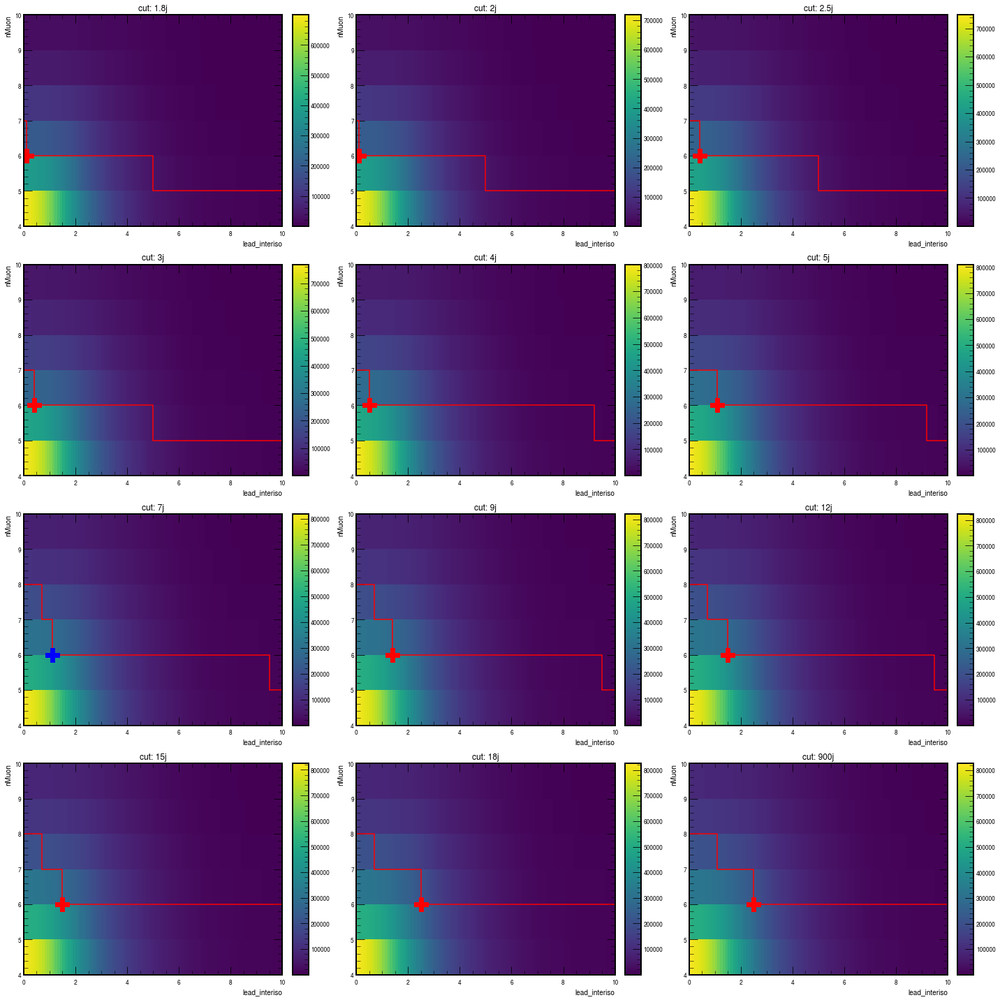

signal is SUEP-m400-darkPho_2018

Yield at global max: 131558 ± 1536 (1.2%)

Yield for 2.5j, (6, 0.4): 121813 ± 1478 (1.2%) R_2.5j = 0.93

Yield for 3j, (6, 0.4): 126302 ± 1505 (1.2%) R_3j = 0.96

Yield for 4j, (6, 0.5): 130493 ± 1530 (1.2%) R_4j = 0.99

Yield for 5j, (6, 1.1): 130782 ± 1532 (1.2%) R_5j = 0.99

Yield for 7j, (6, 1.1): 131558 ± 1536 (1.2%) R_7j = 1.00

Yield for 9j, (6, 1.4): 131025 ± 1533 (1.2%) R_9j = 1.00

Yield for 12j, (6, 1.5): 130132 ± 1528 (1.2%) R_12j = 0.99

Yield for 15j, (6, 1.5): 130270 ± 1529 (1.2%) R_15j = 0.99

Yield for 18j, (6, 2.5): 119370 ± 1463 (1.2%) R_18j = 0.91

Yield for 900j, (6, 2.5): 119439 ± 1463 (1.2%) R_900j = 0.91

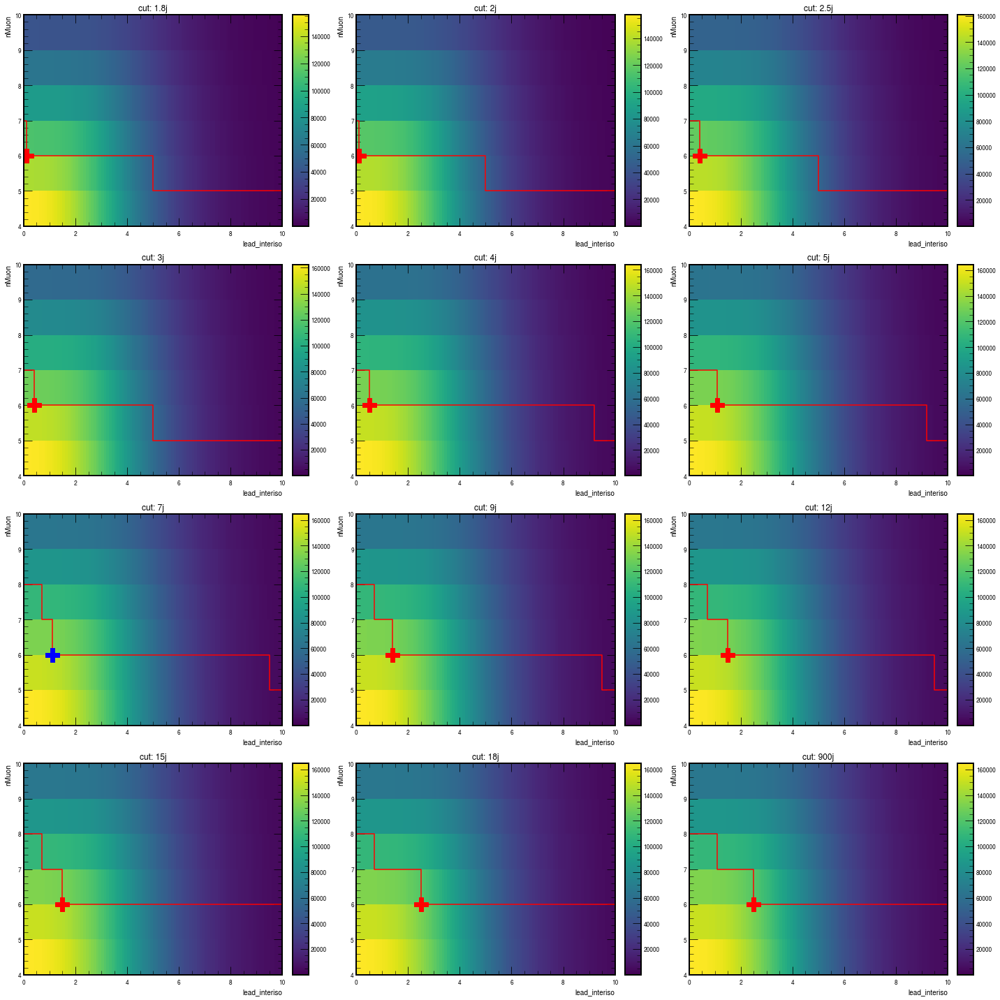

signal is SUEP-m750-darkPho_2018

Yield at global max: 27449 ± 277 (1.0%)

Yield for 1.8j, (6, 0.1): 25451 ± 267 (1.0%) R_1.8j = 0.93

Yield for 2j, (6, 0.1): 25922 ± 269 (1.0%) R_2j = 0.94

Yield for 2.5j, (6, 0.4): 26644 ± 273 (1.0%) R_2.5j = 0.97

Yield for 3j, (6, 0.4): 27014 ± 275 (1.0%) R_3j = 0.98

Yield for 4j, (6, 0.5): 27342 ± 277 (1.0%) R_4j = 1.00

Yield for 5j, (6, 1.1): 27383 ± 277 (1.0%) R_5j = 1.00

Yield for 7j, (6, 1.1): 27449 ± 277 (1.0%) R_7j = 1.00

Yield for 9j, (6, 1.4): 27447 ± 277 (1.0%) R_9j = 1.00

Yield for 12j, (6, 1.5): 27439 ± 277 (1.0%) R_12j = 1.00

Yield for 15j, (6, 1.5): 27442 ± 277 (1.0%) R_15j = 1.00

Yield for 18j, (6, 2.5): 27202 ± 276 (1.0%) R_18j = 0.99

Yield for 900j, (6, 2.5): 27216 ± 276 (1.0%) R_900j = 0.99

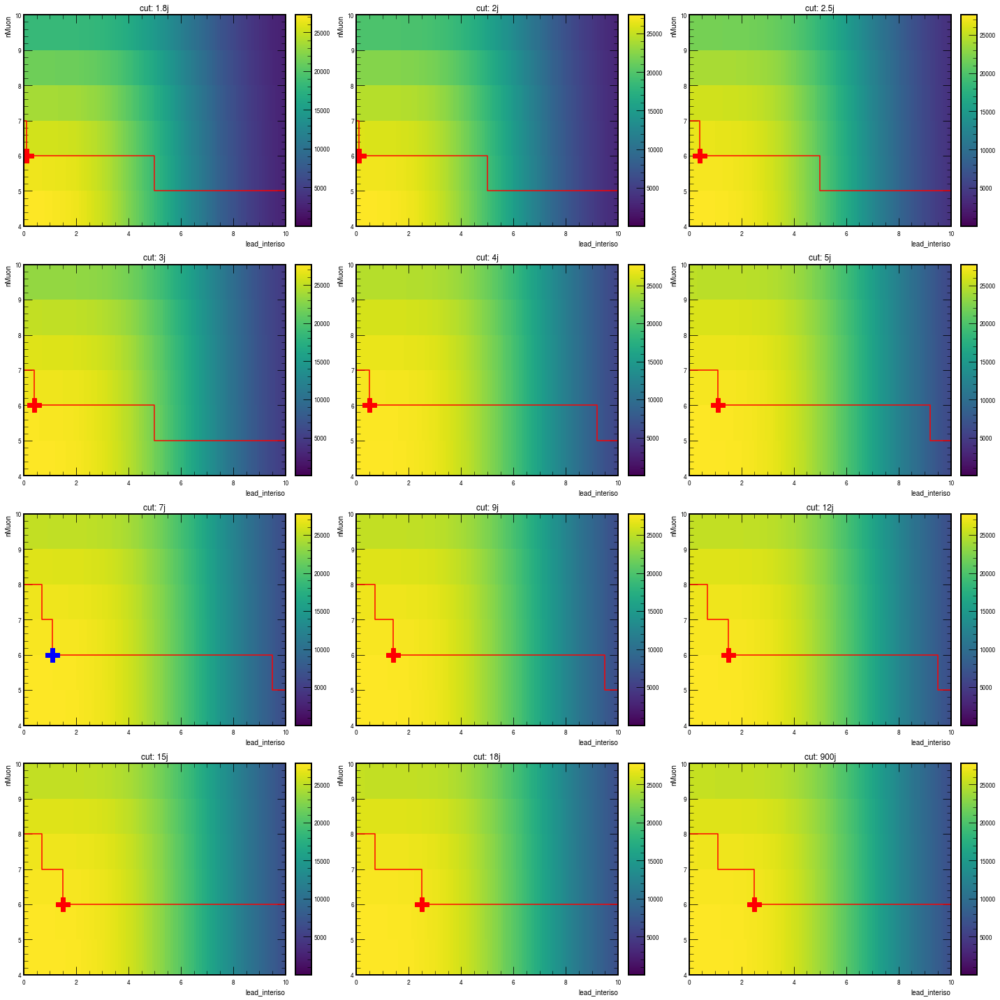

signal is SUEP-m1000-darkPho_2018

Yield at global max: 10283 ± 103 (1.0%)

Yield for 1.8j, (6, 0.1): 9760 ± 101 (1.0%) R_1.8j = 0.95

Yield for 2j, (6, 0.1): 9925 ± 102 (1.0%) R_2j = 0.97

Yield for 2.5j, (6, 0.4): 10113 ± 102 (1.0%) R_2.5j = 0.98

Yield for 3j, (6, 0.4): 10189 ± 103 (1.0%) R_3j = 0.99

Yield for 4j, (6, 0.5): 10272 ± 103 (1.0%) R_4j = 1.00

Yield for 5j, (6, 1.1): 10274 ± 103 (1.0%) R_5j = 1.00

Yield for 7j, (6, 1.1): 10283 ± 103 (1.0%) R_7j = 1.00

Yield for 9j, (6, 1.4): 10281 ± 103 (1.0%) R_9j = 1.00

Yield for 12j, (6, 1.5): 10282 ± 103 (1.0%) R_12j = 1.00

Yield for 15j, (6, 1.5): 10283 ± 103 (1.0%) R_15j = 1.00

Yield for 18j, (7, 0.7): 10279 ± 103 (1.0%) R_18j = 1.00

Yield for 900j, (7, 1.1): 10276 ± 103 (1.0%) R_900j = 1.00

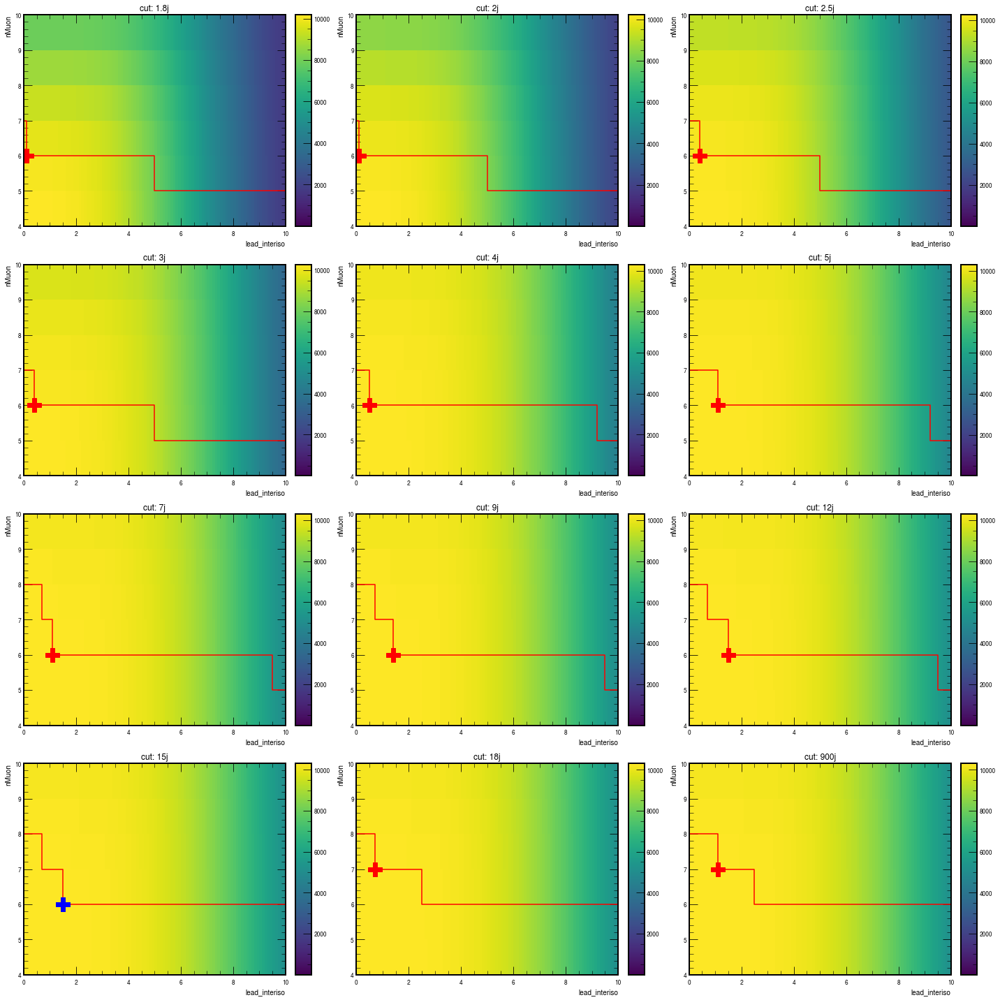

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018

Yield at global max: 2032 ± 720 (35.4%)

Yield for 900j, (7, 1.1): 2032 ± 720 (35.4%) R_900j = 1.00

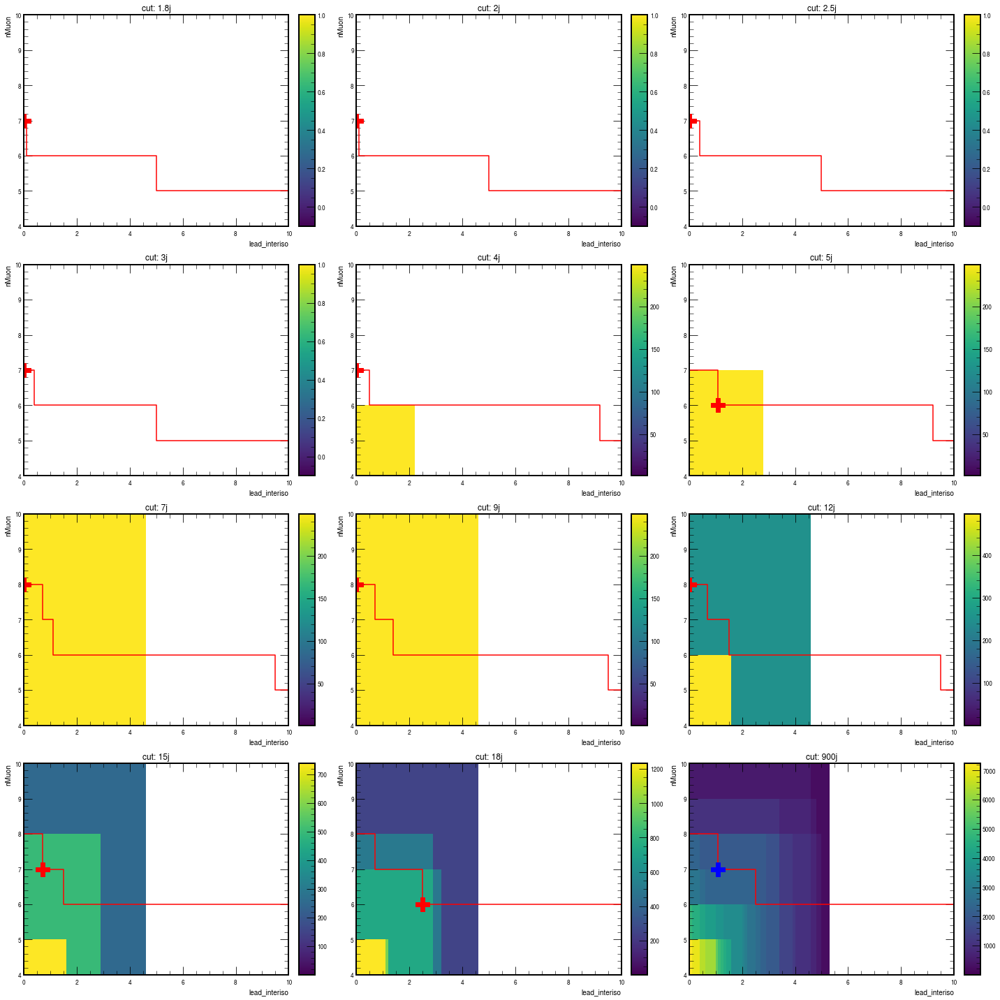

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018

Yield at global max: 9578 ± 1556 (16.2%)

Yield for 900j, (7, 1.1): 9578 ± 1556 (16.2%) R_900j = 1.00

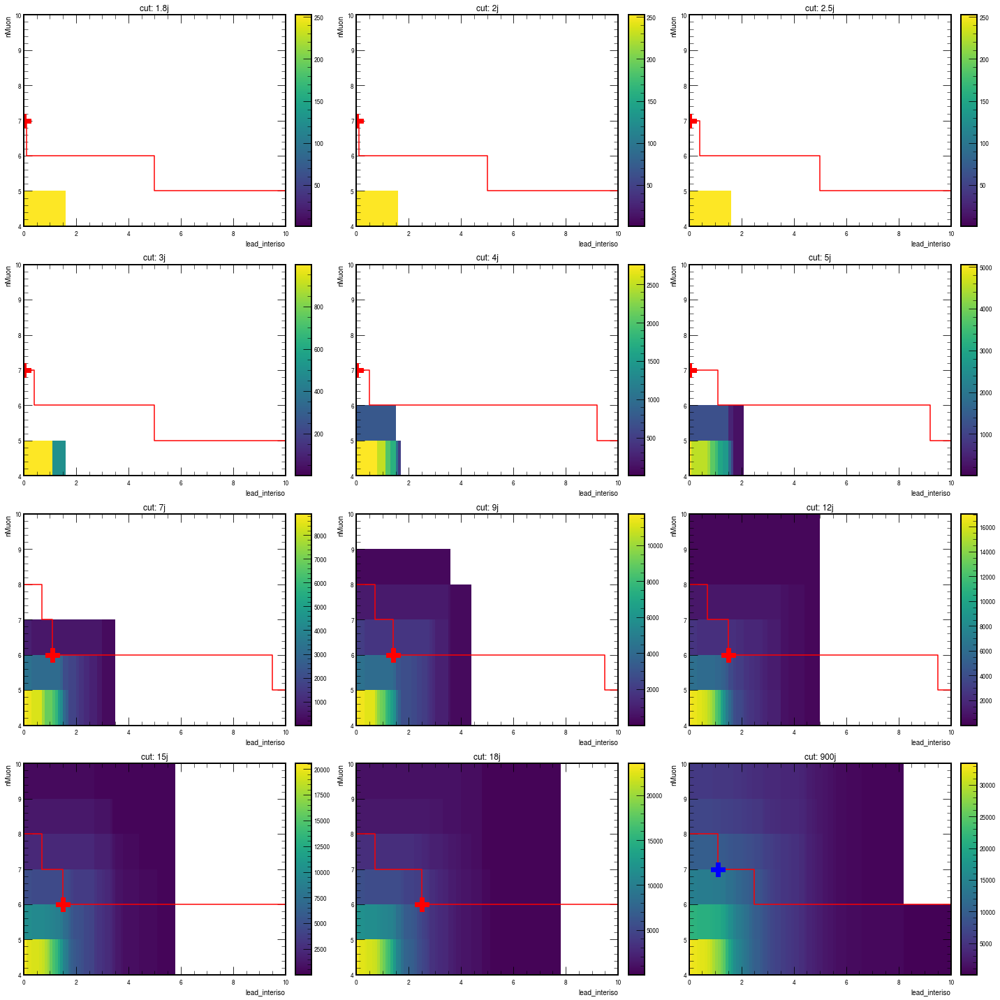

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018

Yield at global max: 48229 ± 3439 (7.1%)

Yield for 15j, (6, 1.5): 48229 ± 3439 (7.1%) R_15j = 1.00

Yield for 900j, (6, 2.5): 45650 ± 3349 (7.3%) R_900j = 0.95

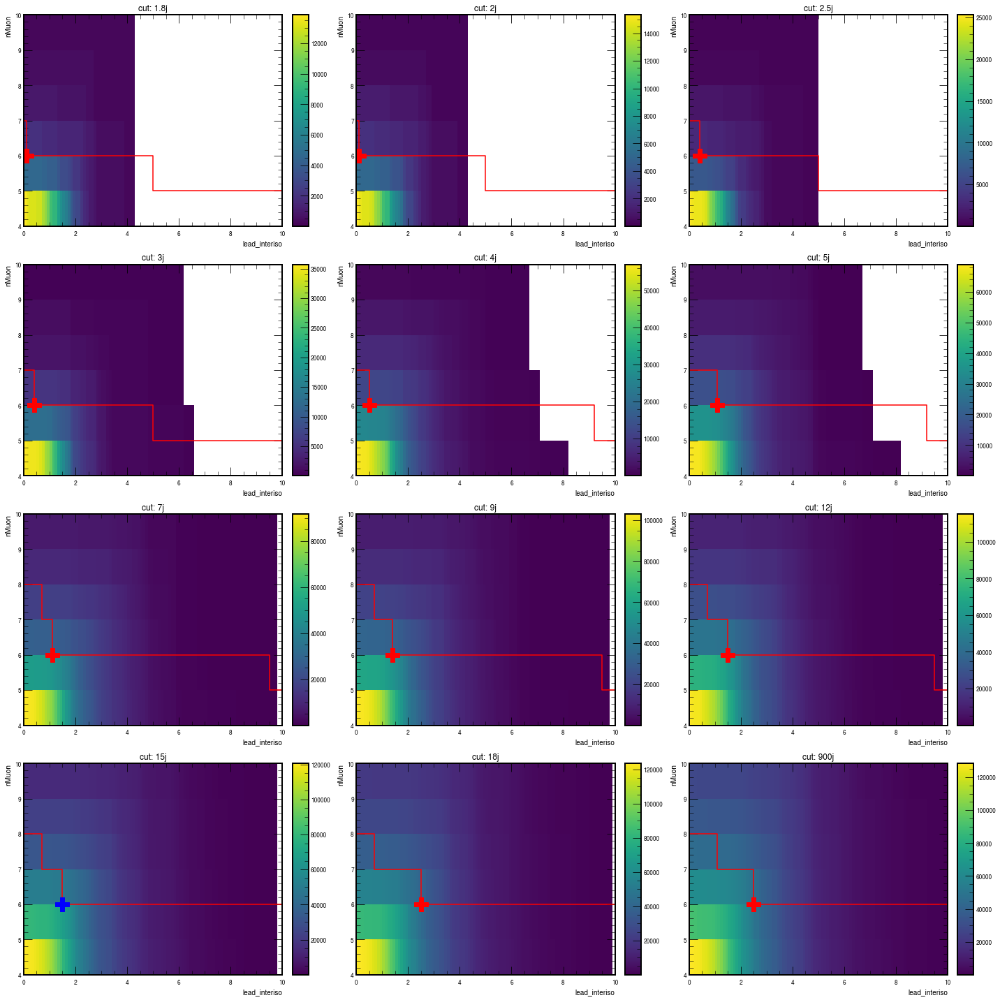

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018

Yield at global max: 182908 ± 6731 (3.7%)

Yield for 7j, (6, 1.1): 175764 ± 6594 (3.8%) R_7j = 0.96

Yield for 9j, (6, 1.4): 180356 ± 6682 (3.7%) R_9j = 0.99

Yield for 12j, (6, 1.5): 179587 ± 6667 (3.7%) R_12j = 0.98

Yield for 15j, (6, 1.5): 182908 ± 6731 (3.7%) R_15j = 1.00

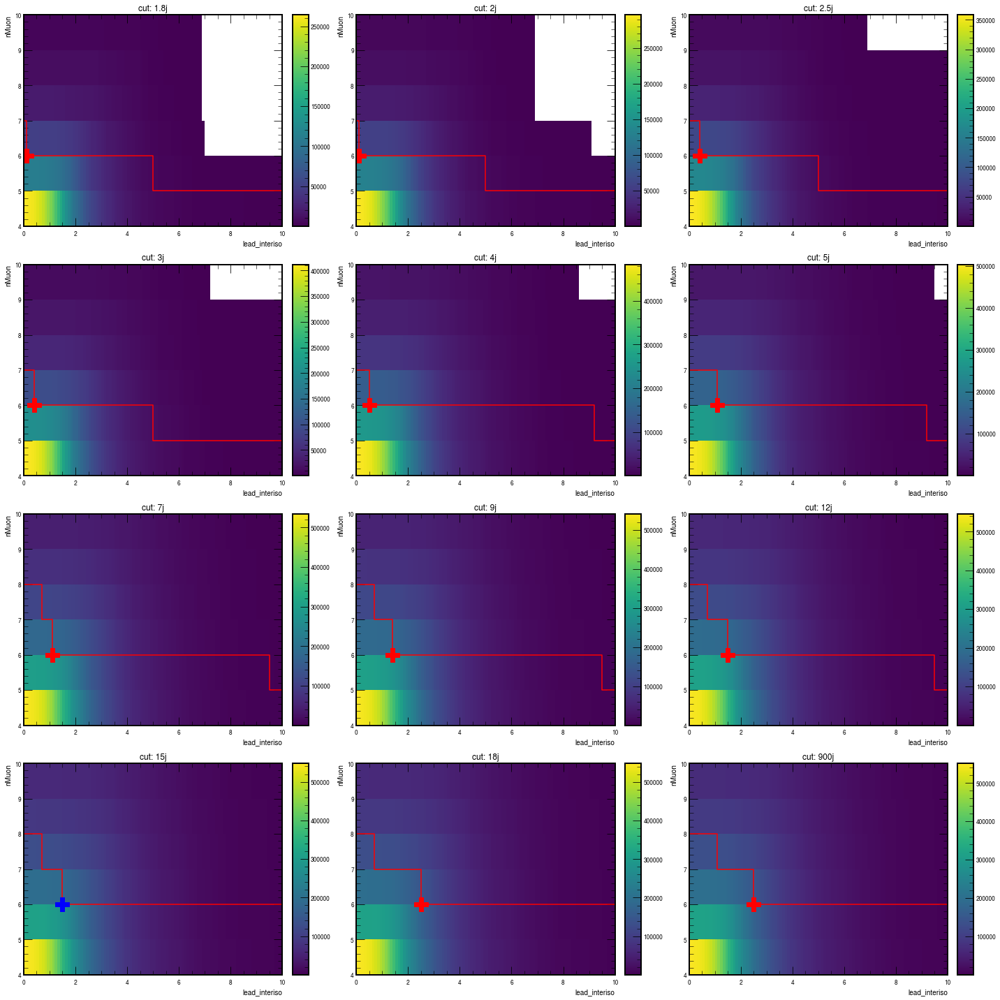

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018

Yield at global max: 618527 ± 12367 (2.0%)

Yield for 4j, (6, 0.5): 594979 ± 12132 (2.0%) R_4j = 0.96

Yield for 5j, (6, 1.1): 600041 ± 12183 (2.0%) R_5j = 0.97

Yield for 7j, (6, 1.1): 618527 ± 12367 (2.0%) R_7j = 1.00

Yield for 9j, (6, 1.4): 610632 ± 12288 (2.0%) R_9j = 0.99

Yield for 12j, (6, 1.5): 594651 ± 12123 (2.0%) R_12j = 0.96

Yield for 15j, (6, 1.5): 598104 ± 12159 (2.0%) R_15j = 0.97

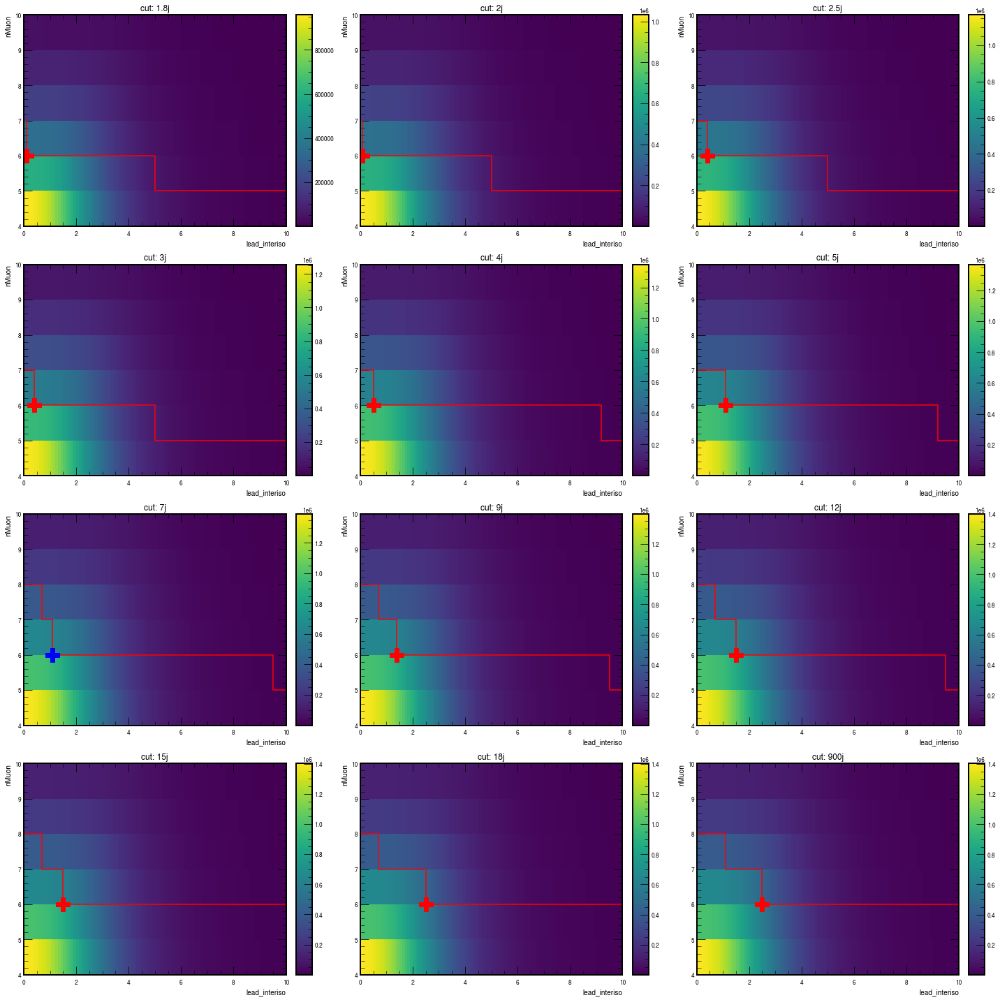

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018

Yield at global max: 41858 ± 3237 (7.7%)

Yield for 15j, (6, 1.5): 41858 ± 3237 (7.7%) R_15j = 1.00

Yield for 900j, (7, 1.1): 39549 ± 3154 (8.0%) R_900j = 0.94

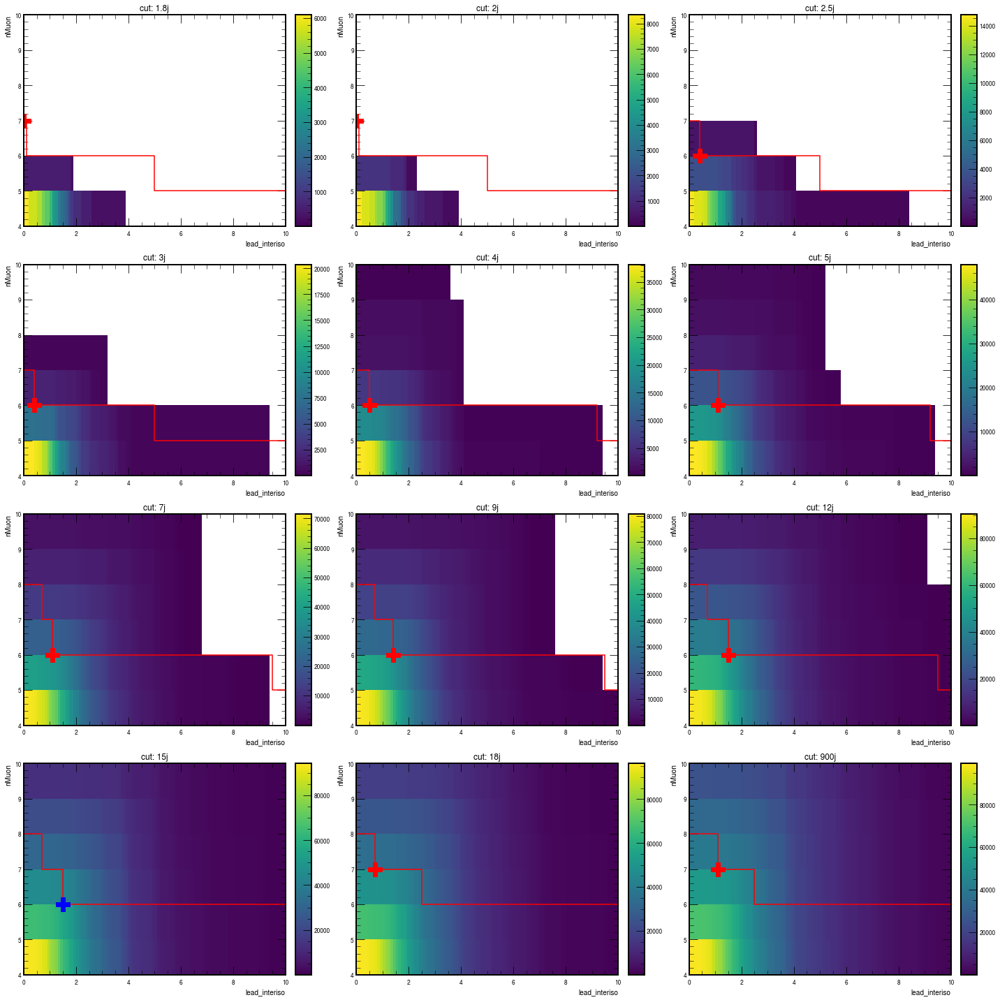

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018

Yield at global max: 102039 ± 5029 (4.9%)

Yield for 9j, (6, 1.4): 92115 ± 4777 (5.2%) R_9j = 0.90

Yield for 12j, (6, 1.5): 98431 ± 4942 (5.0%) R_12j = 0.96

Yield for 15j, (6, 1.5): 102039 ± 5029 (4.9%) R_15j = 1.00

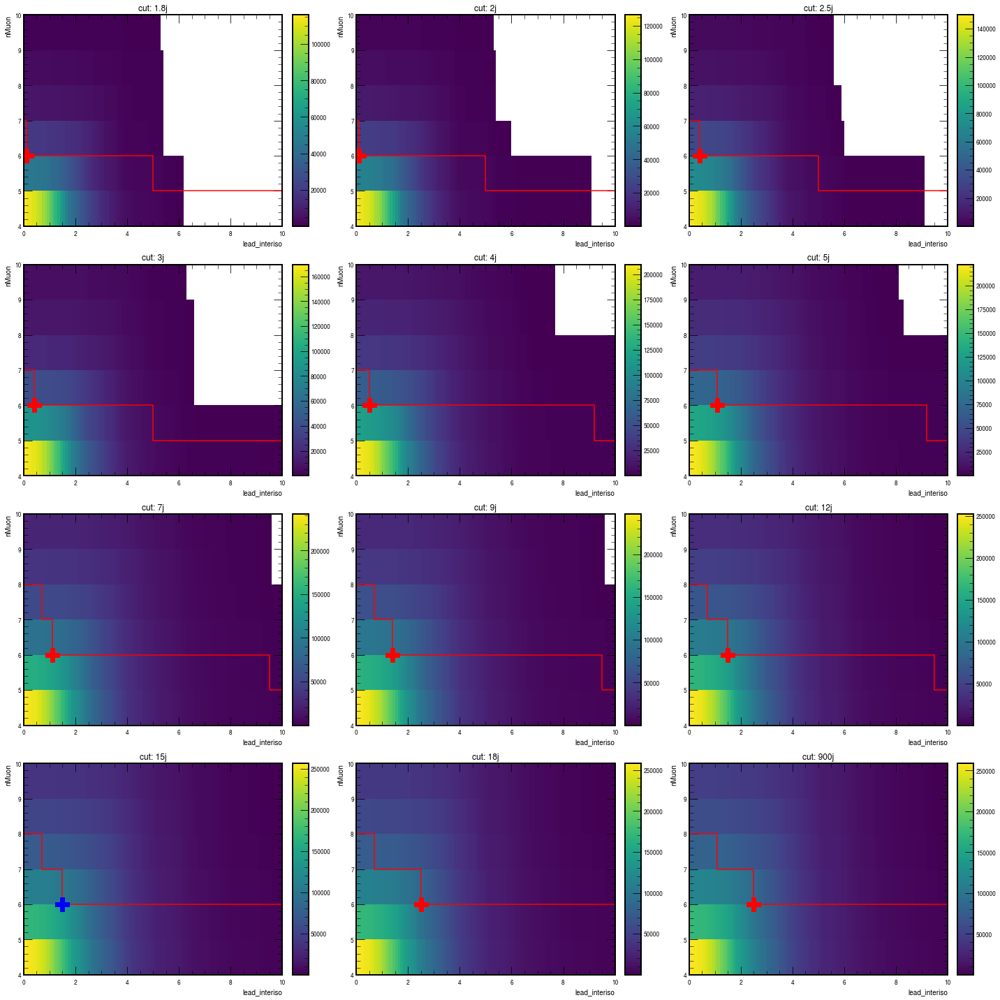

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018

Yield at global max: 287024 ± 8527 (3.0%)

Yield for 4j, (6, 0.5): 280500 ± 8433 (3.0%) R_4j = 0.98

Yield for 5j, (6, 1.1): 273314 ± 8319 (3.0%) R_5j = 0.95

Yield for 7j, (6, 1.1): 287024 ± 8527 (3.0%) R_7j = 1.00

Yield for 9j, (6, 1.4): 284387 ± 8489 (3.0%) R_9j = 0.99

Yield for 12j, (6, 1.5): 280247 ± 8430 (3.0%) R_12j = 0.98

Yield for 15j, (6, 1.5): 283136 ± 8471 (3.0%) R_15j = 0.99

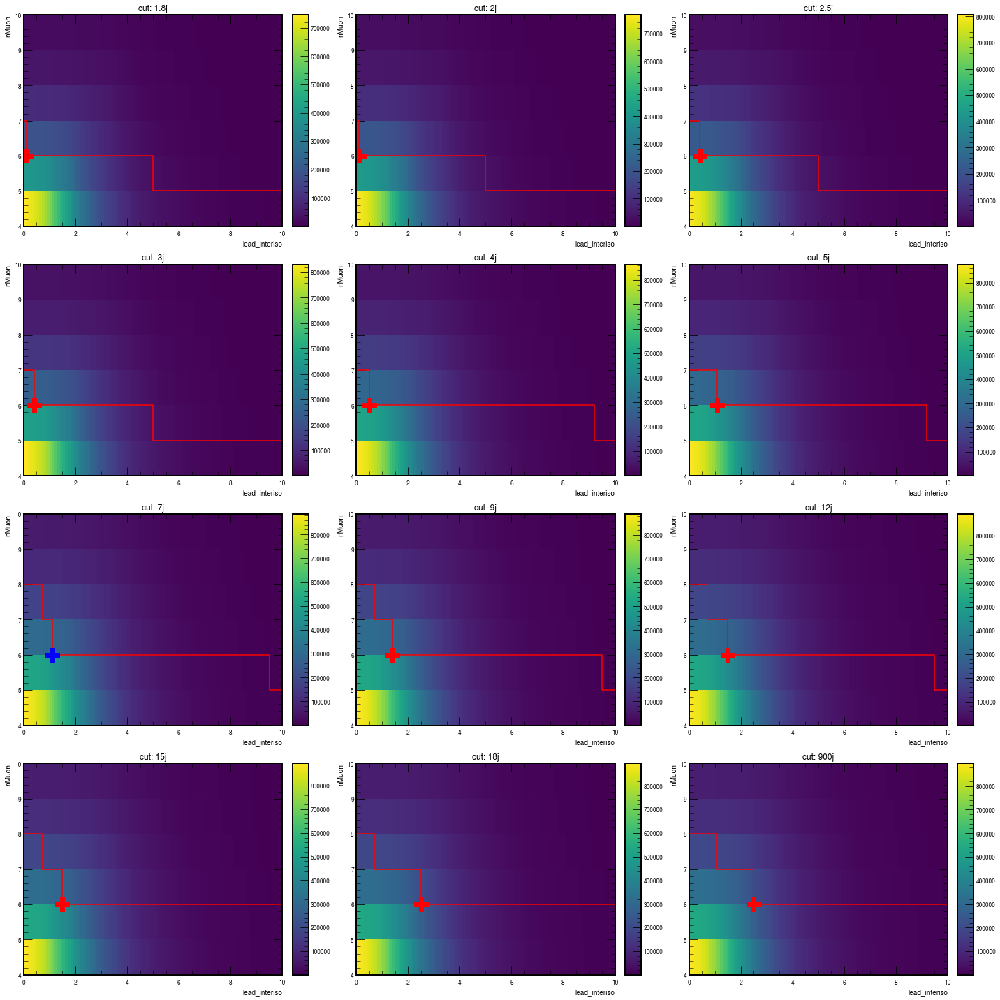

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPho_2018

Yield at global max: 589071 ± 12065 (2.0%)

Yield for 2.5j, (6, 0.4): 547396 ± 11632 (2.1%) R_2.5j = 0.93

Yield for 3j, (6, 0.4): 568038 ± 11849 (2.1%) R_3j = 0.96

Yield for 4j, (6, 0.5): 589071 ± 12065 (2.0%) R_4j = 1.00

Yield for 5j, (6, 1.1): 563430 ± 11797 (2.1%) R_5j = 0.96

Yield for 7j, (6, 1.1): 574495 ± 11912 (2.1%) R_7j = 0.98

Yield for 9j, (6, 1.4): 559917 ± 11759 (2.1%) R_9j = 0.95

Yield for 12j, (6, 1.5): 538588 ± 11534 (2.1%) R_12j = 0.91

Yield for 15j, (6, 1.5): 540551 ± 11555 (2.1%) R_15j = 0.92

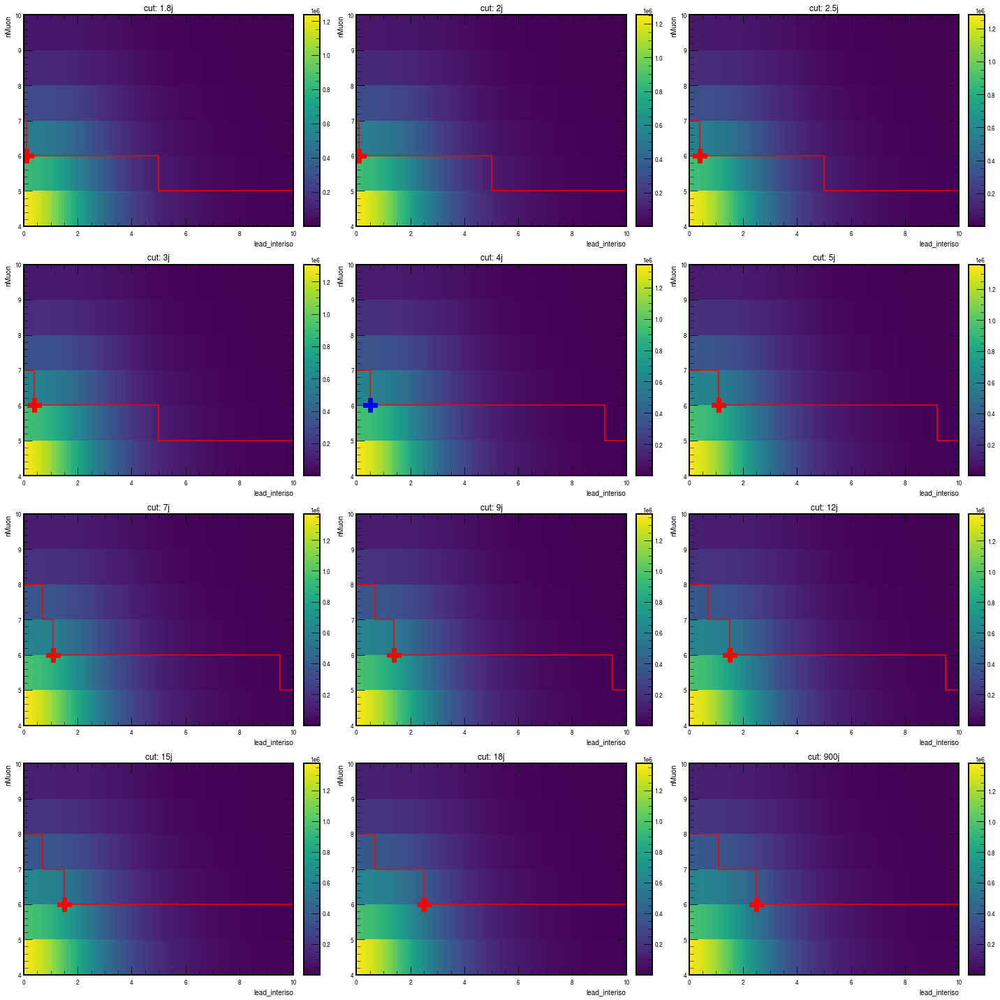

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018

Yield at global max: 489288 ± 11004 (2.2%)

Yield for 2.5j, (6, 0.4): 442803 ± 10464 (2.4%) R_2.5j = 0.90

Yield for 3j, (6, 0.4): 463921 ± 10713 (2.3%) R_3j = 0.95

Yield for 4j, (6, 0.5): 489288 ± 11004 (2.2%) R_4j = 1.00

Yield for 5j, (6, 1.1): 441736 ± 10456 (2.4%) R_5j = 0.90

Yield for 7j, (6, 1.1): 458809 ± 10654 (2.3%) R_7j = 0.94

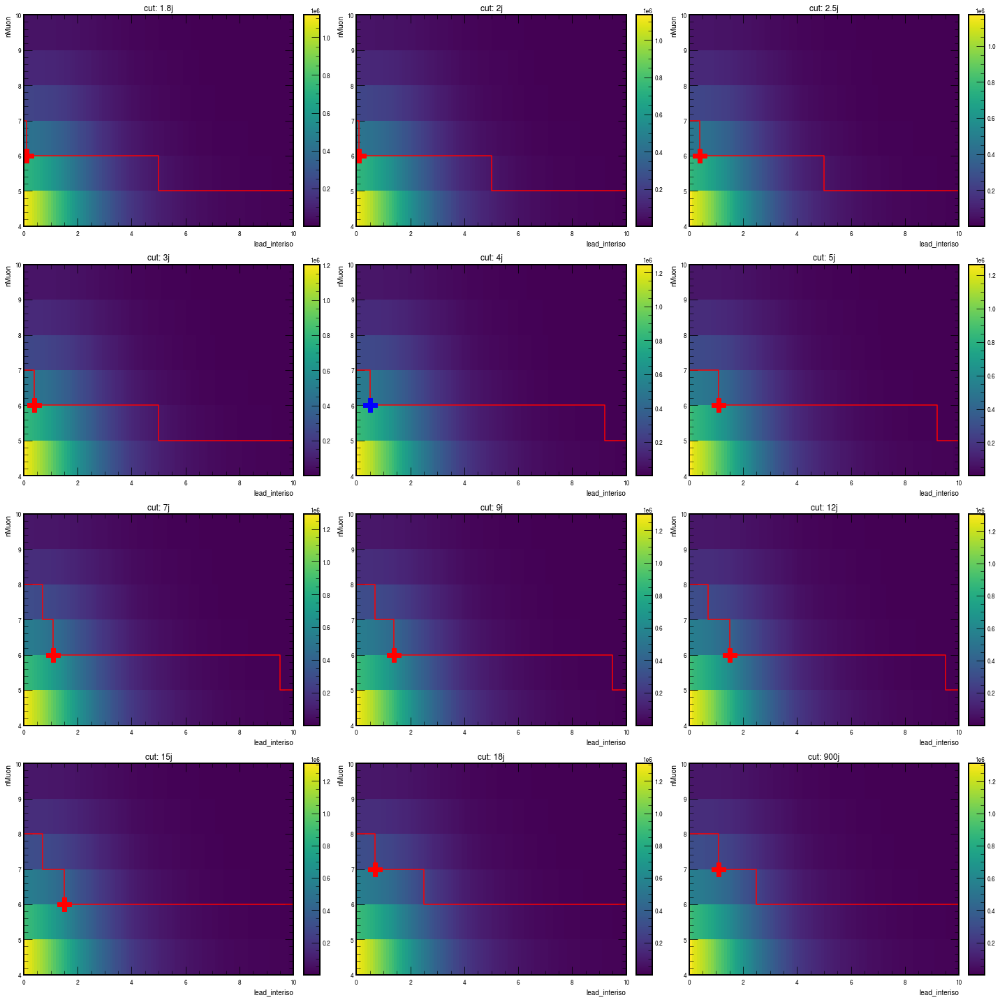

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPho_2018

Yield at global max: 177426 ± 6618 (3.7%)

Yield for 5j, (6, 1.1): 164116 ± 6365 (3.9%) R_5j = 0.92

Yield for 7j, (6, 1.1): 174676 ± 6566 (3.8%) R_7j = 0.98

Yield for 9j, (6, 1.4): 176399 ± 6598 (3.7%) R_9j = 0.99

Yield for 12j, (6, 1.5): 175460 ± 6581 (3.8%) R_12j = 0.99

Yield for 15j, (6, 1.5): 177426 ± 6618 (3.7%) R_15j = 1.00

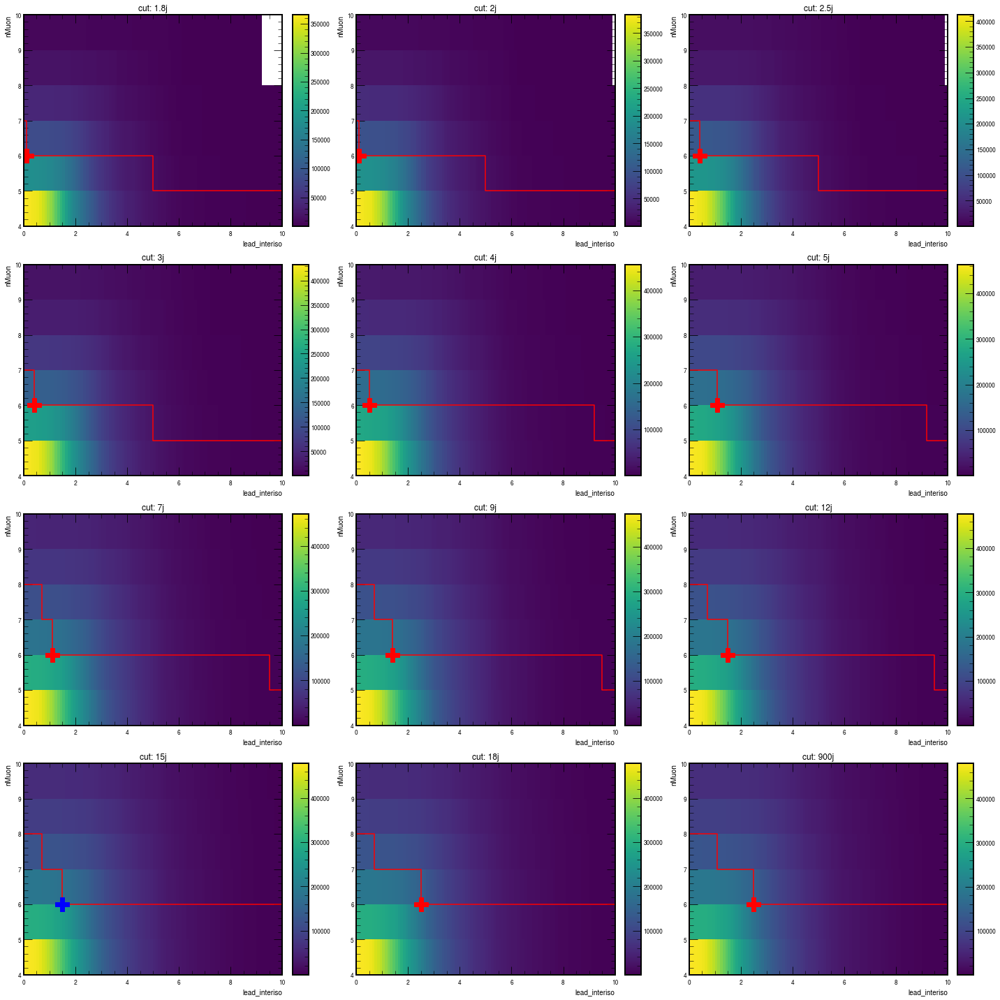

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPho_2018

Yield at global max: 362734 ± 9471 (2.6%)

Yield for 2.5j, (6, 0.4): 329129 ± 9020 (2.7%) R_2.5j = 0.91

Yield for 3j, (6, 0.4): 344262 ± 9226 (2.7%) R_3j = 0.95

Yield for 4j, (6, 0.5): 362734 ± 9471 (2.6%) R_4j = 1.00

Yield for 5j, (6, 1.1): 349559 ± 9295 (2.7%) R_5j = 0.96

Yield for 7j, (6, 1.1): 358092 ± 9410 (2.6%) R_7j = 0.99

Yield for 9j, (6, 1.4): 351053 ± 9318 (2.7%) R_9j = 0.97

Yield for 12j, (6, 1.5): 342065 ± 9197 (2.7%) R_12j = 0.94

Yield for 15j, (6, 1.5): 343043 ± 9210 (2.7%) R_15j = 0.95

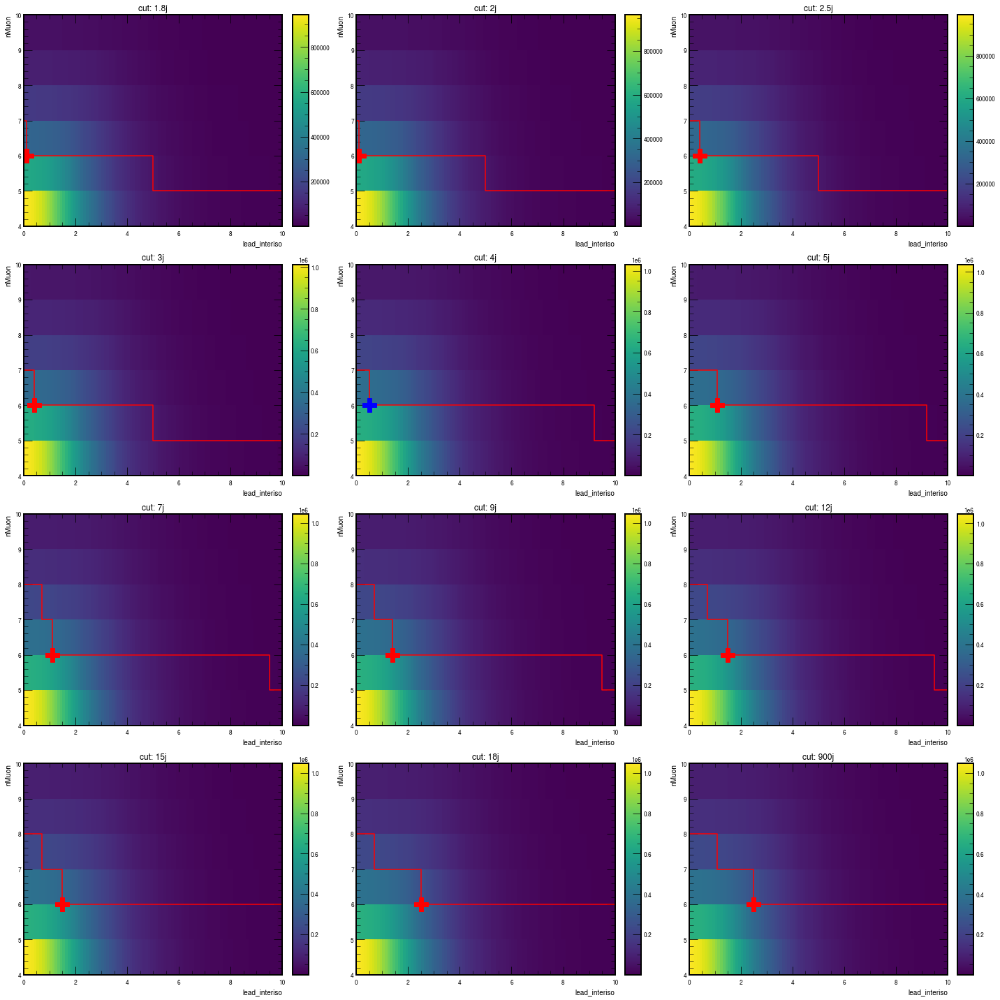

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPho_2018

Yield at global max: 609046 ± 12271 (2.0%)

Yield for 1.8j, (6, 0.1): 569909 ± 11870 (2.1%) R_1.8j = 0.94

Yield for 2j, (6, 0.1): 578816 ± 11963 (2.1%) R_2j = 0.95

Yield for 2.5j, (6, 0.4): 585497 ± 12032 (2.1%) R_2.5j = 0.96

Yield for 3j, (6, 0.4): 596809 ± 12148 (2.0%) R_3j = 0.98

Yield for 4j, (6, 0.5): 609046 ± 12271 (2.0%) R_4j = 1.00

Yield for 5j, (6, 1.1): 575894 ± 11931 (2.1%) R_5j = 0.95

Yield for 7j, (6, 1.1): 582848 ± 12003 (2.1%) R_7j = 0.96

Yield for 9j, (6, 1.4): 565861 ± 11827 (2.1%) R_9j = 0.93

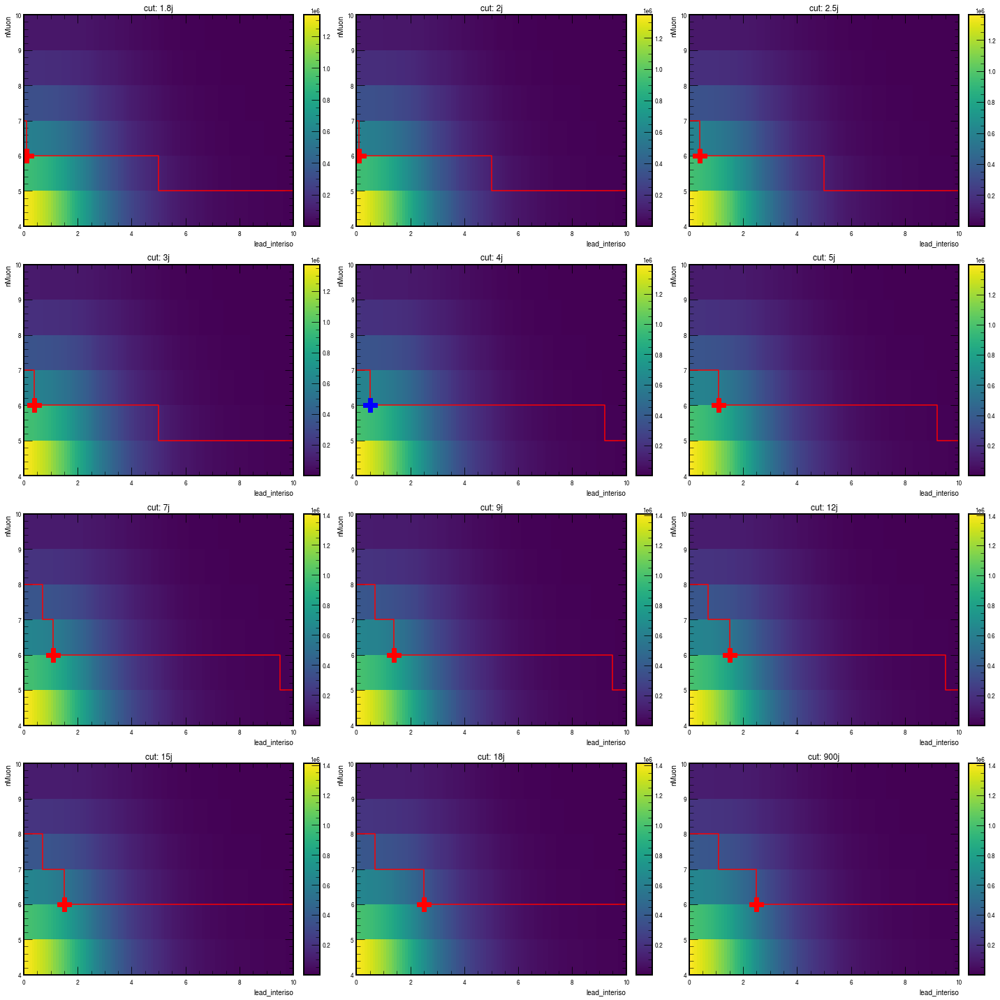

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPho_2018

Yield at global max: 478991 ± 10871 (2.3%)

Yield for 1.8j, (6, 0.1): 462526 ± 10679 (2.3%) R_1.8j = 0.97

Yield for 2j, (6, 0.1): 466723 ± 10728 (2.3%) R_2j = 0.97

Yield for 2.5j, (6, 0.4): 462449 ± 10681 (2.3%) R_2.5j = 0.97

Yield for 3j, (6, 0.4): 469307 ± 10759 (2.3%) R_3j = 0.98

Yield for 4j, (6, 0.5): 478991 ± 10871 (2.3%) R_4j = 1.00

Yield for 5j, (6, 1.1): 432768 ± 10333 (2.4%) R_5j = 0.90

Yield for 7j, (6, 1.1): 439987 ± 10420 (2.4%) R_7j = 0.92

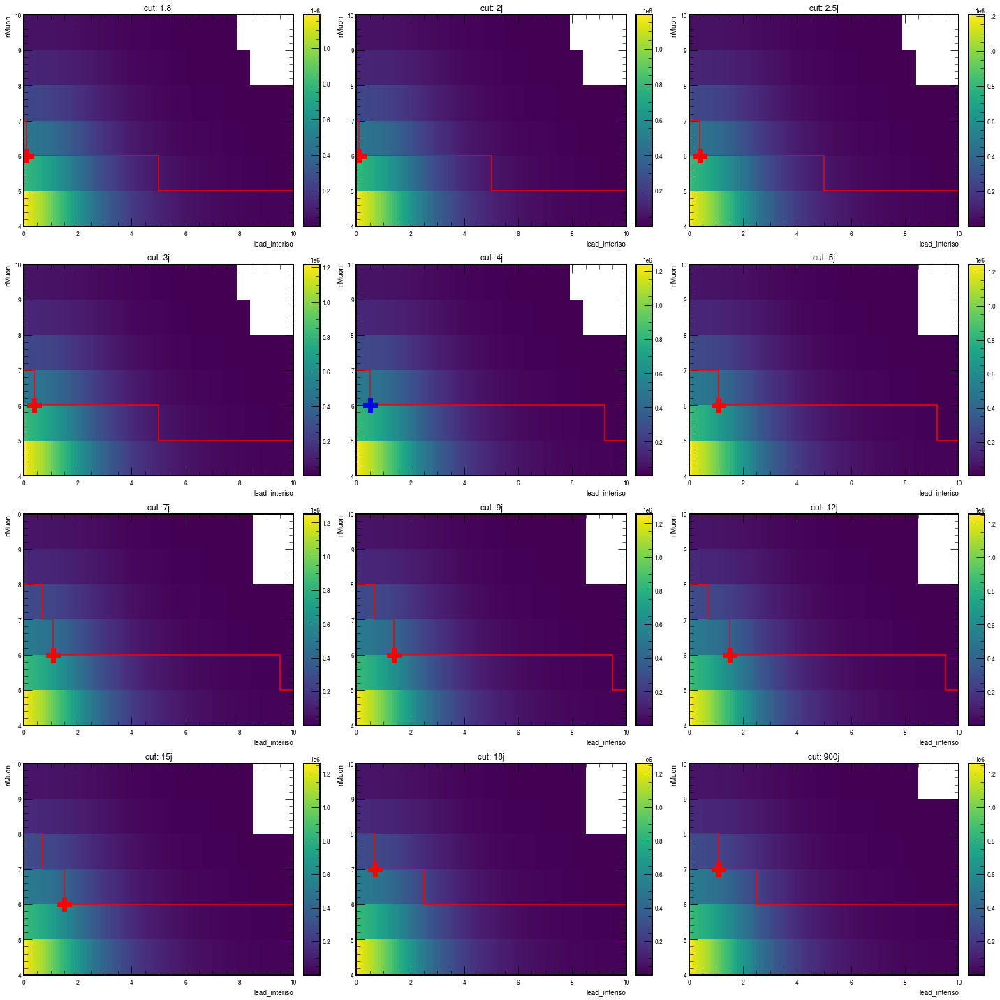

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018

Yield at global max: 231500 ± 7630 (3.3%)

Yield for 1.8j, (6, 0.1): 229376 ± 7597 (3.3%) R_1.8j = 0.99

Yield for 2j, (6, 0.1): 231394 ± 7630 (3.3%) R_2j = 1.00

Yield for 2.5j, (6, 0.4): 225223 ± 7525 (3.3%) R_2.5j = 0.97

Yield for 3j, (6, 0.4): 230967 ± 7620 (3.3%) R_3j = 1.00

Yield for 4j, (6, 0.5): 231500 ± 7630 (3.3%) R_4j = 1.00

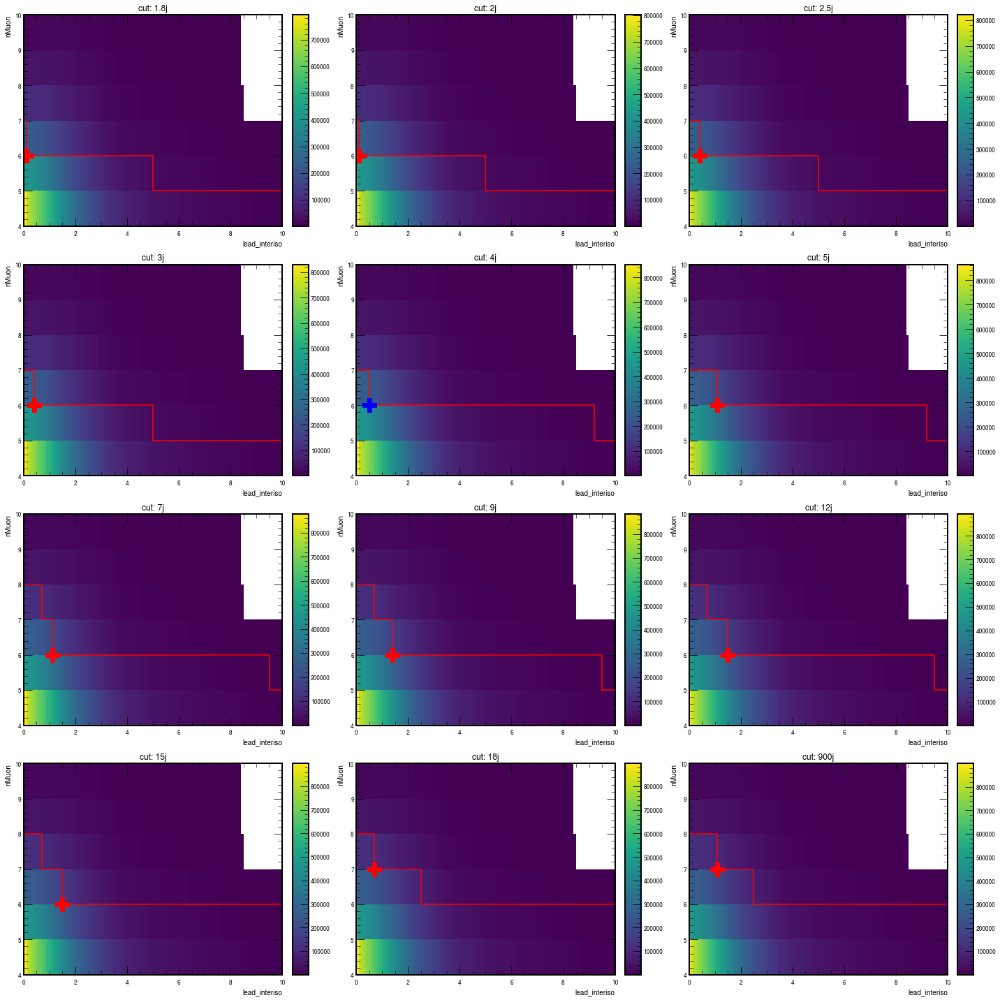

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPho_2018

Yield at global max: 605487 ± 12233 (2.0%)

Yield for 1.8j, (6, 0.1): 546023 ± 11615 (2.1%) R_1.8j = 0.90

Yield for 2j, (6, 0.1): 555957 ± 11721 (2.1%) R_2j = 0.92

Yield for 2.5j, (6, 0.4): 575101 ± 11921 (2.1%) R_2.5j = 0.95

Yield for 3j, (6, 0.4): 588723 ± 12062 (2.0%) R_3j = 0.97

Yield for 4j, (6, 0.5): 605487 ± 12233 (2.0%) R_4j = 1.00

Yield for 5j, (6, 1.1): 593125 ± 12109 (2.0%) R_5j = 0.98

Yield for 7j, (6, 1.1): 599314 ± 12172 (2.0%) R_7j = 0.99

Yield for 9j, (6, 1.4): 589222 ± 12069 (2.0%) R_9j = 0.97

Yield for 12j, (6, 1.5): 574050 ± 11914 (2.1%) R_12j = 0.95

Yield for 15j, (6, 1.5): 574540 ± 11919 (2.1%) R_15j = 0.95

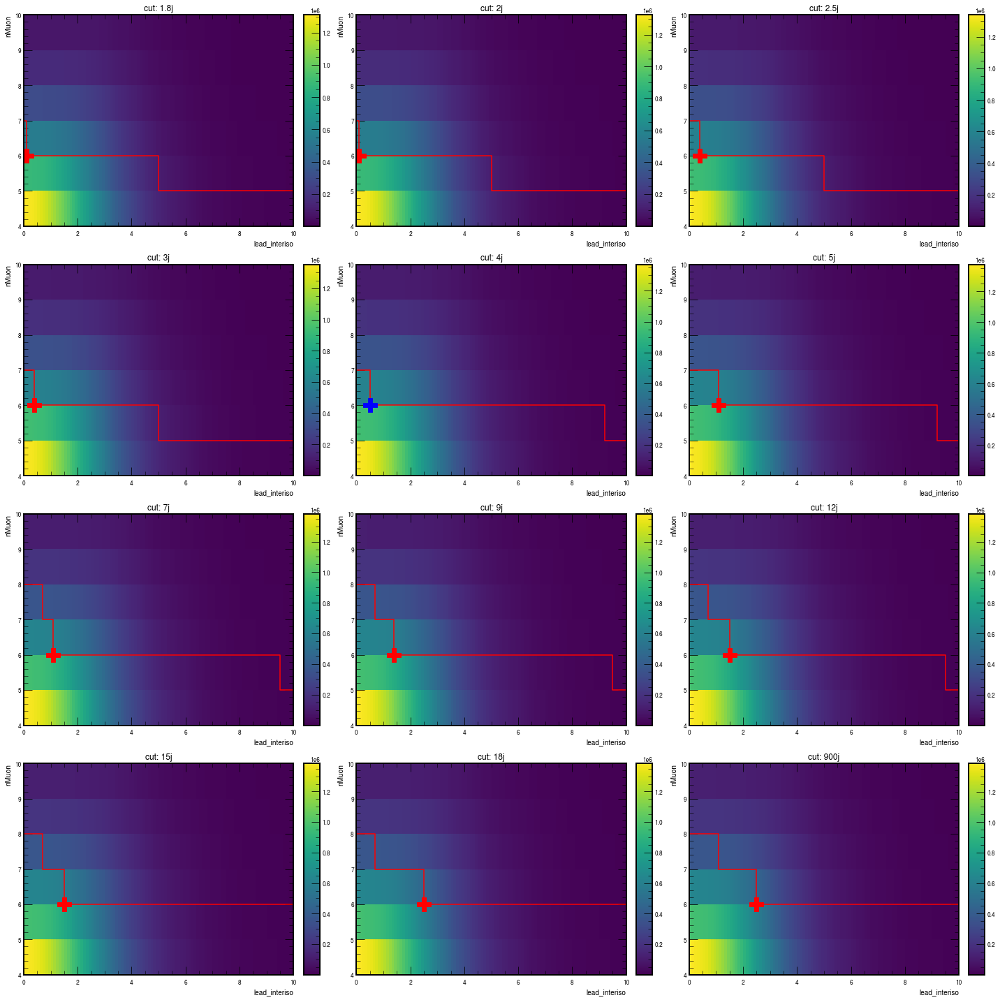

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPho_2018

Yield at global max: 662879 ± 12812 (1.9%)

Yield for 1.8j, (6, 0.1): 638385 ± 12573 (2.0%) R_1.8j = 0.96

Yield for 2j, (6, 0.1): 644280 ± 12631 (2.0%) R_2j = 0.97

Yield for 2.5j, (6, 0.4): 648486 ± 12672 (2.0%) R_2.5j = 0.98

Yield for 3j, (6, 0.4): 655893 ± 12744 (1.9%) R_3j = 0.99

Yield for 4j, (6, 0.5): 662879 ± 12812 (1.9%) R_4j = 1.00

Yield for 5j, (6, 1.1): 627425 ± 12465 (2.0%) R_5j = 0.95

Yield for 7j, (6, 1.1): 629941 ± 12491 (2.0%) R_7j = 0.95

Yield for 9j, (6, 1.4): 610590 ± 12296 (2.0%) R_9j = 0.92

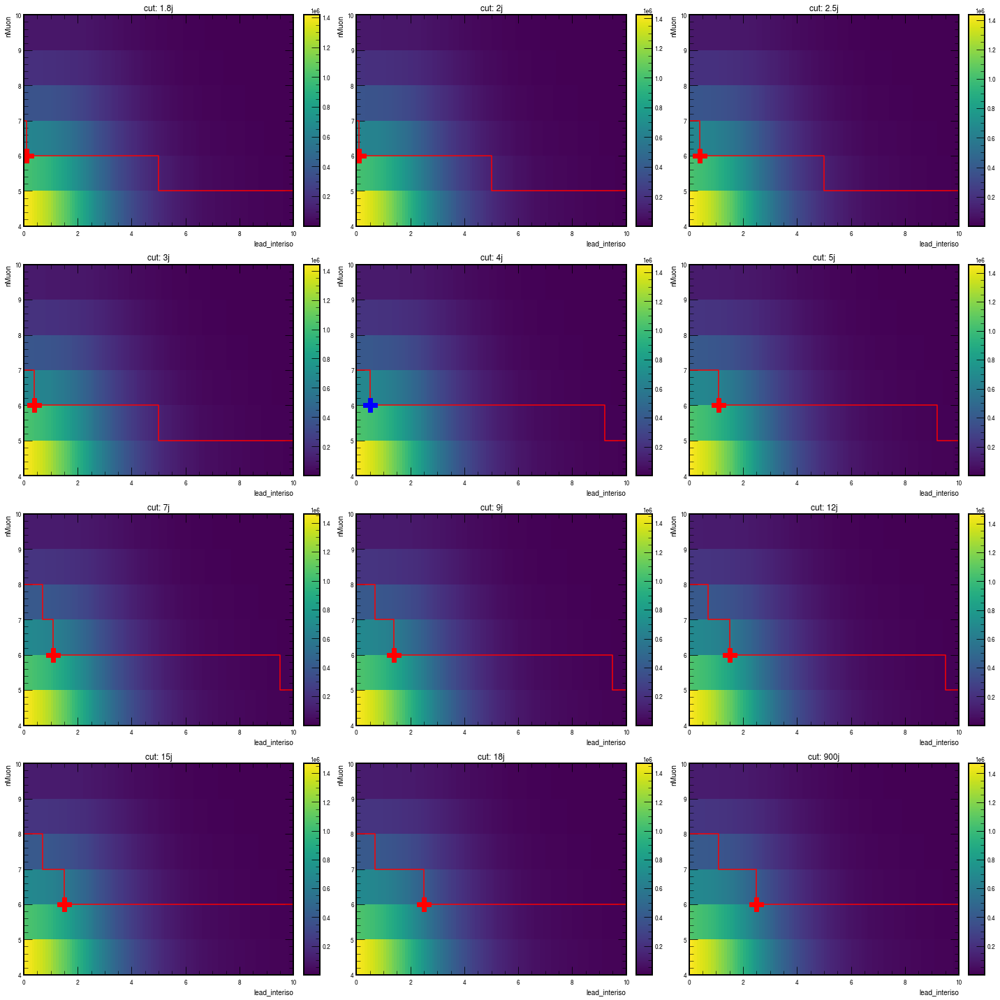

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018

Yield at global max: 489464 ± 11000 (2.2%)

Yield for 1.8j, (6, 0.1): 483207 ± 10929 (2.3%) R_1.8j = 0.99

Yield for 2j, (6, 0.1): 486977 ± 10972 (2.3%) R_2j = 0.99

Yield for 2.5j, (6, 0.4): 483578 ± 10934 (2.3%) R_2.5j = 0.99

Yield for 3j, (6, 0.4): 488488 ± 10989 (2.2%) R_3j = 1.00

Yield for 4j, (6, 0.5): 489464 ± 11000 (2.2%) R_4j = 1.00

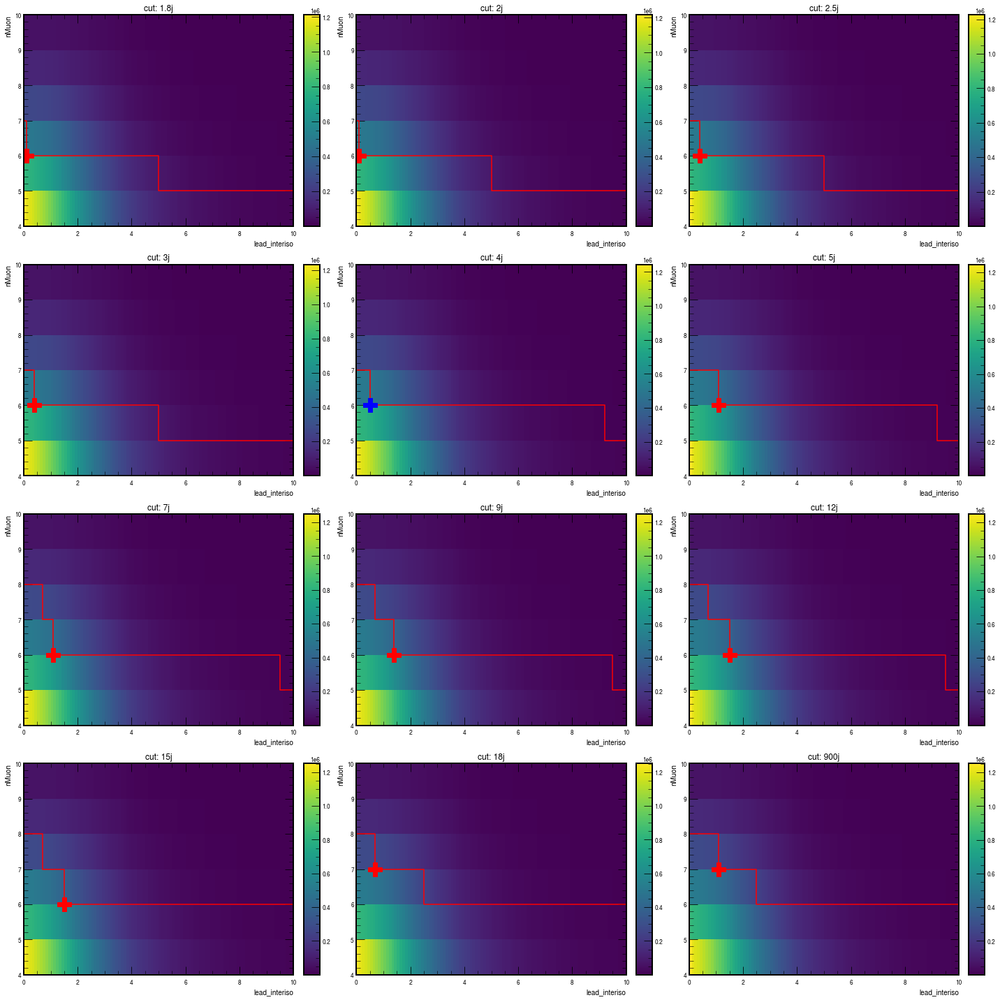

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018

Yield at global max: 248301 ± 7920 (3.2%)

Yield for 1.8j, (6, 0.1): 247534 ± 7907 (3.2%) R_1.8j = 1.00

Yield for 2j, (6, 0.1): 248301 ± 7920 (3.2%) R_2j = 1.00

Yield for 2.5j, (6, 0.4): 240983 ± 7802 (3.2%) R_2.5j = 0.97

Yield for 3j, (6, 0.4): 241942 ± 7817 (3.2%) R_3j = 0.97

Yield for 4j, (6, 0.5): 237592 ± 7745 (3.3%) R_4j = 0.96

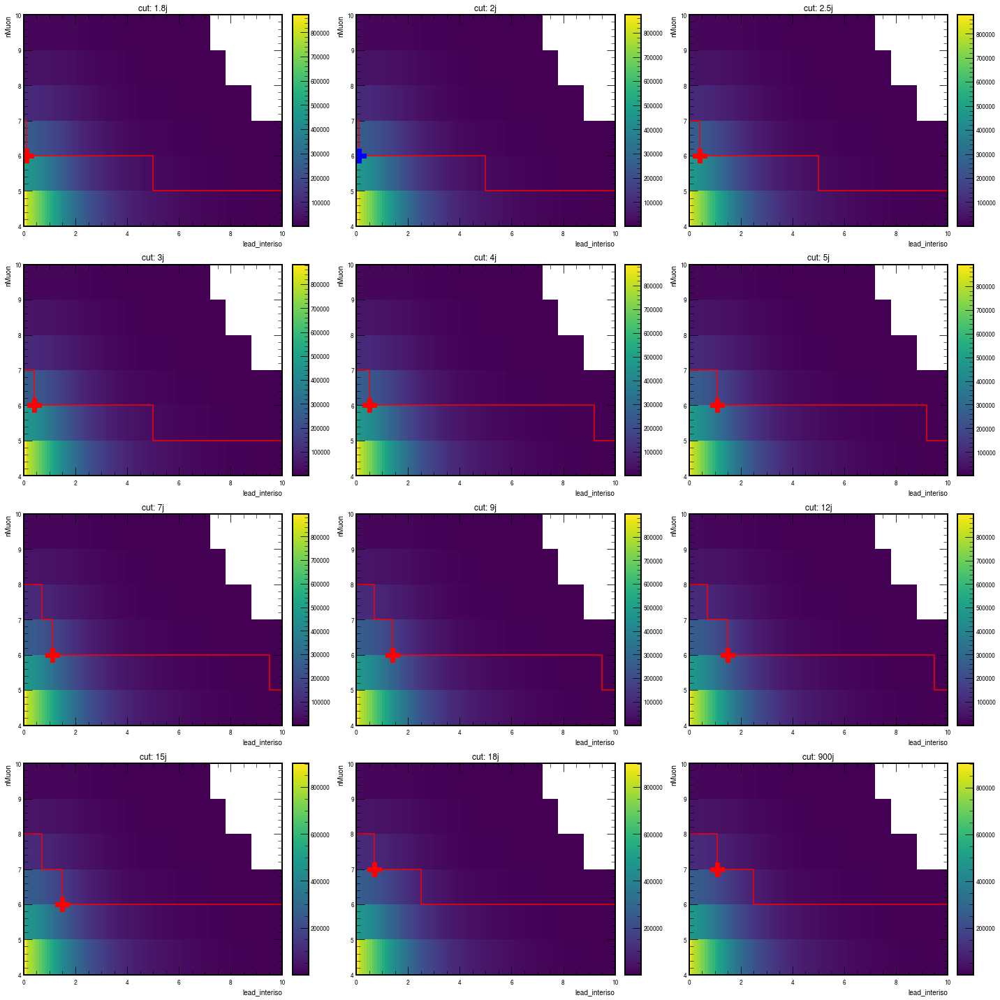

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018

Yield at global max: 116062 ± 5408 (4.7%)

Yield for 1.8j, (6, 0.1): 115295 ± 5390 (4.7%) R_1.8j = 0.99

Yield for 2j, (6, 0.1): 116062 ± 5408 (4.7%) R_2j = 1.00

Yield for 2.5j, (6, 0.4): 108574 ± 5232 (4.8%) R_2.5j = 0.94

Yield for 3j, (6, 0.4): 109095 ± 5245 (4.8%) R_3j = 0.94

Yield for 4j, (6, 0.5): 105550 ± 5158 (4.9%) R_4j = 0.91

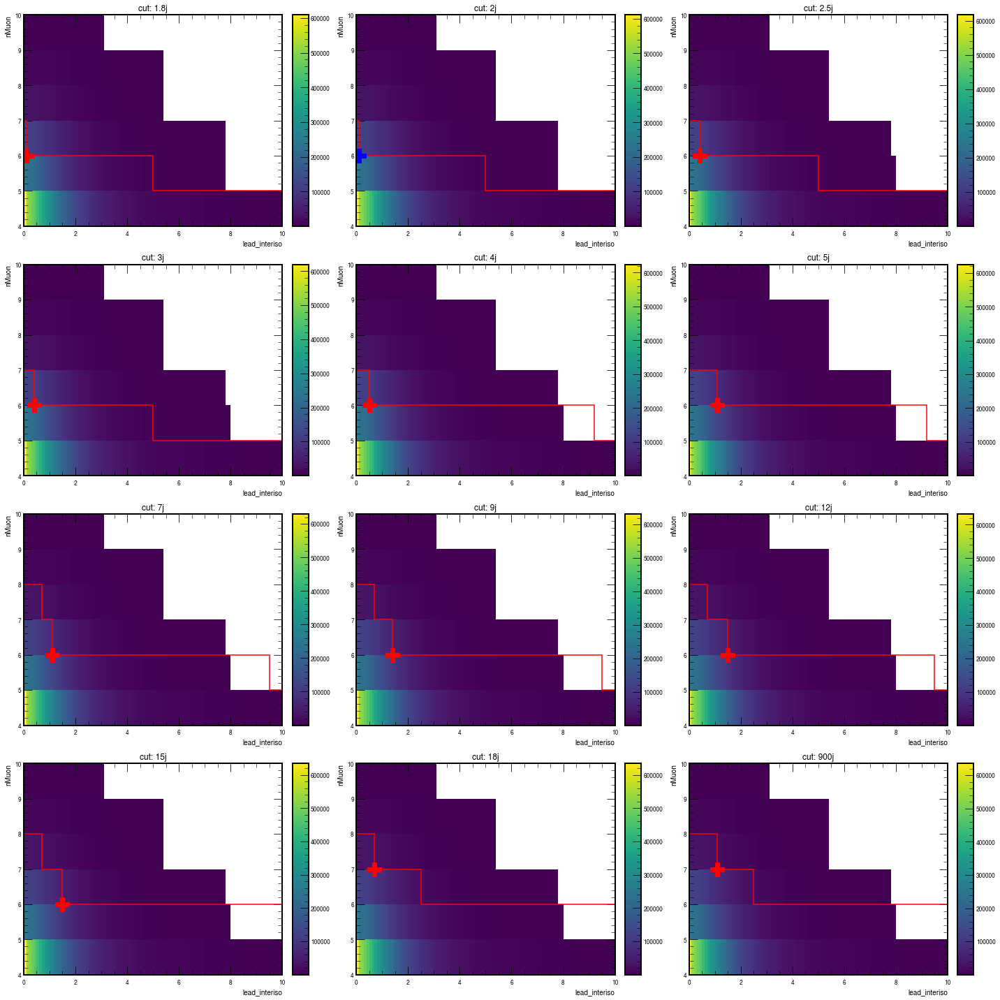

signal is SUEP-m125-darkPhoHad_2018

Yield at global max: 17018 ± 2116 (12.4%)

Yield for 12j, (6, 1.5): 15739 ± 2037 (12.9%) R_12j = 0.92

Yield for 15j, (6, 1.5): 17018 ± 2116 (12.4%) R_15j = 1.00

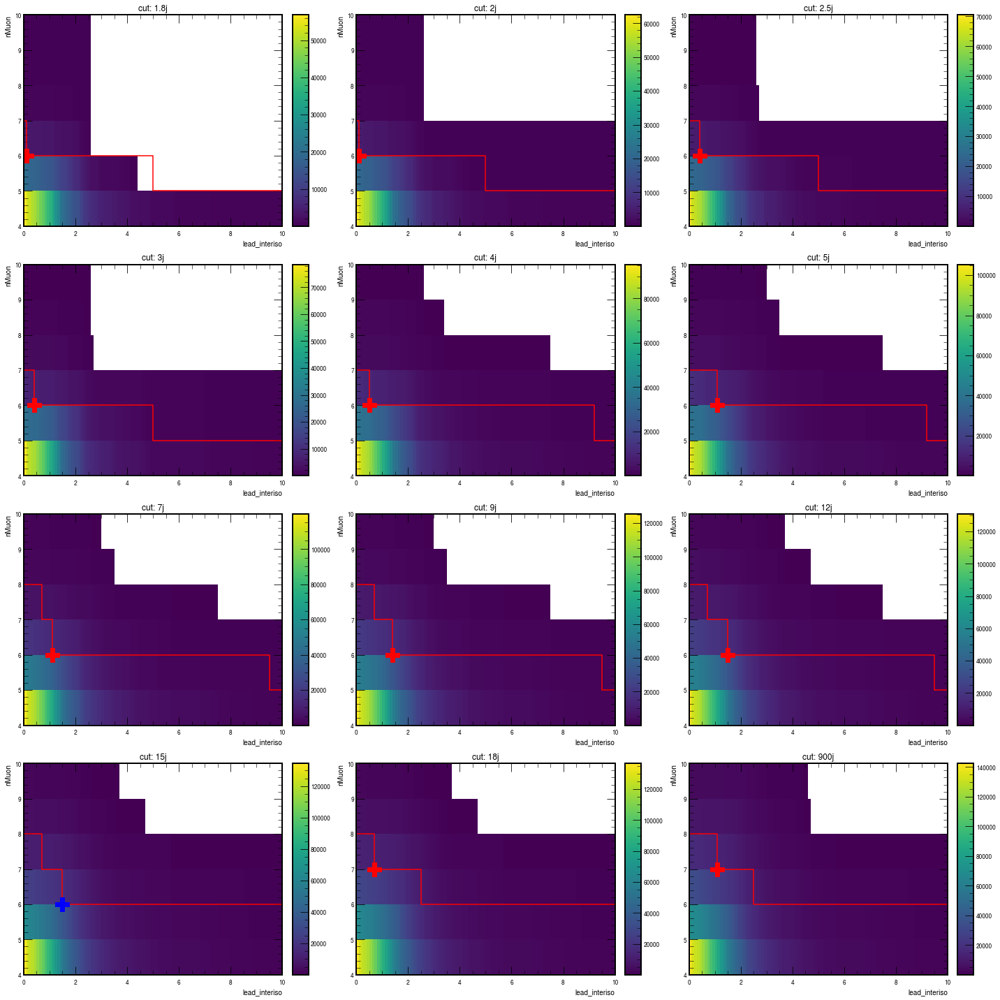

signal is SUEP-m400-darkPhoHad_2018

Yield at global max: 15212 ± 520 (3.4%)

Yield for 7j, (6, 1.1): 14607 ± 509 (3.5%) R_7j = 0.96

Yield for 9j, (6, 1.4): 14800 ± 513 (3.5%) R_9j = 0.97

Yield for 12j, (6, 1.5): 14810 ± 513 (3.5%) R_12j = 0.97

Yield for 15j, (6, 1.5): 15212 ± 520 (3.4%) R_15j = 1.00

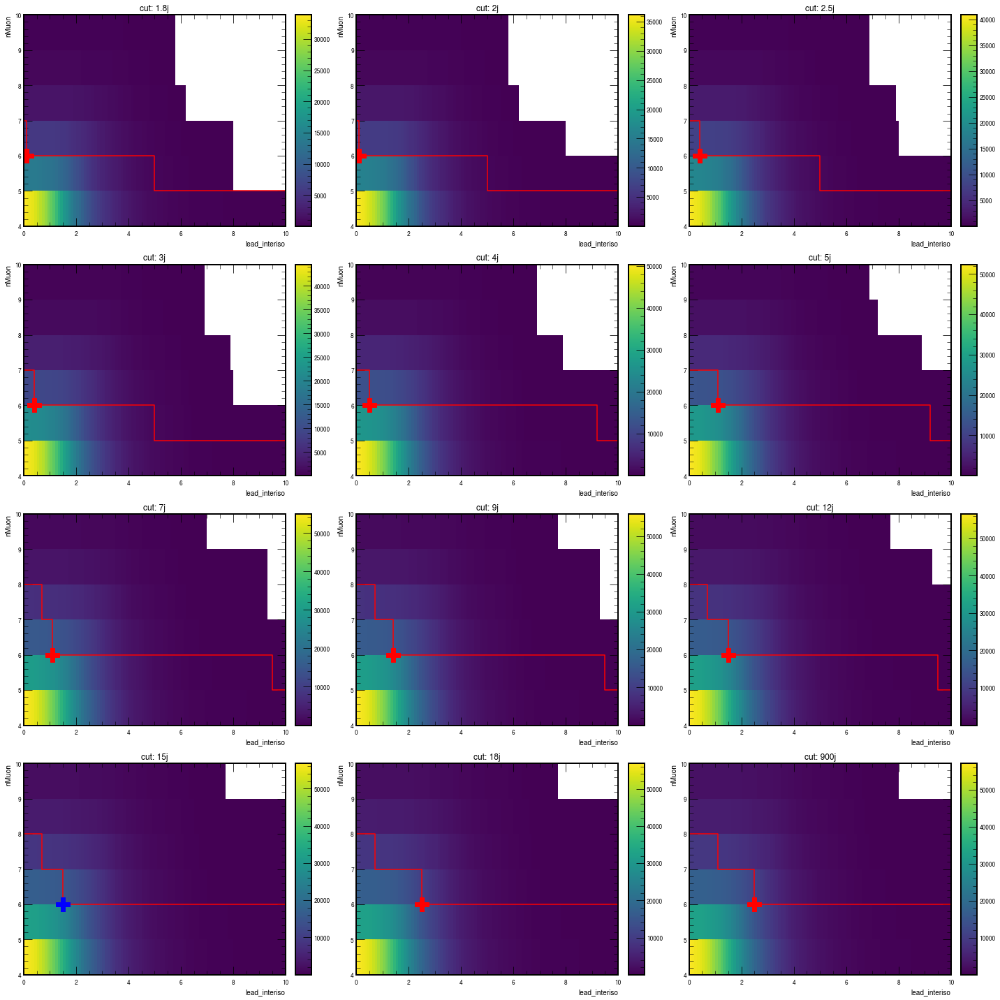

signal is SUEP-m750-darkPhoHad_2018

Yield at global max: 10362 ± 170 (1.6%)

Yield for 7j, (6, 1.1): 10123 ± 168 (1.7%) R_7j = 0.98

Yield for 9j, (6, 1.4): 10225 ± 169 (1.7%) R_9j = 0.99

Yield for 12j, (6, 1.5): 10256 ± 169 (1.6%) R_12j = 0.99

Yield for 15j, (6, 1.5): 10362 ± 170 (1.6%) R_15j = 1.00

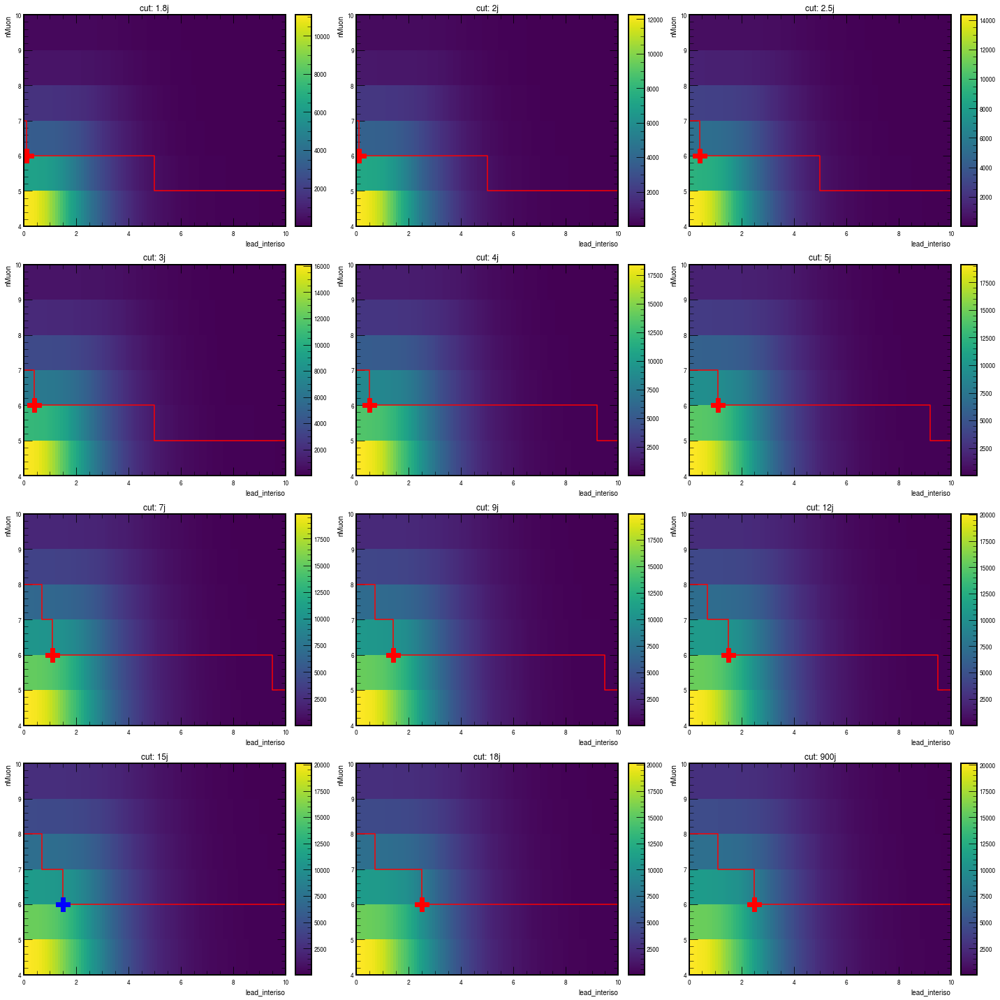

signal is SUEP-m1000-darkPhoHad_2018

Yield at global max: 6149 ± 80 (1.3%)

Yield for 7j, (6, 1.1): 5964 ± 79 (1.3%) R_7j = 0.97

Yield for 9j, (6, 1.4): 6042 ± 79 (1.3%) R_9j = 0.98

Yield for 12j, (6, 1.5): 6092 ± 79 (1.3%) R_12j = 0.99

Yield for 15j, (6, 1.5): 6149 ± 80 (1.3%) R_15j = 1.00

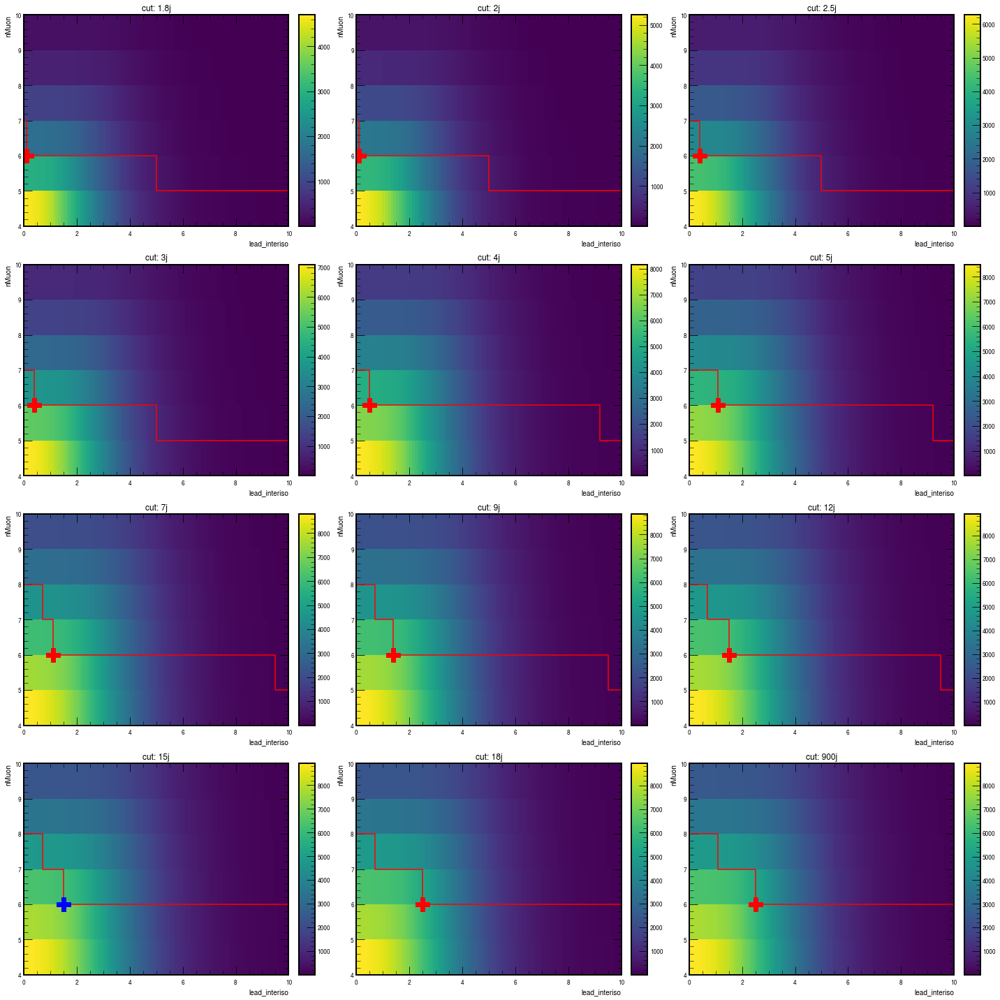

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018

Yield at global max: 1804 ± 682 (37.8%)

Yield for 900j, (7, 1.1): 1804 ± 682 (37.8%) R_900j = 1.00

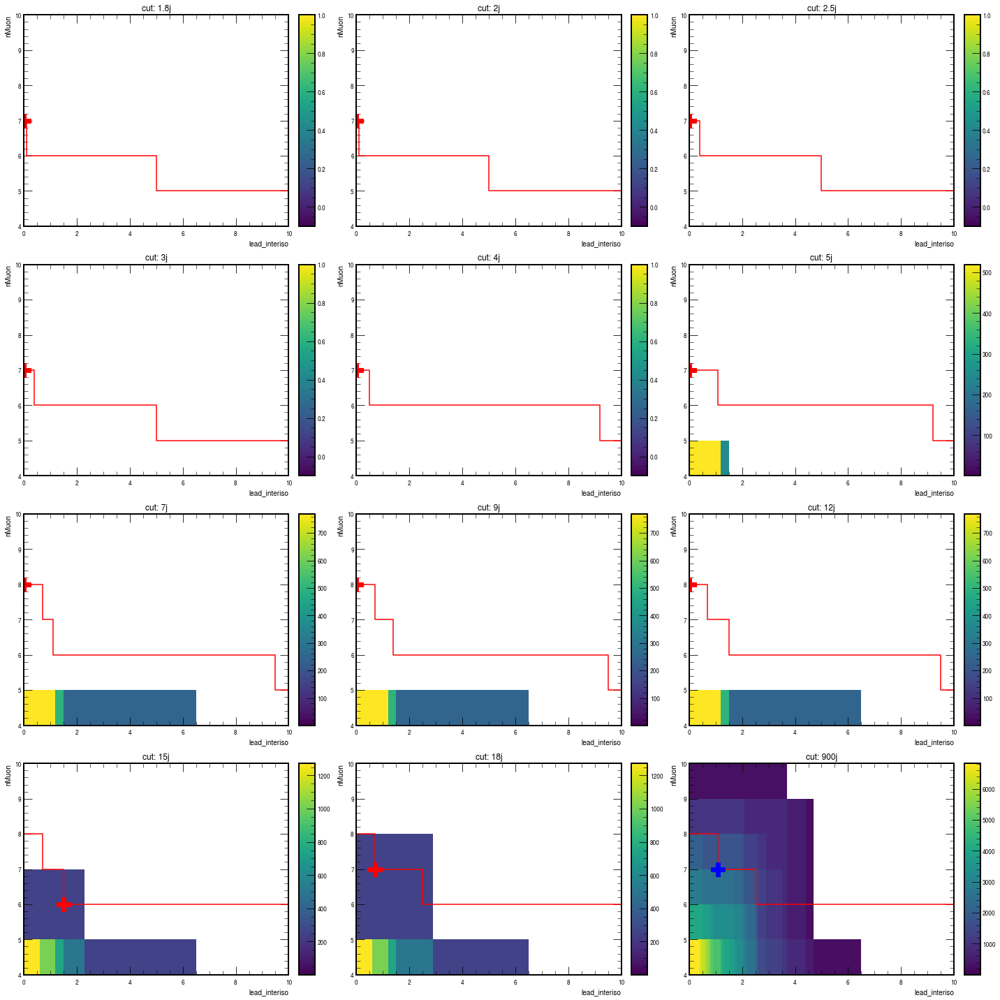

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018

Yield at global max: 6161 ± 1234 (20.0%)

Yield for 900j, (7, 1.1): 6161 ± 1234 (20.0%) R_900j = 1.00

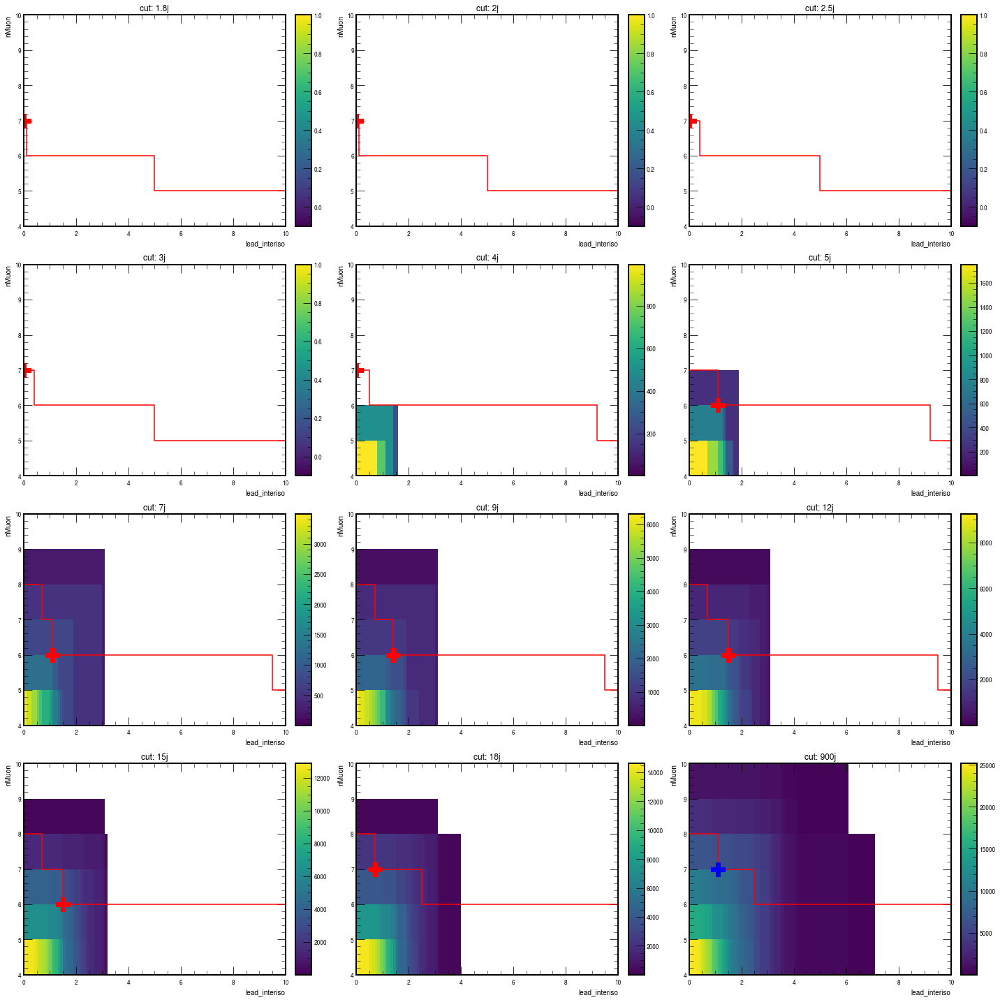

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018

Yield at global max: 7257 ± 1398 (19.3%)

Yield for 15j, (6, 1.5): 7046 ± 1384 (19.6%) R_15j = 0.97

Yield for 900j, (6, 2.5): 7257 ± 1398 (19.3%) R_900j = 1.00

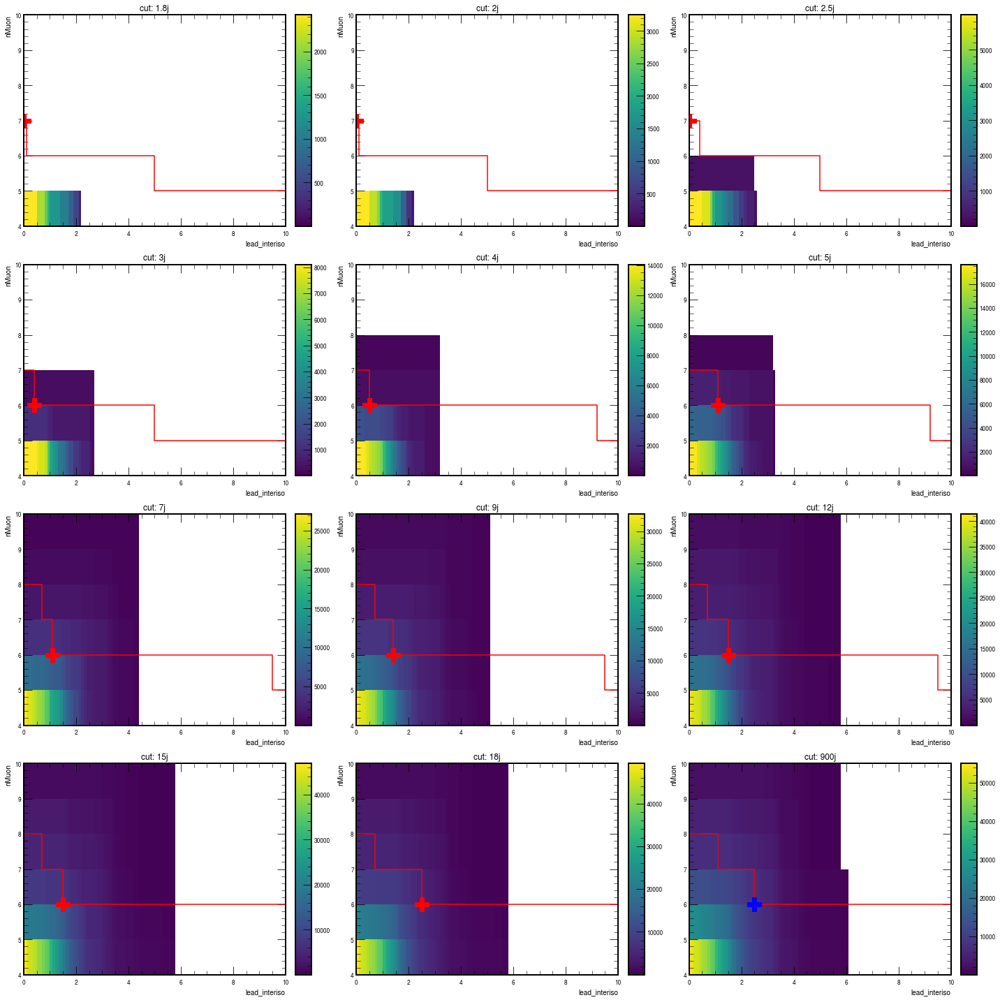

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-2.8_decay-darkPhoHad_2018

Yield at global max: 25763 ± 2554 (9.9%)

Yield for 15j, (6, 1.5): 25763 ± 2554 (9.9%) R_15j = 1.00

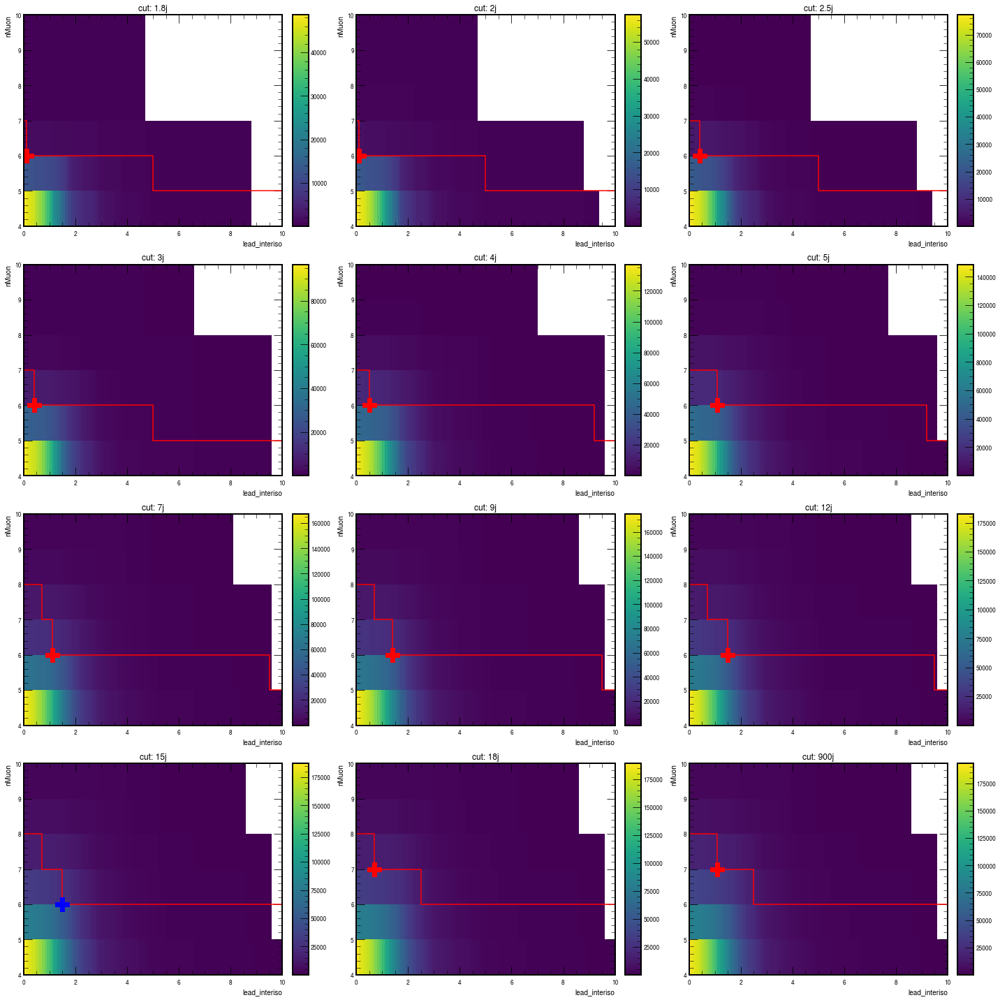

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-5.6_decay-darkPhoHad_2018

Yield at global max: 39838 ± 3397 (8.5%)

Yield for 7j, (6, 1.1): 39838 ± 3397 (8.5%) R_7j = 1.00

Yield for 9j, (6, 1.4): 36564 ± 3250 (8.9%) R_9j = 0.92

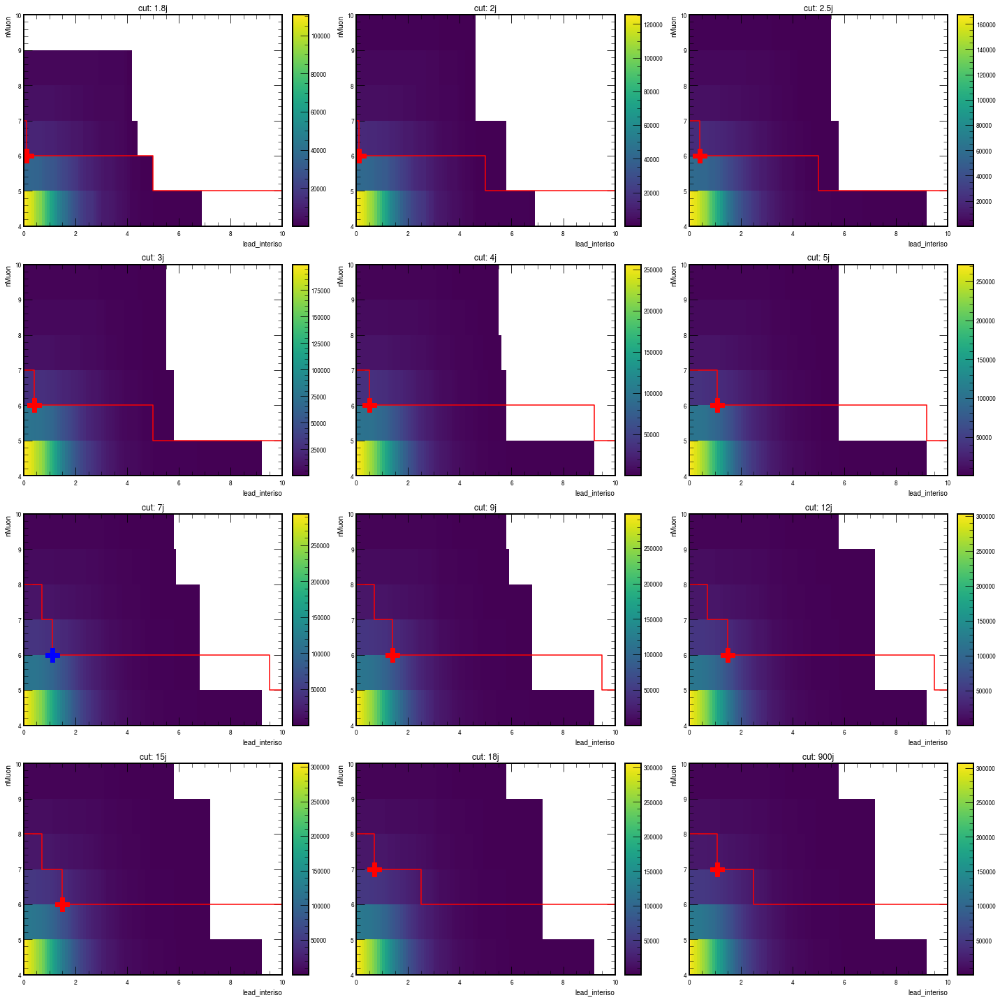

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018

Yield at global max: 5666 ± 1210 (21.4%)

Yield for 900j, (6, 2.5): 5666 ± 1210 (21.4%) R_900j = 1.00

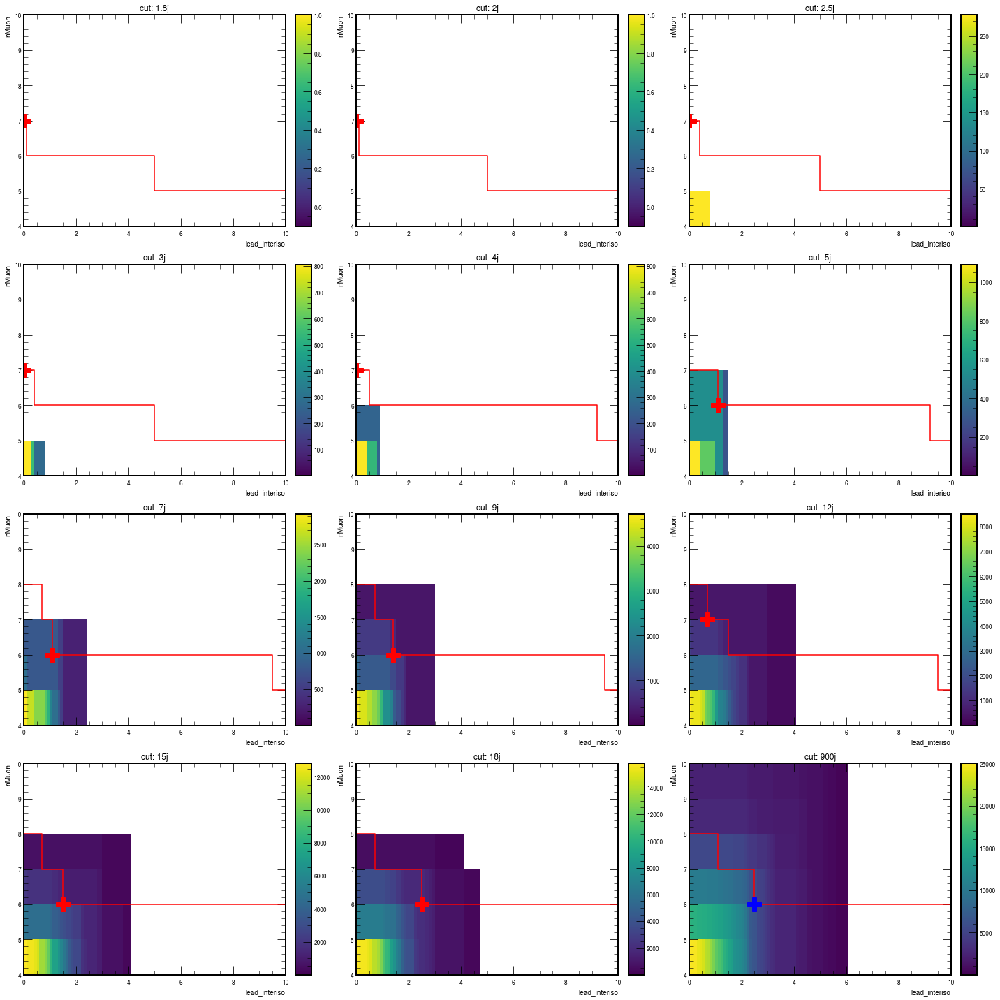

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPhoHad_2018

Yield at global max: 8526 ± 1558 (18.3%)

Yield for 900j, (7, 1.1): 8526 ± 1558 (18.3%) R_900j = 1.00

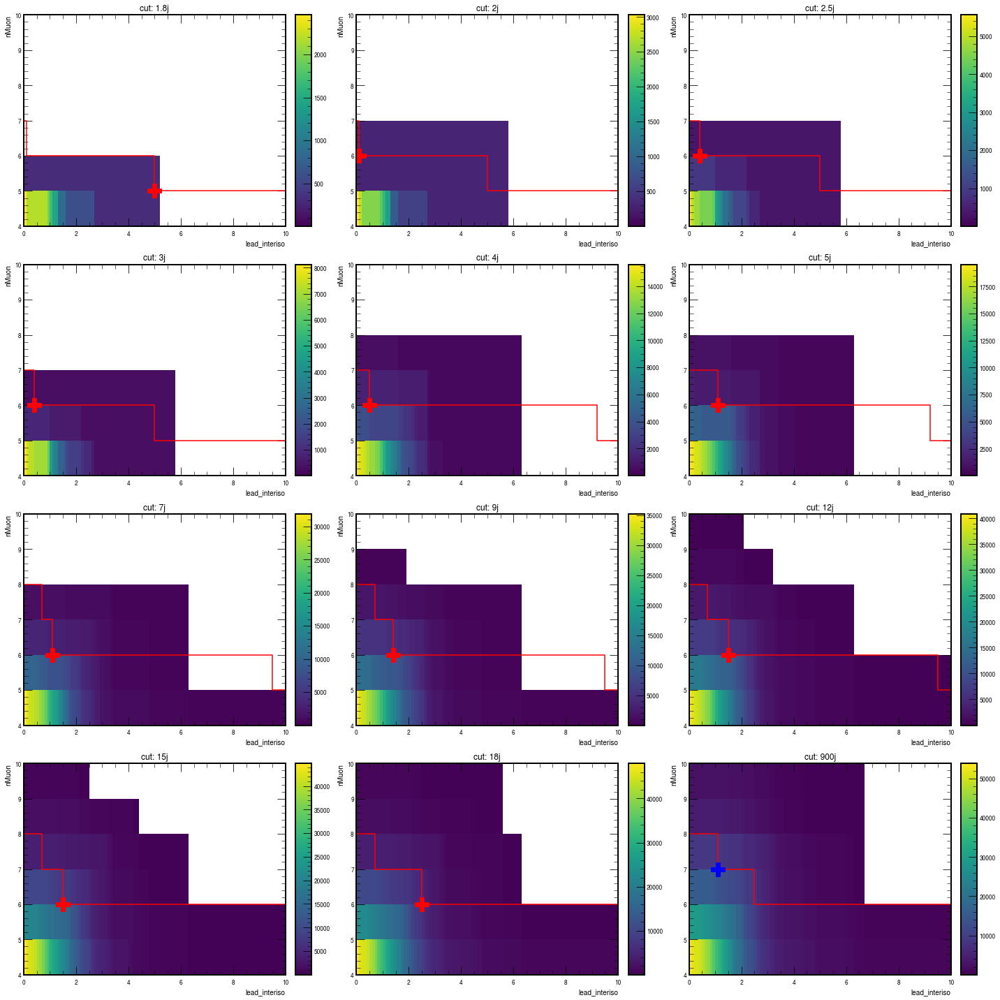

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018

Yield at global max: 17022 ± 2052 (12.1%)

Yield for 15j, (6, 1.5): 17022 ± 2052 (12.1%) R_15j = 1.00

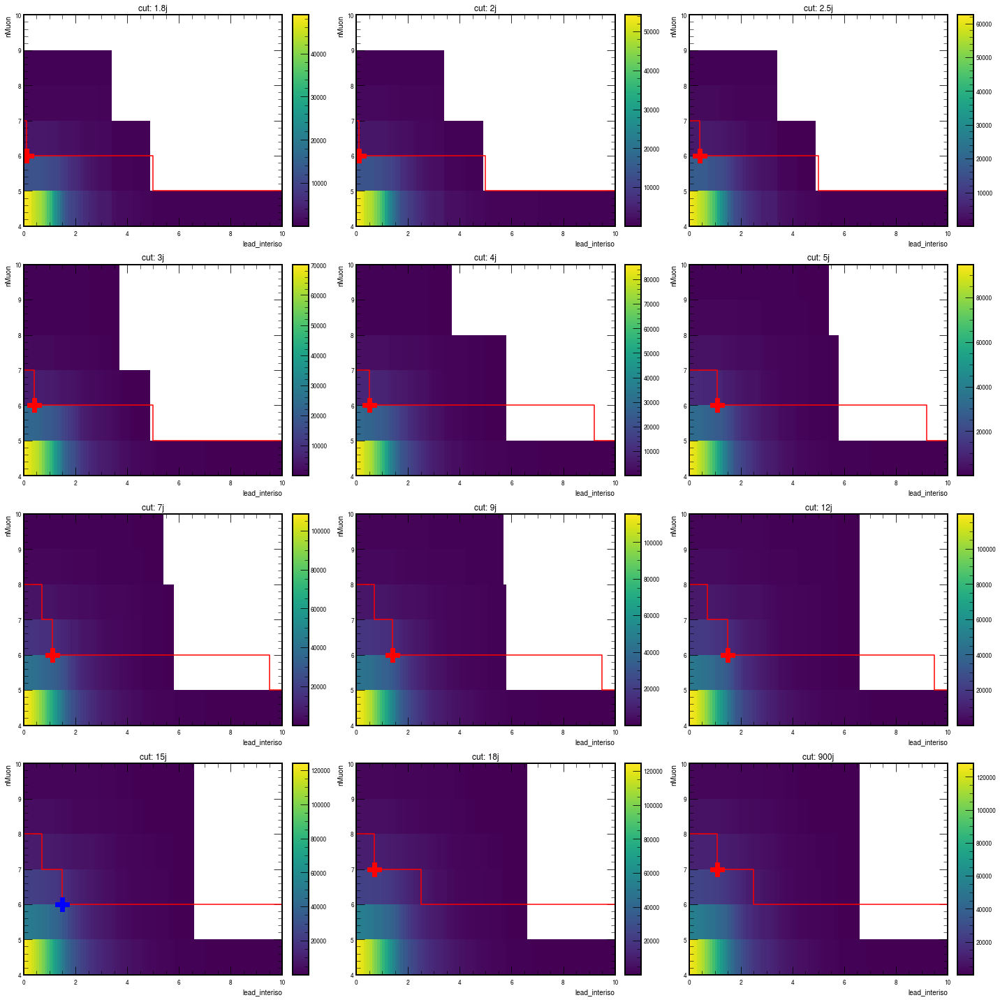

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018

Yield at global max: 27854 ± 2649 (9.5%)

Yield for 4j, (6, 0.5): 25650 ± 2544 (9.9%) R_4j = 0.92

Yield for 5j, (6, 1.1): 26190 ± 2573 (9.8%) R_5j = 0.94

Yield for 7j, (6, 1.1): 27854 ± 2649 (9.5%) R_7j = 1.00

Yield for 9j, (6, 1.4): 26536 ± 2583 (9.7%) R_9j = 0.95

Yield for 12j, (6, 1.5): 26097 ± 2564 (9.8%) R_12j = 0.94

Yield for 15j, (6, 1.5): 26875 ± 2603 (9.7%) R_15j = 0.96

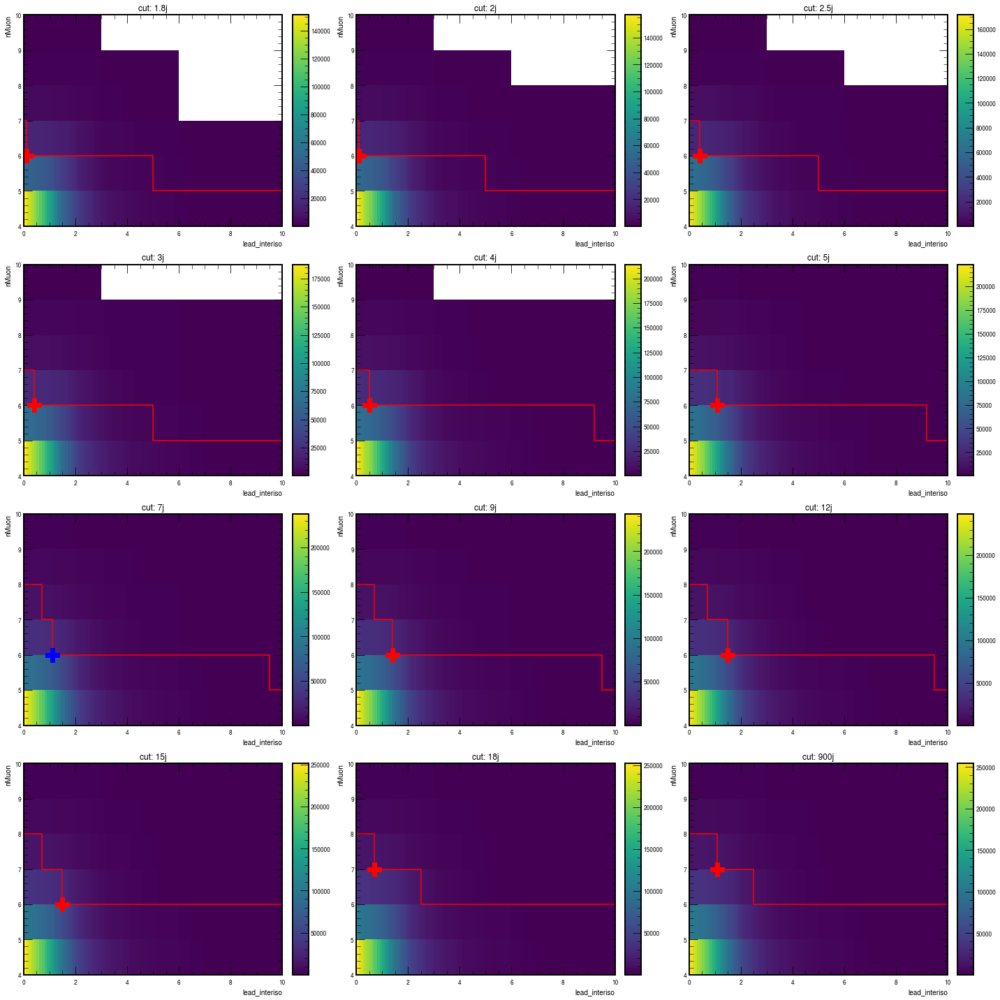

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018

Yield at global max: 29940 ± 2716 (9.1%)

Yield for 4j, (6, 0.5): 29940 ± 2716 (9.1%) R_4j = 1.00

Yield for 7j, (6, 1.1): 27674 ± 2620 (9.5%) R_7j = 0.92

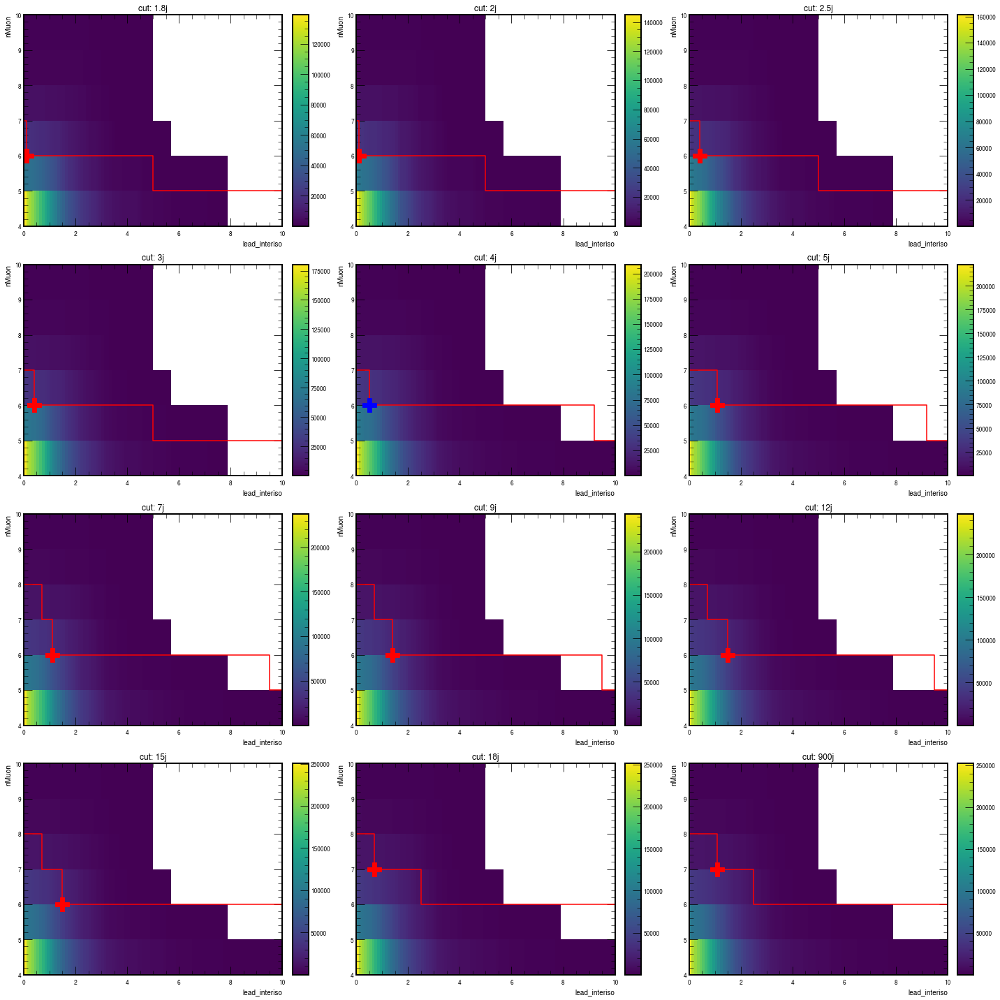

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018

Yield at global max: 16763 ± 2038 (12.2%)

Yield for 15j, (6, 1.5): 16763 ± 2038 (12.2%) R_15j = 1.00

Yield for 900j, (7, 1.1): 16263 ± 2007 (12.3%) R_900j = 0.97

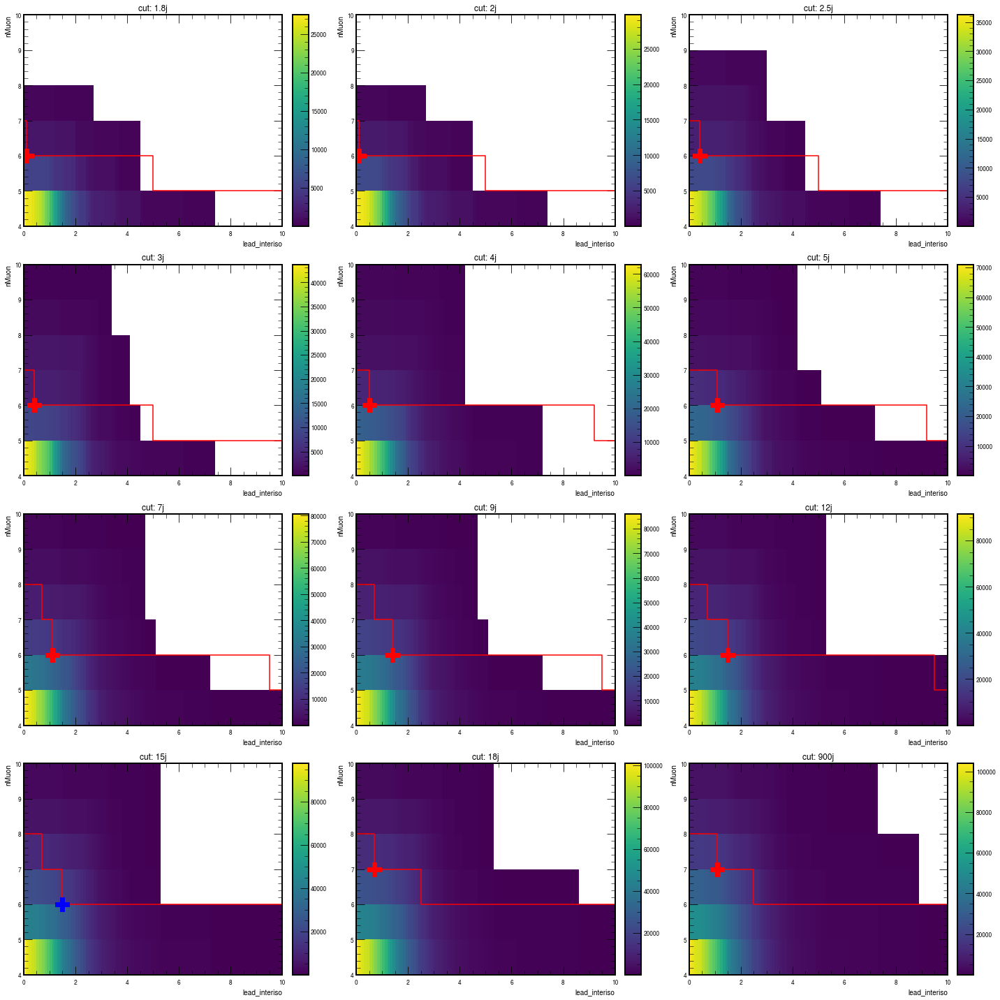

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPhoHad_2018

Yield at global max: 22606 ± 2361 (10.4%)

Yield for 7j, (6, 1.1): 20601 ± 2252 (10.9%) R_7j = 0.91

Yield for 9j, (6, 1.4): 20634 ± 2256 (10.9%) R_9j = 0.91

Yield for 12j, (6, 1.5): 21626 ± 2310 (10.7%) R_12j = 0.96

Yield for 15j, (6, 1.5): 22606 ± 2361 (10.4%) R_15j = 1.00

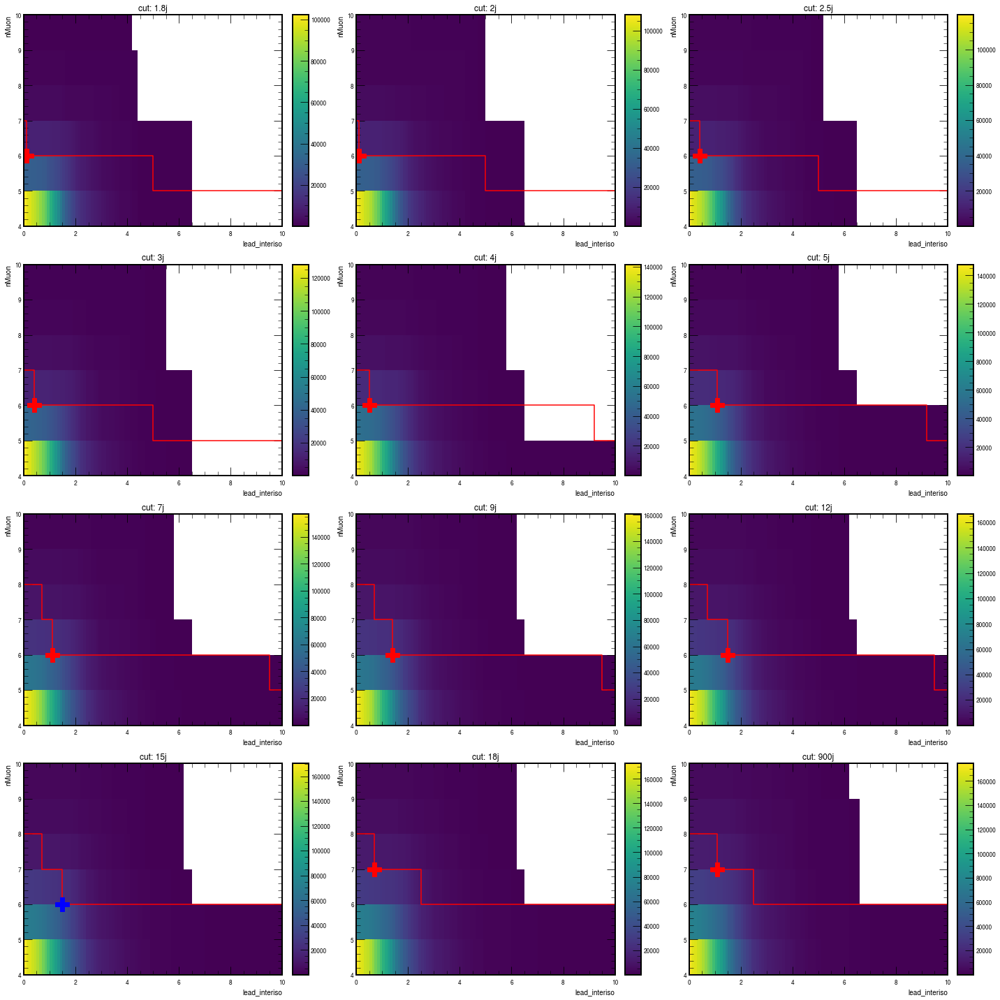

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018

Yield at global max: 32590 ± 2855 (8.8%)

Yield for 3j, (6, 0.4): 30102 ± 2744 (9.1%) R_3j = 0.92

Yield for 4j, (6, 0.5): 32590 ± 2855 (8.8%) R_4j = 1.00

Yield for 7j, (6, 1.1): 30241 ± 2745 (9.1%) R_7j = 0.93

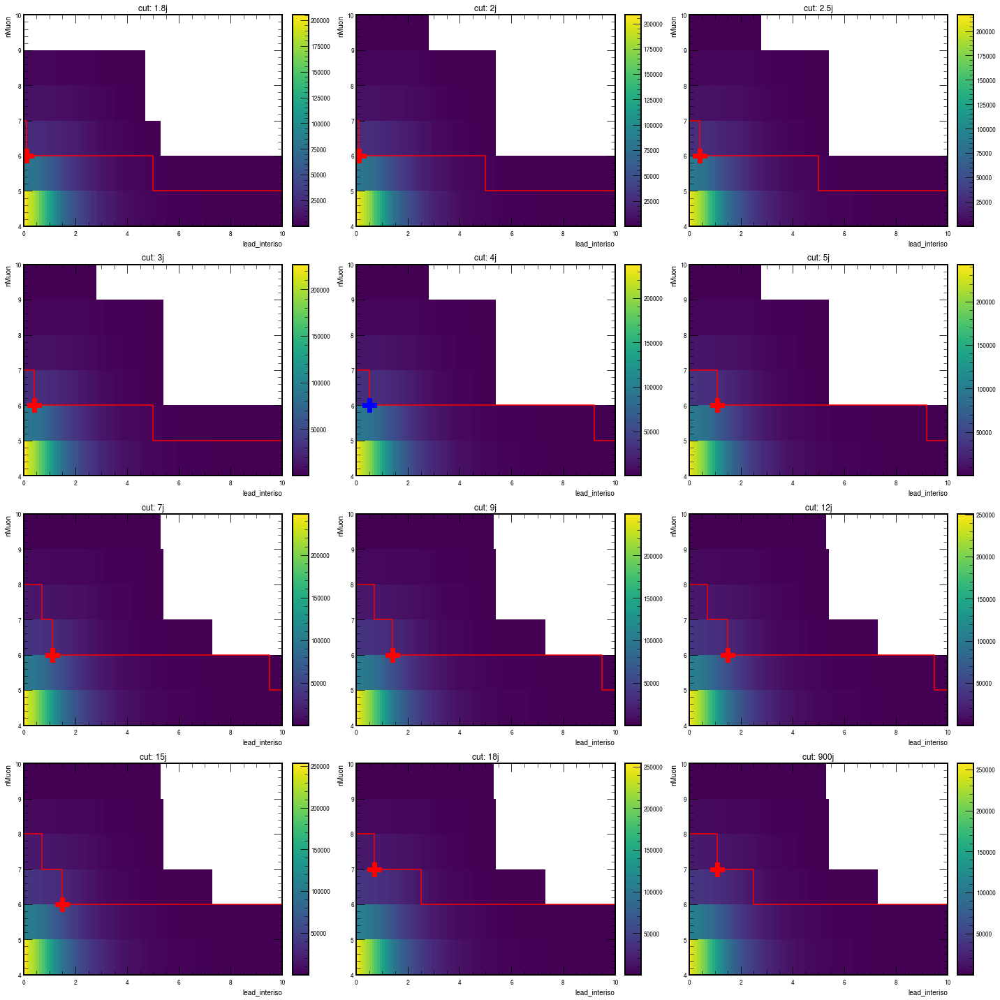

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPhoHad_2018

Yield at global max: 21429 ± 2302 (10.7%)

Yield for 1.8j, (6, 0.1): 19904 ± 2216 (11.1%) R_1.8j = 0.93

Yield for 2j, (6, 0.1): 20459 ± 2251 (11.0%) R_2j = 0.95

Yield for 2.5j, (6, 0.4): 20008 ± 2228 (11.1%) R_2.5j = 0.93

Yield for 3j, (6, 0.4): 20255 ± 2241 (11.1%) R_3j = 0.95

Yield for 4j, (6, 0.5): 21429 ± 2302 (10.7%) R_4j = 1.00

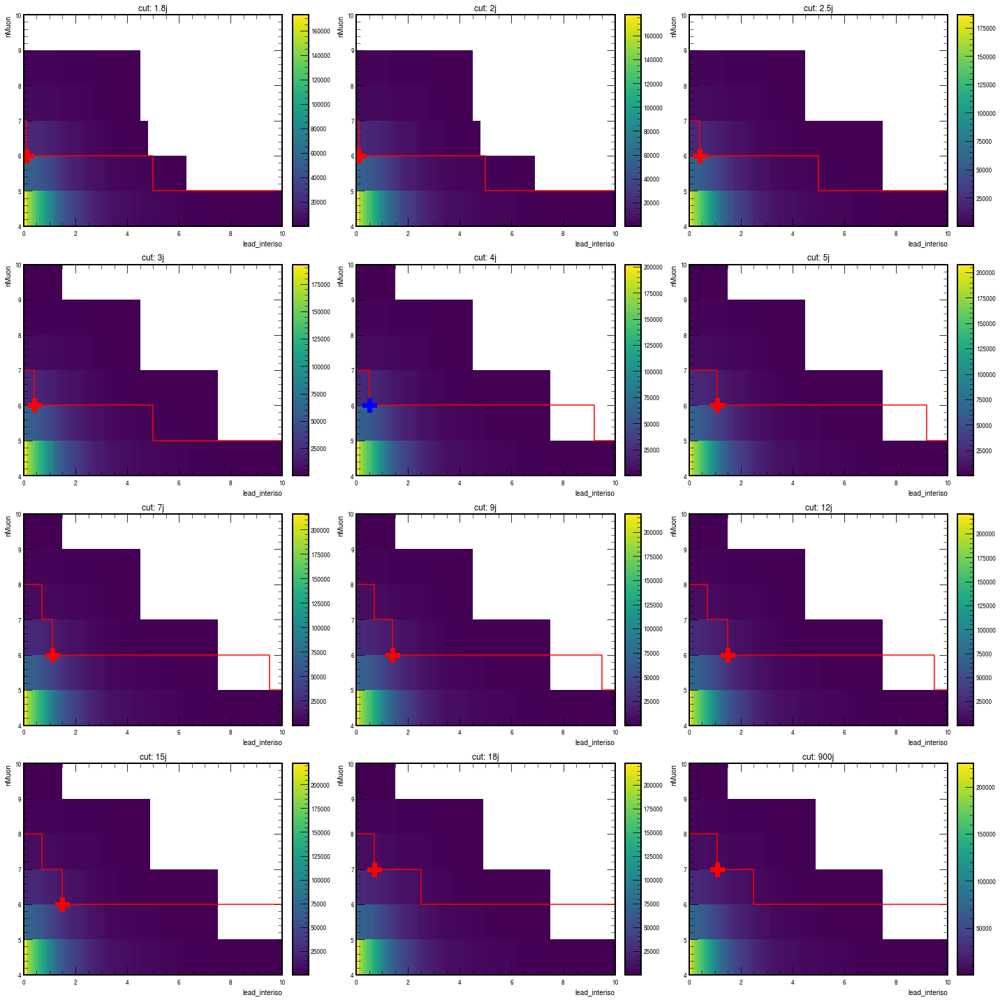

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018

Yield at global max: 9660 ± 1550 (16.0%)

Yield for 1.8j, (6, 0.1): 8911 ± 1488 (16.7%) R_1.8j = 0.92

Yield for 2j, (6, 0.1): 9158 ± 1509 (16.5%) R_2j = 0.95

Yield for 2.5j, (6, 0.4): 8895 ± 1486 (16.7%) R_2.5j = 0.92

Yield for 3j, (6, 0.4): 9396 ± 1527 (16.3%) R_3j = 0.97

Yield for 4j, (6, 0.5): 9660 ± 1550 (16.0%) R_4j = 1.00

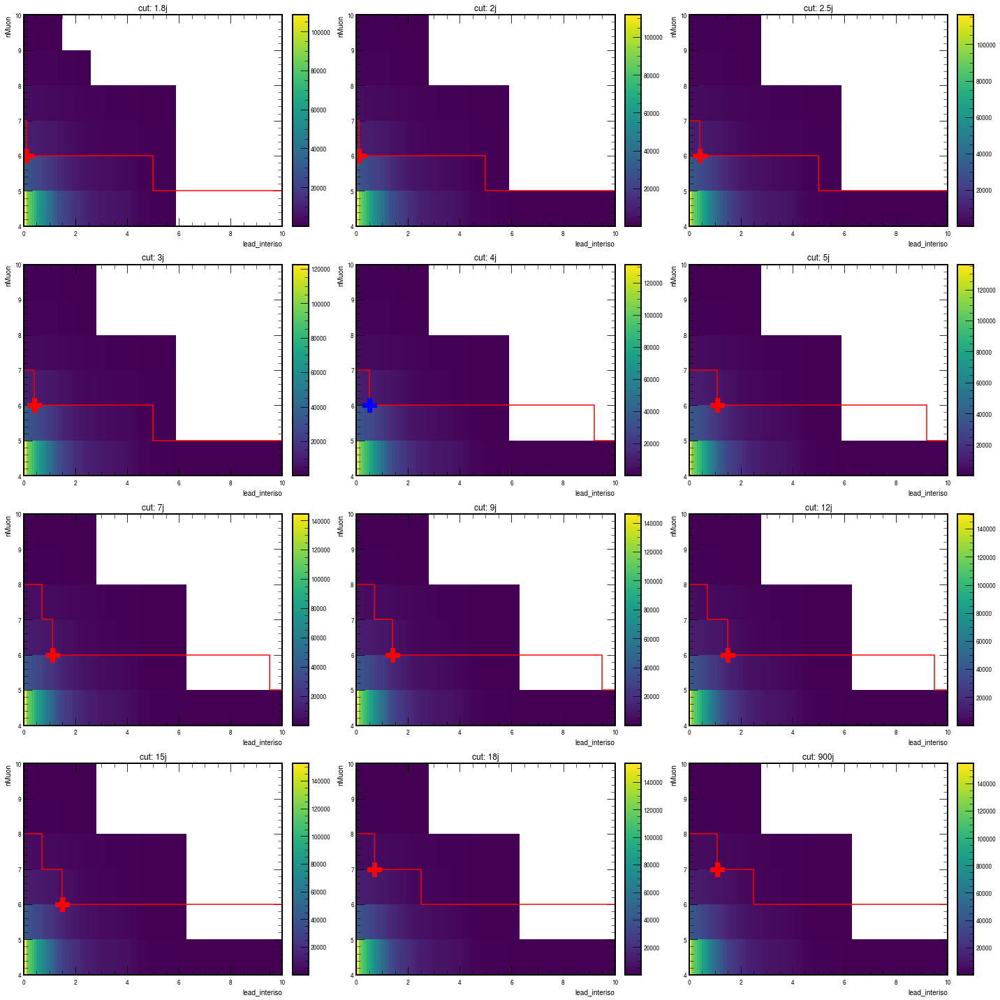

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018

Yield at global max: 35044 ± 2957 (8.4%)

Yield for 4j, (6, 0.5): 32731 ± 2854 (8.7%) R_4j = 0.93

Yield for 7j, (6, 1.1): 35044 ± 2957 (8.4%) R_7j = 1.00

Yield for 9j, (6, 1.4): 33789 ± 2903 (8.6%) R_9j = 0.96

Yield for 12j, (6, 1.5): 31741 ± 2811 (8.9%) R_12j = 0.91

Yield for 15j, (6, 1.5): 32474 ± 2843 (8.8%) R_15j = 0.93

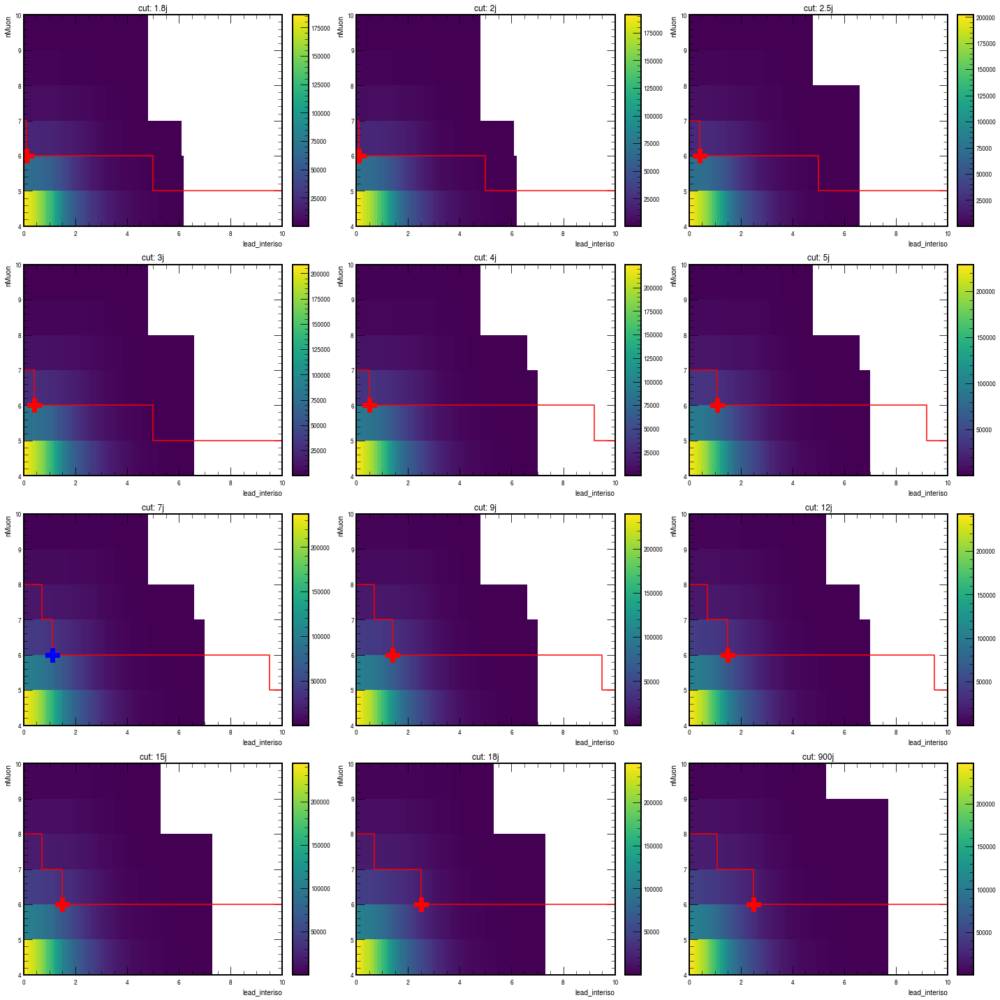

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPhoHad_2018

Yield at global max: 35367 ± 2954 (8.4%)

Yield for 2.5j, (6, 0.4): 32153 ± 2815 (8.8%) R_2.5j = 0.91

Yield for 3j, (6, 0.4): 33636 ± 2880 (8.6%) R_3j = 0.95

Yield for 4j, (6, 0.5): 35367 ± 2954 (8.4%) R_4j = 1.00

Yield for 5j, (6, 1.1): 33090 ± 2854 (8.6%) R_5j = 0.94

Yield for 7j, (6, 1.1): 34286 ± 2904 (8.5%) R_7j = 0.97

Yield for 9j, (6, 1.4): 32286 ± 2816 (8.7%) R_9j = 0.91

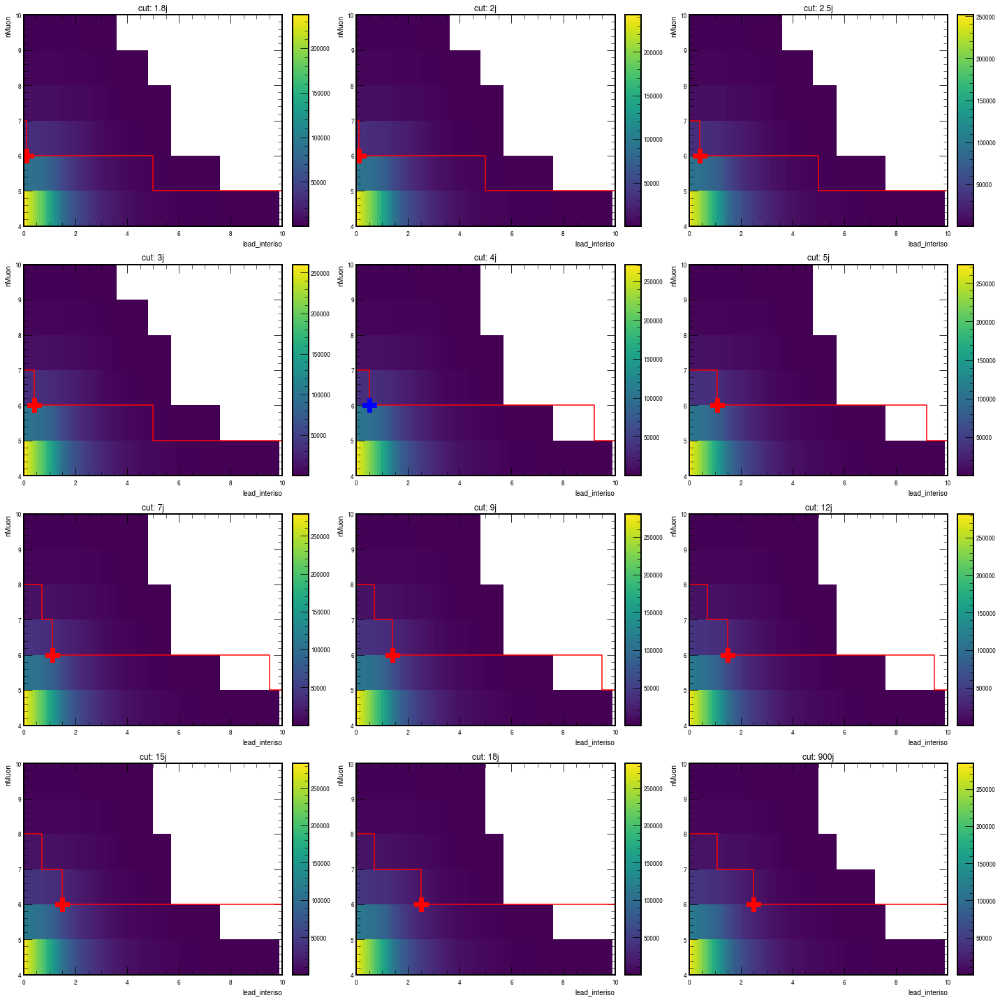

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018

Yield at global max: 23054 ± 2423 (10.5%)

Yield for 1.8j, (6, 0.1): 21773 ± 2354 (10.8%) R_1.8j = 0.94

Yield for 2j, (6, 0.1): 22024 ± 2368 (10.8%) R_2j = 0.96

Yield for 2.5j, (6, 0.4): 21811 ± 2358 (10.8%) R_2.5j = 0.95

Yield for 3j, (6, 0.4): 22562 ± 2398 (10.6%) R_3j = 0.98

Yield for 4j, (6, 0.5): 23054 ± 2423 (10.5%) R_4j = 1.00

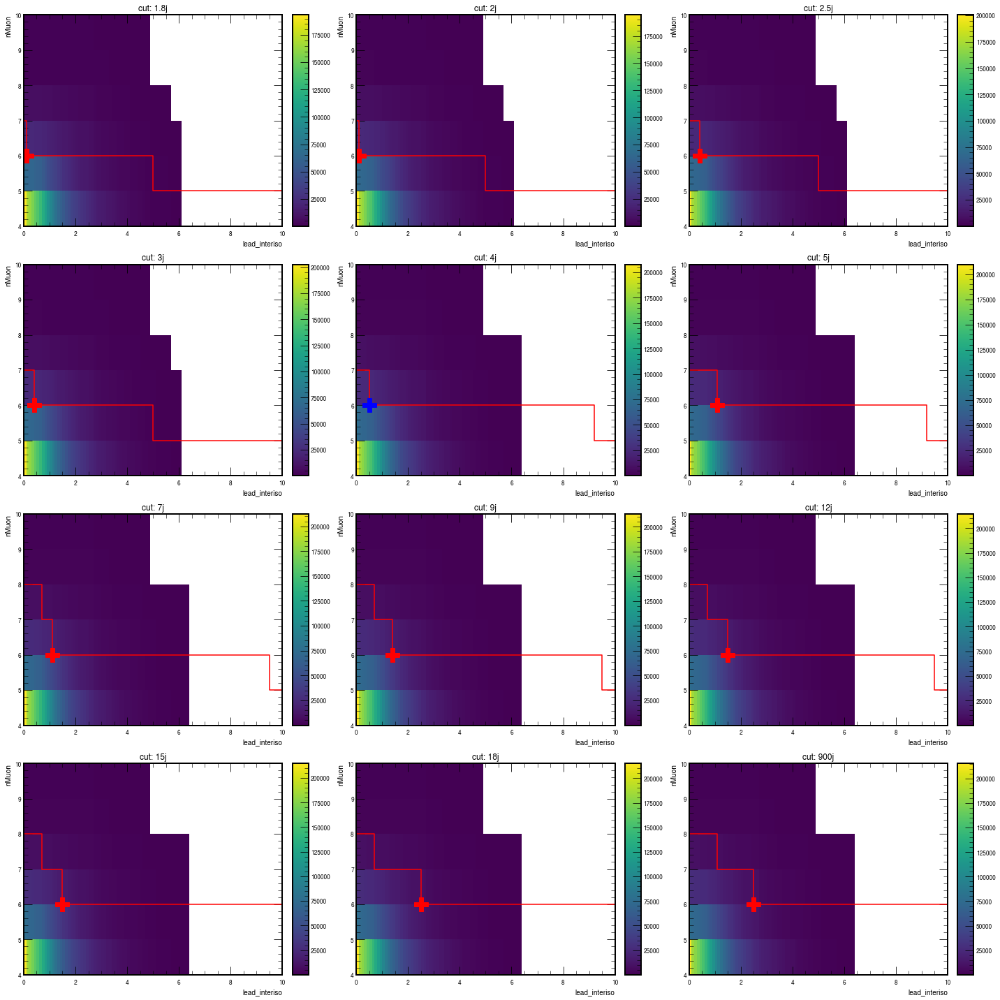

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018

Yield at global max: 11971 ± 1731 (14.5%)

Yield for 1.8j, (6, 0.1): 11971 ± 1731 (14.5%) R_1.8j = 1.00

Yield for 2j, (6, 0.1): 11971 ± 1731 (14.5%) R_2j = 1.00

Yield for 2.5j, (6, 0.4): 11182 ± 1670 (14.9%) R_2.5j = 0.93

Yield for 3j, (6, 0.4): 11182 ± 1670 (14.9%) R_3j = 0.93

Yield for 4j, (6, 0.5): 11191 ± 1672 (14.9%) R_4j = 0.93

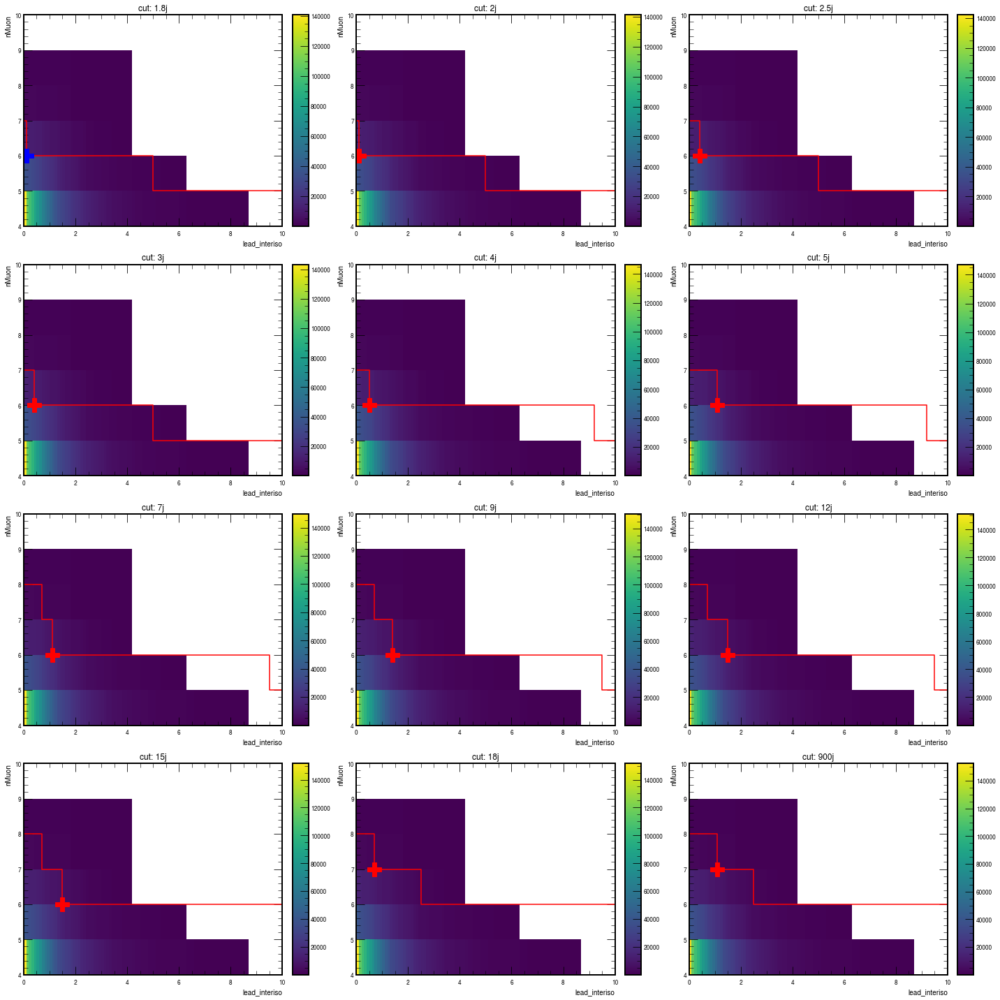

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018

Yield at global max: 5505 ± 1151 (20.9%)

Yield for 1.8j, (6, 0.1): 5505 ± 1151 (20.9%) R_1.8j = 1.00

Yield for 2j, (6, 0.1): 5505 ± 1151 (20.9%) R_2j = 1.00

Yield for 2.5j, (6, 0.4): 5019 ± 1098 (21.9%) R_2.5j = 0.91

Yield for 3j, (6, 0.4): 5019 ± 1098 (21.9%) R_3j = 0.91

Yield for 4j, (6, 0.5): 5019 ± 1098 (21.9%) R_4j = 0.91

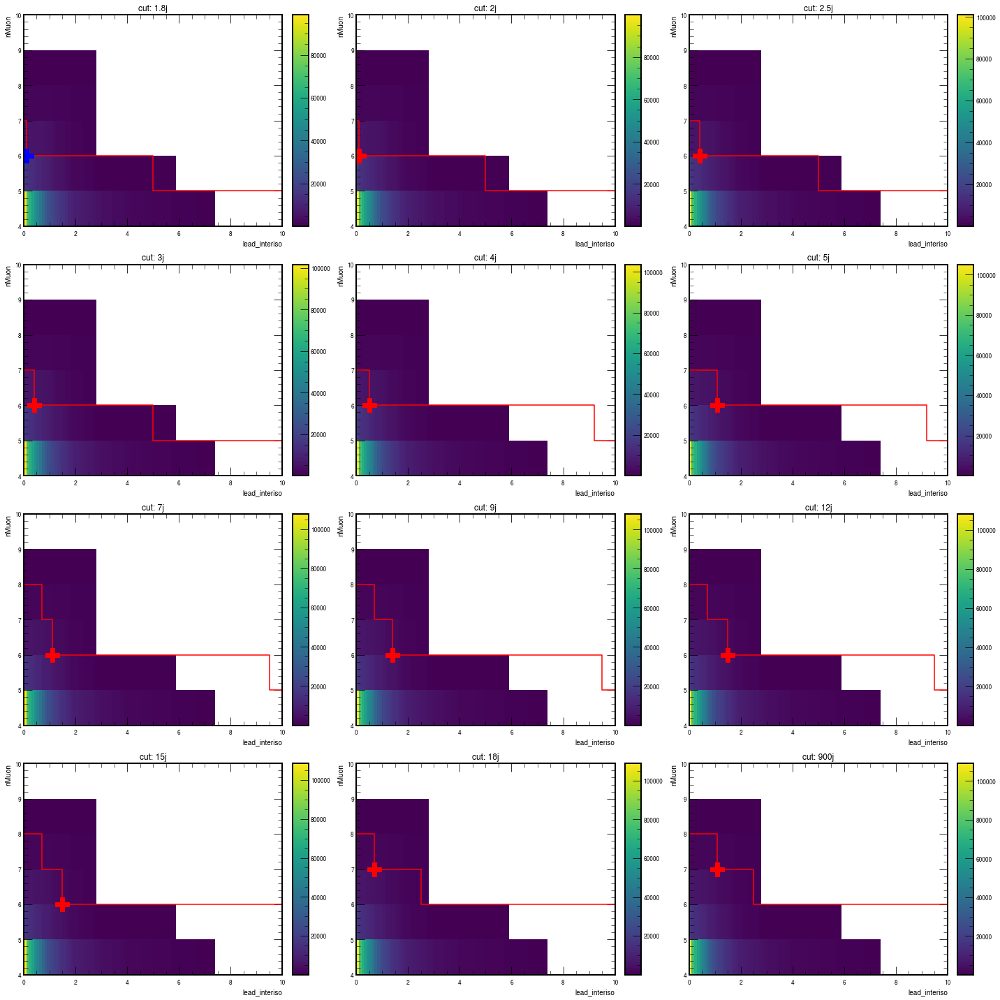

In [172]:
hist_name = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'
signals = [
    'SUEP-m125-darkPho_2018',
    'SUEP-m400-darkPho_2018',
    'SUEP-m750-darkPho_2018',
    'SUEP-m1000-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018',
    'SUEP-m125-darkPhoHad_2018',
    'SUEP-m400-darkPhoHad_2018',
    'SUEP-m750-darkPhoHad_2018',
    'SUEP-m1000-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-2.8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-5.6_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
]
muon_iso_cuts_man = [1.8j, 2j, 2.5j, 3j, 4j, 5j, 7j, 9j, 12j, 15j, 18j, 900j]

for signal in signals:
    h_s = plots[signal][hist_name].copy()
    fig, axs = plt.subplots(ncols=3, nrows=4, figsize=(20, 20))
    print(f"signal is {signal}")
    ax_i, ax_j = 0, 0
    global_max = 0
    global_max_var = 0
    max_global_point = None
    max_global_axs = None
    best_cuts = {}
    for iso_cut in muon_iso_cuts_man:
        if ax_i == 3:
            ax_i = 0
            ax_j += 1
        h_s_cumsum = h_s[:, iso_cut, :].copy().reset()
        for x in range(100):
            for y in range(6):
                h_s_cumsum[x, y] = h_s[x::sum, iso_cut, y::sum]
        hep.hist2dplot(
            h_s_cumsum, 
            ax=axs[ax_j, ax_i],
            #norm=matplotlib.colors.LogNorm(),
            cmin=1
        )
        axs[ax_j, ax_i].set_title(f"cut: {iso_cut}")
        line_x, line_y = convert_points_to_plot(points_0p5_man[iso_cut])
        axs[ax_j, ax_i].plot(line_x, line_y, color='red')
        # line_x, line_y = convert_points_to_plot(points_1p0[iso_cut])
        # axs[ax_j, ax_i].plot(line_x, line_y, color='magenta')
        temp_max = 0
        temp_max_var = 0
        max_point = points_0p5_man[iso_cut][0]
        #print(f"{iso_cut}: [", end="")
        for p in points_0p5_man[iso_cut]:
            #print(f"{h_s_cumsum[p[0]*1j, p[1]*1j].value:.2f}, ", end="")
            if h_s_cumsum[p[0]*1j, p[1]*1j].value > temp_max:
                temp_max = h_s_cumsum[p[0]*1j, p[1]*1j].value
                temp_max_var = h_s_cumsum[p[0]*1j, p[1]*1j].variance
                max_point = p
        #print("]")
        if temp_max > global_max:
            global_max = temp_max
            global_max_var = temp_max_var
            max_global_point = max_point
            max_global_axs = (ax_j, ax_i)
        axs[ax_j, ax_i].plot(
            *max_point, color='r', marker='P', markersize=20
        )
        best_cuts[iso_cut] = max_point
        ax_i += 1
    print(
        f"Yield at global max: {global_max:.0f} ± {math.sqrt(global_max_var):.0f} "
        f"({100 * math.sqrt(global_max_var)/global_max:.1f}%)"
    )
    for iso_cut in muon_iso_cuts_man:
        comparison_with_best(best_cuts[iso_cut], iso_cut, global_max, {})
    axs[max_global_axs[0], max_global_axs[1]].plot(
        *max_global_point, color='b', marker='P', markersize=20
    )
    fig.tight_layout()
    plt.show()

## Run over signal fast

In [141]:
hist_name = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'
signals = [
    'SUEP-m125-darkPho_2018',
    'SUEP-m400-darkPho_2018',
    'SUEP-m750-darkPho_2018',
    'SUEP-m1000-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018',
    'SUEP-m125-darkPhoHad_2018',
    'SUEP-m400-darkPhoHad_2018',
    'SUEP-m750-darkPhoHad_2018',
    'SUEP-m1000-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-2.8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-5.6_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
]
#muon_iso_cuts = [1.8j, 2j, 2.5j, 3j, 4j, 5j, 7j, 9j, 12j, 15j, 18j, 900j]
muon_iso_cuts = np.round(np.logspace(np.log10(1), np.log10(190.546072), 58) * 1.01, 2) * 1j

ultimate_cut_set = set()
for signal in signals:
    h_s = plots[signal][hist_name].copy()
    print(f"signal is {signal}")
    global_max = 0
    global_max_var = 0
    max_global_point = None
    max_global_axs = None
    best_cuts = {}
    for iso_cut in muon_iso_cuts:
        h_s_cumsum = h_s[:, iso_cut, :].copy().reset()
        for x in range(100):
            for y in range(6):
                h_s_cumsum[x, y] = h_s[x::sum, iso_cut, y::sum]
        temp_max = 0
        temp_max_var = 0
        max_point = points_0p5[iso_cut][0]
        #print(f"{iso_cut}: [", end="")
        for p in points_0p5[iso_cut]:
            #print(f"{h_s_cumsum[p[0]*1j, p[1]*1j].value:.2f}, ", end="")
            if h_s_cumsum[p[0]*1j, p[1]*1j].value > temp_max:
                temp_max = h_s_cumsum[p[0]*1j, p[1]*1j].value
                temp_max_var = h_s_cumsum[p[0]*1j, p[1]*1j].variance
                max_point = p
        #print("]")
        if temp_max > global_max:
            global_max = temp_max
            global_max_var = temp_max_var
            max_global_point = max_point
            max_global_axs = (ax_j, ax_i)
        best_cuts[iso_cut] = max_point
    print(
        f"\tYield at global max: {global_max:.0f} ± {math.sqrt(global_max_var):.0f} "
        f"({100 * math.sqrt(global_max_var)/global_max:.1f}%)"
    )
    for iso_cut in muon_iso_cuts:
         comparison_with_best(
            best_cuts[iso_cut], iso_cut, global_max, ultimate_cut_set
        )
    print(ultimate_cut_set)

signal is SUEP-m125-darkPho_2018

Yield at global max: 288908 ± 8602 (3.0%)

Yield for 6.99j, (6, 1.1): 286859 ± 8571 (3.0%) R_6.99j = 0.99

Yield for 7.66j, (6, 1.1): 288908 ± 8602 (3.0%) R_7.66j = 1.00

Yield for 9.21j, (6, 1.4): 284668 ± 8536 (3.0%) R_9.21j = 0.99

{(1.1, 7.66j, 6)}

signal is SUEP-m400-darkPho_2018

Yield at global max: 131630 ± 1537 (1.2%)

Yield for 3.67j, (6, 0.5): 129914 ± 1527 (1.2%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 130493 ± 1530 (1.2%) R_4.02j = 0.99

Yield for 4.41j, (6, 1.1): 130348 ± 1529 (1.2%) R_4.41j = 0.99

Yield for 4.83j, (6, 1.1): 130782 ± 1532 (1.2%) R_4.83j = 0.99

Yield for 5.3j, (6, 1.1): 131075 ± 1533 (1.2%) R_5.3j = 1.00

Yield for 5.81j, (6, 1.1): 131270 ± 1535 (1.2%) R_5.81j = 1.00

Yield for 6.37j, (6, 1.1): 131415 ± 1535 (1.2%) R_6.37j = 1.00

Yield for 6.99j, (6, 1.1): 131558 ± 1536 (1.2%) R_6.99j = 1.00

Yield for 7.66j, (6, 1.1): 131630 ± 1537 (1.2%) R_7.66j = 1.00

Yield for 8.4j, (6, 1.4): 131025 ± 1533 (1.2%) R_8.4j = 1.00

Yield for 9.21j, (6, 1.4): 131046 ± 1533 (1.2%) R_9.21j = 1.00

Yield for 10.1j, (6, 1.5): 130097 ± 1528 (1.2%) R_10.1j = 0.99

Yield for 11.07j, (6, 1.5): 130132 ± 1528 (1.2%) R_11.07j = 0.99

Yield for 12.14j, (6, 1.5): 130253 ± 1529 (1.2%) R_12.14j = 0.99

Yield for 13.31j, (6, 1.5): 130253 ± 1529 (1.2%) R_13.31j = 0.99

Yield for 14.6j, (6, 1.5): 130270 ± 1529 (1.2%) R_14.6j = 0.99

Yield for 16.01j, (6, 1.5): 130270 ± 1529 (1.2%) R_16.01j = 0.99

{(1.1, 7.66j, 6)}

signal is SUEP-m750-darkPho_2018

Yield at global max: 27449 ± 277 (1.0%)

Yield for 2.78j, (6, 0.4): 27014 ± 275 (1.0%) R_2.78j = 0.98

Yield for 3.05j, (6, 0.4): 27145 ± 276 (1.0%) R_3.05j = 0.99

Yield for 3.34j, (6, 0.5): 27221 ± 276 (1.0%) R_3.34j = 0.99

Yield for 3.67j, (6, 0.5): 27297 ± 276 (1.0%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 27342 ± 277 (1.0%) R_4.02j = 1.00

Yield for 4.41j, (6, 1.1): 27349 ± 277 (1.0%) R_4.41j = 1.00

Yield for 4.83j, (6, 1.1): 27383 ± 277 (1.0%) R_4.83j = 1.00

Yield for 5.3j, (6, 1.1): 27414 ± 277 (1.0%) R_5.3j = 1.00

Yield for 5.81j, (6, 1.1): 27430 ± 277 (1.0%) R_5.81j = 1.00

Yield for 6.37j, (6, 1.1): 27441 ± 277 (1.0%) R_6.37j = 1.00

Yield for 6.99j, (6, 1.1): 27449 ± 277 (1.0%) R_6.99j = 1.00

Yield for 7.66j, (6, 1.1): 27449 ± 277 (1.0%) R_7.66j = 1.00

Yield for 8.4j, (6, 1.4): 27447 ± 277 (1.0%) R_8.4j = 1.00

Yield for 9.21j, (6, 1.4): 27447 ± 277 (1.0%) R_9.21j = 1.00

Yield for 10.1j, (6, 1.5): 27439 ± 277 (1.0%) R_10.1j = 1.00

Yield for 11.07j, (6, 1.5): 27439 ± 277 (1.0%) R_11.07j = 1.00

Yield for 12.14j, (6, 1.5): 27442 ± 277 (1.0%) R_12.14j = 1.00

Yield for 13.31j, (6, 1.5): 27442 ± 277 (1.0%) R_13.31j = 1.00

Yield for 14.6j, (6, 1.5): 27442 ± 277 (1.0%) R_14.6j = 1.00

Yield for 16.01j, (6, 1.5): 27444 ± 277 (1.0%) R_16.01j = 1.00

Yield for 17.55j, (6, 2.5): 27202 ± 276 (1.0%) R_17.55j = 0.99

Yield for 19.25j, (6, 2.5): 27205 ± 276 (1.0%) R_19.25j = 0.99

Yield for 21.1j, (6, 2.5): 27205 ± 276 (1.0%) R_21.1j = 0.99

Yield for 23.14j, (6, 2.5): 27208 ± 276 (1.0%) R_23.14j = 0.99

Yield for 25.37j, (6, 2.5): 27208 ± 276 (1.0%) R_25.37j = 0.99

Yield for 27.82j, (6, 2.5): 27208 ± 276 (1.0%) R_27.82j = 0.99

Yield for 30.5j, (6, 2.5): 27208 ± 276 (1.0%) R_30.5j = 0.99

Yield for 33.44j, (6, 2.5): 27208 ± 276 (1.0%) R_33.44j = 0.99

Yield for 36.67j, (6, 2.5): 27210 ± 276 (1.0%) R_36.67j = 0.99

Yield for 40.21j, (6, 2.5): 27210 ± 276 (1.0%) R_40.21j = 0.99

Yield for 44.09j, (6, 2.5): 27210 ± 276 (1.0%) R_44.09j = 0.99

Yield for 48.34j, (6, 2.5): 27216 ± 276 (1.0%) R_48.34j = 0.99

Yield for 53.01j, (6, 2.5): 27216 ± 276 (1.0%) R_53.01j = 0.99

Yield for 58.12j, (6, 2.5): 27216 ± 276 (1.0%) R_58.12j = 0.99

Yield for 63.73j, (6, 2.5): 27216 ± 276 (1.0%) R_63.73j = 0.99

Yield for 69.87j, (6, 2.5): 27216 ± 276 (1.0%) R_69.87j = 0.99

Yield for 76.62j, (6, 2.5): 27216 ± 276 (1.0%) R_76.62j = 0.99

Yield for 84.01j, (6, 2.5): 27216 ± 276 (1.0%) R_84.01j = 0.99

Yield for 92.11j, (6, 2.5): 27216 ± 276 (1.0%) R_92.11j = 0.99

Yield for 101j, (6, 2.5): 27216 ± 276 (1.0%) R_101j = 0.99

Yield for 110.74j, (6, 2.5): 27216 ± 276 (1.0%) R_110.74j = 0.99

Yield for 121.43j, (6, 2.5): 27216 ± 276 (1.0%) R_121.43j = 0.99

Yield for 133.14j, (6, 2.5): 27216 ± 276 (1.0%) R_133.14j = 0.99

Yield for 145.99j, (6, 2.5): 27216 ± 276 (1.0%) R_145.99j = 0.99

Yield for 160.07j, (6, 2.5): 27216 ± 276 (1.0%) R_160.07j = 0.99

Yield for 175.52j, (6, 2.5): 27216 ± 276 (1.0%) R_175.52j = 0.99

Yield for 192.45j, (6, 2.5): 27216 ± 276 (1.0%) R_192.45j = 0.99

{(1.1, 6.99j, 6), (1.1, 7.66j, 6)}

signal is SUEP-m1000-darkPho_2018

Yield at global max: 10284 ± 103 (1.0%)

Yield for 2.31j, (6, 0.4): 10113 ± 102 (1.0%) R_2.31j = 0.98

Yield for 2.54j, (6, 0.4): 10151 ± 103 (1.0%) R_2.54j = 0.99

Yield for 2.78j, (6, 0.4): 10189 ± 103 (1.0%) R_2.78j = 0.99

Yield for 3.05j, (6, 0.4): 10228 ± 103 (1.0%) R_3.05j = 0.99

Yield for 3.34j, (6, 0.5): 10248 ± 103 (1.0%) R_3.34j = 1.00

Yield for 3.67j, (6, 0.5): 10259 ± 103 (1.0%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 10272 ± 103 (1.0%) R_4.02j = 1.00

Yield for 4.41j, (6, 1.1): 10270 ± 103 (1.0%) R_4.41j = 1.00

Yield for 4.83j, (6, 1.1): 10274 ± 103 (1.0%) R_4.83j = 1.00

Yield for 5.3j, (6, 1.1): 10276 ± 103 (1.0%) R_5.3j = 1.00

Yield for 5.81j, (6, 1.1): 10278 ± 103 (1.0%) R_5.81j = 1.00

Yield for 6.37j, (6, 1.1): 10281 ± 103 (1.0%) R_6.37j = 1.00

Yield for 6.99j, (6, 1.1): 10283 ± 103 (1.0%) R_6.99j = 1.00

Yield for 7.66j, (6, 1.1): 10284 ± 103 (1.0%) R_7.66j = 1.00

Yield for 8.4j, (6, 1.4): 10281 ± 103 (1.0%) R_8.4j = 1.00

Yield for 9.21j, (6, 1.4): 10282 ± 103 (1.0%) R_9.21j = 1.00

Yield for 10.1j, (6, 1.5): 10282 ± 103 (1.0%) R_10.1j = 1.00

Yield for 11.07j, (6, 1.5): 10282 ± 103 (1.0%) R_11.07j = 1.00

Yield for 12.14j, (6, 1.5): 10282 ± 103 (1.0%) R_12.14j = 1.00

Yield for 13.31j, (6, 1.5): 10283 ± 103 (1.0%) R_13.31j = 1.00

Yield for 14.6j, (6, 1.5): 10283 ± 103 (1.0%) R_14.6j = 1.00

Yield for 16.01j, (6, 1.5): 10283 ± 103 (1.0%) R_16.01j = 1.00

Yield for 17.55j, (7, 0.7): 10279 ± 103 (1.0%) R_17.55j = 1.00

Yield for 19.25j, (7, 0.7): 10279 ± 103 (1.0%) R_19.25j = 1.00

Yield for 21.1j, (7, 0.7): 10279 ± 103 (1.0%) R_21.1j = 1.00

Yield for 23.14j, (7, 1.1): 10275 ± 103 (1.0%) R_23.14j = 1.00

Yield for 25.37j, (7, 1.1): 10275 ± 103 (1.0%) R_25.37j = 1.00

Yield for 27.82j, (7, 1.1): 10275 ± 103 (1.0%) R_27.82j = 1.00

Yield for 30.5j, (7, 1.1): 10275 ± 103 (1.0%) R_30.5j = 1.00

Yield for 33.44j, (7, 1.1): 10275 ± 103 (1.0%) R_33.44j = 1.00

Yield for 36.67j, (7, 1.1): 10275 ± 103 (1.0%) R_36.67j = 1.00

Yield for 40.21j, (7, 1.1): 10276 ± 103 (1.0%) R_40.21j = 1.00

Yield for 44.09j, (7, 1.1): 10276 ± 103 (1.0%) R_44.09j = 1.00

Yield for 48.34j, (7, 1.1): 10276 ± 103 (1.0%) R_48.34j = 1.00

Yield for 53.01j, (7, 1.1): 10276 ± 103 (1.0%) R_53.01j = 1.00

Yield for 58.12j, (7, 1.1): 10276 ± 103 (1.0%) R_58.12j = 1.00

Yield for 63.73j, (7, 1.1): 10276 ± 103 (1.0%) R_63.73j = 1.00

Yield for 69.87j, (7, 1.1): 10276 ± 103 (1.0%) R_69.87j = 1.00

Yield for 76.62j, (7, 1.1): 10276 ± 103 (1.0%) R_76.62j = 1.00

Yield for 84.01j, (7, 1.1): 10276 ± 103 (1.0%) R_84.01j = 1.00

Yield for 92.11j, (7, 1.1): 10276 ± 103 (1.0%) R_92.11j = 1.00

Yield for 101j, (7, 1.1): 10276 ± 103 (1.0%) R_101j = 1.00

Yield for 110.74j, (7, 1.1): 10276 ± 103 (1.0%) R_110.74j = 1.00

Yield for 121.43j, (7, 1.1): 10276 ± 103 (1.0%) R_121.43j = 1.00

Yield for 133.14j, (7, 1.1): 10276 ± 103 (1.0%) R_133.14j = 1.00

Yield for 145.99j, (7, 1.1): 10276 ± 103 (1.0%) R_145.99j = 1.00

Yield for 160.07j, (7, 1.1): 10276 ± 103 (1.0%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 10276 ± 103 (1.0%) R_175.52j = 1.00

Yield for 192.45j, (7, 1.1): 10276 ± 103 (1.0%) R_192.45j = 1.00

{(1.1, 6.99j, 6), (1.1, 7.66j, 6)}

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018

Yield at global max: 2032 ± 720 (35.4%)

Yield for 69.87j, (7, 1.1): 2032 ± 720 (35.4%) R_69.87j = 1.00

Yield for 76.62j, (7, 1.1): 2032 ± 720 (35.4%) R_76.62j = 1.00

Yield for 84.01j, (7, 1.1): 2032 ± 720 (35.4%) R_84.01j = 1.00

Yield for 92.11j, (7, 1.1): 2032 ± 720 (35.4%) R_92.11j = 1.00

Yield for 101j, (7, 1.1): 2032 ± 720 (35.4%) R_101j = 1.00

Yield for 110.74j, (7, 1.1): 2032 ± 720 (35.4%) R_110.74j = 1.00

Yield for 121.43j, (7, 1.1): 2032 ± 720 (35.4%) R_121.43j = 1.00

Yield for 133.14j, (7, 1.1): 2032 ± 720 (35.4%) R_133.14j = 1.00

Yield for 145.99j, (7, 1.1): 2032 ± 720 (35.4%) R_145.99j = 1.00

Yield for 160.07j, (7, 1.1): 2032 ± 720 (35.4%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 2032 ± 720 (35.4%) R_175.52j = 1.00

Yield for 192.45j, (7, 1.1): 2032 ± 720 (35.4%) R_192.45j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018

Yield at global max: 9578 ± 1556 (16.2%)

Yield for 92.11j, (7, 1.1): 9578 ± 1556 (16.2%) R_92.11j = 1.00

Yield for 101j, (7, 1.1): 9578 ± 1556 (16.2%) R_101j = 1.00

Yield for 110.74j, (7, 1.1): 9578 ± 1556 (16.2%) R_110.74j = 1.00

Yield for 121.43j, (7, 1.1): 9578 ± 1556 (16.2%) R_121.43j = 1.00

Yield for 133.14j, (7, 1.1): 9578 ± 1556 (16.2%) R_133.14j = 1.00

Yield for 145.99j, (7, 1.1): 9578 ± 1556 (16.2%) R_145.99j = 1.00

Yield for 160.07j, (7, 1.1): 9578 ± 1556 (16.2%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 9578 ± 1556 (16.2%) R_175.52j = 1.00

Yield for 192.45j, (7, 1.1): 9578 ± 1556 (16.2%) R_192.45j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018

Yield at global max: 50193 ± 3508 (7.0%)

Yield for 16.01j, (6, 1.5): 50193 ± 3508 (7.0%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018

Yield at global max: 183398 ± 6740 (3.7%)

Yield for 8.4j, (6, 1.4): 180356 ± 6682 (3.7%) R_8.4j = 0.98

Yield for 9.21j, (6, 1.4): 182107 ± 6715 (3.7%) R_9.21j = 0.99

Yield for 12.14j, (6, 1.5): 181356 ± 6701 (3.7%) R_12.14j = 0.99

Yield for 13.31j, (6, 1.5): 181872 ± 6711 (3.7%) R_13.31j = 0.99

Yield for 14.6j, (6, 1.5): 182908 ± 6731 (3.7%) R_14.6j = 1.00

Yield for 16.01j, (6, 1.5): 183398 ± 6740 (3.7%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018

Yield at global max: 620746 ± 12389 (2.0%)

Yield for 5.81j, (6, 1.1): 612656 ± 12309 (2.0%) R_5.81j = 0.99

Yield for 6.37j, (6, 1.1): 615342 ± 12336 (2.0%) R_6.37j = 0.99

Yield for 6.99j, (6, 1.1): 618527 ± 12367 (2.0%) R_6.99j = 1.00

Yield for 7.66j, (6, 1.1): 620746 ± 12389 (2.0%) R_7.66j = 1.00

Yield for 8.4j, (6, 1.4): 610632 ± 12288 (2.0%) R_8.4j = 0.98

Yield for 9.21j, (6, 1.4): 612535 ± 12306 (2.0%) R_9.21j = 0.99

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018

Yield at global max: 43852 ± 3313 (7.6%)

Yield for 16.01j, (6, 1.5): 43852 ± 3313 (7.6%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018

Yield at global max: 103789 ± 5073 (4.9%)

Yield for 14.6j, (6, 1.5): 102039 ± 5029 (4.9%) R_14.6j = 0.98

Yield for 16.01j, (6, 1.5): 103789 ± 5073 (4.9%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018

Yield at global max: 290284 ± 8575 (3.0%)

Yield for 6.99j, (6, 1.1): 287024 ± 8527 (3.0%) R_6.99j = 0.99

Yield for 7.66j, (6, 1.1): 290284 ± 8575 (3.0%) R_7.66j = 1.00

Yield for 9.21j, (6, 1.4): 285890 ± 8512 (3.0%) R_9.21j = 0.98

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPho_2018

Yield at global max: 589071 ± 12065 (2.0%)

Yield for 3.34j, (6, 0.5): 578730 ± 11959 (2.1%) R_3.34j = 0.98

Yield for 3.67j, (6, 0.5): 583357 ± 12006 (2.1%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 589071 ± 12065 (2.0%) R_4.02j = 1.00

Yield for 7.66j, (6, 1.1): 577455 ± 11942 (2.1%) R_7.66j = 0.98

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018

Yield at global max: 489288 ± 11004 (2.2%)

Yield for 3.67j, (6, 0.5): 482652 ± 10929 (2.3%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 489288 ± 11004 (2.2%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPho_2018

Yield at global max: 177671 ± 6623 (3.7%)

Yield for 6.99j, (6, 1.1): 174676 ± 6566 (3.8%) R_6.99j = 0.98

Yield for 7.66j, (6, 1.1): 176654 ± 6603 (3.7%) R_7.66j = 0.99

Yield for 8.4j, (6, 1.4): 176399 ± 6598 (3.7%) R_8.4j = 0.99

Yield for 9.21j, (6, 1.4): 176649 ± 6603 (3.7%) R_9.21j = 0.99

Yield for 11.07j, (6, 1.5): 175460 ± 6581 (3.8%) R_11.07j = 0.99

Yield for 12.14j, (6, 1.5): 175951 ± 6591 (3.7%) R_12.14j = 0.99

Yield for 13.31j, (6, 1.5): 177211 ± 6615 (3.7%) R_13.31j = 1.00

Yield for 14.6j, (6, 1.5): 177426 ± 6618 (3.7%) R_14.6j = 1.00

Yield for 16.01j, (6, 1.5): 177671 ± 6623 (3.7%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPho_2018

Yield at global max: 362734 ± 9471 (2.6%)

Yield for 3.67j, (6, 0.5): 359612 ± 9431 (2.6%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 362734 ± 9471 (2.6%) R_4.02j = 1.00

Yield for 6.37j, (6, 1.1): 356344 ± 9387 (2.6%) R_6.37j = 0.98

Yield for 6.99j, (6, 1.1): 358092 ± 9410 (2.6%) R_6.99j = 0.99

Yield for 7.66j, (6, 1.1): 359833 ± 9433 (2.6%) R_7.66j = 0.99

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPho_2018

Yield at global max: 609046 ± 12271 (2.0%)

Yield for 3.05j, (6, 0.4): 601490 ± 12195 (2.0%) R_3.05j = 0.99

Yield for 3.34j, (6, 0.5): 602370 ± 12203 (2.0%) R_3.34j = 0.99

Yield for 3.67j, (6, 0.5): 605059 ± 12230 (2.0%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 609046 ± 12271 (2.0%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPho_2018

Yield at global max: 478991 ± 10871 (2.3%)

Yield for 2.11j, (6, 0.1): 469412 ± 10759 (2.3%) R_2.11j = 0.98

Yield for 3.05j, (6, 0.4): 472500 ± 10796 (2.3%) R_3.05j = 0.99

Yield for 3.34j, (6, 0.5): 471752 ± 10787 (2.3%) R_3.34j = 0.98

Yield for 3.67j, (6, 0.5): 475942 ± 10835 (2.3%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 478991 ± 10871 (2.3%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018

Yield at global max: 234145 ± 7675 (3.3%)

Yield for 1.92j, (6, 0.1): 231394 ± 7630 (3.3%) R_1.92j = 0.99

Yield for 2.11j, (6, 0.1): 234145 ± 7675 (3.3%) R_2.11j = 1.00

Yield for 2.78j, (6, 0.4): 230967 ± 7620 (3.3%) R_2.78j = 0.99

Yield for 3.05j, (6, 0.4): 232222 ± 7641 (3.3%) R_3.05j = 0.99

Yield for 3.67j, (6, 0.5): 230778 ± 7618 (3.3%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 231500 ± 7630 (3.3%) R_4.02j = 0.99

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPho_2018

Yield at global max: 605487 ± 12233 (2.0%)

Yield for 3.05j, (6, 0.4): 594430 ± 12121 (2.0%) R_3.05j = 0.98

Yield for 3.34j, (6, 0.5): 597755 ± 12153 (2.0%) R_3.34j = 0.99

Yield for 3.67j, (6, 0.5): 602019 ± 12198 (2.0%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 605487 ± 12233 (2.0%) R_4.02j = 1.00

Yield for 5.3j, (6, 1.1): 594619 ± 12124 (2.0%) R_5.3j = 0.98

Yield for 5.81j, (6, 1.1): 595887 ± 12138 (2.0%) R_5.81j = 0.98

Yield for 6.37j, (6, 1.1): 598102 ± 12160 (2.0%) R_6.37j = 0.99

Yield for 6.99j, (6, 1.1): 599314 ± 12172 (2.0%) R_6.99j = 0.99

Yield for 7.66j, (6, 1.1): 601322 ± 12193 (2.0%) R_7.66j = 0.99

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPho_2018

Yield at global max: 662879 ± 12812 (1.9%)

Yield for 2.11j, (6, 0.1): 651054 ± 12698 (2.0%) R_2.11j = 0.98

Yield for 2.54j, (6, 0.4): 652201 ± 12708 (1.9%) R_2.54j = 0.98

Yield for 2.78j, (6, 0.4): 655893 ± 12744 (1.9%) R_2.78j = 0.99

Yield for 3.05j, (6, 0.4): 658428 ± 12769 (1.9%) R_3.05j = 0.99

Yield for 3.34j, (6, 0.5): 658184 ± 12767 (1.9%) R_3.34j = 0.99

Yield for 3.67j, (6, 0.5): 660898 ± 12793 (1.9%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 662879 ± 12812 (1.9%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018

Yield at global max: 490657 ± 11013 (2.2%)

Yield for 1.76j, (6, 0.1): 483207 ± 10929 (2.3%) R_1.76j = 0.98

Yield for 1.92j, (6, 0.1): 486977 ± 10972 (2.3%) R_1.92j = 0.99

Yield for 2.11j, (6, 0.1): 490657 ± 11013 (2.2%) R_2.11j = 1.00

Yield for 2.31j, (6, 0.4): 483578 ± 10934 (2.3%) R_2.31j = 0.99

Yield for 2.54j, (6, 0.4): 485598 ± 10958 (2.3%) R_2.54j = 0.99

Yield for 2.78j, (6, 0.4): 488488 ± 10989 (2.2%) R_2.78j = 1.00

Yield for 3.05j, (6, 0.4): 490008 ± 11007 (2.2%) R_3.05j = 1.00

Yield for 3.34j, (6, 0.5): 487036 ± 10973 (2.3%) R_3.34j = 0.99

Yield for 3.67j, (6, 0.5): 488450 ± 10989 (2.2%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 489464 ± 11000 (2.2%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018

Yield at global max: 250089 ± 7954 (3.2%)

Yield for 1.21j, (6, 0.0): 250089 ± 7954 (3.2%) R_1.21j = 1.00

Yield for 1.46j, (6, 0.1): 245559 ± 7877 (3.2%) R_1.46j = 0.98

Yield for 1.6j, (6, 0.1): 246534 ± 7892 (3.2%) R_1.6j = 0.99

Yield for 1.76j, (6, 0.1): 247534 ± 7907 (3.2%) R_1.76j = 0.99

Yield for 1.92j, (6, 0.1): 248301 ± 7920 (3.2%) R_1.92j = 0.99

Yield for 2.11j, (6, 0.1): 249793 ± 7943 (3.2%) R_2.11j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018

Yield at global max: 118383 ± 5463 (4.6%)

Yield for 1.21j, (6, 0.0): 118383 ± 5463 (4.6%) R_1.21j = 1.00

Yield for 1.92j, (6, 0.1): 116062 ± 5408 (4.7%) R_1.92j = 0.98

Yield for 2.11j, (6, 0.1): 116062 ± 5408 (4.7%) R_2.11j = 0.98

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP-m125-darkPhoHad_2018

Yield at global max: 18327 ± 2196 (12.0%)

Yield for 16.01j, (6, 1.5): 18327 ± 2196 (12.0%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP-m400-darkPhoHad_2018

Yield at global max: 15355 ± 522 (3.4%)

Yield for 13.31j, (6, 1.5): 15144 ± 519 (3.4%) R_13.31j = 0.99

Yield for 14.6j, (6, 1.5): 15212 ± 520 (3.4%) R_14.6j = 0.99

Yield for 16.01j, (6, 1.5): 15355 ± 522 (3.4%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP-m750-darkPhoHad_2018

Yield at global max: 10378 ± 170 (1.6%)

Yield for 7.66j, (6, 1.1): 10286 ± 169 (1.6%) R_7.66j = 0.99

Yield for 8.4j, (6, 1.4): 10225 ± 169 (1.7%) R_8.4j = 0.99

Yield for 9.21j, (6, 1.4): 10329 ± 170 (1.6%) R_9.21j = 1.00

Yield for 10.1j, (6, 1.5): 10200 ± 169 (1.7%) R_10.1j = 0.98

Yield for 11.07j, (6, 1.5): 10256 ± 169 (1.6%) R_11.07j = 0.99

Yield for 12.14j, (6, 1.5): 10292 ± 169 (1.6%) R_12.14j = 0.99

Yield for 13.31j, (6, 1.5): 10321 ± 170 (1.6%) R_13.31j = 0.99

Yield for 14.6j, (6, 1.5): 10362 ± 170 (1.6%) R_14.6j = 1.00

Yield for 16.01j, (6, 1.5): 10378 ± 170 (1.6%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP-m1000-darkPhoHad_2018

Yield at global max: 6153 ± 80 (1.3%)

Yield for 7.66j, (6, 1.1): 6045 ± 79 (1.3%) R_7.66j = 0.98

Yield for 8.4j, (6, 1.4): 6042 ± 79 (1.3%) R_8.4j = 0.98

Yield for 9.21j, (6, 1.4): 6088 ± 79 (1.3%) R_9.21j = 0.99

Yield for 10.1j, (6, 1.5): 6057 ± 79 (1.3%) R_10.1j = 0.98

Yield for 11.07j, (6, 1.5): 6092 ± 79 (1.3%) R_11.07j = 0.99

Yield for 12.14j, (6, 1.5): 6120 ± 80 (1.3%) R_12.14j = 0.99

Yield for 13.31j, (6, 1.5): 6137 ± 80 (1.3%) R_13.31j = 1.00

Yield for 14.6j, (6, 1.5): 6149 ± 80 (1.3%) R_14.6j = 1.00

Yield for 16.01j, (6, 1.5): 6153 ± 80 (1.3%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018

Yield at global max: 1804 ± 682 (37.8%)

Yield for 160.07j, (7, 1.1): 1804 ± 682 (37.8%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 1804 ± 682 (37.8%) R_175.52j = 1.00

Yield for 192.45j, (7, 1.1): 1804 ± 682 (37.8%) R_192.45j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018

Yield at global max: 6161 ± 1234 (20.0%)

Yield for 133.14j, (7, 1.1): 6161 ± 1234 (20.0%) R_133.14j = 1.00

Yield for 145.99j, (7, 1.1): 6161 ± 1234 (20.0%) R_145.99j = 1.00

Yield for 160.07j, (7, 1.1): 6161 ± 1234 (20.0%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 6161 ± 1234 (20.0%) R_175.52j = 1.00

Yield for 192.45j, (7, 1.1): 6161 ± 1234 (20.0%) R_192.45j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018

Yield at global max: 7827 ± 1455 (18.6%)

Yield for 16.01j, (6, 1.5): 7827 ± 1455 (18.6%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-2.8_decay-darkPhoHad_2018

Yield at global max: 26010 ± 2566 (9.9%)

Yield for 14.6j, (6, 1.5): 25763 ± 2554 (9.9%) R_14.6j = 0.99

Yield for 16.01j, (6, 1.5): 26010 ± 2566 (9.9%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-5.6_decay-darkPhoHad_2018

Yield at global max: 40661 ± 3430 (8.4%)

Yield for 7.66j, (6, 1.1): 40661 ± 3430 (8.4%) R_7.66j = 1.00

{
    (1.1, 121.43j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (1.1, 92.11j, 7),
    (1.1, 160.07j, 7),
    (1.1, 192.45j, 7),
    (1.1, 76.62j, 7),
    (0.5, 4.02j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (1.1, 145.99j, 7),
    (1.1, 175.52j, 7),
    (0.1, 2.11j, 6),
    (0.0, 1.21j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 7.66j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018

Yield at global max: 5666 ± 1210 (21.4%)

Yield for 76.62j, (6, 2.5): 5666 ± 1210 (21.4%) R_76.62j = 1.00

Yield for 84.01j, (6, 2.5): 5666 ± 1210 (21.4%) R_84.01j = 1.00

Yield for 92.11j, (6, 2.5): 5666 ± 1210 (21.4%) R_92.11j = 1.00

Yield for 101j, (6, 2.5): 5666 ± 1210 (21.4%) R_101j = 1.00

Yield for 110.74j, (6, 2.5): 5666 ± 1210 (21.4%) R_110.74j = 1.00

Yield for 121.43j, (6, 2.5): 5666 ± 1210 (21.4%) R_121.43j = 1.00

Yield for 133.14j, (6, 2.5): 5666 ± 1210 (21.4%) R_133.14j = 1.00

Yield for 145.99j, (6, 2.5): 5666 ± 1210 (21.4%) R_145.99j = 1.00

Yield for 160.07j, (6, 2.5): 5666 ± 1210 (21.4%) R_160.07j = 1.00

Yield for 175.52j, (6, 2.5): 5666 ± 1210 (21.4%) R_175.52j = 1.00

Yield for 192.45j, (6, 2.5): 5666 ± 1210 (21.4%) R_192.45j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPhoHad_2018

Yield at global max: 8526 ± 1558 (18.3%)

Yield for 69.87j, (7, 1.1): 8526 ± 1558 (18.3%) R_69.87j = 1.00

Yield for 76.62j, (7, 1.1): 8526 ± 1558 (18.3%) R_76.62j = 1.00

Yield for 84.01j, (7, 1.1): 8526 ± 1558 (18.3%) R_84.01j = 1.00

Yield for 92.11j, (7, 1.1): 8526 ± 1558 (18.3%) R_92.11j = 1.00

Yield for 101j, (7, 1.1): 8526 ± 1558 (18.3%) R_101j = 1.00

Yield for 110.74j, (7, 1.1): 8526 ± 1558 (18.3%) R_110.74j = 1.00

Yield for 121.43j, (7, 1.1): 8526 ± 1558 (18.3%) R_121.43j = 1.00

Yield for 133.14j, (7, 1.1): 8526 ± 1558 (18.3%) R_133.14j = 1.00

Yield for 145.99j, (7, 1.1): 8526 ± 1558 (18.3%) R_145.99j = 1.00

Yield for 160.07j, (7, 1.1): 8526 ± 1558 (18.3%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 8526 ± 1558 (18.3%) R_175.52j = 1.00

Yield for 192.45j, (7, 1.1): 8526 ± 1558 (18.3%) R_192.45j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018

Yield at global max: 17519 ± 2082 (11.9%)

Yield for 16.01j, (6, 1.5): 17519 ± 2082 (11.9%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018

Yield at global max: 27854 ± 2649 (9.5%)

Yield for 6.99j, (6, 1.1): 27854 ± 2649 (9.5%) R_6.99j = 1.00

Yield for 7.66j, (6, 1.1): 27854 ± 2649 (9.5%) R_7.66j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018

Yield at global max: 29940 ± 2716 (9.1%)

Yield for 4.02j, (6, 0.5): 29940 ± 2716 (9.1%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018

Yield at global max: 17764 ± 2099 (11.8%)

Yield for 16.01j, (6, 1.5): 17764 ± 2099 (11.8%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPhoHad_2018

Yield at global max: 22849 ± 2374 (10.4%)

Yield for 13.31j, (6, 1.5): 22606 ± 2361 (10.4%) R_13.31j = 0.99

Yield for 14.6j, (6, 1.5): 22606 ± 2361 (10.4%) R_14.6j = 0.99

Yield for 16.01j, (6, 1.5): 22849 ± 2374 (10.4%) R_16.01j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018

Yield at global max: 32590 ± 2855 (8.8%)

Yield for 4.02j, (6, 0.5): 32590 ± 2855 (8.8%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPhoHad_2018

Yield at global max: 21429 ± 2302 (10.7%)

Yield for 4.02j, (6, 0.5): 21429 ± 2302 (10.7%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018

Yield at global max: 9660 ± 1550 (16.0%)

Yield for 3.05j, (6, 0.4): 9643 ± 1547 (16.0%) R_3.05j = 1.00

Yield for 3.67j, (6, 0.5): 9660 ± 1550 (16.0%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 9660 ± 1550 (16.0%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (0.5, 3.67j, 6),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018

Yield at global max: 35519 ± 2976 (8.4%)

Yield for 6.99j, (6, 1.1): 35044 ± 2957 (8.4%) R_6.99j = 0.99

Yield for 7.66j, (6, 1.1): 35519 ± 2976 (8.4%) R_7.66j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (0.5, 3.67j, 6),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPhoHad_2018

Yield at global max: 35367 ± 2954 (8.4%)

Yield for 3.05j, (6, 0.4): 34857 ± 2932 (8.4%) R_3.05j = 0.99

Yield for 3.67j, (6, 0.5): 34874 ± 2933 (8.4%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 35367 ± 2954 (8.4%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (0.5, 3.67j, 6),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018

Yield at global max: 23054 ± 2423 (10.5%)

Yield for 3.34j, (6, 0.5): 22811 ± 2411 (10.6%) R_3.34j = 0.99

Yield for 3.67j, (6, 0.5): 23054 ± 2423 (10.5%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 23054 ± 2423 (10.5%) R_4.02j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (0.5, 3.67j, 6),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018

Yield at global max: 12219 ± 1749 (14.3%)

Yield for 2.11j, (6, 0.1): 12219 ± 1749 (14.3%) R_2.11j = 1.00

{
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (0.5, 3.67j, 6),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018

Yield at global max: 5505 ± 1151 (20.9%)

Yield for 1.76j, (6, 0.1): 5505 ± 1151 (20.9%) R_1.76j = 1.00

Yield for 1.92j, (6, 0.1): 5505 ± 1151 (20.9%) R_1.92j = 1.00

Yield for 2.11j, (6, 0.1): 5505 ± 1151 (20.9%) R_2.11j = 1.00

{
    (0.1, 1.76j, 6),
    (1.1, 121.43j, 7),
    (2.5, 92.11j, 6),
    (1.1, 192.45j, 7),
    (2.5, 133.14j, 6),
    (1.1, 145.99j, 7),
    (2.5, 84.01j, 6),
    (2.5, 160.07j, 6),
    (1.1, 175.52j, 7),
    (1.1, 7.66j, 6),
    (2.5, 110.74j, 6),
    (2.5, 76.62j, 6),
    (2.5, 101j, 6),
    (0.0, 1.21j, 6),
    (2.5, 121.43j, 6),
    (0.1, 1.92j, 6),
    (2.5, 192.45j, 6),
    (1.1, 92.11j, 7),
    (2.5, 145.99j, 6),
    (1.5, 16.01j, 6),
    (1.1, 133.14j, 7),
    (2.5, 175.52j, 6),
    (1.1, 6.99j, 6),
    (1.1, 84.01j, 7),
    (1.1, 160.07j, 7),
    (0.5, 3.67j, 6),
    (1.1, 110.74j, 7),
    (1.1, 101j, 7),
    (1.1, 69.87j, 7),
    (0.5, 4.02j, 6),
    (1.1, 76.62j, 7),
    (0.1, 2.11j, 6)
}

In [142]:
ultimate_cut_set

{(0.0, 1.21j, 6),
 (0.1, 1.76j, 6),
 (0.1, 1.92j, 6),
 (0.1, 2.11j, 6),
 (0.5, 3.67j, 6),
 (0.5, 4.02j, 6),
 (1.1, 6.99j, 6),
 (1.1, 7.66j, 6),
 (1.1, 69.87j, 7),
 (1.1, 76.62j, 7),
 (1.1, 84.01j, 7),
 (1.1, 92.11j, 7),
 (1.1, 101j, 7),
 (1.1, 110.74j, 7),
 (1.1, 121.43j, 7),
 (1.1, 133.14j, 7),
 (1.1, 145.99j, 7),
 (1.1, 160.07j, 7),
 (1.1, 175.52j, 7),
 (1.1, 192.45j, 7),
 (1.5, 16.01j, 6),
 (2.5, 76.62j, 6),
 (2.5, 84.01j, 6),
 (2.5, 92.11j, 6),
 (2.5, 101j, 6),
 (2.5, 110.74j, 6),
 (2.5, 121.43j, 6),
 (2.5, 133.14j, 6),
 (2.5, 145.99j, 6),
 (2.5, 160.07j, 6),
 (2.5, 175.52j, 6),
 (2.5, 192.45j, 6)}

In [137]:
alpha.add((1j, 2))

In [138]:
alpha

{(1j, 2)}

## Checking the selected cut sets

In [146]:
hist_name = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'
signals = [
    'SUEP-m125-darkPho_2018',
    'SUEP-m400-darkPho_2018',
    'SUEP-m750-darkPho_2018',
    'SUEP-m1000-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018',
    'SUEP-m125-darkPhoHad_2018',
    'SUEP-m400-darkPhoHad_2018',
    'SUEP-m750-darkPhoHad_2018',
    'SUEP-m1000-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-2.8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-5.6_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
]
# cut_sets = [
#     # (interiso, muon_iso, nMuon)
#     (0.1, 2, 6),
#     (0.5, 4, 6),
#     (1.1, 7, 6),
#     (1.5, 15, 6),
#     (2.5, 900, 6),
#     (1.1, 900, 7),
# ]
cut_sets = list(ultimate_cut_set)

for signal in signals:
    h_s = plots[signal][hist_name].copy()
    print(f"signal is {signal}")
    cut_yields = []
    max_yield = 0
    max_yield_var = 0
    for cut in cut_sets:
        cut_yield = h_s[(cut[0]*1j)::sum, cut[1], (cut[2]*1j)::sum]
        cut_yields.append(cut_yield.value)
        if max_yield < cut_yield.value:
            max_yield = cut_yield.value
            max_yield_var = cut_yield.variance
    print(
        f"\tYield at max cut: {max_yield:.0f} ± {math.sqrt(max_yield_var):.0f} "
        f"({100 * math.sqrt(max_yield_var)/max_yield:.1f}%)"
    )
    for cut in cut_sets:
        comparison_with_best((cut[0], cut[2]), cut[1], max_yield, ultimate_cut_set)

signal is SUEP-m125-darkPho_2018

Yield at max cut: 288908 ± 8602 (3.0%)

Yield for 7.66j, (6, 1.1): 288908 ± 8602 (3.0%) R_7.66j = 1.00

Yield for 16.01j, (6, 1.5): 278533 ± 8443 (3.0%) R_16.01j = 0.96

Yield for 6.99j, (6, 1.1): 286859 ± 8571 (3.0%) R_6.99j = 0.99

Yield for 3.67j, (6, 0.5): 266681 ± 8263 (3.1%) R_3.67j = 0.92

Yield for 4.02j, (6, 0.5): 274004 ± 8379 (3.1%) R_4.02j = 0.95

signal is SUEP-m400-darkPho_2018

Yield at max cut: 131630 ± 1537 (1.2%)

Yield for 92.11j, (6, 2.5): 119439 ± 1463 (1.2%) R_92.11j = 0.91

Yield for 133.14j, (6, 2.5): 119439 ± 1463 (1.2%) R_133.14j = 0.91

Yield for 84.01j, (6, 2.5): 119439 ± 1463 (1.2%) R_84.01j = 0.91

Yield for 160.07j, (6, 2.5): 119439 ± 1463 (1.2%) R_160.07j = 0.91

Yield for 7.66j, (6, 1.1): 131630 ± 1537 (1.2%) R_7.66j = 1.00

Yield for 110.74j, (6, 2.5): 119439 ± 1463 (1.2%) R_110.74j = 0.91

Yield for 76.62j, (6, 2.5): 119439 ± 1463 (1.2%) R_76.62j = 0.91

Yield for 101j, (6, 2.5): 119439 ± 1463 (1.2%) R_101j = 0.91

Yield for 121.43j, (6, 2.5): 119439 ± 1463 (1.2%) R_121.43j = 0.91

Yield for 192.45j, (6, 2.5): 119439 ± 1463 (1.2%) R_192.45j = 0.91

Yield for 145.99j, (6, 2.5): 119439 ± 1463 (1.2%) R_145.99j = 0.91

Yield for 16.01j, (6, 1.5): 130270 ± 1529 (1.2%) R_16.01j = 0.99

Yield for 175.52j, (6, 2.5): 119439 ± 1463 (1.2%) R_175.52j = 0.91

Yield for 6.99j, (6, 1.1): 131558 ± 1536 (1.2%) R_6.99j = 1.00

Yield for 3.67j, (6, 0.5): 129914 ± 1527 (1.2%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 130493 ± 1530 (1.2%) R_4.02j = 0.99

Yield for 2.11j, (6, 0.1): 119292 ± 1463 (1.2%) R_2.11j = 0.91

signal is SUEP-m750-darkPho_2018

Yield at max cut: 27449 ± 277 (1.0%)

Yield for 1.76j, (6, 0.1): 25451 ± 267 (1.0%) R_1.76j = 0.93

Yield for 121.43j, (7, 1.1): 27092 ± 275 (1.0%) R_121.43j = 0.99

Yield for 92.11j, (6, 2.5): 27216 ± 276 (1.0%) R_92.11j = 0.99

Yield for 192.45j, (7, 1.1): 27092 ± 275 (1.0%) R_192.45j = 0.99

Yield for 133.14j, (6, 2.5): 27216 ± 276 (1.0%) R_133.14j = 0.99

Yield for 145.99j, (7, 1.1): 27092 ± 275 (1.0%) R_145.99j = 0.99

Yield for 84.01j, (6, 2.5): 27216 ± 276 (1.0%) R_84.01j = 0.99

Yield for 160.07j, (6, 2.5): 27216 ± 276 (1.0%) R_160.07j = 0.99

Yield for 175.52j, (7, 1.1): 27092 ± 275 (1.0%) R_175.52j = 0.99

Yield for 7.66j, (6, 1.1): 27449 ± 277 (1.0%) R_7.66j = 1.00

Yield for 110.74j, (6, 2.5): 27216 ± 276 (1.0%) R_110.74j = 0.99

Yield for 76.62j, (6, 2.5): 27216 ± 276 (1.0%) R_76.62j = 0.99

Yield for 101j, (6, 2.5): 27216 ± 276 (1.0%) R_101j = 0.99

Yield for 121.43j, (6, 2.5): 27216 ± 276 (1.0%) R_121.43j = 0.99

Yield for 1.92j, (6, 0.1): 25922 ± 269 (1.0%) R_1.92j = 0.94

Yield for 192.45j, (6, 2.5): 27216 ± 276 (1.0%) R_192.45j = 0.99

Yield for 92.11j, (7, 1.1): 27092 ± 275 (1.0%) R_92.11j = 0.99

Yield for 145.99j, (6, 2.5): 27216 ± 276 (1.0%) R_145.99j = 0.99

Yield for 16.01j, (6, 1.5): 27444 ± 277 (1.0%) R_16.01j = 1.00

Yield for 133.14j, (7, 1.1): 27092 ± 275 (1.0%) R_133.14j = 0.99

Yield for 175.52j, (6, 2.5): 27216 ± 276 (1.0%) R_175.52j = 0.99

Yield for 6.99j, (6, 1.1): 27449 ± 277 (1.0%) R_6.99j = 1.00

Yield for 84.01j, (7, 1.1): 27092 ± 275 (1.0%) R_84.01j = 0.99

Yield for 160.07j, (7, 1.1): 27092 ± 275 (1.0%) R_160.07j = 0.99

Yield for 3.67j, (6, 0.5): 27297 ± 276 (1.0%) R_3.67j = 0.99

Yield for 110.74j, (7, 1.1): 27092 ± 275 (1.0%) R_110.74j = 0.99

Yield for 101j, (7, 1.1): 27092 ± 275 (1.0%) R_101j = 0.99

Yield for 69.87j, (7, 1.1): 27092 ± 275 (1.0%) R_69.87j = 0.99

Yield for 4.02j, (6, 0.5): 27342 ± 277 (1.0%) R_4.02j = 1.00

Yield for 76.62j, (7, 1.1): 27092 ± 275 (1.0%) R_76.62j = 0.99

Yield for 2.11j, (6, 0.1): 26359 ± 271 (1.0%) R_2.11j = 0.96

signal is SUEP-m1000-darkPho_2018

Yield at max cut: 10284 ± 103 (1.0%)

Yield for 1.76j, (6, 0.1): 9760 ± 101 (1.0%) R_1.76j = 0.95

Yield for 121.43j, (7, 1.1): 10276 ± 103 (1.0%) R_121.43j = 1.00

Yield for 92.11j, (6, 2.5): 10266 ± 103 (1.0%) R_92.11j = 1.00

Yield for 192.45j, (7, 1.1): 10276 ± 103 (1.0%) R_192.45j = 1.00

Yield for 133.14j, (6, 2.5): 10266 ± 103 (1.0%) R_133.14j = 1.00

Yield for 145.99j, (7, 1.1): 10276 ± 103 (1.0%) R_145.99j = 1.00

Yield for 84.01j, (6, 2.5): 10266 ± 103 (1.0%) R_84.01j = 1.00

Yield for 160.07j, (6, 2.5): 10266 ± 103 (1.0%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 10276 ± 103 (1.0%) R_175.52j = 1.00

Yield for 7.66j, (6, 1.1): 10284 ± 103 (1.0%) R_7.66j = 1.00

Yield for 110.74j, (6, 2.5): 10266 ± 103 (1.0%) R_110.74j = 1.00

Yield for 76.62j, (6, 2.5): 10266 ± 103 (1.0%) R_76.62j = 1.00

Yield for 101j, (6, 2.5): 10266 ± 103 (1.0%) R_101j = 1.00

Yield for 121.43j, (6, 2.5): 10266 ± 103 (1.0%) R_121.43j = 1.00

Yield for 1.92j, (6, 0.1): 9925 ± 102 (1.0%) R_1.92j = 0.97

Yield for 192.45j, (6, 2.5): 10266 ± 103 (1.0%) R_192.45j = 1.00

Yield for 92.11j, (7, 1.1): 10276 ± 103 (1.0%) R_92.11j = 1.00

Yield for 145.99j, (6, 2.5): 10266 ± 103 (1.0%) R_145.99j = 1.00

Yield for 16.01j, (6, 1.5): 10283 ± 103 (1.0%) R_16.01j = 1.00

Yield for 133.14j, (7, 1.1): 10276 ± 103 (1.0%) R_133.14j = 1.00

Yield for 175.52j, (6, 2.5): 10266 ± 103 (1.0%) R_175.52j = 1.00

Yield for 6.99j, (6, 1.1): 10283 ± 103 (1.0%) R_6.99j = 1.00

Yield for 84.01j, (7, 1.1): 10276 ± 103 (1.0%) R_84.01j = 1.00

Yield for 160.07j, (7, 1.1): 10276 ± 103 (1.0%) R_160.07j = 1.00

Yield for 3.67j, (6, 0.5): 10259 ± 103 (1.0%) R_3.67j = 1.00

Yield for 110.74j, (7, 1.1): 10276 ± 103 (1.0%) R_110.74j = 1.00

Yield for 101j, (7, 1.1): 10276 ± 103 (1.0%) R_101j = 1.00

Yield for 69.87j, (7, 1.1): 10276 ± 103 (1.0%) R_69.87j = 1.00

Yield for 4.02j, (6, 0.5): 10272 ± 103 (1.0%) R_4.02j = 1.00

Yield for 76.62j, (7, 1.1): 10276 ± 103 (1.0%) R_76.62j = 1.00

Yield for 2.11j, (6, 0.1): 10038 ± 102 (1.0%) R_2.11j = 0.98

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018

Yield at max cut: 2032 ± 720 (35.4%)

Yield for 121.43j, (7, 1.1): 2032 ± 720 (35.4%) R_121.43j = 1.00

Yield for 92.11j, (6, 2.5): 2032 ± 720 (35.4%) R_92.11j = 1.00

Yield for 192.45j, (7, 1.1): 2032 ± 720 (35.4%) R_192.45j = 1.00

Yield for 133.14j, (6, 2.5): 2032 ± 720 (35.4%) R_133.14j = 1.00

Yield for 145.99j, (7, 1.1): 2032 ± 720 (35.4%) R_145.99j = 1.00

Yield for 84.01j, (6, 2.5): 2032 ± 720 (35.4%) R_84.01j = 1.00

Yield for 160.07j, (6, 2.5): 2032 ± 720 (35.4%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 2032 ± 720 (35.4%) R_175.52j = 1.00

Yield for 110.74j, (6, 2.5): 2032 ± 720 (35.4%) R_110.74j = 1.00

Yield for 76.62j, (6, 2.5): 2032 ± 720 (35.4%) R_76.62j = 1.00

Yield for 101j, (6, 2.5): 2032 ± 720 (35.4%) R_101j = 1.00

Yield for 121.43j, (6, 2.5): 2032 ± 720 (35.4%) R_121.43j = 1.00

Yield for 192.45j, (6, 2.5): 2032 ± 720 (35.4%) R_192.45j = 1.00

Yield for 92.11j, (7, 1.1): 2032 ± 720 (35.4%) R_92.11j = 1.00

Yield for 145.99j, (6, 2.5): 2032 ± 720 (35.4%) R_145.99j = 1.00

Yield for 133.14j, (7, 1.1): 2032 ± 720 (35.4%) R_133.14j = 1.00

Yield for 175.52j, (6, 2.5): 2032 ± 720 (35.4%) R_175.52j = 1.00

Yield for 84.01j, (7, 1.1): 2032 ± 720 (35.4%) R_84.01j = 1.00

Yield for 160.07j, (7, 1.1): 2032 ± 720 (35.4%) R_160.07j = 1.00

Yield for 110.74j, (7, 1.1): 2032 ± 720 (35.4%) R_110.74j = 1.00

Yield for 101j, (7, 1.1): 2032 ± 720 (35.4%) R_101j = 1.00

Yield for 69.87j, (7, 1.1): 2032 ± 720 (35.4%) R_69.87j = 1.00

Yield for 76.62j, (7, 1.1): 2032 ± 720 (35.4%) R_76.62j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018

Yield at max cut: 9578 ± 1556 (16.2%)

Yield for 121.43j, (7, 1.1): 9578 ± 1556 (16.2%) R_121.43j = 1.00

Yield for 92.11j, (6, 2.5): 8700 ± 1495 (17.2%) R_92.11j = 0.91

Yield for 192.45j, (7, 1.1): 9578 ± 1556 (16.2%) R_192.45j = 1.00

Yield for 133.14j, (6, 2.5): 8700 ± 1495 (17.2%) R_133.14j = 0.91

Yield for 145.99j, (7, 1.1): 9578 ± 1556 (16.2%) R_145.99j = 1.00

Yield for 160.07j, (6, 2.5): 8700 ± 1495 (17.2%) R_160.07j = 0.91

Yield for 175.52j, (7, 1.1): 9578 ± 1556 (16.2%) R_175.52j = 1.00

Yield for 110.74j, (6, 2.5): 8700 ± 1495 (17.2%) R_110.74j = 0.91

Yield for 101j, (6, 2.5): 8700 ± 1495 (17.2%) R_101j = 0.91

Yield for 121.43j, (6, 2.5): 8700 ± 1495 (17.2%) R_121.43j = 0.91

Yield for 192.45j, (6, 2.5): 8700 ± 1495 (17.2%) R_192.45j = 0.91

Yield for 92.11j, (7, 1.1): 9578 ± 1556 (16.2%) R_92.11j = 1.00

Yield for 145.99j, (6, 2.5): 8700 ± 1495 (17.2%) R_145.99j = 0.91

Yield for 133.14j, (7, 1.1): 9578 ± 1556 (16.2%) R_133.14j = 1.00

Yield for 175.52j, (6, 2.5): 8700 ± 1495 (17.2%) R_175.52j = 0.91

Yield for 84.01j, (7, 1.1): 9324 ± 1535 (16.5%) R_84.01j = 0.97

Yield for 160.07j, (7, 1.1): 9578 ± 1556 (16.2%) R_160.07j = 1.00

Yield for 110.74j, (7, 1.1): 9578 ± 1556 (16.2%) R_110.74j = 1.00

Yield for 101j, (7, 1.1): 9578 ± 1556 (16.2%) R_101j = 1.00

Yield for 69.87j, (7, 1.1): 9093 ± 1517 (16.7%) R_69.87j = 0.95

Yield for 76.62j, (7, 1.1): 9093 ± 1517 (16.7%) R_76.62j = 0.95

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018

Yield at max cut: 50193 ± 3508 (7.0%)

Yield for 92.11j, (6, 2.5): 45650 ± 3349 (7.3%) R_92.11j = 0.91

Yield for 133.14j, (6, 2.5): 45650 ± 3349 (7.3%) R_133.14j = 0.91

Yield for 84.01j, (6, 2.5): 45650 ± 3349 (7.3%) R_84.01j = 0.91

Yield for 160.07j, (6, 2.5): 45650 ± 3349 (7.3%) R_160.07j = 0.91

Yield for 110.74j, (6, 2.5): 45650 ± 3349 (7.3%) R_110.74j = 0.91

Yield for 76.62j, (6, 2.5): 45650 ± 3349 (7.3%) R_76.62j = 0.91

Yield for 101j, (6, 2.5): 45650 ± 3349 (7.3%) R_101j = 0.91

Yield for 121.43j, (6, 2.5): 45650 ± 3349 (7.3%) R_121.43j = 0.91

Yield for 192.45j, (6, 2.5): 45650 ± 3349 (7.3%) R_192.45j = 0.91

Yield for 145.99j, (6, 2.5): 45650 ± 3349 (7.3%) R_145.99j = 0.91

Yield for 16.01j, (6, 1.5): 50193 ± 3508 (7.0%) R_16.01j = 1.00

Yield for 175.52j, (6, 2.5): 45650 ± 3349 (7.3%) R_175.52j = 0.91

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018

Yield at max cut: 183398 ± 6740 (3.7%)

Yield for 7.66j, (6, 1.1): 179047 ± 6657 (3.7%) R_7.66j = 0.98

Yield for 16.01j, (6, 1.5): 183398 ± 6740 (3.7%) R_16.01j = 1.00

Yield for 6.99j, (6, 1.1): 175764 ± 6594 (3.8%) R_6.99j = 0.96

signal is SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018

Yield at max cut: 620746 ± 12389 (2.0%)

Yield for 7.66j, (6, 1.1): 620746 ± 12389 (2.0%) R_7.66j = 1.00

Yield for 16.01j, (6, 1.5): 598349 ± 12161 (2.0%) R_16.01j = 0.96

Yield for 6.99j, (6, 1.1): 618527 ± 12367 (2.0%) R_6.99j = 1.00

Yield for 3.67j, (6, 0.5): 582948 ± 12010 (2.1%) R_3.67j = 0.94

Yield for 4.02j, (6, 0.5): 594979 ± 12132 (2.0%) R_4.02j = 0.96

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018

Yield at max cut: 43852 ± 3313 (7.6%)

Yield for 121.43j, (7, 1.1): 39549 ± 3154 (8.0%) R_121.43j = 0.90

Yield for 92.11j, (6, 2.5): 39523 ± 3152 (8.0%) R_92.11j = 0.90

Yield for 192.45j, (7, 1.1): 39549 ± 3154 (8.0%) R_192.45j = 0.90

Yield for 133.14j, (6, 2.5): 39523 ± 3152 (8.0%) R_133.14j = 0.90

Yield for 145.99j, (7, 1.1): 39549 ± 3154 (8.0%) R_145.99j = 0.90

Yield for 84.01j, (6, 2.5): 39523 ± 3152 (8.0%) R_84.01j = 0.90

Yield for 160.07j, (6, 2.5): 39523 ± 3152 (8.0%) R_160.07j = 0.90

Yield for 175.52j, (7, 1.1): 39549 ± 3154 (8.0%) R_175.52j = 0.90

Yield for 110.74j, (6, 2.5): 39523 ± 3152 (8.0%) R_110.74j = 0.90

Yield for 76.62j, (6, 2.5): 39523 ± 3152 (8.0%) R_76.62j = 0.90

Yield for 101j, (6, 2.5): 39523 ± 3152 (8.0%) R_101j = 0.90

Yield for 121.43j, (6, 2.5): 39523 ± 3152 (8.0%) R_121.43j = 0.90

Yield for 192.45j, (6, 2.5): 39523 ± 3152 (8.0%) R_192.45j = 0.90

Yield for 92.11j, (7, 1.1): 39549 ± 3154 (8.0%) R_92.11j = 0.90

Yield for 145.99j, (6, 2.5): 39523 ± 3152 (8.0%) R_145.99j = 0.90

Yield for 16.01j, (6, 1.5): 43852 ± 3313 (7.6%) R_16.01j = 1.00

Yield for 133.14j, (7, 1.1): 39549 ± 3154 (8.0%) R_133.14j = 0.90

Yield for 175.52j, (6, 2.5): 39523 ± 3152 (8.0%) R_175.52j = 0.90

Yield for 84.01j, (7, 1.1): 39549 ± 3154 (8.0%) R_84.01j = 0.90

Yield for 160.07j, (7, 1.1): 39549 ± 3154 (8.0%) R_160.07j = 0.90

Yield for 110.74j, (7, 1.1): 39549 ± 3154 (8.0%) R_110.74j = 0.90

Yield for 101j, (7, 1.1): 39549 ± 3154 (8.0%) R_101j = 0.90

Yield for 69.87j, (7, 1.1): 39549 ± 3154 (8.0%) R_69.87j = 0.90

Yield for 76.62j, (7, 1.1): 39549 ± 3154 (8.0%) R_76.62j = 0.90

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018

Yield at max cut: 103789 ± 5073 (4.9%)

Yield for 16.01j, (6, 1.5): 103789 ± 5073 (4.9%) R_16.01j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018

Yield at max cut: 290284 ± 8575 (3.0%)

Yield for 7.66j, (6, 1.1): 290284 ± 8575 (3.0%) R_7.66j = 1.00

Yield for 16.01j, (6, 1.5): 283640 ± 8478 (3.0%) R_16.01j = 0.98

Yield for 6.99j, (6, 1.1): 287024 ± 8527 (3.0%) R_6.99j = 0.99

Yield for 3.67j, (6, 0.5): 274390 ± 8340 (3.0%) R_3.67j = 0.95

Yield for 4.02j, (6, 0.5): 280500 ± 8433 (3.0%) R_4.02j = 0.97

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPho_2018

Yield at max cut: 589071 ± 12065 (2.0%)

Yield for 7.66j, (6, 1.1): 577455 ± 11942 (2.1%) R_7.66j = 0.98

Yield for 16.01j, (6, 1.5): 540803 ± 11557 (2.1%) R_16.01j = 0.92

Yield for 6.99j, (6, 1.1): 574495 ± 11912 (2.1%) R_6.99j = 0.98

Yield for 3.67j, (6, 0.5): 583357 ± 12006 (2.1%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 589071 ± 12065 (2.0%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 542287 ± 11578 (2.1%) R_2.11j = 0.92

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018

Yield at max cut: 489288 ± 11004 (2.2%)

Yield for 7.66j, (6, 1.1): 460353 ± 10673 (2.3%) R_7.66j = 0.94

Yield for 6.99j, (6, 1.1): 458809 ± 10654 (2.3%) R_6.99j = 0.94

Yield for 3.67j, (6, 0.5): 482652 ± 10929 (2.3%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 489288 ± 11004 (2.2%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 444996 ± 10489 (2.4%) R_2.11j = 0.91

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPho_2018

Yield at max cut: 177671 ± 6623 (3.7%)

Yield for 7.66j, (6, 1.1): 176654 ± 6603 (3.7%) R_7.66j = 0.99

Yield for 16.01j, (6, 1.5): 177671 ± 6623 (3.7%) R_16.01j = 1.00

Yield for 6.99j, (6, 1.1): 174676 ± 6566 (3.8%) R_6.99j = 0.98

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPho_2018

Yield at max cut: 362734 ± 9471 (2.6%)

Yield for 7.66j, (6, 1.1): 359833 ± 9433 (2.6%) R_7.66j = 0.99

Yield for 16.01j, (6, 1.5): 343492 ± 9215 (2.7%) R_16.01j = 0.95

Yield for 6.99j, (6, 1.1): 358092 ± 9410 (2.6%) R_6.99j = 0.99

Yield for 3.67j, (6, 0.5): 359612 ± 9431 (2.6%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 362734 ± 9471 (2.6%) R_4.02j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPho_2018

Yield at max cut: 609046 ± 12271 (2.0%)

Yield for 1.76j, (6, 0.1): 569909 ± 11870 (2.1%) R_1.76j = 0.94

Yield for 7.66j, (6, 1.1): 584562 ± 12021 (2.1%) R_7.66j = 0.96

Yield for 1.92j, (6, 0.1): 578816 ± 11963 (2.1%) R_1.92j = 0.95

Yield for 6.99j, (6, 1.1): 582848 ± 12003 (2.1%) R_6.99j = 0.96

Yield for 3.67j, (6, 0.5): 605059 ± 12230 (2.0%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 609046 ± 12271 (2.0%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 585411 ± 12033 (2.1%) R_2.11j = 0.96

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPho_2018

Yield at max cut: 478991 ± 10871 (2.3%)

Yield for 1.76j, (6, 0.1): 462526 ± 10679 (2.3%) R_1.76j = 0.97

Yield for 7.66j, (6, 1.1): 440488 ± 10426 (2.4%) R_7.66j = 0.92

Yield for 1.21j, (6, 0.0): 438696 ± 10398 (2.4%) R_1.21j = 0.92

Yield for 1.92j, (6, 0.1): 466723 ± 10728 (2.3%) R_1.92j = 0.97

Yield for 6.99j, (6, 1.1): 439987 ± 10420 (2.4%) R_6.99j = 0.92

Yield for 3.67j, (6, 0.5): 475942 ± 10835 (2.3%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 478991 ± 10871 (2.3%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 469412 ± 10759 (2.3%) R_2.11j = 0.98

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018

Yield at max cut: 234145 ± 7675 (3.3%)

Yield for 1.76j, (6, 0.1): 229376 ± 7597 (3.3%) R_1.76j = 0.98

Yield for 1.21j, (6, 0.0): 224517 ± 7518 (3.3%) R_1.21j = 0.96

Yield for 1.92j, (6, 0.1): 231394 ± 7630 (3.3%) R_1.92j = 0.99

Yield for 3.67j, (6, 0.5): 230778 ± 7618 (3.3%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 231500 ± 7630 (3.3%) R_4.02j = 0.99

Yield for 2.11j, (6, 0.1): 234145 ± 7675 (3.3%) R_2.11j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPho_2018

Yield at max cut: 605487 ± 12233 (2.0%)

Yield for 1.76j, (6, 0.1): 546023 ± 11615 (2.1%) R_1.76j = 0.90

Yield for 7.66j, (6, 1.1): 601322 ± 12193 (2.0%) R_7.66j = 0.99

Yield for 1.92j, (6, 0.1): 555957 ± 11721 (2.1%) R_1.92j = 0.92

Yield for 16.01j, (6, 1.5): 575307 ± 11927 (2.1%) R_16.01j = 0.95

Yield for 6.99j, (6, 1.1): 599314 ± 12172 (2.0%) R_6.99j = 0.99

Yield for 3.67j, (6, 0.5): 602019 ± 12198 (2.0%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 605487 ± 12233 (2.0%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 567615 ± 11845 (2.1%) R_2.11j = 0.94

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPho_2018

Yield at max cut: 662879 ± 12812 (1.9%)

Yield for 1.76j, (6, 0.1): 638385 ± 12573 (2.0%) R_1.76j = 0.96

Yield for 7.66j, (6, 1.1): 630683 ± 12498 (2.0%) R_7.66j = 0.95

Yield for 1.21j, (6, 0.0): 600156 ± 12188 (2.0%) R_1.21j = 0.91

Yield for 1.92j, (6, 0.1): 644280 ± 12631 (2.0%) R_1.92j = 0.97

Yield for 6.99j, (6, 1.1): 629941 ± 12491 (2.0%) R_6.99j = 0.95

Yield for 3.67j, (6, 0.5): 660898 ± 12793 (1.9%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 662879 ± 12812 (1.9%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 651054 ± 12698 (2.0%) R_2.11j = 0.98

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018

Yield at max cut: 490657 ± 11013 (2.2%)

Yield for 1.76j, (6, 0.1): 483207 ± 10929 (2.3%) R_1.76j = 0.98

Yield for 1.21j, (6, 0.0): 467390 ± 10744 (2.3%) R_1.21j = 0.95

Yield for 1.92j, (6, 0.1): 486977 ± 10972 (2.3%) R_1.92j = 0.99

Yield for 3.67j, (6, 0.5): 488450 ± 10989 (2.2%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 489464 ± 11000 (2.2%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 490657 ± 11013 (2.2%) R_2.11j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018

Yield at max cut: 250089 ± 7954 (3.2%)

Yield for 1.76j, (6, 0.1): 247534 ± 7907 (3.2%) R_1.76j = 0.99

Yield for 1.21j, (6, 0.0): 250089 ± 7954 (3.2%) R_1.21j = 1.00

Yield for 1.92j, (6, 0.1): 248301 ± 7920 (3.2%) R_1.92j = 0.99

Yield for 3.67j, (6, 0.5): 237592 ± 7745 (3.3%) R_3.67j = 0.95

Yield for 4.02j, (6, 0.5): 237592 ± 7745 (3.3%) R_4.02j = 0.95

Yield for 2.11j, (6, 0.1): 249793 ± 7943 (3.2%) R_2.11j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018

Yield at max cut: 118383 ± 5463 (4.6%)

Yield for 1.76j, (6, 0.1): 115295 ± 5390 (4.7%) R_1.76j = 0.97

Yield for 1.21j, (6, 0.0): 118383 ± 5463 (4.6%) R_1.21j = 1.00

Yield for 1.92j, (6, 0.1): 116062 ± 5408 (4.7%) R_1.92j = 0.98

Yield for 2.11j, (6, 0.1): 116062 ± 5408 (4.7%) R_2.11j = 0.98

signal is SUEP-m125-darkPhoHad_2018

Yield at max cut: 18327 ± 2196 (12.0%)

Yield for 16.01j, (6, 1.5): 18327 ± 2196 (12.0%) R_16.01j = 1.00

signal is SUEP-m400-darkPhoHad_2018

Yield at max cut: 15355 ± 522 (3.4%)

Yield for 7.66j, (6, 1.1): 14963 ± 516 (3.4%) R_7.66j = 0.97

Yield for 16.01j, (6, 1.5): 15355 ± 522 (3.4%) R_16.01j = 1.00

Yield for 6.99j, (6, 1.1): 14607 ± 509 (3.5%) R_6.99j = 0.95

signal is SUEP-m750-darkPhoHad_2018

Yield at max cut: 10378 ± 170 (1.6%)

Yield for 7.66j, (6, 1.1): 10286 ± 169 (1.6%) R_7.66j = 0.99

Yield for 16.01j, (6, 1.5): 10378 ± 170 (1.6%) R_16.01j = 1.00

Yield for 6.99j, (6, 1.1): 10123 ± 168 (1.7%) R_6.99j = 0.98

signal is SUEP-m1000-darkPhoHad_2018

Yield at max cut: 6153 ± 80 (1.3%)

Yield for 7.66j, (6, 1.1): 6045 ± 79 (1.3%) R_7.66j = 0.98

Yield for 16.01j, (6, 1.5): 6153 ± 80 (1.3%) R_16.01j = 1.00

Yield for 6.99j, (6, 1.1): 5964 ± 79 (1.3%) R_6.99j = 0.97

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018

Yield at max cut: 1804 ± 682 (37.8%)

Yield for 192.45j, (7, 1.1): 1804 ± 682 (37.8%) R_192.45j = 1.00

Yield for 175.52j, (7, 1.1): 1804 ± 682 (37.8%) R_175.52j = 1.00

Yield for 160.07j, (7, 1.1): 1804 ± 682 (37.8%) R_160.07j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018

Yield at max cut: 6161 ± 1234 (20.0%)

Yield for 121.43j, (7, 1.1): 5956 ± 1217 (20.4%) R_121.43j = 0.97

Yield for 192.45j, (7, 1.1): 6161 ± 1234 (20.0%) R_192.45j = 1.00

Yield for 145.99j, (7, 1.1): 6161 ± 1234 (20.0%) R_145.99j = 1.00

Yield for 175.52j, (7, 1.1): 6161 ± 1234 (20.0%) R_175.52j = 1.00

Yield for 92.11j, (7, 1.1): 5956 ± 1217 (20.4%) R_92.11j = 0.97

Yield for 133.14j, (7, 1.1): 6161 ± 1234 (20.0%) R_133.14j = 1.00

Yield for 84.01j, (7, 1.1): 5956 ± 1217 (20.4%) R_84.01j = 0.97

Yield for 160.07j, (7, 1.1): 6161 ± 1234 (20.0%) R_160.07j = 1.00

Yield for 110.74j, (7, 1.1): 5956 ± 1217 (20.4%) R_110.74j = 0.97

Yield for 101j, (7, 1.1): 5956 ± 1217 (20.4%) R_101j = 0.97

Yield for 69.87j, (7, 1.1): 5956 ± 1217 (20.4%) R_69.87j = 0.97

Yield for 76.62j, (7, 1.1): 5956 ± 1217 (20.4%) R_76.62j = 0.97

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018

Yield at max cut: 7827 ± 1455 (18.6%)

Yield for 92.11j, (6, 2.5): 7257 ± 1398 (19.3%) R_92.11j = 0.93

Yield for 133.14j, (6, 2.5): 7257 ± 1398 (19.3%) R_133.14j = 0.93

Yield for 84.01j, (6, 2.5): 7257 ± 1398 (19.3%) R_84.01j = 0.93

Yield for 160.07j, (6, 2.5): 7257 ± 1398 (19.3%) R_160.07j = 0.93

Yield for 110.74j, (6, 2.5): 7257 ± 1398 (19.3%) R_110.74j = 0.93

Yield for 76.62j, (6, 2.5): 7257 ± 1398 (19.3%) R_76.62j = 0.93

Yield for 101j, (6, 2.5): 7257 ± 1398 (19.3%) R_101j = 0.93

Yield for 121.43j, (6, 2.5): 7257 ± 1398 (19.3%) R_121.43j = 0.93

Yield for 192.45j, (6, 2.5): 7257 ± 1398 (19.3%) R_192.45j = 0.93

Yield for 145.99j, (6, 2.5): 7257 ± 1398 (19.3%) R_145.99j = 0.93

Yield for 16.01j, (6, 1.5): 7827 ± 1455 (18.6%) R_16.01j = 1.00

Yield for 175.52j, (6, 2.5): 7257 ± 1398 (19.3%) R_175.52j = 0.93

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-2.8_decay-darkPhoHad_2018

Yield at max cut: 26010 ± 2566 (9.9%)

Yield for 16.01j, (6, 1.5): 26010 ± 2566 (9.9%) R_16.01j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-1.4_temp-5.6_decay-darkPhoHad_2018

Yield at max cut: 40661 ± 3430 (8.4%)

Yield for 7.66j, (6, 1.1): 40661 ± 3430 (8.4%) R_7.66j = 1.00

Yield for 6.99j, (6, 1.1): 39838 ± 3397 (8.5%) R_6.99j = 0.98

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018

Yield at max cut: 5666 ± 1210 (21.4%)

Yield for 121.43j, (7, 1.1): 5140 ± 1151 (22.4%) R_121.43j = 0.91

Yield for 92.11j, (6, 2.5): 5666 ± 1210 (21.4%) R_92.11j = 1.00

Yield for 192.45j, (7, 1.1): 5403 ± 1181 (21.9%) R_192.45j = 0.95

Yield for 133.14j, (6, 2.5): 5666 ± 1210 (21.4%) R_133.14j = 1.00

Yield for 145.99j, (7, 1.1): 5140 ± 1151 (22.4%) R_145.99j = 0.91

Yield for 84.01j, (6, 2.5): 5666 ± 1210 (21.4%) R_84.01j = 1.00

Yield for 160.07j, (6, 2.5): 5666 ± 1210 (21.4%) R_160.07j = 1.00

Yield for 175.52j, (7, 1.1): 5403 ± 1181 (21.9%) R_175.52j = 0.95

Yield for 110.74j, (6, 2.5): 5666 ± 1210 (21.4%) R_110.74j = 1.00

Yield for 76.62j, (6, 2.5): 5666 ± 1210 (21.4%) R_76.62j = 1.00

Yield for 101j, (6, 2.5): 5666 ± 1210 (21.4%) R_101j = 1.00

Yield for 121.43j, (6, 2.5): 5666 ± 1210 (21.4%) R_121.43j = 1.00

Yield for 192.45j, (6, 2.5): 5666 ± 1210 (21.4%) R_192.45j = 1.00

Yield for 145.99j, (6, 2.5): 5666 ± 1210 (21.4%) R_145.99j = 1.00

Yield for 133.14j, (7, 1.1): 5140 ± 1151 (22.4%) R_133.14j = 0.91

Yield for 175.52j, (6, 2.5): 5666 ± 1210 (21.4%) R_175.52j = 1.00

Yield for 160.07j, (7, 1.1): 5403 ± 1181 (21.9%) R_160.07j = 0.95

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPhoHad_2018

Yield at max cut: 8526 ± 1558 (18.3%)

Yield for 121.43j, (7, 1.1): 8526 ± 1558 (18.3%) R_121.43j = 1.00

Yield for 92.11j, (6, 2.5): 7922 ± 1498 (18.9%) R_92.11j = 0.93

Yield for 192.45j, (7, 1.1): 8526 ± 1558 (18.3%) R_192.45j = 1.00

Yield for 133.14j, (6, 2.5): 7922 ± 1498 (18.9%) R_133.14j = 0.93

Yield for 145.99j, (7, 1.1): 8526 ± 1558 (18.3%) R_145.99j = 1.00

Yield for 84.01j, (6, 2.5): 7922 ± 1498 (18.9%) R_84.01j = 0.93

Yield for 160.07j, (6, 2.5): 7922 ± 1498 (18.9%) R_160.07j = 0.93

Yield for 175.52j, (7, 1.1): 8526 ± 1558 (18.3%) R_175.52j = 1.00

Yield for 110.74j, (6, 2.5): 7922 ± 1498 (18.9%) R_110.74j = 0.93

Yield for 76.62j, (6, 2.5): 7922 ± 1498 (18.9%) R_76.62j = 0.93

Yield for 101j, (6, 2.5): 7922 ± 1498 (18.9%) R_101j = 0.93

Yield for 121.43j, (6, 2.5): 7922 ± 1498 (18.9%) R_121.43j = 0.93

Yield for 192.45j, (6, 2.5): 7922 ± 1498 (18.9%) R_192.45j = 0.93

Yield for 92.11j, (7, 1.1): 8526 ± 1558 (18.3%) R_92.11j = 1.00

Yield for 145.99j, (6, 2.5): 7922 ± 1498 (18.9%) R_145.99j = 0.93

Yield for 16.01j, (6, 1.5): 7932 ± 1501 (18.9%) R_16.01j = 0.93

Yield for 133.14j, (7, 1.1): 8526 ± 1558 (18.3%) R_133.14j = 1.00

Yield for 175.52j, (6, 2.5): 7922 ± 1498 (18.9%) R_175.52j = 0.93

Yield for 84.01j, (7, 1.1): 8526 ± 1558 (18.3%) R_84.01j = 1.00

Yield for 160.07j, (7, 1.1): 8526 ± 1558 (18.3%) R_160.07j = 1.00

Yield for 110.74j, (7, 1.1): 8526 ± 1558 (18.3%) R_110.74j = 1.00

Yield for 101j, (7, 1.1): 8526 ± 1558 (18.3%) R_101j = 1.00

Yield for 69.87j, (7, 1.1): 8526 ± 1558 (18.3%) R_69.87j = 1.00

Yield for 76.62j, (7, 1.1): 8526 ± 1558 (18.3%) R_76.62j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018

Yield at max cut: 17519 ± 2082 (11.9%)

Yield for 16.01j, (6, 1.5): 17519 ± 2082 (11.9%) R_16.01j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018

Yield at max cut: 27854 ± 2649 (9.5%)

Yield for 7.66j, (6, 1.1): 27854 ± 2649 (9.5%) R_7.66j = 1.00

Yield for 16.01j, (6, 1.5): 26875 ± 2603 (9.7%) R_16.01j = 0.96

Yield for 6.99j, (6, 1.1): 27854 ± 2649 (9.5%) R_6.99j = 1.00

Yield for 4.02j, (6, 0.5): 25650 ± 2544 (9.9%) R_4.02j = 0.92

signal is SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018

Yield at max cut: 29940 ± 2716 (9.1%)

Yield for 7.66j, (6, 1.1): 28875 ± 2674 (9.3%) R_7.66j = 0.96

Yield for 6.99j, (6, 1.1): 27674 ± 2620 (9.5%) R_6.99j = 0.92

Yield for 3.67j, (6, 0.5): 27445 ± 2599 (9.5%) R_3.67j = 0.92

Yield for 4.02j, (6, 0.5): 29940 ± 2716 (9.1%) R_4.02j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018

Yield at max cut: 17764 ± 2099 (11.8%)

Yield for 121.43j, (7, 1.1): 16263 ± 2007 (12.3%) R_121.43j = 0.92

Yield for 192.45j, (7, 1.1): 16263 ± 2007 (12.3%) R_192.45j = 0.92

Yield for 145.99j, (7, 1.1): 16263 ± 2007 (12.3%) R_145.99j = 0.92

Yield for 175.52j, (7, 1.1): 16263 ± 2007 (12.3%) R_175.52j = 0.92

Yield for 92.11j, (7, 1.1): 16263 ± 2007 (12.3%) R_92.11j = 0.92

Yield for 16.01j, (6, 1.5): 17764 ± 2099 (11.8%) R_16.01j = 1.00

Yield for 133.14j, (7, 1.1): 16263 ± 2007 (12.3%) R_133.14j = 0.92

Yield for 84.01j, (7, 1.1): 16263 ± 2007 (12.3%) R_84.01j = 0.92

Yield for 160.07j, (7, 1.1): 16263 ± 2007 (12.3%) R_160.07j = 0.92

Yield for 110.74j, (7, 1.1): 16263 ± 2007 (12.3%) R_110.74j = 0.92

Yield for 101j, (7, 1.1): 16263 ± 2007 (12.3%) R_101j = 0.92

Yield for 69.87j, (7, 1.1): 16046 ± 1995 (12.4%) R_69.87j = 0.90

Yield for 76.62j, (7, 1.1): 16263 ± 2007 (12.3%) R_76.62j = 0.92

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPhoHad_2018

Yield at max cut: 22849 ± 2374 (10.4%)

Yield for 7.66j, (6, 1.1): 20857 ± 2267 (10.9%) R_7.66j = 0.91

Yield for 16.01j, (6, 1.5): 22849 ± 2374 (10.4%) R_16.01j = 1.00

Yield for 6.99j, (6, 1.1): 20601 ± 2252 (10.9%) R_6.99j = 0.90

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018

Yield at max cut: 32590 ± 2855 (8.8%)

Yield for 7.66j, (6, 1.1): 30693 ± 2764 (9.0%) R_7.66j = 0.94

Yield for 6.99j, (6, 1.1): 30241 ± 2745 (9.1%) R_6.99j = 0.93

Yield for 3.67j, (6, 0.5): 31868 ± 2824 (8.9%) R_3.67j = 0.98

Yield for 4.02j, (6, 0.5): 32590 ± 2855 (8.8%) R_4.02j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPhoHad_2018

Yield at max cut: 21429 ± 2302 (10.7%)

Yield for 1.76j, (6, 0.1): 19904 ± 2216 (11.1%) R_1.76j = 0.93

Yield for 1.92j, (6, 0.1): 20459 ± 2251 (11.0%) R_1.92j = 0.95

Yield for 3.67j, (6, 0.5): 20466 ± 2251 (11.0%) R_3.67j = 0.96

Yield for 4.02j, (6, 0.5): 21429 ± 2302 (10.7%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 20705 ± 2264 (10.9%) R_2.11j = 0.97

signal is SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018

Yield at max cut: 9660 ± 1550 (16.0%)

Yield for 1.76j, (6, 0.1): 8911 ± 1488 (16.7%) R_1.76j = 0.92

Yield for 1.92j, (6, 0.1): 9158 ± 1509 (16.5%) R_1.92j = 0.95

Yield for 3.67j, (6, 0.5): 9660 ± 1550 (16.0%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 9660 ± 1550 (16.0%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 9158 ± 1509 (16.5%) R_2.11j = 0.95

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018

Yield at max cut: 35519 ± 2976 (8.4%)

Yield for 7.66j, (6, 1.1): 35519 ± 2976 (8.4%) R_7.66j = 1.00

Yield for 16.01j, (6, 1.5): 32474 ± 2843 (8.8%) R_16.01j = 0.91

Yield for 6.99j, (6, 1.1): 35044 ± 2957 (8.4%) R_6.99j = 0.99

Yield for 4.02j, (6, 0.5): 32731 ± 2854 (8.7%) R_4.02j = 0.92

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPhoHad_2018

Yield at max cut: 35367 ± 2954 (8.4%)

Yield for 7.66j, (6, 1.1): 34529 ± 2914 (8.4%) R_7.66j = 0.98

Yield for 6.99j, (6, 1.1): 34286 ± 2904 (8.5%) R_6.99j = 0.97

Yield for 3.67j, (6, 0.5): 34874 ± 2933 (8.4%) R_3.67j = 0.99

Yield for 4.02j, (6, 0.5): 35367 ± 2954 (8.4%) R_4.02j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018

Yield at max cut: 23054 ± 2423 (10.5%)

Yield for 1.76j, (6, 0.1): 21773 ± 2354 (10.8%) R_1.76j = 0.94

Yield for 1.92j, (6, 0.1): 22024 ± 2368 (10.8%) R_1.92j = 0.96

Yield for 3.67j, (6, 0.5): 23054 ± 2423 (10.5%) R_3.67j = 1.00

Yield for 4.02j, (6, 0.5): 23054 ± 2423 (10.5%) R_4.02j = 1.00

Yield for 2.11j, (6, 0.1): 22553 ± 2397 (10.6%) R_2.11j = 0.98

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018

Yield at max cut: 12219 ± 1749 (14.3%)

Yield for 1.76j, (6, 0.1): 11971 ± 1731 (14.5%) R_1.76j = 0.98

Yield for 1.21j, (6, 0.0): 11729 ± 1715 (14.6%) R_1.21j = 0.96

Yield for 1.92j, (6, 0.1): 11971 ± 1731 (14.5%) R_1.92j = 0.98

Yield for 3.67j, (6, 0.5): 11191 ± 1672 (14.9%) R_3.67j = 0.92

Yield for 4.02j, (6, 0.5): 11191 ± 1672 (14.9%) R_4.02j = 0.92

Yield for 2.11j, (6, 0.1): 12219 ± 1749 (14.3%) R_2.11j = 1.00

signal is SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018

Yield at max cut: 5505 ± 1151 (20.9%)

Yield for 1.76j, (6, 0.1): 5505 ± 1151 (20.9%) R_1.76j = 1.00

Yield for 1.21j, (6, 0.0): 5295 ± 1132 (21.4%) R_1.21j = 0.96

Yield for 1.92j, (6, 0.1): 5505 ± 1151 (20.9%) R_1.92j = 1.00

Yield for 3.67j, (6, 0.5): 5019 ± 1098 (21.9%) R_3.67j = 0.91

Yield for 4.02j, (6, 0.5): 5019 ± 1098 (21.9%) R_4.02j = 0.91

Yield for 2.11j, (6, 0.1): 5505 ± 1151 (20.9%) R_2.11j = 1.00

## Table of cut sets

In [181]:
# Initialize a table
table = Table(title="Cut sets")
table.add_column("Cut set", justify="center", style="cyan", no_wrap=True, width=8)
table.add_column(f"Muon_miniPFRelIso_all", justify="center", style="green", no_wrap=True, width=22)
table.add_column(f"nMuon", justify="center", style="green", no_wrap=True, width=8)
table.add_column(f"leading muon inter-isolation", justify="center", style="green", no_wrap=True, width=29)

cut_sets = [
    # (interiso, muon_iso, nMuon)
    (0.1, 2, 6),
    (0.5, 4, 6),
    (1.1, 7, 6),
    (1.5, 15, 6),
    (2.5, "inf", 6),
    (1.1, "inf", 7),
]

for i, cut_set in enumerate(cut_sets):
    table.add_row(f"{i+1}", f"≤ {cut_set[1]}", f"≥ {cut_set[2]}", f"≥ {cut_set[0]}")
    
console = Console()
console.print(table)

                                    Cut sets                                    
┏━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Cut set  ┃ Muon_miniPFRelIso_all  ┃  nMuon   ┃ leading muon inter-isolation  ┃
┡━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│    1     │          ≤ 2           │   ≥ 6    │             ≥ 0.1             │
│    2     │          ≤ 4           │   ≥ 6    │             ≥ 0.5             │
│    3     │          ≤ 7           │   ≥ 6    │             ≥ 1.1             │
│    4     │          ≤ 15          │   ≥ 6    │             ≥ 1.5             │
│    5     │         ≤ inf          │   ≥ 6    │             ≥ 2.5             │
│    6     │         ≤ inf          │   ≥ 7    │             ≥ 1.1             │
└──────────┴────────────────────────┴──────────┴───────────────────────────────┘

In [29]:
# Initialize a table
table = Table(title="Cut sets")
table.add_column("Signal point", justify="center", style="cyan", no_wrap=True, width=31)
for i in range(1, 7):
    table.add_column(f"Cut set {i}", justify="center", style="grey50", no_wrap=True, width=9)
    
hist_name = 'lead_interiso_vs_muon_iso_cut_vs_nMuon'

signals = [
    'SUEP-m125-darkPho_2018',
    'SUEP-m400-darkPho_2018',
    'SUEP-m750-darkPho_2018',
    'SUEP-m1000-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.25_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-0.5_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018',
    'SUEP-m125-darkPhoHad_2018',
    'SUEP-m400-darkPhoHad_2018',
    'SUEP-m750-darkPhoHad_2018',
    'SUEP-m1000-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-2.8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-5.6_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-1_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-4_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
]
cut_sets = [
    # (interiso, muon_iso, nMuon)
    (0.1, 2, 6),
    (0.5, 4, 6),
    (1.1, 7, 6),
    (1.5, 15, 6),
    (2.5, 900, 6),
    (1.1, 900, 7),
]

for signal in signals:
    h_s = plots[signal][hist_name].copy()
    yields = []
    max_yield = 0
    for cut in cut_sets:
        cut_yield = h_s[(cut[0]*1j)::sum, cut[1]*1j, (cut[2]*1j)::sum].value
        yields.append(cut_yield)
        if max_yield < cut_yield:
            max_yield = cut_yield
    yield_strs = []
    for y in yields:
        if math.isclose(y, max_yield):
            yield_strs.append(f"[red1][bold]{y:.0f}[/][/]")
        elif (y / max_yield) >= 0.9:
            yield_strs.append(f"[orange_red1]{y:.0f}[/]")
        else:
            yield_strs.append(f"{y:.0f}")
    signal_tag = (
        signal
        .replace("SUEP-m", "mS-")
        .replace("SUEP_ggH-channel_", "")
        .replace("_2018", "")
        .replace("mMed", "mS")
        .replace("mDark", "mD")
        .replace("temp", "T")
        .replace("decay-", "")
        .replace("-dark", "_mD-2_T-2_dark")
    )
    table.add_row(signal_tag, *yield_strs)
    
console = Console()
console.print(table)

                                                 Cut sets                                                  
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┓
┃          Signal point           ┃ cut set 1 ┃ cut set 2 ┃ cut set 3 ┃ cut set 4 ┃ cut set 5 ┃ cut set 6 ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━┩
│     mS-125_mD-2_T-2_darkPho     │  208134   │  274004   │  286859   │  278064   │  208232   │  196403   │
│     mS-400_mD-2_T-2_darkPho     │  115729   │  130493   │  131558   │  130270   │  119439   │  109043   │
│     mS-750_mD-2_T-2_darkPho     │   25922   │   27342   │   27449   │   27442   │   27216   │   27092   │
│    mS-1000_mD-2_T-2_darkPho     │   9925    │   10272   │   10283   │   10283   │   10266   │   10276   │
│   mS-125_mD-1_T-0.25_darkPho    │     0     │     0     │    249    │    496    │   2032    │   2032    │
│    mS-125_mD-1_T-0.5_darkPho    │     0     │     0     │    532    │   4615    │   8700    │   9578    │
│     mS-125_mD-1_T-1_darkPho     │   2151    │   11991   │   26998   │   48229   │   45650   │   43655   │
│     mS-125_mD-1_T-2_darkPho     │   56658   │  139837   │  175764   │  182908   │  143523   │  131524   │
│     mS-125_mD-1_T-4_darkPho     │  380697   │  594979   │  618527   │  598104   │  449122   │  391579   │
│    mS-125_mD-2_T-0.5_darkPho    │     0     │   5980    │   21217   │   41858   │   39523   │   39549   │
│     mS-125_mD-2_T-1_darkPho     │   22674   │   60111   │   87039   │  102039   │   85700   │   78934   │
│     mS-125_mD-2_T-2_darkPho     │  204027   │  280500   │  287024   │  283136   │  206158   │  186680   │
│     mS-125_mD-2_T-4_darkPho     │  528921   │  589071   │  574495   │  540551   │  380951   │  359045   │
│     mS-125_mD-2_T-8_darkPho     │  434974   │  489288   │  458809   │  413266   │  262743   │  276414   │
│     mS-125_mD-4_T-1_darkPho     │   94350   │  159254   │  174676   │  177426   │  142430   │  124768   │
│     mS-125_mD-4_T-2_darkPho     │  313661   │  362734   │  358092   │  343043   │  255238   │  223460   │
│     mS-125_mD-4_T-4_darkPho     │  578816   │  609046   │  582848   │  541185   │  380750   │  359811   │
│     mS-125_mD-4_T-8_darkPho     │  466723   │  478991   │  439987   │  392705   │  246813   │  254592   │
│    mS-125_mD-4_T-16_darkPho     │  231394   │  231500   │  187164   │  152329   │   76641   │   94224   │
│     mS-125_mD-8_T-2_darkPho     │  555957   │  605487   │  599314   │  574540   │  438291   │  364370   │
│     mS-125_mD-8_T-4_darkPho     │  644280   │  662879   │  629941   │  588146   │  422314   │  388046   │
│     mS-125_mD-8_T-8_darkPho     │  486977   │  489464   │  434090   │  382343   │  244350   │  254476   │
│    mS-125_mD-8_T-16_darkPho     │  248301   │  237592   │  191179   │  156529   │   76921   │   85122   │
│    mS-125_mD-8_T-32_darkPho     │  116062   │  105550   │   73822   │   53451   │   20615   │   21173   │
│   mS-125_mD-2_T-2_darkPhoHad    │   4505    │   9952    │   13993   │   17018   │   10387   │   13857   │
│   mS-400_mD-2_T-2_darkPhoHad    │   6342    │   12148   │   14607   │   15212   │   10874   │   8822    │
│   mS-750_mD-2_T-2_darkPhoHad    │   3765    │   8555    │   10123   │   10362   │   8341    │   7217    │
│   mS-1000_mD-2_T-2_darkPhoHad   │   2079    │   5043    │   5964    │   6149    │   5290    │   4802    │
│ mS-125_mD-1.4_T-0.35_darkPhoHad │     0     │     0     │     0     │    250    │   1565    │   1804    │
│ mS-125_mD-1.4_T-0.7_darkPhoHad  │     0     │     0     │    746    │   3012    │   5197    │   6161    │
│ mS-125_mD-1.4_T-1.4_darkPhoHad  │     0     │    533    │   3788    │   7046    │   7257    │   7002    │
│ mS-125_mD-1.4_T-2.8_darkPhoHad  │   2281    │   14593   │   19683   │   25763   │ [38;

In [11]:
print(h_s[:, 50, :].sum())
print(h_s[:, 60, :].sum())
print(h_s[:, 62, :].sum())
print(h_s[:, 63, :].sum())
print(h_s[:, 98, :].sum())
print(h_s[:, 900j, :].sum())

WeightedSum(value=108282, variance=2.6864e+07)

WeightedSum(value=108751, variance=2.69745e+07)

WeightedSum(value=108751, variance=2.69745e+07)

WeightedSum(value=108995, variance=2.70338e+07)

WeightedSum(value=108995, variance=2.70338e+07)

WeightedSum(value=108995, variance=2.70338e+07)

In [21]:
h_s.axes[1].edges[63]

33.1131121482591

In [20]:
np.logspace(-1, 3, 101)[:-1] * 1.01

array([1.01000000e-01, 1.10744298e-01, 1.21428708e-01, 1.33143931e-01,
       1.45989417e-01, 1.60074212e-01, 1.75517884e-01, 1.92451533e-01,
       2.11018909e-01, 2.31377633e-01, 2.53700530e-01, 2.78177099e-01,
       3.05015124e-01, 3.34442433e-01, 3.66708835e-01, 4.02088242e-01,
       4.40880991e-01, 4.83416393e-01, 5.30055535e-01, 5.81194337e-01,
       6.37266918e-01, 6.98749281e-01, 7.66163351e-01, 8.40081409e-01,
       9.21130948e-01, 1.01000000e+00, 1.10744298e+00, 1.21428708e+00,
       1.33143931e+00, 1.45989417e+00, 1.60074212e+00, 1.75517884e+00,
       1.92451533e+00, 2.11018909e+00, 2.31377633e+00, 2.53700530e+00,
       2.78177099e+00, 3.05015124e+00, 3.34442433e+00, 3.66708835e+00,
       4.02088242e+00, 4.40880991e+00, 4.83416393e+00, 5.30055535e+00,
       5.81194337e+00, 6.37266918e+00, 6.98749281e+00, 7.66163351e+00,
       8.40081409e+00, 9.21130948e+00, 1.01000000e+01, 1.10744298e+01,
       1.21428708e+01, 1.33143931e+01, 1.45989417e+01, 1.60074212e+01,
      

In [183]:
import ROOT

Welcome to JupyROOT 6.30/02


In [233]:
s = np.logspace(2, 6, 100)
b = np.logspace(-1, 1, 100)
X, Y = np.meshgrid(b, s)

In [262]:
sig = np.zeros((100, 100))
for i, y in enumerate(Y[:, 0]):
    for j, x in enumerate(X[0, :]):
        sig[i, j] = ROOT.RooStats.AsimovSignificance(y, x, x**2)

Text(0, 1, 'S')

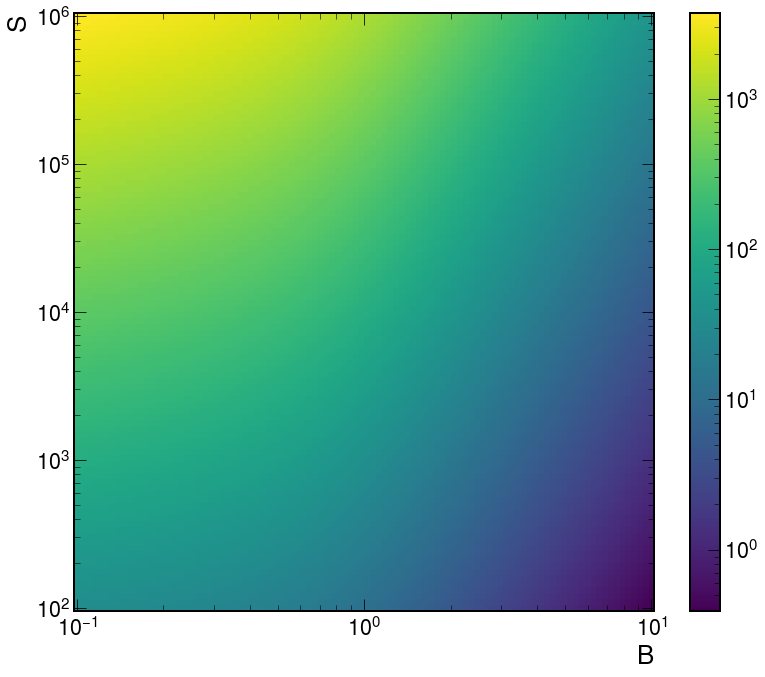

In [268]:
fig, ax = plt.subplots(figsize=(13, 11))
p = ax.pcolormesh(X, Y, sig, norm=matplotlib.colors.LogNorm())
fig.colorbar(p, ax=ax)
plt.xscale('log')
plt.xlabel('B')
plt.yscale('log')
plt.ylabel('S')

In [28]:
processes = [
    'VV_2018',
    'TTJets_2018',
    'DY_NLO_all_2018',
    'QCD_Pt_MuEnriched_2018',
]
signal = [
    'SUEP-m400-darkPhoHad_2018',
    'SUEP-m1000-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
]

for p in processes:
    print(p)
    vals_tot = plots[p]['nBtagJets_medium'][::sum, ::sum]
    vals_cut = plots[p]['nBtagJets_medium'][:2j:sum, ::sum]
    print(f"\tyield tot: {vals_tot.value:.3f} ± {np.sqrt(vals_tot.variance):.3f}")
#     print(f"yield cut: {vals_cut.value:.3f} ± {np.sqrt(vals_cut.variance):.3f}")
#     hep.hist2dplot(
#         plots[p]['nBtagJets_medium'][::1j,::1j],
#         norm=matplotlib.colors.LogNorm(),
#     )
#     plt.show()

for s in signal:
    print(s)
    vals_tot = plots[s]['nBtagJets_medium'][::sum, ::sum]
    vals_cut = plots[s]['nBtagJets_medium'][:2j:sum, ::sum]
    print(f"\tyield tot: {vals_tot.value:.3f} ± {np.sqrt(vals_tot.variance):.3f}")
#     print(f"yield cut: {vals_cut.value:.3f} ± {np.sqrt(vals_cut.variance):.3f}")
#     hep.hist2dplot(
#         plots[s]['nBtagJets_medium'][::1j,::1j],
#     )
#     plt.show()

VV_2018
	yield tot: 0.465 ± 0.133
TTJets_2018
	yield tot: 1.243 ± 1.708
DY_NLO_all_2018
	yield tot: 0.000 ± 0.000
QCD_Pt_MuEnriched_2018
	yield tot: 0.000 ± 0.000
SUEP-m400-darkPhoHad_2018
	yield tot: 4688.014 ± 284.253
SUEP-m1000-darkPhoHad_2018
	yield tot: 1766.637 ± 42.178
SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018
	yield tot: 20214.706 ± 2232.341
SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018
	yield tot: 21381.906 ± 2319.193
SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018
	yield tot: 9614.311 ± 1539.522
SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018
	yield tot: 12079.519 ± 1725.646
SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018
	yield tot: 5916.499 ± 1207.700


## Section with histograms for fitting

Will plot:
  - lead_interiso_vs_av_muon_pt
  
both as stacked & non-stacked plots.

## Show post-cut plots

Plotting:  ('lead_interiso_vs_av_muon_pt', 'nMuon')


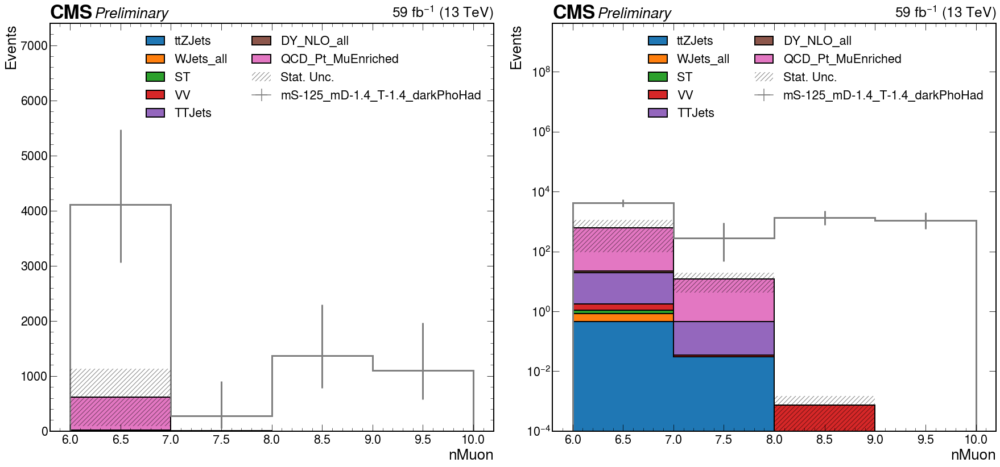

Plotting:  ('lead_interiso_64', 'lead_interiso')


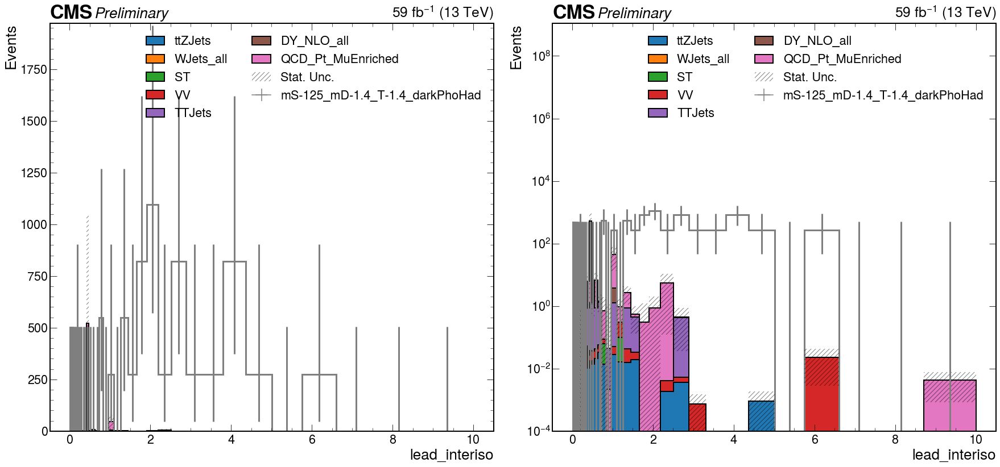

Plotting:  ('Muon_miniPFRelIso_all_max', 'Muon_miniPFRelIso_all_max')


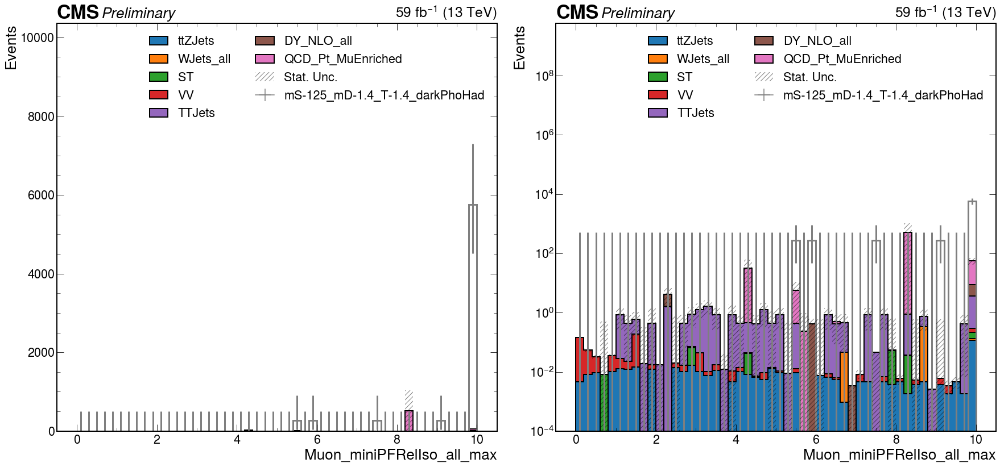

In [51]:
processes = [
    #'VVV_2018',
    'ttZJets_2018',
    'WJets_all_2018',
    'ST_2018',
    'VV_2018',
    'TTJets_2018',
    'DY_NLO_all_2018',
    'QCD_Pt_MuEnriched_2018',
]
signals = [
    #'SUEP-m125-darkPho_2018',
    #'SUEP-m125-darkPhoHad_2018',
    #'SUEP-m400-darkPhoHad_2018',
    #'SUEP-m1000-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.35_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-0.7_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-1.4_temp-1.4_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-2_temp-0.5_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-2_temp-2_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-2_temp-4_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-4_temp-1_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-4_temp-4_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-8_temp-2_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018',
    #'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
]
int_lumi = 59

plot_set = [
    #[
    #    ('lead_interiso_vs_av_muon_pt','lead_interiso'),
    #    {
    #        'xlog': True,
    #        'cut': (slice(None), slice(None, None, sum), slice(None, None, sum), slice(6j, None, sum)),
    #        #'slc': slice(1j, 10j)
    #    }
    #],
    #[
    #    ('lead_interiso_vs_av_muon_pt','av_muon_pt'),
    #    {
    #        'xlog': True,
    #        'cut': (slice(None, None, sum), slice(None), slice(None, None, sum), slice(6j, None, sum)),
    #    }
    #],
    [
        ('lead_interiso_vs_av_muon_pt','nMuon'),
        {
            'cut': (slice(None, None, sum), slice(None, None, sum), slice(None, None, sum), slice(None)),
        }
    ],
    #[('lead_interiso_4','lead_interiso'), {'xlog': True}],
    #[('lead_interiso_8','lead_interiso'), {'xlog': True}],
    #[('lead_interiso_16','lead_interiso'), {'xlog': True}],
    #[('lead_interiso_32','lead_interiso'), {'xlog': True}],
    [('lead_interiso_64','lead_interiso'), {'xlog': False}],
    [('Muon_miniPFRelIso_all_max','Muon_miniPFRelIso_all_max'), {'xlog': False}],
    #[('Muon_miniPFRelIso_all','Muon_miniPFRelIso_all'), {'xlog': False}],
    #[('Muon_jetPtRelv2','Muon_jetPtRelv2'), {'xlog': True}],
    #[('Muon_jetRelIso','Muon_jetRelIso'), {'xlog': True}],
    #[('Muon_Jet_btagDeepFlavB','Muon_Jet_btagDeepFlavB'), {'xlog': False}],
    #[('nBtagJets_loose','nBtagJets_loose'), {}],
    #[('nBtagJets_medium','nBtagJets_medium'), {}],
    #[('nBtagJets_tight','nBtagJets_tight'), {}],
]


for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    # Stack with ratio for processes
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(25, 12))
    plot_utils_extras.plot_stack(
        plots=plots, 
        bkg_list=processes, 
        sig_list=signals,
        label=plot_i[0],
        ylog=False,
        override_slice=False,
        fig=fig,
        ax=ax[0],
        int_lumi=int_lumi,
        #ylim= (0, 1e5),
        **plot_i[1]
    )
    plot_utils_extras.plot_stack(
        plots=plots, 
        bkg_list=processes, 
        sig_list=signals,
        label=plot_i[0],
        ylog=True,
        override_slice=False,
        fig=fig,
        ax=ax[1],
        int_lumi=int_lumi,
        #ylim= (1e-4, 1e8),
        **plot_i[1]
    )
    plt.tight_layout()
    plt.show()

    # Overlay for processes
#     fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(22, 11))
#     plot_utils_extras.plot_overlay(
#         plots=plots, 
#         bkg_list=processes, 
#         label=plot_i[0], 
#         override_slice=True,
#         fig=fig,
#         ax=ax[0],
#         per_muon=True,
#         int_lumi=int_lumi,
#         **plot_i[1]
#     )
#     plot_utils_extras.plot_overlay(
#         plots=plots, 
#         bkg_list=processes, 
#         label=plot_i[0], 
#         override_slice=True,
#         fig=fig,
#         ax=ax[1],
#         ylog=True,
#         per_muon=True,
#         int_lumi=int_lumi,
#         **plot_i[1]
#     )
#     plt.tight_layout()
#     plt.show()

## 2D plots per process

VVV_2018
yield tot: 0.027 ± 0.003
yield cut: 0.000 ± 0.000


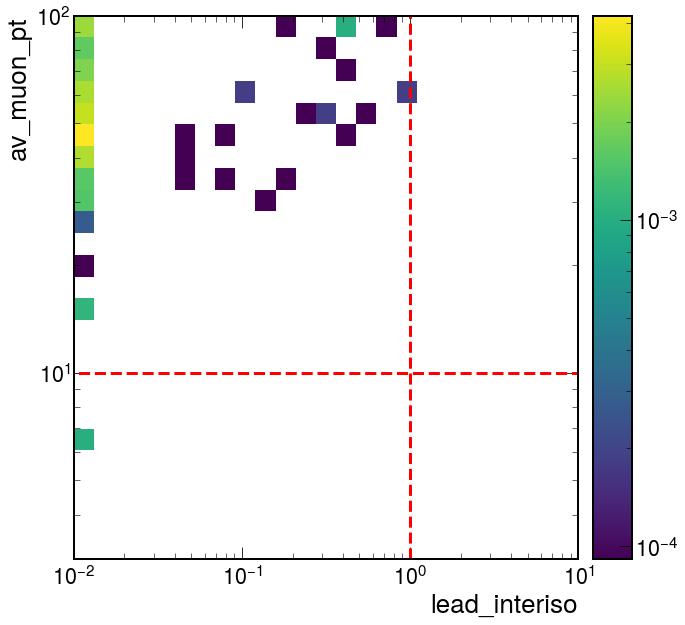

ttZJets_2018
yield tot: 0.478 ± 0.021
yield cut: 0.000 ± 0.000


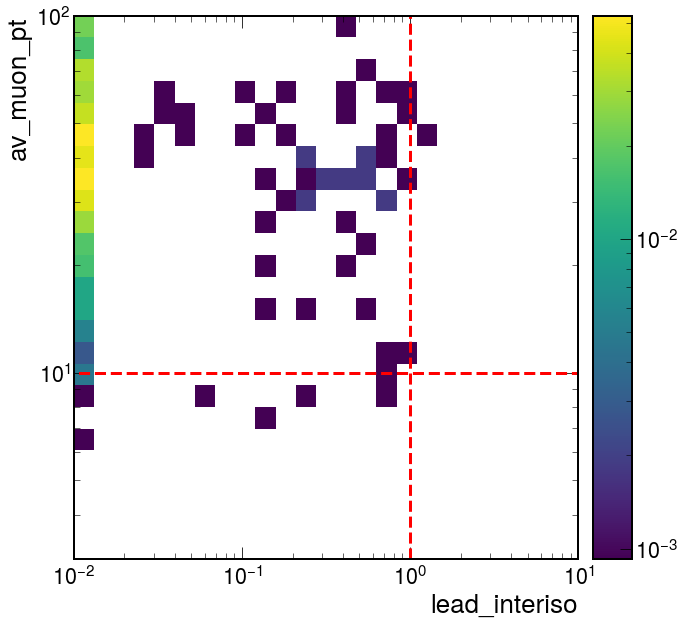

WJets_all_2018
yield tot: 0.395 ± 0.334
yield cut: 0.000 ± 0.000


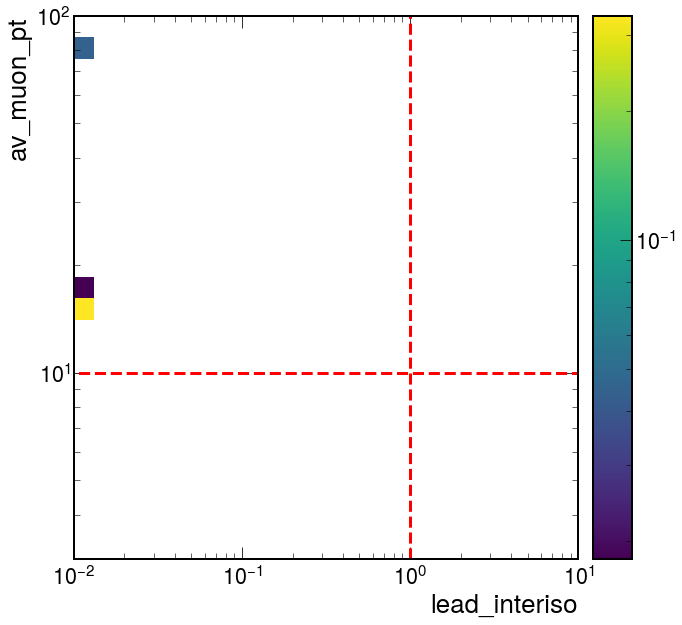

ST_2018
yield tot: 0.240 ± 0.139
yield cut: 0.034 ± 0.034


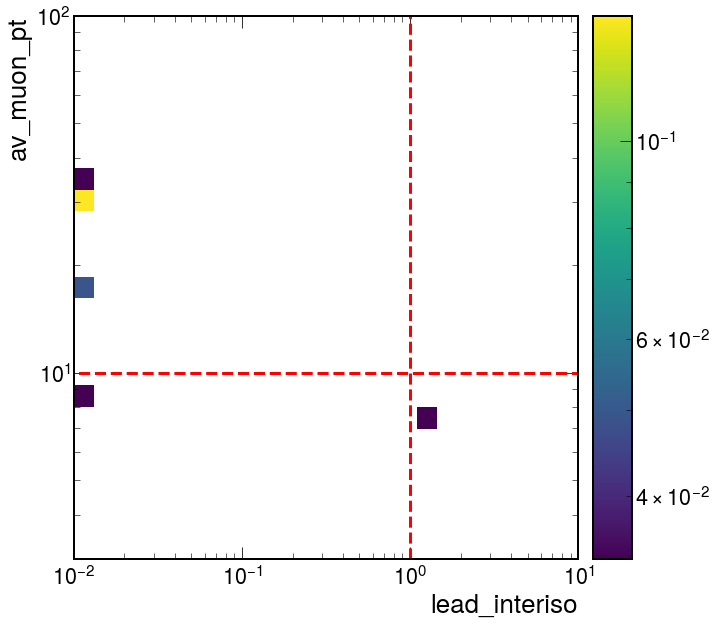

VV_2018
yield tot: 0.662 ± 0.137
yield cut: 0.000 ± 0.000


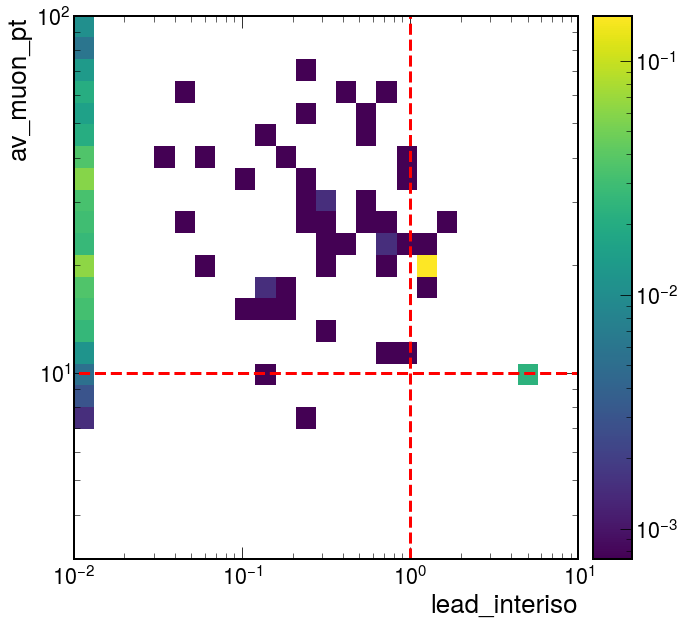

TTJets_2018
yield tot: 18.228 ± 5.006
yield cut: 0.000 ± 0.000


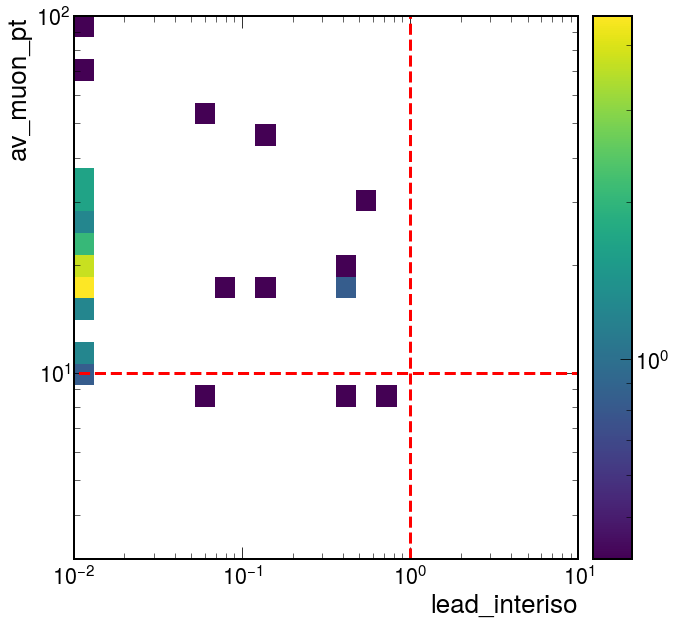

DY_NLO_all_2018
yield tot: 2.519 ± 5.633
yield cut: 0.000 ± 0.000


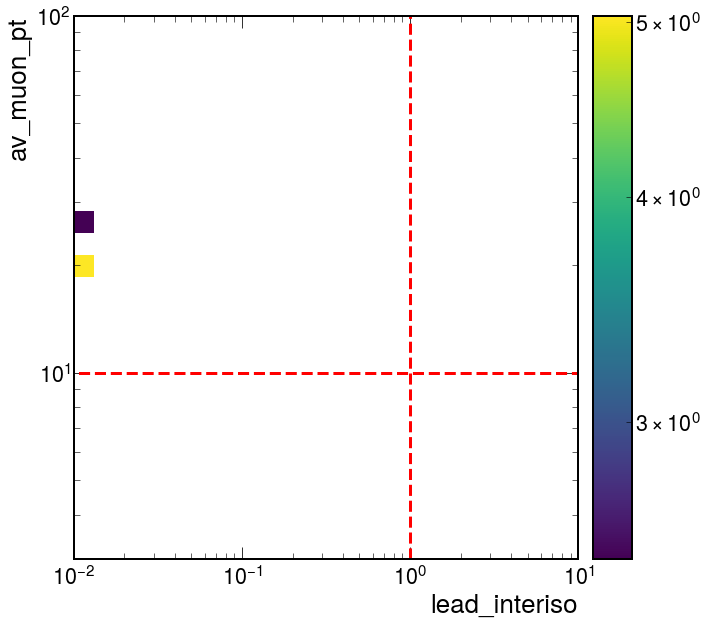

QCD_Pt_MuEnriched_2018
yield tot: 604.434 ± 521.272
yield cut: 31.730 ± 30.535


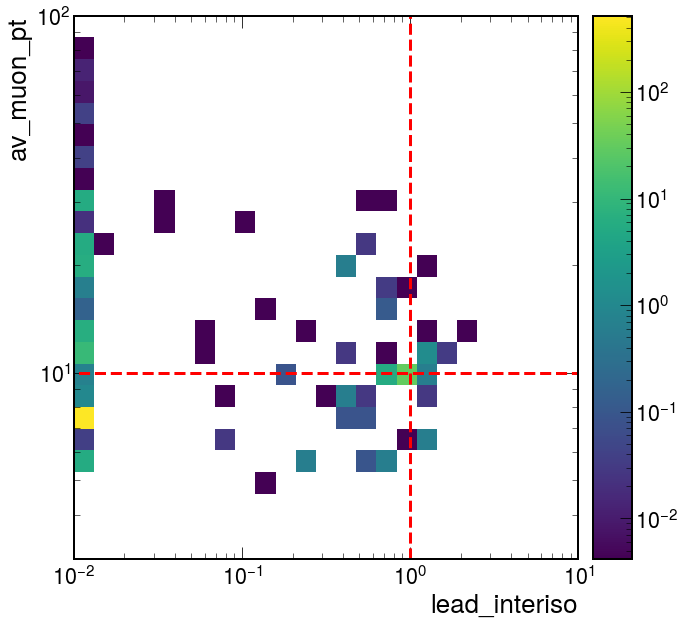

SUEP-m125-darkPho_2018
yield tot: 241024.101 ± 7742.819
yield cut: 186050.593 ± 6802.692


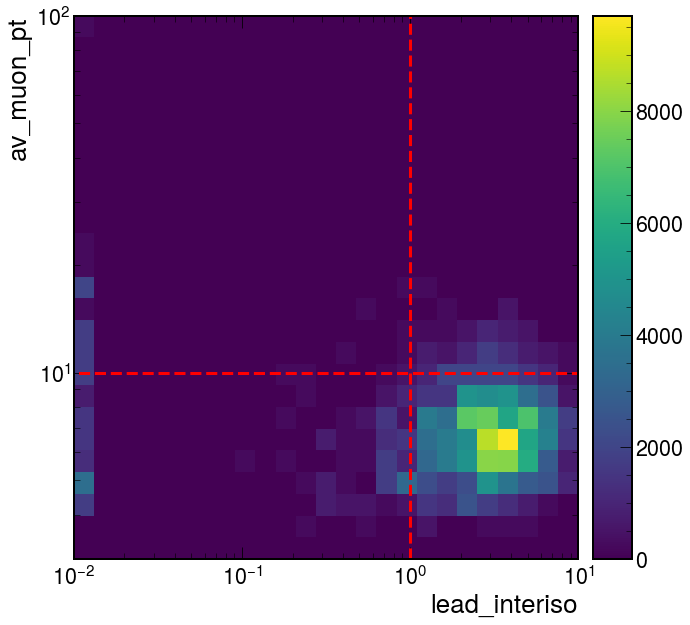

SUEP-m125-darkPhoHad_2018
yield tot: 23634.371 ± 2450.771
yield cut: 10418.033 ± 1627.025


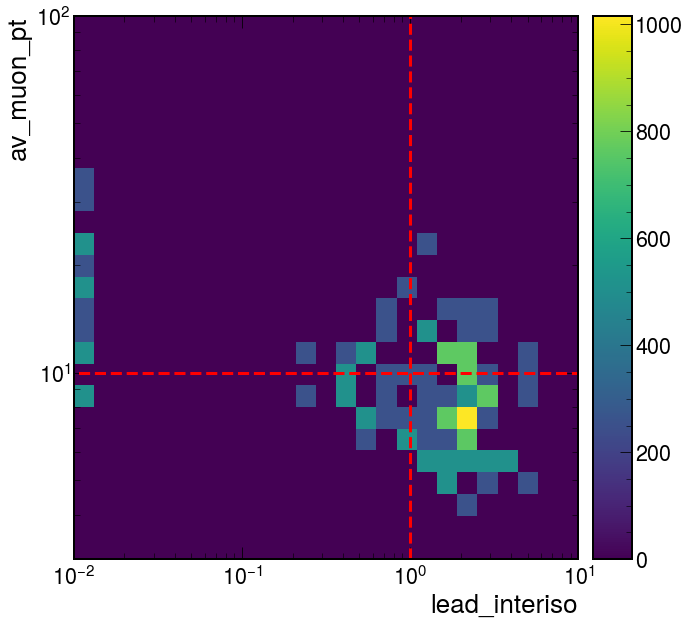

SUEP-m400-darkPho_2018
yield tot: 104571.863 ± 1349.231
yield cut: 80878.823 ± 1186.576


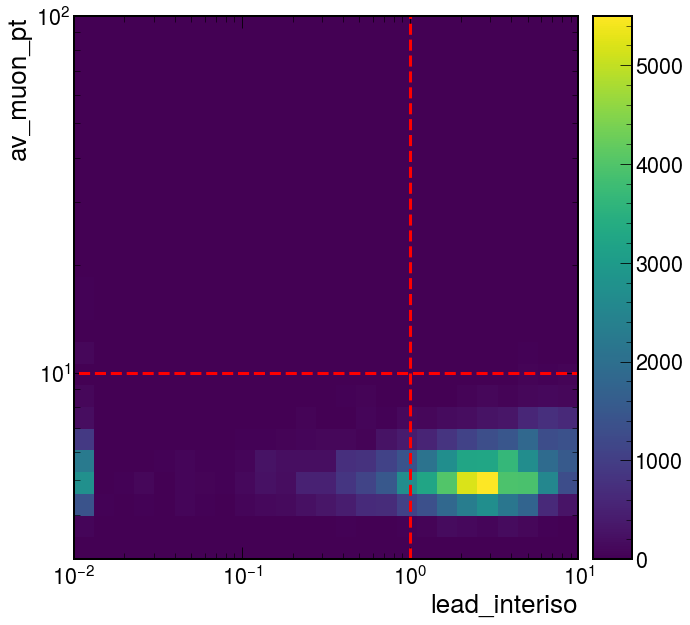

SUEP-m400-darkPhoHad_2018
yield tot: 11943.421 ± 453.693
yield cut: 8151.711 ± 374.816


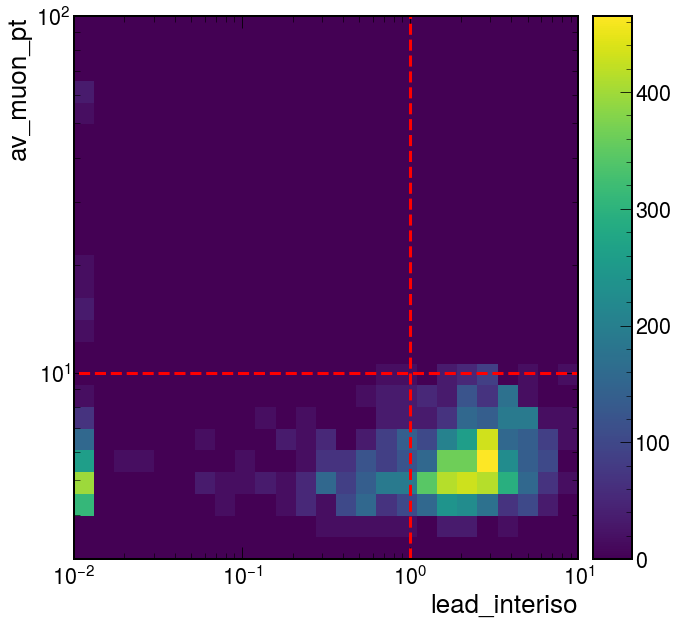

SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018
yield tot: 532238.407 ± 11454.599
yield cut: 151117.250 ± 6103.568


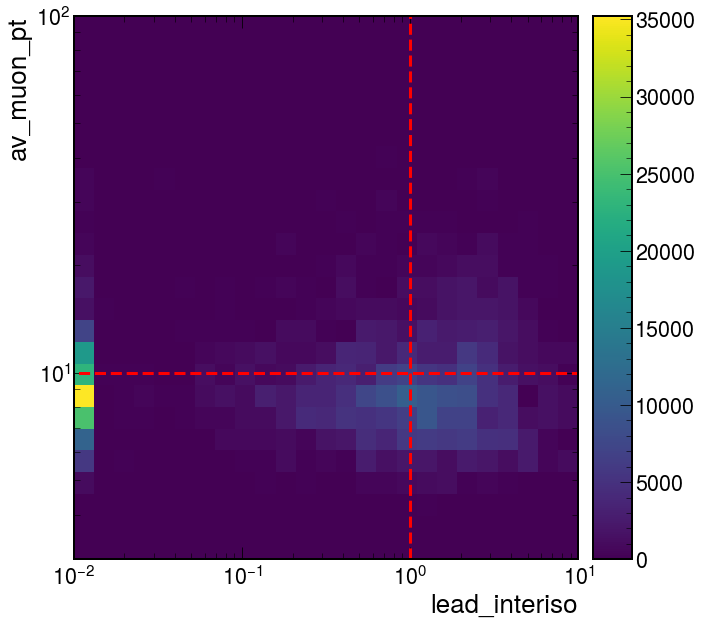

SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018
yield tot: 39196.807 ± 3108.509
yield cut: 9121.270 ± 1499.527


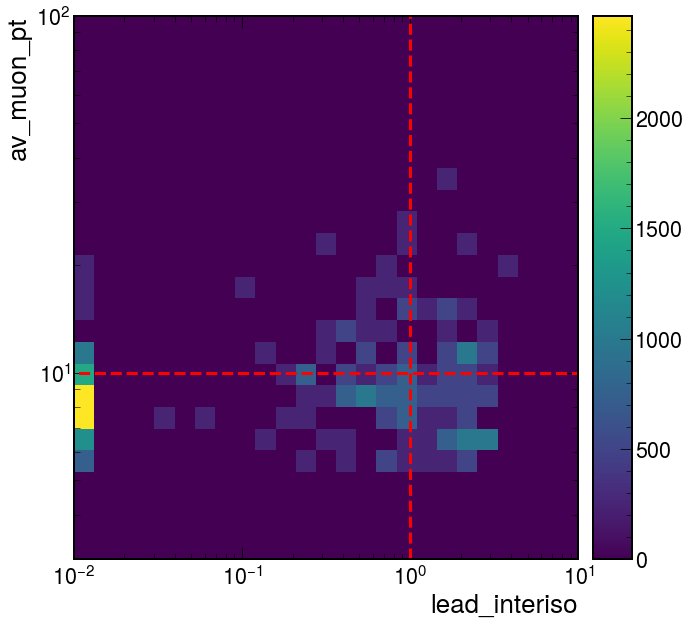

SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018
yield tot: 510298.056 ± 11216.019
yield cut: 131888.628 ± 5702.043


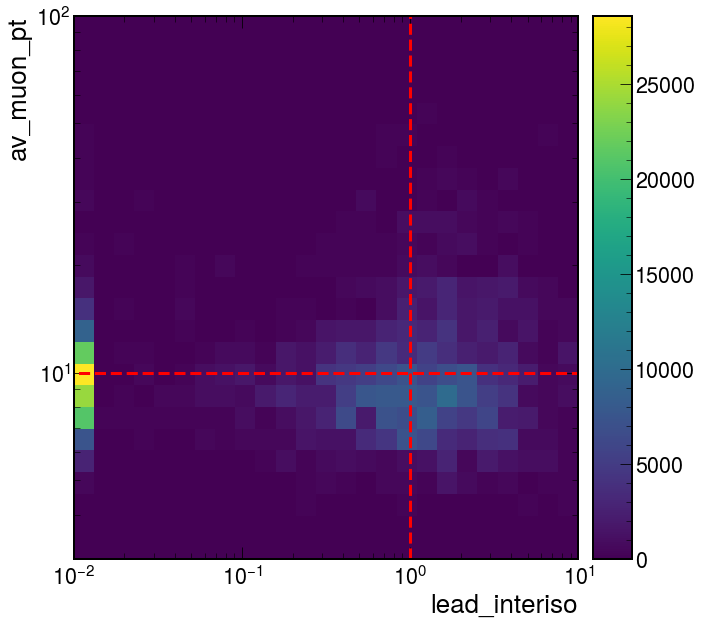

SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018
yield tot: 27167.598 ± 2614.203
yield cut: 6288.796 ± 1257.759


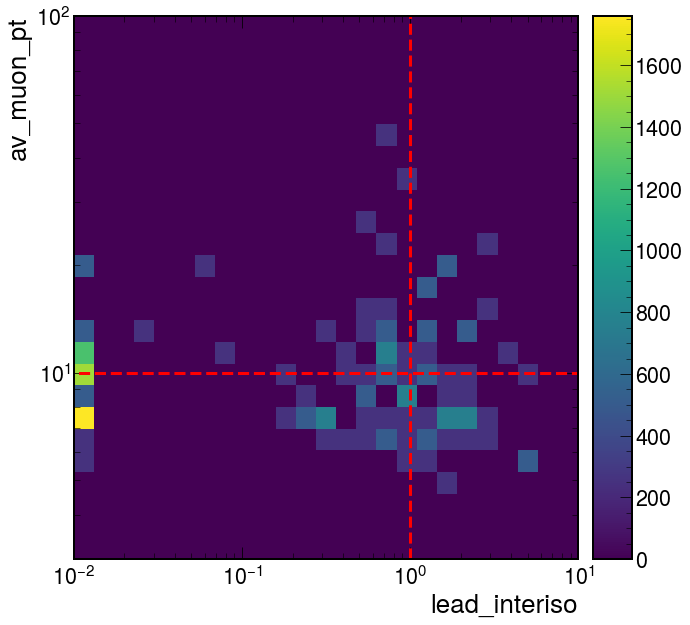

SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018
yield tot: 266896.499 ± 8193.797
yield cut: 21381.906 ± 2319.193


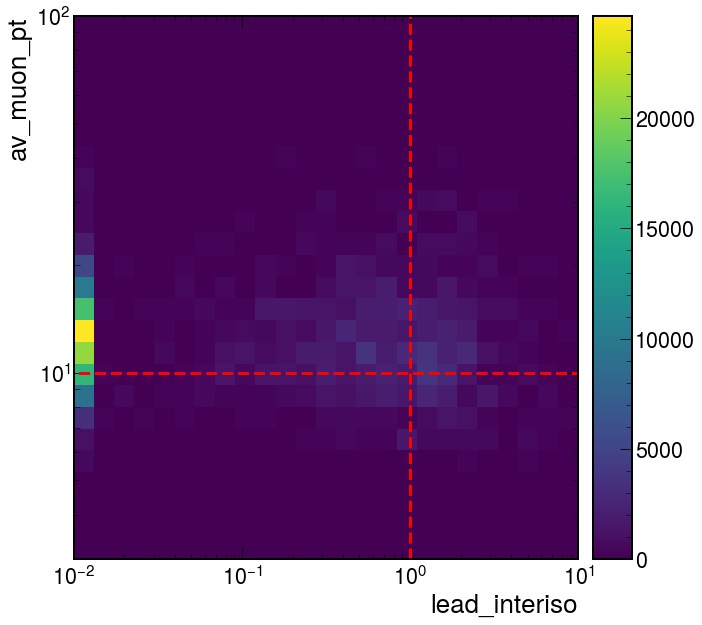

SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018
yield tot: 12819.082 ± 1777.687
yield cut: 1725.646 ± 652.233


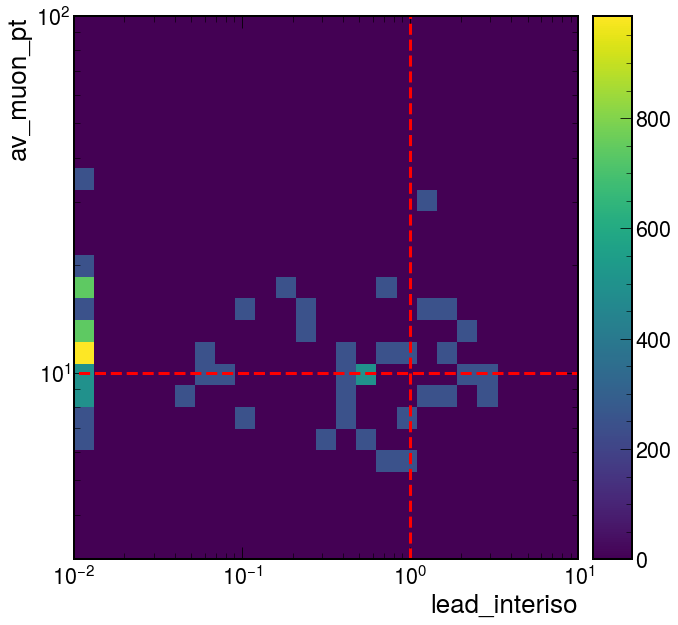

SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018
yield tot: 264129.429 ± 8151.211
yield cut: 28173.806 ± 2662.174


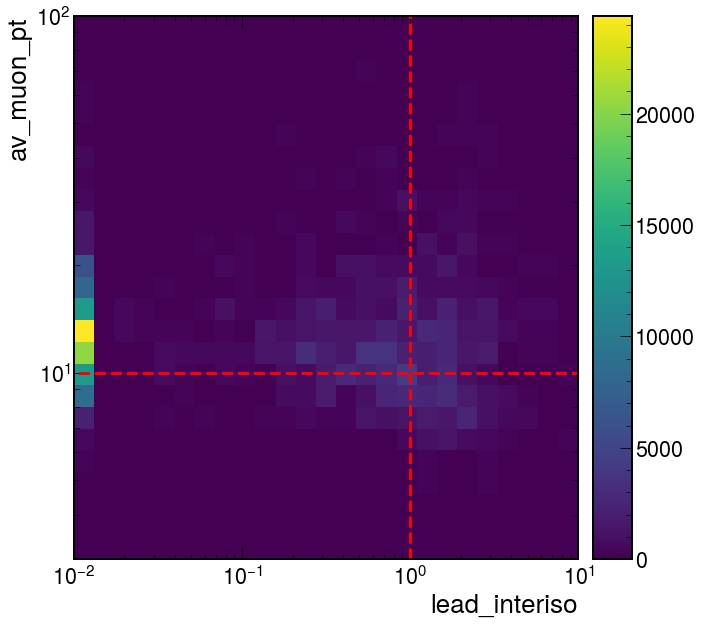

SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018
yield tot: 13805.165 ± 1844.793
yield cut: 1479.125 ± 603.850


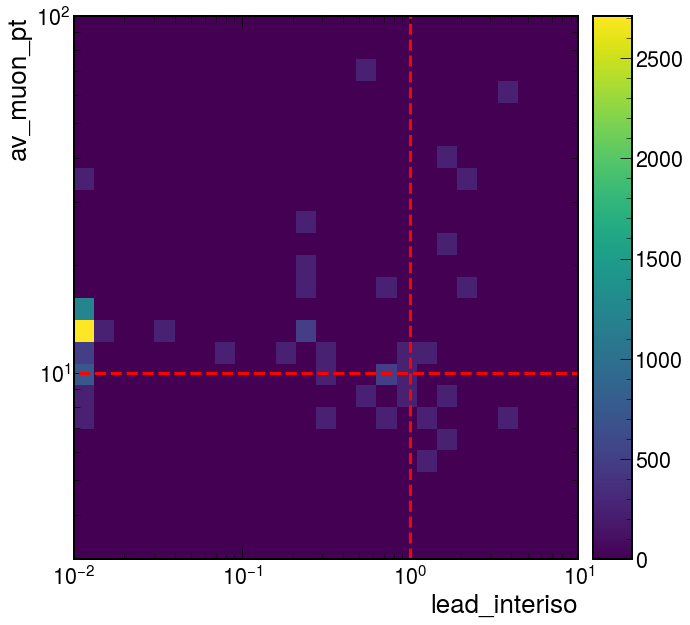

SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018
yield tot: 125775.918 ± 5624.870
yield cut: 1509.311 ± 616.174


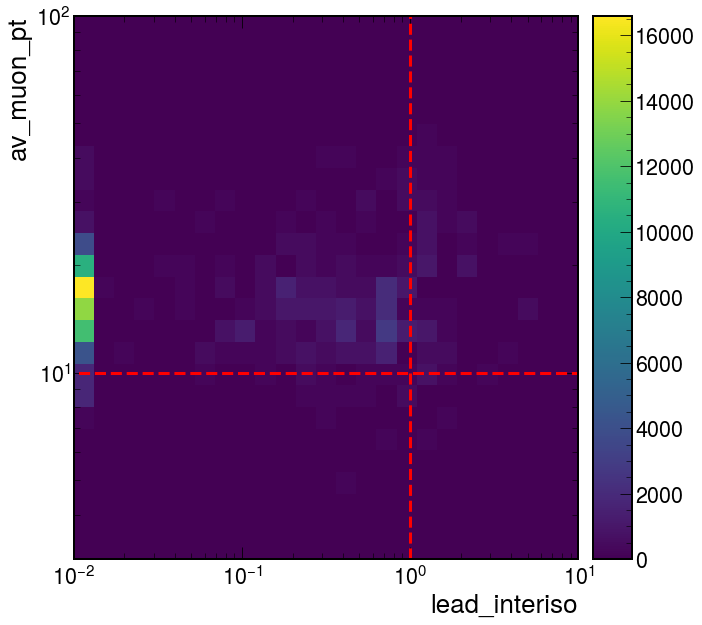

SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018
yield tot: 6409.541 ± 1257.014
yield cut: 246.521 ± 246.521


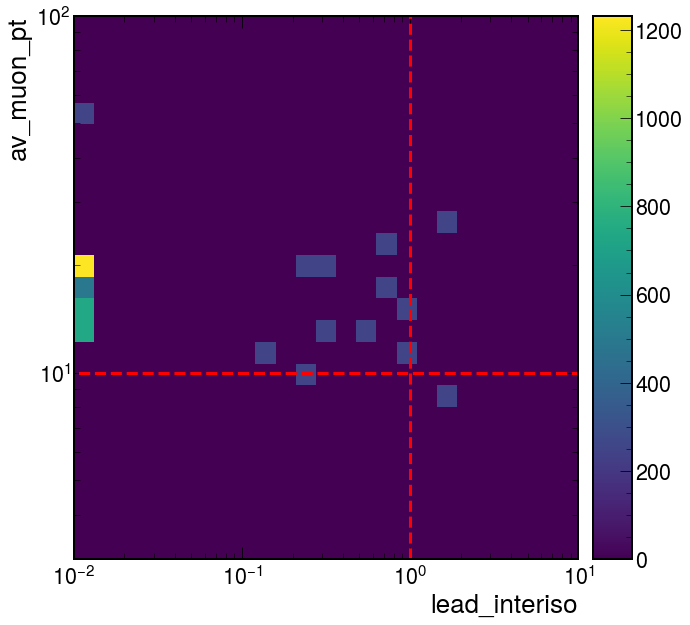

In [39]:
processes = [
    'VVV_2018',
    'ttZJets_2018',
    'WJets_all_2018',
    'ST_2018',
    'VV_2018',
    'TTJets_2018',
    'DY_NLO_all_2018',
    'QCD_Pt_MuEnriched_2018',
]
signal = [
    'SUEP-m125-darkPho_2018',
    'SUEP-m125-darkPhoHad_2018',
    'SUEP-m400-darkPho_2018',
    'SUEP-m400-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-2_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-8_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-4_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-16_decay-darkPhoHad_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPho_2018',
    'SUEP_ggH-channel_mMed-125_mDark-8_temp-32_decay-darkPhoHad_2018',
]

for p in processes:
    print(p)
    vals_tot = plots[p]['lead_interiso_ele_vs_av_muon_pt'][::sum, ::sum, ::sum, ::sum]
    vals_cut = plots[p]['lead_interiso_ele_vs_av_muon_pt'][1j:10j:sum, 3j:10j:sum, ::sum, ::sum]
    print(f"yield tot: {vals_tot.value:.3f} ± {np.sqrt(vals_tot.variance):.3f}")
    print(f"yield cut: {vals_cut.value:.3f} ± {np.sqrt(vals_cut.variance):.3f}")
    hep.hist2dplot(
        plots[p]['lead_interiso_ele_vs_av_muon_pt'][::2j,::2j,::sum,::sum],
        norm=matplotlib.colors.LogNorm(),
    )
    plt.plot([1e-3, 10], [10, 10], c='r', lw=3, ls='--')
    plt.plot([1, 1], [3, 500], c='r', lw=3, ls='--')
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

for s in signal:
    print(s)
    vals_tot = plots[s]['lead_interiso_ele_vs_av_muon_pt'][::sum, ::sum, ::sum, ::sum]
    vals_cut = plots[s]['lead_interiso_ele_vs_av_muon_pt'][1j:10j:sum, 3j:10j:sum, ::sum, ::sum]
    print(f"yield tot: {vals_tot.value:.3f} ± {np.sqrt(vals_tot.variance):.3f}")
    print(f"yield cut: {vals_cut.value:.3f} ± {np.sqrt(vals_cut.variance):.3f}")
    hep.hist2dplot(
        plots[s]['lead_interiso_ele_vs_av_muon_pt'][::2j,::2j,::sum,::sum],
    )
    plt.plot([1e-3, 10], [10, 10], c='r', lw=3, ls='--')
    plt.plot([1, 1], [3, 500], c='r', lw=3, ls='--')
    plt.xscale('log')
    plt.yscale('log')
    plt.show()